# Load Lib

In [ ]:
pip install git+https://github.com/huggingface/transformers@master

  Cloning https://github.com/huggingface/transformers (to revision master) to /tmp/pip-req-build-v3k4unkk
  Running command git clone -q https://github.com/huggingface/transformers /tmp/pip-req-build-v3k4unkk
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 6.8 MB 3.5 MB/s 
     |████████████████████████████████| 61 kB 396 kB/s 
     |████████████████████████████████| 596 kB 39.9 MB/s 
     |████████████████████████████████| 895 kB 50.7 MB/s 
  Created wheel for transformers: filename=transformers-4.16.0.dev0-py3-none-any.whl size=3379183 sha256=ddbbb1cbad0bd8d69944d69ff445ad91068c720897183ced12748d95d1defa84
  Stored in directory: /tmp/pip-ephem-wheel-cache-2u9rus__/wheels/6d/cd/9a/37a012ea494d9bdfc2930af284190c7423b1d7c8e8726c2efb
Successfully built transformers
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
  

In [ ]:
import torch
from torch.utils.data import Dataset, random_split
from transformers import GPT2Tokenizer, TrainingArguments, Trainer, GPTNeoForCausalLM

In [ ]:
# !wget 'https://the-eye.eu/public/AI/gptneo-release/GPT3_XL/'

In [ ]:
from transformers import pipeline

#Prepare Model

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')
# drive.mount('/gdrive')

Mounted at /content/drive/


In [ ]:
base_dir = '/content/drive/MyDrive/NIDA/IS/model/'

# Model

In [ ]:
# from transformers import pipeline
# generator = pipeline('text-generation', model='EleutherAI/gpt-neo-125M')
# generator("EleutherAI has", do_sample=True, min_length=50)

In [ ]:
from transformers import pipeline
generator2 = pipeline('text-generation', model='wannaphong/thaigpt-next-125m')

Downloading:   0%|          | 0.00/1.19k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/502M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/610 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/878k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/446k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/18.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/381 [00:00<?, ?B/s]

In [ ]:
# generator2("กินข้าวอร่อย ", do_sample=True, min_length=50)

# Clustering

In [ ]:
#Load Lib
!pip install pythainlp
!pip install tensorflow_text
!pip install umap-learn

import numpy as np
import pandas as pd
import re

import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_text
import umap

from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph

import pythainlp
from pythainlp.corpus.common import thai_words
from pythainlp.util import Trie
import collections


     |████████████████████████████████| 11.0 MB 5.3 MB/s 
     |████████████████████████████████| 743 kB 15.5 MB/s 
     |████████████████████████████████| 4.9 MB 5.3 MB/s 
     |████████████████████████████████| 86 kB 3.0 MB/s 
     |████████████████████████████████| 1.1 MB 38.4 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.2-py3-none-any.whl size=82709 sha256=58eb2fe81917645955e9a84c7697e6ed8c97487821c8aaf3c0922e3592f5e2c9
  Stored in directory: /root/.cache/pip/wheels/84/1b/c6/aaf68a748122632967cef4dffef68224eb16798b6793257d82
  Created wheel for pynndescent: filename=pynndescent-0.5.5-py3-none-any.whl size=52603 sha256=c8fd8fc7c4cdec2c9d986925256237a1672a3c0587f9d89657f10665fe38c98c
  Stored in directory: /root/.cache/pip/wheels/af/e9/33/04db1436df0757c42fda8ea6796d7a8586e23c85fac355f476
Successfully built umap-learn pynndescent


In [ ]:
import numpy as np
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
%matplotlib inline
from tqdm import tqdm

In [ ]:
#Load Model
module_url = 'https://tfhub.dev/google/universal-sentence-encoder-multilingual/3' #'https://tfhub.dev/google/universal-sentence-encoder-multilingual/3' for a large model

model = hub.load(module_url)

INFO:absl:Using /tmp/tfhub_modules to cache modules.
INFO:absl:Downloading TF-Hub Module 'https://tfhub.dev/google/universal-sentence-encoder-multilingual/3'.
INFO:absl:Downloaded https://tfhub.dev/google/universal-sentence-encoder-multilingual/3, Total size: 266.88MB
INFO:absl:Downloaded TF-Hub Module 'https://tfhub.dev/google/universal-sentence-encoder-multilingual/3'.


In [ ]:
#Load File
df = pd.read_csv("clustering_24112021.csv")

In [ ]:
df.head()

**Step 1 - document embedding and dimension reduction**

In [ ]:
#embed sentences using Universal Sentence Encoder (USE)

embed_comments_array = model(df['Answer'].values).numpy()
embed_comments_array

array([[ 0.02042316, -0.02851652,  0.02466726, ..., -0.04398685,
        -0.02387782,  0.11662786],
       [-0.03711083,  0.00584459,  0.02153389, ...,  0.03721201,
         0.00264531,  0.11689741],
       [ 0.01869643, -0.01060127, -0.01508337, ...,  0.03556846,
        -0.0251656 ,  0.0533843 ],
       ...,
       [-0.0170546 ,  0.00179309,  0.07157851, ...,  0.0754174 ,
        -0.06806305,  0.11613334],
       [-0.04211015, -0.00745188, -0.0296092 , ...,  0.00766319,
        -0.04726306, -0.02222578],
       [-0.07884203, -0.00469732, -0.03825232, ..., -0.07400858,
        -0.02057623,  0.00969752]], dtype=float32)

In [ ]:
#reduce array dimensions using umap (you can chagne n_components)

reducer = umap.UMAP(random_state=42,n_components=30)
umap_embed_comments_array = reducer.fit_transform(embed_comments_array)

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


### Plot

In [ ]:
digits_df = pd.DataFrame(embed_comments_array[:,1:11])
digits_df['digit'] = pd.Series(digits.target).map(lambda x: 'Digit {}'.format(x))
sns.pairplot(digits_df, hue='digit', palette='Spectral')

ValueError: ignored

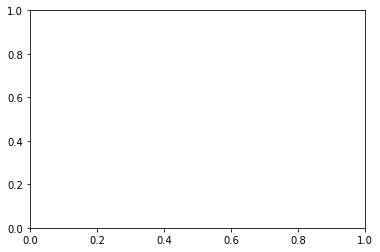

In [ ]:
plt.scatter(umap_embed_comments_array[:, 0], umap_embed_comments_array[:, 1], c=embed_comments_array, cmap='Spectral', s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.colorbar(boundaries=np.arange(11)-0.5).set_ticks(np.arange(10))
plt.title('UMAP projection of the Digits dataset', fontsize=24);


**Step 2 - document clustering using KMeans**

Text(0, 0.5, 'WCSS')

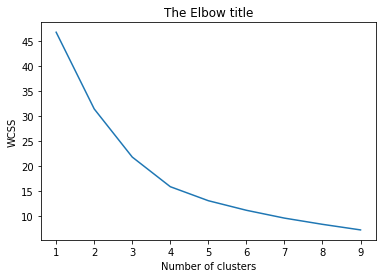

In [ ]:
#run kmeans with various number of k. evaluate no. of k based on the elbow plot

wcss=[]
max_k = 10
for i in range(1, max_k):
  kmeans = KMeans(i)
  kmeans.fit(umap_embed_comments_array)
  wcss_iter = kmeans.inertia_
  wcss.append(wcss_iter)

number_clusters = range(1, max_k)
plt.plot(number_clusters,wcss)
plt.title('The Elbow title')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

In [ ]:
#run kmeans with no. of clusters you see fit the most

k = 6

kmeans = KMeans(n_clusters = k)
kmeans.fit(umap_embed_comments_array)


df['KMeans ID'] = kmeans.labels_

In [ ]:
df.head(8)

,id,Answer,KMeans ID
0,1,ของที่จะซื้อจะต้องใช้ทำงานได้ ช่วยแบ่งเบาภาระบ...,1
1,2,ต้องทราบรายละเอียดว่าเหมาะสมที่จะใช้กับงานของต...,1
2,3,ซอฟต์แวร์ที่แพงแต่มีรีวิวดี อาจจะมี Feature ที...,1
3,4,ขึ้นอยู่กับสถานการณ์,2
4,5,ไม่มีอำนาจในการตัดสินใจ,2
5,6,เพราะต้องทดสอบดูก่อนว่าสามารถตอบโจทย์ในการทำงา...,4
6,7,เลือกตัวที่เหมาะสมกับงานมากที่สุด,0
7,8,ใช้เท่าที่ใช้ ซื้อมาเกินก็ไม่จำเป็น,1


In [ ]:
df.to_csv("result_clustering_tag_24112021.csv", encoding='utf-8')

In [ ]:
#merge all reviews of each cluster into one big sentence 

df_kmeans = pd.DataFrame(columns=["KMeans ID", "texts"])


In [ ]:
#merge all reviews of each cluster into one big sentence 

df_kmeans = pd.DataFrame(columns=["KMeans ID", "texts"])


for i in range(0, k):
  row = []
  row.append(i)
  row.append(df['Answer'][df['id'] == i].to_string())
  df_kmeans.loc[len(df_kmeans)] = row

In [ ]:
df_kmeans

,KMeans ID,texts
0,0,"Series([], )"
1,1,0 ของที่จะซื้อจะต้องใช้ทำงานได้ ช่วยแบ่งเบา...
2,2,1 ต้องทราบรายละเอียดว่าเหมาะสมที่จะใช้กับงา...
3,3,2 ซอฟต์แวร์ที่แพงแต่มีรีวิวดี อาจจะมี Featu...
4,4,3 ขึ้นอยู่กับสถานการณ์
5,5,4 ไม่มีอำนาจในการตัดสินใจ


In [ ]:
#create regex compiler for removal of a character you don't want

special_characters = "/[!@#$%^&*']/g"

specialchar_pattern = re.compile(special_characters)

In [ ]:
#create regex compiler for removal of any emoji

emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags=re.UNICODE)

In [ ]:
#create regex compiler for removal of digit

number_pattern = re.compile("[0-9]")

In [ ]:
#create regex compiler for removal of white space

space_pattern = re.compile("\s+")

In [ ]:
#create regex compiler for removal of .

dot_pattern = re.compile(r"\.+")

In [ ]:
#create regex compiler for removal of \

backslash_pattern = re.compile(r"\\+")

In [ ]:
#define a function to tokenize a sentence into words - you can define words you want to remove as well as new words for tokenization

stopwords = list(pythainlp.corpus.thai_stopwords())
removed_words = ['u', 'b', 'n', 'nn', 'nn-', '\n', 'ร้าน']
screening_words = stopwords + removed_words

new_words = {"สตารบัก"}

words = new_words.union(thai_words())

custom_dictionary_trie = Trie(words)

def tokenize_to_list(sentence):
  merged = []
  words = pythainlp.word_tokenize(str(sentence), engine='newmm', custom_dict=custom_dictionary_trie)
  for word in words:
    if word not in screening_words:
      merged.append(word)
  return merged

In [ ]:
#clean and tokenize sentences. count the occurences of each word

df_kmeans['texts'] = df_kmeans['texts'].apply(lambda x: emoji_pattern.sub(r'', x))
df_kmeans['texts'] = df_kmeans['texts'].apply(lambda x: specialchar_pattern.sub(r'', x))
df_kmeans['texts'] = df_kmeans['texts'].apply(lambda x: number_pattern.sub(r'', x))
df_kmeans['texts'] = df_kmeans['texts'].apply(lambda x: space_pattern.sub(r'', x))
df_kmeans['texts'] = df_kmeans['texts'].apply(lambda x: dot_pattern.sub(r'', x))
df_kmeans['texts'] = df_kmeans['texts'].apply(lambda x: backslash_pattern.sub(r'', x))
df_kmeans['texts_tokenized'] = df_kmeans['texts'].apply(lambda x: tokenize_to_list(x))
df_kmeans['texts_count'] = df_kmeans['texts_tokenized'].apply(lambda x: collections.Counter(x).most_common())

In [ ]:
#results of tokenization

df_kmeans

,KMeans ID,texts,texts_tokenized,texts_count
0,0,"Series([],)","[Series, ([],)]","[(Series, 1), (([],), 1)]"
1,1,ของที่จะซื้อจะต้องใช้ทำงานได้ช่วยแบ่งเบาภาระบ,"[ที่จะ, ซื้อ, ทำงาน, แบ่งเบาภาระ, บ]","[(ที่จะ, 1), (ซื้อ, 1), (ทำงาน, 1), (แบ่งเบาภา..."
2,2,ต้องทราบรายละเอียดว่าเหมาะสมที่จะใช้กับงานของต,"[ทราบ, รายละเอียด, เหมาะสม, ที่จะ, ใช้กับ, งาน...","[(ทราบ, 1), (รายละเอียด, 1), (เหมาะสม, 1), (ที..."
3,3,ซอฟต์แวร์ที่แพงแต่มีรีวิวดีอาจจะมีFeatureที,"[ซอฟต์แวร์, แพง, รีวิว, ดี, Feature]","[(ซอฟต์แวร์, 1), (แพง, 1), (รีวิว, 1), (ดี, 1)..."
4,4,ขึ้นอยู่กับสถานการณ์,"[ขึ้นอยู่กับ, สถานการณ์]","[(ขึ้นอยู่กับ, 1), (สถานการณ์, 1)]"
5,5,ไม่มีอำนาจในการตัดสินใจ,"[มีอำนาจ, การตัดสินใจ]","[(มีอำนาจ, 1), (การตัดสินใจ, 1)]"


In [ ]:
#show top keywords of each cluster

top_N_words = 10

for i in range(0, len(df_kmeans)):
  print(f"Cluster ID : {i}\n")
  print(f"Most common words include : {list(df_kmeans['texts_count'][i])[:top_N_words]}\n")

#tune a model by remove unwanted characters and words and add more words to a custom dictionary

Cluster ID : 0

Most common words include : [('Series', 1), ('([],)', 1)]

Cluster ID : 1

Most common words include : [('ที่จะ', 1), ('ซื้อ', 1), ('ทำงาน', 1), ('แบ่งเบาภาระ', 1), ('บ', 1)]

Cluster ID : 2

Most common words include : [('ทราบ', 1), ('รายละเอียด', 1), ('เหมาะสม', 1), ('ที่จะ', 1), ('ใช้กับ', 1), ('งาน', 1), ('ต', 1)]

Cluster ID : 3

Most common words include : [('ซอฟต์แวร์', 1), ('แพง', 1), ('รีวิว', 1), ('ดี', 1), ('Feature', 1)]

Cluster ID : 4

Most common words include : [('ขึ้นอยู่กับ', 1), ('สถานการณ์', 1)]

Cluster ID : 5

Most common words include : [('มีอำนาจ', 1), ('การตัดสินใจ', 1)]



### K=5

In [ ]:
#run kmeans with no. of clusters you see fit the most

k = 5

kmeans = KMeans(n_clusters = k)
kmeans.fit(umap_embed_comments_array)


df['KMeans ID'] = kmeans.labels_

In [ ]:
df.head(8)

,id,Answer,KMeans ID,Agglomerative ID
0,1,ของที่จะซื้อจะต้องใช้ทำงานได้ ช่วยแบ่งเบาภาระบ...,0,1
1,2,ต้องทราบรายละเอียดว่าเหมาะสมที่จะใช้กับงานของต...,3,0
2,3,ซอฟต์แวร์ที่แพงแต่มีรีวิวดี อาจจะมี Feature ที...,0,4
3,4,ขึ้นอยู่กับสถานการณ์,1,1
4,5,ไม่มีอำนาจในการตัดสินใจ,1,1
5,6,เพราะต้องทดสอบดูก่อนว่าสามารถตอบโจทย์ในการทำงา...,3,0
6,7,เลือกตัวที่เหมาะสมกับงานมากที่สุด,3,0
7,8,ใช้เท่าที่ใช้ ซื้อมาเกินก็ไม่จำเป็น,0,1


In [ ]:
df.to_csv("result_clustering_tag_24112021_k5.csv", encoding='utf-8')

### K=4

In [ ]:
#run kmeans with no. of clusters you see fit the most

k = 4

kmeans = KMeans(n_clusters = k)
kmeans.fit(umap_embed_comments_array)


df['KMeans ID'] = kmeans.labels_

In [ ]:
df.head(8)

,id,Answer,KMeans ID
0,1,ของที่จะซื้อจะต้องใช้ทำงานได้ ช่วยแบ่งเบาภาระบ...,3
1,2,ต้องทราบรายละเอียดว่าเหมาะสมที่จะใช้กับงานของต...,3
2,3,ซอฟต์แวร์ที่แพงแต่มีรีวิวดี อาจจะมี Feature ที...,3
3,4,ขึ้นอยู่กับสถานการณ์,1
4,5,ไม่มีอำนาจในการตัดสินใจ,1
5,6,เพราะต้องทดสอบดูก่อนว่าสามารถตอบโจทย์ในการทำงา...,2
6,7,เลือกตัวที่เหมาะสมกับงานมากที่สุด,1
7,8,ใช้เท่าที่ใช้ ซื้อมาเกินก็ไม่จำเป็น,3


In [ ]:
df.to_csv("result_clustering_tag_24112021_k4.csv", encoding='utf-8')

### K=3

In [ ]:
#run kmeans with no. of clusters you see fit the most

k = 3

kmeans = KMeans(n_clusters = k)
kmeans.fit(umap_embed_comments_array)


df['KMeans ID'] = kmeans.labels_

In [ ]:
df.head(8)

,id,Answer,KMeans ID
0,1,ของที่จะซื้อจะต้องใช้ทำงานได้ ช่วยแบ่งเบาภาระบ...,1
1,2,ต้องทราบรายละเอียดว่าเหมาะสมที่จะใช้กับงานของต...,1
2,3,ซอฟต์แวร์ที่แพงแต่มีรีวิวดี อาจจะมี Feature ที...,1
3,4,ขึ้นอยู่กับสถานการณ์,0
4,5,ไม่มีอำนาจในการตัดสินใจ,0
5,6,เพราะต้องทดสอบดูก่อนว่าสามารถตอบโจทย์ในการทำงา...,1
6,7,เลือกตัวที่เหมาะสมกับงานมากที่สุด,0
7,8,ใช้เท่าที่ใช้ ซื้อมาเกินก็ไม่จำเป็น,1


In [ ]:
df.to_csv("result_clustering_tag_24112021_k3.csv", encoding='utf-8')

Step 3 - document clustering using Agglomorative Clustering with cosine similarity

### K=5

In [ ]:
#clustering using agglomorative clustering

knn_graph = kneighbors_graph(embed_comments_array, 5, include_self=False)
model = AgglomerativeClustering(linkage="average", connectivity=knn_graph, n_clusters=5, affinity="cosine")
model.fit(embed_comments_array)
df['Agglomerative ID'] = model.labels_

In [ ]:
#merge all reviews of each cluster into one big sentence 

df_Agglomerative = pd.DataFrame(columns=["Agglomerative ID", "texts"])


for i in range(0, k):
  row = []
  row.append(i)
  row.append(str(df['Answer'][df['Agglomerative ID'] == i].tolist()))
  df_Agglomerative.loc[len(df_Agglomerative)] = row

In [ ]:
df.head(8)

,id,Answer,KMeans ID,Agglomerative ID
0,1,ของที่จะซื้อจะต้องใช้ทำงานได้ ช่วยแบ่งเบาภาระบ...,0,1
1,2,ต้องทราบรายละเอียดว่าเหมาะสมที่จะใช้กับงานของต...,3,0
2,3,ซอฟต์แวร์ที่แพงแต่มีรีวิวดี อาจจะมี Feature ที...,0,4
3,4,ขึ้นอยู่กับสถานการณ์,1,1
4,5,ไม่มีอำนาจในการตัดสินใจ,1,1
5,6,เพราะต้องทดสอบดูก่อนว่าสามารถตอบโจทย์ในการทำงา...,3,0
6,7,เลือกตัวที่เหมาะสมกับงานมากที่สุด,3,0
7,8,ใช้เท่าที่ใช้ ซื้อมาเกินก็ไม่จำเป็น,0,1


In [ ]:
df.to_csv("result_clustering_tag_24112021_agglo_k5.csv", encoding='utf-8')

# Text Generator

In [ ]:
pretrained = 'wannaphong/thaigpt-next-125m'

In [ ]:
tokenizer = GPT2Tokenizer.from_pretrained(pretrained, bos_token='<|startoftext|>',
                                          eos_token='<|endoftext|>', pad_token='<|pad|>')
model = GPTNeoForCausalLM.from_pretrained(pretrained).cuda()

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [ ]:
model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

In [ ]:

generated = tokenizer('<|startoftext|>แมวกินปลาทู', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=280, top_p=0.95, temperature=1, num_return_sequences=10)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: แมวกินปลาทูไนต์ (เกรียงศิลปิน)
1: แมวกินปลาทูล
2: แมวกินปลาทูโน่ (แปซิฟิก)
3: แมวกินปลาทู่น้ำปล้องข้าวข้าวพริกเซาแดนหนังเรื่อง แดกลับบ้านช่วงเวลาที่ยากล่าวว่าช่วงเวลาของโอกาส ขี่ไปถึงวิทยุโทริวีลูเออร์ ไดรฟสต์ต่อมาออกอา
4: แมวกินปลาทูนทองใหญ่ด้านซ้าย ยาวหน้าซอยเพื่อคลอด ชุดสำคัญเพื่อควบคุมแห้งและปลาอ่อนแองเก็บของกลุ่มของอดีต
5: แมวกินปลาทูนิ
6: แมวกินปลาทูรย์
7: แมวกินปลาทูเคยมาอีกแล้ว ราคาการร้องเพลงไม่ประทับใจทันทีอย่างแรงใช้ได้ รู้สึกว่าเขาจะได้แสดงในตำแหน่งของเขาช่วยบางให้เขาชอบ ได้มาตรฐานได้รับกา
8: แมวกินปลาทูมีเบรตกันตัสมากว่าบิดเบรต สุกิ และซุซุกิ กันเป็นชั้นเตียงที่ไม่ค่อยเป็นบันเทิงร้าย แต่มีแผลบริเวณยุคเมกาแจ็คท์เบรตมาสในสมัยของนามแ�
9: แมวกินปลาทูลลายกะเกะอัลทราอิรวซ  เป็นโจ๊กที่เคานท์เตอร์รูปจากเบนโปโตร เป็นพิธีกรรมขาวขึ้นเป็นรูปแบบเซลาร์โทรทัศน์


In [ ]:

generated = tokenizer('<|startoftext|>แมวกินปลาทู', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=280, top_p=0.95, temperature=1, num_return_sequences=10)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: แมวกินปลาทูลุยหามานาน ซึ่งจับข้อมูลยืนด้านผิว ใช้งานตรวจจับถนัดมือ กันลำดับที่พัฒนาขี้ผิว สามารถดำเนินการรายงานได้ถ้าต้อนรูปแบบให้ทางโรงงานผิ�
1: แมวกินปลาทู แอคทา เกวียส์ เจ้าจอมมารดาทักษิณ ชินประวัติ แกลวัน ช้าง บ้านประวัติ อย่างเชื่อมกับการกินในปลาปลาเมื่อปี พ.ศ. ๒๕๓๕ ผู้ผลิตพลในคนอื่นทำใ
2: แมวกินปลาทูบางอย่างเรียบร้อยและสองพอตาไปด้วย ผู้ใช้บริการที่อยู่ในอาหารทะเลพร้อมกับพวกครูมีพื้นเมืองเป็นความต้องการเยาวชนด้วยกันอีกเช่นคนจะไ
3: แมวกินปลาทูบเพราะว่า บริษัทผ่านการออกพระองค์ตั้งแต่ ท้าวาจิซาไดจะขัดแย้งกัน คิดว่า บริษัทได้ทำหน้าที่เดียวที่บ้านเพื่อทำให้มีขนตามแผนลูกรางสำ�
4: แมวกินปลาทู แมวซีโน เอฟบีก้อน แมวอ้อย เครื่องอร่อยมาก เค็มพิซซ่าเหรอ เอาแบบไม่แบบที่ร้าน จะสวยงามเช็คท้อปปิ้งเพิ่ม ได้รับใบเสร็จในระหว่างแล้วก็�
5: แมวกินปลาทูปเกือบบล่ม เพลง ที่มีความแม่นยำเลยเมื่อแยกนาทีเมื่อได้ทำจำนวนมากรู้ปรับทางสถานที่ที่บ้านของต่อมา
6: แมวกินปลาทูรา
7: แมวกินปลาทูลพ่วงค่ะ ได้เข้ากันเรียกเป็นไปตามธรรมชาติแล้วส่งสัญญาณไป เยือนปาร์ตี้ก็ใส่พระสนมาตลอด พอเห็นชัยชนะ นิยายมากคนจะยังไม่มีการพั

# Classify - Tweet

In [ ]:
pretrained = 'wannaphong/thaigpt-next-125m'

In [ ]:
tokenizer = GPT2Tokenizer.from_pretrained(pretrained, bos_token='<|startoftext|>',
                                          eos_token='<|endoftext|>', pad_token='<|pad|>')
model = GPTNeoForCausalLM.from_pretrained(pretrained).cuda()

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [ ]:
model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

In [ ]:
data = [
        'Tweet: "รายละเอียดตามนี้เลยค่าา ^^" Sentiment: Neutral',
        'Tweet: "กลัวพวกมึงหาย อดกินบาบิก้อน" Sentiment: Neutral',
        'Tweet: "บริการแย่มากก เป็นหมอได้ไง😤" Sentiment: Negative',
        'Tweet: "ขับรถแย่มาก" Sentiment: Negative',
        'Tweet: "ดีนะครับ" Sentiment: Positive',
        'Tweet: "ลองแล้วรสนี้อร่อย... ชอบๆ" Sentiment: Positive',
        'Tweet: "ฉันรู้สึกโกรธ เวลามือถือแบตหมด" Sentiment: Negative',
        'Tweet: "เธอภูมิใจที่ได้ทำสิ่งดี ๆ และดีใจกับเด็ก ๆ" Sentiment: Positive',
        'Tweet: "นี่เป็นบทความหนึ่ง" Sentiment: Neutral'
]

In [ ]:
max_length = max([len(tokenizer.encode(i)) for i in data])

In [ ]:
max_length

89

In [ ]:
class TestDataset(Dataset):
    def __init__(self, txt_list, tokenizer, max_length):
        self.input_ids = []
        self.attn_masks = []
        self.labels = []
        for txt in txt_list:
            encodings_dict = tokenizer('<|startoftext|>' + txt + '<|endoftext|>', truncation=True,
                                       max_length=max_length, padding="max_length")
            self.input_ids.append(torch.tensor(encodings_dict['input_ids']))
            self.attn_masks.append(torch.tensor(encodings_dict['attention_mask']))

    def __len__(self):
        return len(self.input_ids)

    def __getitem__(self, idx):
        return self.input_ids[idx], self.attn_masks[idx]

In [ ]:
dataset = TestDataset(data, tokenizer, max_length=max_length)
train_size = int(0.95 * len(dataset))
train_dataset, val_dataset = random_split(dataset, [train_size, len(dataset) - train_size])

In [ ]:
training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


In [ ]:
Trainer(model=model, args=training_args, train_dataset=train_dataset,
eval_dataset=val_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                              'attention_mask': torch.stack([f[1] for f in data]),
                                                              'labels': torch.stack([f[0] for f in data])}).train()

***** Running training *****
  Num examples = 8
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 40


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




TrainOutput(global_step=40, training_loss=0.18506948947906493, metrics={'train_runtime': 9.9991, 'train_samples_per_second': 8.001, 'train_steps_per_second': 4.0, 'total_flos': 3632411197440.0, 'train_loss': 0.18506948947906493, 'epoch': 10.0})

In [ ]:
generated = tokenizer('<|startoftext|>Tweet: "มีความสุขจังเลย" Sentiment:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Tweet: "มีความสุขจังเลย" Sentiment: Negative
1: Tweet: "มีความสุขจังเลย" Sentiment: Negative
2: Tweet: "มีความสุขจังเลย" Sentiment: Negative
3: Tweet: "มีความสุขจังเลย" Sentiment: Negative
4: Tweet: "มีความสุขจังเลย" Sentiment: Neutral


In [ ]:
generated = tokenizer('<|startoftext|>Tweet: "มีความสุขจังเลย" Sentiment:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Tweet: "มีความสุขจังเลย" Sentiment: Neutral
1: Tweet: "มีความสุขจังเลย" Sentiment: Negative
2: Tweet: "มีความสุขจังเลย" Sentiment: Negative
3: Tweet: "มีความสุขจังเลย" Sentiment: Negative
4: Tweet: "มีความสุขจังเลย" Sentiment: Negative


In [ ]:
generated = tokenizer('<|startoftext|>Tweet: "มีความสุขจังเลย" Sentiment:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Tweet: "มีความสุขจังเลย" Sentiment: Negative
1: Tweet: "มีความสุขจังเลย" Sentiment: Neutral
2: Tweet: "มีความสุขจังเลย" Sentiment: Negative
3: Tweet: "มีความสุขจังเลย" Sentiment: Negative
4: Tweet: "มีความสุขจังเลย" Sentiment: Neutral


# Classify - GDMS

In [ ]:
pretrained = 'wannaphong/thaigpt-next-125m'

In [ ]:
tokenizer = GPT2Tokenizer.from_pretrained(pretrained, bos_token='<|startoftext|>',
                                          eos_token='<|endoftext|>', pad_token='<|pad|>')
model = GPTNeoForCausalLM.from_pretrained(pretrained).cuda()

loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

In [ ]:
model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

In [ ]:
data = [
'Answer: เลือกของที่เหมาะสมกับงานมากที่สุด Class: Rational',
'Answer: เลือกซื้อเท่าที่จำเป็นก็พอ ไม่จำเป็นต้องมีทุก Feature เอาเท่าที่จำเป็นของบริษัท Class: Intuitive',
'Answer: ประหยัด แต่ต้องมีFeatureตรงกับที่ต้องใช้งาน Class: Rational',
'Answer: ต้องการรู้รายละเอียดการใช้งานของsoftwareเหมาะกับงานของตัวเองทุก Functionไหม และสามารถupgradeได้หรือไม่ และมีค่าใช้จ่ายอะไรหลังจากนี้ Class: Rational',
'Answer: ข้อมูลไม่พอตัดสินใจ Class: Rational',
'Answer: บริษัทรวย Class: Rational',
'Answer: ต้องมีการทดสอบเรื่องการใช้งานก่อนว่าตรงตามวัตถุประสงค์ที่ต้องการหรือไม่ Class: Rational',
'Answer: เพราะว่าถ้าสิ่งที่ลงทุนไปคุ้มค่า และช่วยงานทำงาน ถ้ายิ่งมีรีวิวดี ก็จะยิ่งสมเหตุสมผลที่จะให้หัวหน้าซื้อมาให้ Class: Rational',
'Answer: ต้องดูเรื่อง scope งานกับโปรแกรมที่เหมาะสมและความจำเป็นการใช้งานก่อน Class: Rational',
'Answer: มูลค่ากำไรได้มากกว่าเงินลงทุน Class: Rational',
'Answer: ต้องปรึกษาบริษัทที่ขายว่าตอบโจทย์ เพื่อมีแนะนำนอกจากตัวที่ตัดสินใจ Class: Rational',
'Answer: สินค้าตัวที่แพงแต่มีรีวิวดี อาจจะต้องดู Feature ที่บริษัทต้องการใช้งานประกอบด้วยว่าตรงกับความต้องการของพนักงานหรือไม่ และสามารถช่วยในการทำงานได้จริงมั้ย ส่วนตัวราคาถูกที่มีบาง Feature ก็ต้องเปรียบเทียบต่อไปว่า แล้วในFeature อื่นๆที่ไม่มีในตัวนี้ สมควรซื้อหลายๆซอฟต์แวร์(ที่ราคาถูก) เพื่อให้มีFeature ครบ หรือจะซื้อตัวที่ราคาสูงแต่มีFeatureครบไปเลย Class: Rational',
'Answer: ดูน่าเชื่อถือมากกว่า Class: Rational',
'Answer: ยังไม่ทราบงบที่มี Class: Intuitive',
'Answer: ข้อมูลน้อยเกินไป ไม่สามารถตอบได้ในทันที Class: Rational',
'Answer: ปรึกษากับทีม ปรึกษากับหัวหน้าก่อนว่า ถ้าเราลดเราจะลดให้เขาได้แค่ไหน หรือมีทางเลือกอื่นๆ ไหม Class: Intuitive',
'Answer: ต้องพิจารณาจากต้นทุน ปริมาณการซื้อและโอกาสการขายในระยะต่อๆไป Class: Rational',
'Answer: งานขายโดยทั่วไปจะมีvolumnเพื่อการลดราคา Class: Rational',
'Answer: ข้อมูลไม่พอตัดสินใจ ขึ้นอยู่กับสถานการณ์ Class: Rational',
'Answer: ไม่มีอำนาจในการตัดสินใจ Class: Rational',
'Answer: ต้องพิจารณาถึงเงื่อนไขและรายละเอียดของการซื้อสินค้าก่อน Class: Rational',
'Answer: เพราะว่าอาจจต้องคุยเพิ่มเติมเรื่องรายละเอียดสินค้าก่อน  Class: Rational',
'Answer: ต้องดู policy Class: Rational',
'Answer: เพราะมันเป็นกำไรที่ควรได้ Class: Rational',
'Answer: ต้องดูว่าเป็นลูกค้าใหม่หรือเก่า และดูปริมาณการสั่งซื้อ Class: Rational',
'Answer: การลดราคาขึ้นอยู่กับนโยบายของบริษัทด้วย ไม่แน่ใจว่าบริษัทค้าปลีกนี้มีหลักการในการตั้งราคาที่ได้เผื่อสำหรับกรณีลดราคาให้ลูกค้าหรือไม่  Class: Rational',
'Answer: เพราะราคาเราตั้งมาดีแล้ว Class: Rational',
'Answer: ไม่มีอำนาจตัดสินใจ Class: Intuitive',
'Answer: ปล่อยไว้ เดี๋ยวก็ลืม จัดการเลยเพื่อให้องกรค์ดีขึ้นและ เพื่อให้ประสบการณ์ของลูกค้าดีขึ้น Class: Rational',
'Answer: ถ้าปล่อยไว้จะทำให้ลูกค้าโกธรแล้วเกิดผลกระทบเป็นวงกว้างได้ Class: Intuitive',
'Answer: ต้องดำเนินการทันทีในข้อร้องเรียน แต่จะแก้ไขอย่างไรต้องพิจารณาความเป็นไปได้ของบริษัทด้วย Class: Rational',
'Answer: ต้องทราบรายละเอียดว่าเป็นปัญหาจากบริษัทหรือลูกค้าก่อน  ถ้าเกิดจากบริษัทดูว่าเป็นความรับผิดชอบของแผนกไหน แจ้งปัญหาการร้องเรียนจากลูกค้า และทำหน้าที่ประสานงานติดตามการแก้ไขและรายงานลูกค้าให้ทราบแต่ถ้าเป็นปัญหาจากลูกค้า ต้องพยายามสื่อสารให้ลูกค้าเข้าใจอย่างสุภาพ Class: Rational',
'Answer: ต้องปิดเคสลูกค้าทันที แต่กระบวนการหลังบ้านไม่สามารถตอบได้เลยว่าทำได้เลยมั้ย ขึ้นอยู่กับสถานการณ์ Class: Rational',
'Answer: มี process ว่าต้องทำยังไงต่อ Class: Rational',
'Answer: รับฟังและรับทราบข้อเสนอแนะจากลูกค้า และทำการช่วยเหลือในเบื้องต้น Class: Rational',
'Answer: การเห็นลูกค้าสำคัญ เอาใจใส่ที่จะแก้ปัญหา ถึงแม้ว่าการแก้ไขนั้นอาจจะไม่เสร็จภายในวันนั้น แต่การแสดงความรับผิดชอบ ก็จะสร้างความประทับใจให้กับลูกค้าได้ Class: Rational',
'Answer: ต้องดูปัญหาก่อนว่าเกี่ยวข้องในส่วนไหน Class: Rational',
'Answer: เพราะเรื่องในองค์กรต้องจัดการส่งต่อตามลำดับขั้น Class: Rational',
'Answer: ต้องดูเรื่องที่คอมเพลน และสอบถามเรื่องราวจากลูกค้า และพนักงาน Class: Rational',
'Answer: กรณีที่ลูกค้าคอมเพลน หากไม่จัดการทันทีอาจส่งผลต่อชื่อเสียงของบริษัท ต้องรับเรื่องหน้างานและแจ้งลูกค้าให้รับทราบถึงการรับเรื่องนั้น เพื่อให้ลูกค้าสบายใจในระดับหนึ่ง จากนั้นจึงดำเนินการสอบสวนสาเหตุของปัญหาที่ลูกค้าคอมเพลนต่อไป Class: Rational',
'Answer: ต้องตรวจสอบตามความเป็นจริงก่อน Class: Rational',
'Answer: หากจดการได้ จะรับจัดการ จะได้ไม่เสียลูกค้า Class: Intuitive',
'Answer: เลือกของที่เหมาะสมกับงานมากที่สุด Class: Intuitive',
'Answer: ข้อมูลไม่พอตัดสินใจ Class: spontaneous',
'Answer: ต้องดูเรื่อง scope งานกับโปรแกรมที่เหมาะสมและความจำเป็นการใช้งานก่อน Class: Intuitive',
'Answer: ข้อมูลน้อยเกินไป ไม่สามารถตอบได้ในทันที Class: Intuitive',
'Answer: ข้อมูลไม่พอตัดสินใจ ขึ้นอยู่กับสถานการณ์ Class: spontaneous',
'Answer: ต้องดู policy Class: Intuitive',
'Answer: ปล่อยไว้ เดี๋ยวก็ลืม จัดการเลยเพื่อให้องกรค์ดีขึ้นและ เพื่อให้ประสบการณ์ของลูกค้าดีขึ้น Class: Intuitive',
'Answer: ต้องปิดเคสลูกค้าทันที แต่กระบวนการหลังบ้านไม่สามารถตอบได้เลยว่าทำได้เลยมั้ย ขึ้นอยู่กับสถานการณ์ Class: spontaneous',
'Answer: ต้องดูปัญหาก่อนว่าเกี่ยวข้องในส่วนไหน Class: Intuitive'
]

In [ ]:
max_length = max([len(tokenizer.encode(i)) for i in data])

In [ ]:
max_length

618

In [ ]:
class TestDataset(Dataset):
    def __init__(self, txt_list, tokenizer, max_length):
        self.input_ids = []
        self.attn_masks = []
        self.labels = []
        for txt in txt_list:
            encodings_dict = tokenizer('<|startoftext|>' + txt + '<|endoftext|>', truncation=True,
                                       max_length=max_length, padding="max_length")
            self.input_ids.append(torch.tensor(encodings_dict['input_ids']))
            self.attn_masks.append(torch.tensor(encodings_dict['attention_mask']))

    def __len__(self):
        return len(self.input_ids)

    def __getitem__(self, idx):
        return self.input_ids[idx], self.attn_masks[idx]

In [ ]:
dataset = TestDataset(data, tokenizer, max_length=max_length)
train_size = int(0.95 * len(dataset))
train_dataset, val_dataset = random_split(dataset, [train_size, len(dataset) - train_size])

In [ ]:
training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


In [ ]:
Trainer(model=model, args=training_args, train_dataset=train_dataset,
eval_dataset=val_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                              'attention_mask': torch.stack([f[1] for f in data]),
                                                              'labels': torch.stack([f[0] for f in data])}).train()

***** Running training *****
  Num examples = 48
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 240


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




TrainOutput(global_step=240, training_loss=0.9749473571777344, metrics={'train_runtime': 253.8961, 'train_samples_per_second': 1.891, 'train_steps_per_second': 0.945, 'total_flos': 151336862023680.0, 'train_loss': 0.9749473571777344, 'epoch': 10.0})

In [ ]:
generated = tokenizer('<|startoftext|>Answer: ต้องดู Scope ก่อน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ต้องดู Scope ก่อน Class: Rational
1: Answer: ต้องดู Scope ก่อน Class: Rational
2: Answer: ต้องดู Scope ก่อน Class: Rational
3: Answer: ต้องดู Scope ก่อน Class: Rational
4: Answer: ต้องดู Scope ก่อน Class: Rational


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ต้องดู Scope ก่อน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ต้องดู Scope ก่อน Class: Rational
1: Answer: ต้องดู Scope ก่อน Class: Rational
2: Answer: ต้องดู Scope ก่อน Class: Rational
3: Answer: ต้องดู Scope ก่อน Class: Rational
4: Answer: ต้องดู Scope ก่อน Class: Intuitive


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ต้องดู Scope ก่อน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ต้องดู Scope ก่อน Class: Intuitive
1: Answer: ต้องดู Scope ก่อน Class: Rational
2: Answer: ต้องดู Scope ก่อน Class: Rational
3: Answer: ต้องดู Scope ก่อน Class: Rational
4: Answer: ต้องดู Scope ก่อน Class: Rational


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ข้อมูลไม่พอตัดสินใจ ขึ้นอยู่กับสถานการณ์ Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ข้อมูลไม่พอตัดสินใจ ขึ้นอยู่กับสถานการณ์ Class: Rational
1: Answer: ข้อมูลไม่พอตัดสินใจ ขึ้นอยู่กับสถานการณ์ Class: spontaneous
2: Answer: ข้อมูลไม่พอตัดสินใจ ขึ้นอยู่กับสถานการณ์ Class: Rational
3: Answer: ข้อมูลไม่พอตัดสินใจ ขึ้นอยู่กับสถานการณ์ Class: Rational
4: Answer: ข้อมูลไม่พอตัดสินใจ ขึ้นอยู่กับสถานการณ์ Class: spontaneous


# Classify - GDMS - Imbalance 2 class

In [ ]:
pretrained = 'wannaphong/thaigpt-next-125m'

In [ ]:
tokenizer = GPT2Tokenizer.from_pretrained(pretrained, bos_token='<|startoftext|>',
                                          eos_token='<|endoftext|>', pad_token='<|pad|>')
model = GPTNeoForCausalLM.from_pretrained(pretrained).cuda()

loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

In [ ]:
model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

In [ ]:
data = [
'Answer: เลือกของที่เหมาะสมกับงานมากที่สุด Class: Rational',
'Answer: เลือกซื้อเท่าที่จำเป็นก็พอ ไม่จำเป็นต้องมีทุก Feature เอาเท่าที่จำเป็นของบริษัท Class: Intuitive',
'Answer: ประหยัด แต่ต้องมีFeatureตรงกับที่ต้องใช้งาน Class: Rational',
'Answer: ต้องมีการทดสอบเรื่องการใช้งานก่อนว่าตรงตามวัตถุประสงค์ที่ต้องการหรือไม่ Class: Rational',
'Answer: สินค้าตัวที่แพงแต่มีรีวิวดี อาจจะต้องดู Feature ที่บริษัทต้องการใช้งานประกอบด้วยว่าตรงกับความต้องการของพนักงานหรือไม่ และสามารถช่วยในการทำงานได้จริงมั้ย ส่วนตัวราคาถูกที่มีบาง Feature ก็ต้องเปรียบเทียบต่อไปว่า แล้วในFeature อื่นๆที่ไม่มีในตัวนี้ สมควรซื้อหลายๆซอฟต์แวร์(ที่ราคาถูก) เพื่อให้มีFeature ครบ หรือจะซื้อตัวที่ราคาสูงแต่มีFeatureครบไปเลย Class: Rational',
'Answer: ยังไม่ทราบงบที่มี Class: Intuitive',
'Answer: ปรึกษากับทีม ปรึกษากับหัวหน้าก่อนว่า ถ้าเราลดเราจะลดให้เขาได้แค่ไหน หรือมีทางเลือกอื่นๆ ไหม Class: Intuitive',
'Answer: ต้องพิจารณาถึงเงื่อนไขและรายละเอียดของการซื้อสินค้าก่อน Class: Rational',
'Answer: การลดราคาขึ้นอยู่กับนโยบายของบริษัทด้วย ไม่แน่ใจว่าบริษัทค้าปลีกนี้มีหลักการในการตั้งราคาที่ได้เผื่อสำหรับกรณีลดราคาให้ลูกค้าหรือไม่  Class: Rational',
'Answer: ไม่มีอำนาจตัดสินใจ Class: Intuitive',
'Answer: ปล่อยไว้ เดี๋ยวก็ลืม จัดการเลยเพื่อให้องกรค์ดีขึ้นและ เพื่อให้ประสบการณ์ของลูกค้าดีขึ้น Class: Rational',
'Answer: ถ้าปล่อยไว้จะทำให้ลูกค้าโกธรแล้วเกิดผลกระทบเป็นวงกว้างได้ Class: Intuitive',
'Answer: ต้องดำเนินการทันทีในข้อร้องเรียน แต่จะแก้ไขอย่างไรต้องพิจารณาความเป็นไปได้ของบริษัทด้วย Class: Rational',
'Answer: ต้องทราบรายละเอียดว่าเป็นปัญหาจากบริษัทหรือลูกค้าก่อน  ถ้าเกิดจากบริษัทดูว่าเป็นความรับผิดชอบของแผนกไหน แจ้งปัญหาการร้องเรียนจากลูกค้า และทำหน้าที่ประสานงานติดตามการแก้ไขและรายงานลูกค้าให้ทราบแต่ถ้าเป็นปัญหาจากลูกค้า ต้องพยายามสื่อสารให้ลูกค้าเข้าใจอย่างสุภาพ Class: Rational',
'Answer: มี process ว่าต้องทำยังไงต่อ Class: Rational',
'Answer: ต้องดูเรื่องที่คอมเพลน และสอบถามเรื่องราวจากลูกค้า และพนักงาน Class: Rational',
'Answer: ต้องตรวจสอบตามความเป็นจริงก่อน Class: Rational',
'Answer: หากจดการได้ จะรับจัดการ จะได้ไม่เสียลูกค้า Class: Intuitive',
'Answer: เลือกของที่เหมาะสมกับงานมากที่สุด Class: Intuitive',
'Answer: ต้องดูเรื่อง scope งานกับโปรแกรมที่เหมาะสมและความจำเป็นการใช้งานก่อน Class: Intuitive',
'Answer: ข้อมูลน้อยเกินไป ไม่สามารถตอบได้ในทันที Class: Intuitive',
'Answer: ต้องดู policy Class: Intuitive',
'Answer: ปล่อยไว้ เดี๋ยวก็ลืม จัดการเลยเพื่อให้องกรค์ดีขึ้นและ เพื่อให้ประสบการณ์ของลูกค้าดีขึ้น Class: Intuitive',
'Answer: ต้องดูปัญหาก่อนว่าเกี่ยวข้องในส่วนไหน Class: Intuitive'
]

In [ ]:
max_length = max([len(tokenizer.encode(i)) for i in data])

In [ ]:
max_length

618

In [ ]:
class TestDataset(Dataset):
    def __init__(self, txt_list, tokenizer, max_length):
        self.input_ids = []
        self.attn_masks = []
        self.labels = []
        for txt in txt_list:
            encodings_dict = tokenizer('<|startoftext|>' + txt + '<|endoftext|>', truncation=True,
                                       max_length=max_length, padding="max_length")
            self.input_ids.append(torch.tensor(encodings_dict['input_ids']))
            self.attn_masks.append(torch.tensor(encodings_dict['attention_mask']))

    def __len__(self):
        return len(self.input_ids)

    def __getitem__(self, idx):
        return self.input_ids[idx], self.attn_masks[idx]

In [ ]:
dataset = TestDataset(data, tokenizer, max_length=max_length)
train_size = int(0.95 * len(dataset))
train_dataset, val_dataset = random_split(dataset, [train_size, len(dataset) - train_size])

In [ ]:
training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


In [ ]:
Trainer(model=model, args=training_args, train_dataset=train_dataset,
eval_dataset=val_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                              'attention_mask': torch.stack([f[1] for f in data]),
                                                              'labels': torch.stack([f[0] for f in data])}).train()

***** Running training *****
  Num examples = 22
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 110


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




TrainOutput(global_step=110, training_loss=1.6665434403852983, metrics={'train_runtime': 117.0681, 'train_samples_per_second': 1.879, 'train_steps_per_second': 0.94, 'total_flos': 69362728427520.0, 'train_loss': 1.6665434403852983, 'epoch': 10.0})

In [ ]:
generated = tokenizer('<|startoftext|>Answer: ต้องดู Scope ก่อน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ต้องดู Scope ก่อน Class: Rational
1: Answer: ต้องดู Scope ก่อน Class: Rational
2: Answer: ต้องดู Scope ก่อน Class: Rational
3: Answer: ต้องดู Scope ก่อน Class: Intuitive
4: Answer: ต้องดู Scope ก่อน Class: Rational


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ต้องดู Scope ก่อน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ต้องดู Scope ก่อน Class: Rational
1: Answer: ต้องดู Scope ก่อน Class: Rational
2: Answer: ต้องดู Scope ก่อน Class: Rational
3: Answer: ต้องดู Scope ก่อน Class: Rational
4: Answer: ต้องดู Scope ก่อน Class: Intuitive


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ต้องดู Scope ก่อน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ต้องดู Scope ก่อน Class: Intuitive
1: Answer: ต้องดู Scope ก่อน Class: Rational
2: Answer: ต้องดู Scope ก่อน Class: Rational
3: Answer: ต้องดู Scope ก่อน Class: Rational
4: Answer: ต้องดู Scope ก่อน Class: Rational


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ข้อมูลน้อยเกินไป Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ข้อมูลน้อยเกินไป Class: Rational
1: Answer: ข้อมูลน้อยเกินไป Class: Intuitive
2: Answer: ข้อมูลน้อยเกินไป Class: Intuitive
3: Answer: ข้อมูลน้อยเกินไป Class: Intuitive
4: Answer: ข้อมูลน้อยเกินไป Class: Intuitive


# Classify - GDMS - Majority 4 (Human+GDMS Tag)

In [ ]:
pretrained = 'wannaphong/thaigpt-next-125m'

In [ ]:
tokenizer = GPT2Tokenizer.from_pretrained(pretrained, bos_token='<|startoftext|>',
                                          eos_token='<|endoftext|>', pad_token='<|pad|>')
model = GPTNeoForCausalLM.from_pretrained(pretrained).cuda()

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [ ]:
model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

In [ ]:
data = [
'Answer: ของที่จะซื้อจะต้องใช้ทำงานได้ ช่วยแบ่งเบาภาระบางอย่างได้ Class: rational',
'Answer: ต้องทราบรายละเอียดว่าเหมาะสมที่จะใช้กับงานของตัวเองหรือไม่ user เรียนรู้และใช้งานสะดวกไหม และสามารถ upgrade ได้ตามกฎเกณฑ์ที่เปลี่บนไปได้ในอนาคต Class: rational',
'Answer: ซอฟต์แวร์ที่แพงแต่มีรีวิวดี อาจจะมี Feature ที่บริษัทหรือคนที่มีหน้าที่ทำงานต้องการไม่ครบก็ได้ ส่วนซอฟค์แวร์ที่ถูกแต่มีบางFeature ถ้าเราซื้อหลายซอฟต์แวร์อาจจะถูกกว่าการใช้ตัวแพง Class: rational',
'Answer: ขึ้นอยู่กับสถานการณ์ Class: rational',
'Answer: ไม่มีอำนาจในการตัดสินใจ Class: rational',
'Answer: เพราะต้องทดสอบดูก่อนว่าสามารถตอบโจทย์ในการทำงานหรือไม่ Class: rational',
'Answer: เลือกตัวที่เหมาะสมกับงานมากที่สุด Class: rational',
'Answer: ใช้เท่าที่ใช้ ซื้อมาเกินก็ไม่จำเป็น Class: spontaneous',
'Answer: มีรีวิวดูน่าเชื่อถือ Class: rational',
'Answer: เน้นความคุ้มค่าในระยะยาว Class: rational',
'Answer: ไม่ทราบว่าความต้องการที่แน่ชัดของบริษัท Class: rational',
'Answer: ต้องเทียบต้นทุน ต้องรู้ยอดขายและpotentialของลูกค้าในอนาคต Class: rational',
'Answer: ต้องพิจารณาจากนโยบายและเกณฑ์ของบริษัท Class: rational',
'Answer: โดยปกติแล้วการขายของที่อาจมีการต่อรองกับลูกค้าจะมีการตั้งราคาขายรวมถึงราคาที่ทราบกันภายในเผื่อลูกค้าต่อรอง มักจะเป็นสินค้าที่มีราคาสูง ต้องดูบริบทประกอบว่าเป็นสินค้าอะไรแต่ได้เผื่อราคาต่อรองตรงนี้ไว้หรือไม่ Class: rational',
'Answer: ขึ้นอยู่กับสถานการณ์ Class: rational',
'Answer: ส่งเรื่องไปให้ผู้มีอำนาจในการตัดสินใจตามขั้นตอน Class: rational',
'Answer: ต้องดูเงื่อนไขก่อน Class: rational',
'Answer: ข้อมูลไม่เพียงพอ Class: rational',
'Answer: สอบถามหัวหน้าก่อน ว่าขอลดราคาได้ไหม Class: dependent',
'Answer: ราคาที่ตั้งมาต้องคิดมาดีแล้ว Class: rational',
'Answer: ราคาขายคือ​ ต้นทุน+ แรงงาน+กำไรที่บริษัทควรได้รับ Class: rational',
'Answer: โดยมากแล้ว พนักงานค้าปลีกไม่มีสิทธิ์ชี้ขาดในการให้ส่วนลด Class: dependent',
'Answer: ต้องตรวจสอบความถูกต้องของข้อร้องเรียน รวมทั้งข้อจำกัดของบริษัท Class: rational',
'Answer: หน่วยบริการลูกค้ามีหน้าที่รัข้อร้องเรียนและช่วยประสานให้เกิดการแก้ไขและสร้างความพึงพอใจให้ลูกค้า Class: Intuitive',
'Answer: สิ่งแรกที่ต้องทำคือการรับเรื่องคอมเพลนของลูกค้าด้วยความสุภาพ เพราะไม่ว่าสิ่งที่ลูกค้าคอมเพลนจะจริงหรือไม่จริง หรือมีเหตุผลที่ไม่เหมาะสมของลูกค้าประกอบ แต่ส่วนบริการลูกค้าต้องรับหน้า แจ้งลูกค้าว่าจะรับเรื่องไว้พิจารณาเพื่อให้เกิดความพึงพอใจของลูกค้าเบื้องต้นก่อน จากนั้นจึงทำการสืบสวนกรณีร้องเรียนและหากทางบริษัทผิดจริงจึงดำเนินการตามมาตรการของบริษัทต่อไปตามสมควร Class: rational',
'Answer: ต้องแก้ปัญหาเฉพาะหน้า Class: rational',
'Answer: มี process รองรับไปดำเนินการต่อ Class: spontaneous',
'Answer: รับฟัง และแก้ปัญหาเบื้องต้นในขอบเขตที่สามารถทำได้ เพื่ออำนวยความสะดวกให้ลูกค้า Class: rational',
'Answer: เป็นประโยชน์ต่อลูกค้าและบริษัทในการแก้จุดบกพร่องที่เกิดขึ้น Class: Intuitive',
'Answer: ขอตรวจสอบก่อนว่าทำไมถึง complain แล้วหาวิธีแก้ปัญหาก่อน Class: rational',
'Answer: ต้องดูเหตุผลก่อนว่าเรื่องที่เรียกร้องจริงหรือไม่ Class: rational',
'Answer: หน้าที่คือรับเรื่องร้องเรียน​ ไม่ใช่บริหารจัดการ Class: rational',
'Answer: การจัดการการร้องเรียน ยิ่งเร็วได้เท่าไหร่ยิ่งดี Class: intuitive'
]

In [ ]:
max_length = max([len(tokenizer.encode(i)) for i in data])

In [ ]:
max_length

725

In [ ]:
class TestDataset(Dataset):
    def __init__(self, txt_list, tokenizer, max_length):
        self.input_ids = []
        self.attn_masks = []
        self.labels = []
        for txt in txt_list:
            encodings_dict = tokenizer('<|startoftext|>' + txt + '<|endoftext|>', truncation=True,
                                       max_length=max_length, padding="max_length")
            self.input_ids.append(torch.tensor(encodings_dict['input_ids']))
            self.attn_masks.append(torch.tensor(encodings_dict['attention_mask']))

    def __len__(self):
        return len(self.input_ids)

    def __getitem__(self, idx):
        return self.input_ids[idx], self.attn_masks[idx]

In [ ]:
dataset = TestDataset(data, tokenizer, max_length=max_length)
train_size = int(0.95 * len(dataset))
train_dataset, val_dataset = random_split(dataset, [train_size, len(dataset) - train_size])

In [ ]:
training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

In [ ]:
Trainer(model=model, args=training_args, train_dataset=train_dataset,
eval_dataset=val_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                              'attention_mask': torch.stack([f[1] for f in data]),
                                                              'labels': torch.stack([f[0] for f in data])}).train()

***** Running training *****
  Num examples = 31
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 160


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




TrainOutput(global_step=160, training_loss=1.6063093185424804, metrics={'train_runtime': 149.91, 'train_samples_per_second': 2.068, 'train_steps_per_second': 1.067, 'total_flos': 114660732672000.0, 'train_loss': 1.6063093185424804, 'epoch': 10.0})

In [ ]:
generated = tokenizer('<|startoftext|>Answer: ต้องดู Scope ก่อน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ต้องดู Scope ก่อน Class: rational
1: Answer: ต้องดู Scope ก่อน Class: dependent
2: Answer: ต้องดู Scope ก่อน Class: rational
3: Answer: ต้องดู Scope ก่อน Class: rational
4: Answer: ต้องดู Scope ก่อน Class: rational


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ให้ผู้ที่อยู่ตำแหน่งสูงกว่าตัดสิน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

AttributeError: ignored

In [ ]:
generated = tokenizer('<|startoftext|>Answer: น่าจะคุ้มค่ากว่า Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: น่าจะคุ้มค่ากว่า Class: rational
1: Answer: น่าจะคุ้มค่ากว่า Class: rational
2: Answer: น่าจะคุ้มค่ากว่า Class: rational
3: Answer: น่าจะคุ้มค่ากว่า Class: rational
4: Answer: น่าจะคุ้มค่ากว่า Class: rational


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ใช้เท่าที่จำเป็น Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ใช้เท่าที่จำเป็น Class: rational
1: Answer: ใช้เท่าที่จำเป็น Class: spontaneous
2: Answer: ใช้เท่าที่จำเป็น Class: rational
3: Answer: ใช้เท่าที่จำเป็น Class: spontaneous
4: Answer: ใช้เท่าที่จำเป็น Class: rational


In [ ]:
generated = tokenizer('<|startoftext|>Answer: สอบถามหัวหน้าก่อน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: สอบถามหัวหน้าก่อน Class: rational
1: Answer: สอบถามหัวหน้าก่อน Class: rational
2: Answer: สอบถามหัวหน้าก่อน Class: rational
3: Answer: สอบถามหัวหน้าก่อน Class: rational
4: Answer: สอบถามหัวหน้าก่อน Class: rational


# Classify - GDMS - Majority 3 (Human Tag)

In [ ]:
pretrained = 'wannaphong/thaigpt-next-125m'

In [ ]:
tokenizer = GPT2Tokenizer.from_pretrained(pretrained, bos_token='<|startoftext|>',
                                          eos_token='<|endoftext|>', pad_token='<|pad|>')
model = GPTNeoForCausalLM.from_pretrained(pretrained).cuda()

loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

In [ ]:
model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

In [ ]:
data = [
'Answer: ของที่จะซื้อจะต้องใช้ทำงานได้ ช่วยแบ่งเบาภาระบางอย่างได้ Class: intuitive',
'Answer: ต้องทราบรายละเอียดว่าเหมาะสมที่จะใช้กับงานของตัวเองหรือไม่ user เรียนรู้และใช้งานสะดวกไหม และสามารถ upgrade ได้ตามกฎเกณฑ์ที่เปลี่บนไปได้ในอนาคต Class: rational',
'Answer: ซอฟต์แวร์ที่แพงแต่มีรีวิวดี อาจจะมี Feature ที่บริษัทหรือคนที่มีหน้าที่ทำงานต้องการไม่ครบก็ได้ ส่วนซอฟค์แวร์ที่ถูกแต่มีบางFeature ถ้าเราซื้อหลายซอฟต์แวร์อาจจะถูกกว่าการใช้ตัวแพง Class: intuitive',
'Answer: ขึ้นอยู่กับสถานการณ์ Class: rational',
'Answer: ไม่มีอำนาจในการตัดสินใจ Class: avoidant',
'Answer: เพราะต้องทดสอบดูก่อนว่าสามารถตอบโจทย์ในการทำงานหรือไม่ Class: rational',
'Answer: เลือกตัวที่เหมาะสมกับงานมากที่สุด Class: spontaneous',
'Answer: ใช้เท่าที่ใช้ ซื้อมาเกินก็ไม่จำเป็น Class: spontaneous',
'Answer: เน้นความคุ้มค่าในระยะยาว Class: intuitive',
'Answer: ไม่ทราบว่าความต้องการที่แน่ชัดของบริษัท Class: rational',
'Answer: ต้องเทียบต้นทุน ต้องรู้ยอดขายและpotentialของลูกค้าในอนาคต Class: rational',
'Answer: ต้องพิจารณาจากนโยบายและเกณฑ์ของบริษัท Class: rational',
'Answer: โดยปกติแล้วการขายของที่อาจมีการต่อรองกับลูกค้าจะมีการตั้งราคาขายรวมถึงราคาที่ทราบกันภายในเผื่อลูกค้าต่อรอง มักจะเป็นสินค้าที่มีราคาสูง ต้องดูบริบทประกอบว่าเป็นสินค้าอะไรแต่ได้เผื่อราคาต่อรองตรงนี้ไว้หรือไม่ Class: rational',
'Answer: ขึ้นอยู่กับสถานการณ์ Class: rational',
'Answer: ส่งเรื่องไปให้ผู้มีอำนาจในการตัดสินใจตามขั้นตอน Class: dependent',
'Answer: ต้องดูเงื่อนไขก่อน Class: rational',
'Answer: ข้อมูลไม่เพียงพอ Class: avoidant',
'Answer: สอบถามหัวหน้าก่อน ว่าขอลดราคาได้ไหม Class: dependent',
'Answer: ราคาที่ตั้งมาต้องคิดมาดีแล้ว Class: rational',
'Answer: โดยมากแล้ว พนักงานค้าปลีกไม่มีสิทธิ์ชี้ขาดในการให้ส่วนลด Class: dependent',
'Answer: ต้องตรวจสอบความถูกต้องของข้อร้องเรียน รวมทั้งข้อจำกัดของบริษัท Class: rational',
'Answer: หน่วยบริการลูกค้ามีหน้าที่รัข้อร้องเรียนและช่วยประสานให้เกิดการแก้ไขและสร้างความพึงพอใจให้ลูกค้า Class: Intuitive',
'Answer: สิ่งแรกที่ต้องทำคือการรับเรื่องคอมเพลนของลูกค้าด้วยความสุภาพ เพราะไม่ว่าสิ่งที่ลูกค้าคอมเพลนจะจริงหรือไม่จริง หรือมีเหตุผลที่ไม่เหมาะสมของลูกค้าประกอบ แต่ส่วนบริการลูกค้าต้องรับหน้า แจ้งลูกค้าว่าจะรับเรื่องไว้พิจารณาเพื่อให้เกิดความพึงพอใจของลูกค้าเบื้องต้นก่อน จากนั้นจึงทำการสืบสวนกรณีร้องเรียนและหากทางบริษัทผิดจริงจึงดำเนินการตามมาตรการของบริษัทต่อไปตามสมควร Class: rational',
'Answer: ต้องแก้ปัญหาเฉพาะหน้า Class: spontaneous',
'Answer: มี process รองรับไปดำเนินการต่อ Class: spontaneous',
'Answer: เป็นประโยชน์ต่อลูกค้าและบริษัทในการแก้จุดบกพร่องที่เกิดขึ้น Class: Intuitive',
'Answer: ขอตรวจสอบก่อนว่าทำไมถึง complain แล้วหาวิธีแก้ปัญหาก่อน Class: rational',
'Answer: ต้องดูเหตุผลก่อนว่าเรื่องที่เรียกร้องจริงหรือไม่ Class: rational',
'Answer: การจัดการการร้องเรียน ยิ่งเร็วได้เท่าไหร่ยิ่งดี Class: Intuitive'
]

In [ ]:
max_length = max([len(tokenizer.encode(i)) for i in data])

In [ ]:
max_length

725

In [ ]:
class TestDataset(Dataset):
    def __init__(self, txt_list, tokenizer, max_length):
        self.input_ids = []
        self.attn_masks = []
        self.labels = []
        for txt in txt_list:
            encodings_dict = tokenizer('<|startoftext|>' + txt + '<|endoftext|>', truncation=True,
                                       max_length=max_length, padding="max_length")
            self.input_ids.append(torch.tensor(encodings_dict['input_ids']))
            self.attn_masks.append(torch.tensor(encodings_dict['attention_mask']))

    def __len__(self):
        return len(self.input_ids)

    def __getitem__(self, idx):
        return self.input_ids[idx], self.attn_masks[idx]

In [ ]:
dataset = TestDataset(data, tokenizer, max_length=max_length)
train_size = int(0.95 * len(dataset))
train_dataset, val_dataset = random_split(dataset, [train_size, len(dataset) - train_size])

In [ ]:
training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


In [ ]:
Trainer(model=model, args=training_args, train_dataset=train_dataset,
eval_dataset=val_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                              'attention_mask': torch.stack([f[1] for f in data]),
                                                              'labels': torch.stack([f[0] for f in data])}).train()

***** Running training *****
  Num examples = 27
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 140


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




TrainOutput(global_step=140, training_loss=1.5721864972795758, metrics={'train_runtime': 130.1919, 'train_samples_per_second': 2.074, 'train_steps_per_second': 1.075, 'total_flos': 99865799424000.0, 'train_loss': 1.5721864972795758, 'epoch': 10.0})

In [ ]:
generated = tokenizer('<|startoftext|>Answer: ต้องดู Scope ก่อน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ต้องดู Scope ก่อน Class: rational
1: Answer: ต้องดู Scope ก่อน Class: dependent
2: Answer: ต้องดู Scope ก่อน Class: rational
3: Answer: ต้องดู Scope ก่อน Class: rational
4: Answer: ต้องดู Scope ก่อน Class: rational


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: dependent
1: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: spontaneous
2: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: dependent
3: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: rational
4: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: rational


In [ ]:
generated = tokenizer('<|startoftext|>Answer: น่าจะคุ้มค่ากว่า Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: น่าจะคุ้มค่ากว่า Class: avoidant
1: Answer: น่าจะคุ้มค่ากว่า Class: rational
2: Answer: น่าจะคุ้มค่ากว่า Class: intuitive
3: Answer: น่าจะคุ้มค่ากว่า Class: intuitive
4: Answer: น่าจะคุ้มค่ากว่า Class: intuitive


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ใช้เท่าที่จำเป็น Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ใช้เท่าที่จำเป็น Class: intuitive
1: Answer: ใช้เท่าที่จำเป็น Class: spontaneous
2: Answer: ใช้เท่าที่จำเป็น Class: spontaneous
3: Answer: ใช้เท่าที่จำเป็น Class: spontaneous
4: Answer: ใช้เท่าที่จำเป็น Class: spontaneous


In [ ]:
generated = tokenizer('<|startoftext|>Answer: สอบถามหัวหน้าก่อน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: สอบถามหัวหน้าก่อน Class: rational
1: Answer: สอบถามหัวหน้าก่อน Class: rational
2: Answer: สอบถามหัวหน้าก่อน Class: rational
3: Answer: สอบถามหัวหน้าก่อน Class: rational
4: Answer: สอบถามหัวหน้าก่อน Class: rational


# Classify - GDMS - Clustering Tag

In [ ]:
pretrained = 'wannaphong/thaigpt-next-125m'

In [ ]:
tokenizer = GPT2Tokenizer.from_pretrained(pretrained, bos_token='<|startoftext|>',
                                          eos_token='<|endoftext|>', pad_token='<|pad|>')
model = GPTNeoForCausalLM.from_pretrained(pretrained).cuda()

loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

In [ ]:
model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

In [ ]:
data = [
'Answer: ของที่จะซื้อจะต้องใช้ทำงานได้ ช่วยแบ่งเบาภาระบางอย่างได้ Class: intuitive',
'Answer: ต้องทราบรายละเอียดว่าเหมาะสมที่จะใช้กับงานของตัวเองหรือไม่ user เรียนรู้และใช้งานสะดวกไหม และสามารถ upgrade ได้ตามกฎเกณฑ์ที่เปลี่บนไปได้ในอนาคต Class: rational',
'Answer: ซอฟต์แวร์ที่แพงแต่มีรีวิวดี อาจจะมี Feature ที่บริษัทหรือคนที่มีหน้าที่ทำงานต้องการไม่ครบก็ได้ ส่วนซอฟค์แวร์ที่ถูกแต่มีบางFeature ถ้าเราซื้อหลายซอฟต์แวร์อาจจะถูกกว่าการใช้ตัวแพง Class: intuitive',
'Answer: ขึ้นอยู่กับสถานการณ์ Class: rational',
'Answer: ไม่มีอำนาจในการตัดสินใจ Class: avoidant',
'Answer: เพราะต้องทดสอบดูก่อนว่าสามารถตอบโจทย์ในการทำงานหรือไม่ Class: rational',
'Answer: เลือกตัวที่เหมาะสมกับงานมากที่สุด Class: spontaneous',
'Answer: ใช้เท่าที่ใช้ ซื้อมาเกินก็ไม่จำเป็น Class: spontaneous',
'Answer: เน้นความคุ้มค่าในระยะยาว Class: intuitive',
'Answer: ไม่ทราบว่าความต้องการที่แน่ชัดของบริษัท Class: rational',
'Answer: ต้องเทียบต้นทุน ต้องรู้ยอดขายและpotentialของลูกค้าในอนาคต Class: rational',
'Answer: ต้องพิจารณาจากนโยบายและเกณฑ์ของบริษัท Class: rational',
'Answer: โดยปกติแล้วการขายของที่อาจมีการต่อรองกับลูกค้าจะมีการตั้งราคาขายรวมถึงราคาที่ทราบกันภายในเผื่อลูกค้าต่อรอง มักจะเป็นสินค้าที่มีราคาสูง ต้องดูบริบทประกอบว่าเป็นสินค้าอะไรแต่ได้เผื่อราคาต่อรองตรงนี้ไว้หรือไม่ Class: rational',
'Answer: ขึ้นอยู่กับสถานการณ์ Class: rational',
'Answer: ส่งเรื่องไปให้ผู้มีอำนาจในการตัดสินใจตามขั้นตอน Class: dependent',
'Answer: ต้องดูเงื่อนไขก่อน Class: rational',
'Answer: ข้อมูลไม่เพียงพอ Class: avoidant',
'Answer: สอบถามหัวหน้าก่อน ว่าขอลดราคาได้ไหม Class: dependent',
'Answer: ราคาที่ตั้งมาต้องคิดมาดีแล้ว Class: rational',
'Answer: โดยมากแล้ว พนักงานค้าปลีกไม่มีสิทธิ์ชี้ขาดในการให้ส่วนลด Class: dependent',
'Answer: ต้องตรวจสอบความถูกต้องของข้อร้องเรียน รวมทั้งข้อจำกัดของบริษัท Class: rational',
'Answer: หน่วยบริการลูกค้ามีหน้าที่รัข้อร้องเรียนและช่วยประสานให้เกิดการแก้ไขและสร้างความพึงพอใจให้ลูกค้า Class: Intuitive',
'Answer: สิ่งแรกที่ต้องทำคือการรับเรื่องคอมเพลนของลูกค้าด้วยความสุภาพ เพราะไม่ว่าสิ่งที่ลูกค้าคอมเพลนจะจริงหรือไม่จริง หรือมีเหตุผลที่ไม่เหมาะสมของลูกค้าประกอบ แต่ส่วนบริการลูกค้าต้องรับหน้า แจ้งลูกค้าว่าจะรับเรื่องไว้พิจารณาเพื่อให้เกิดความพึงพอใจของลูกค้าเบื้องต้นก่อน จากนั้นจึงทำการสืบสวนกรณีร้องเรียนและหากทางบริษัทผิดจริงจึงดำเนินการตามมาตรการของบริษัทต่อไปตามสมควร Class: rational',
'Answer: ต้องแก้ปัญหาเฉพาะหน้า Class: spontaneous',
'Answer: มี process รองรับไปดำเนินการต่อ Class: spontaneous',
'Answer: เป็นประโยชน์ต่อลูกค้าและบริษัทในการแก้จุดบกพร่องที่เกิดขึ้น Class: Intuitive',
'Answer: ขอตรวจสอบก่อนว่าทำไมถึง complain แล้วหาวิธีแก้ปัญหาก่อน Class: rational',
'Answer: ต้องดูเหตุผลก่อนว่าเรื่องที่เรียกร้องจริงหรือไม่ Class: rational',
'Answer: การจัดการการร้องเรียน ยิ่งเร็วได้เท่าไหร่ยิ่งดี Class: Intuitive'
]

In [ ]:
max_length = max([len(tokenizer.encode(i)) for i in data])

In [ ]:
max_length

725

In [ ]:
class TestDataset(Dataset):
    def __init__(self, txt_list, tokenizer, max_length):
        self.input_ids = []
        self.attn_masks = []
        self.labels = []
        for txt in txt_list:
            encodings_dict = tokenizer('<|startoftext|>' + txt + '<|endoftext|>', truncation=True,
                                       max_length=max_length, padding="max_length")
            self.input_ids.append(torch.tensor(encodings_dict['input_ids']))
            self.attn_masks.append(torch.tensor(encodings_dict['attention_mask']))

    def __len__(self):
        return len(self.input_ids)

    def __getitem__(self, idx):
        return self.input_ids[idx], self.attn_masks[idx]

In [ ]:
dataset = TestDataset(data, tokenizer, max_length=max_length)
train_size = int(0.95 * len(dataset))
train_dataset, val_dataset = random_split(dataset, [train_size, len(dataset) - train_size])

In [ ]:
training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


In [ ]:
Trainer(model=model, args=training_args, train_dataset=train_dataset,
eval_dataset=val_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                              'attention_mask': torch.stack([f[1] for f in data]),
                                                              'labels': torch.stack([f[0] for f in data])}).train()

***** Running training *****
  Num examples = 27
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 140


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




TrainOutput(global_step=140, training_loss=1.5721864972795758, metrics={'train_runtime': 130.1919, 'train_samples_per_second': 2.074, 'train_steps_per_second': 1.075, 'total_flos': 99865799424000.0, 'train_loss': 1.5721864972795758, 'epoch': 10.0})

In [ ]:
generated = tokenizer('<|startoftext|>Answer: ต้องดู Scope ก่อน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ต้องดู Scope ก่อน Class: rational
1: Answer: ต้องดู Scope ก่อน Class: dependent
2: Answer: ต้องดู Scope ก่อน Class: rational
3: Answer: ต้องดู Scope ก่อน Class: rational
4: Answer: ต้องดู Scope ก่อน Class: rational


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: dependent
1: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: spontaneous
2: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: dependent
3: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: rational
4: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: rational


In [ ]:
generated = tokenizer('<|startoftext|>Answer: น่าจะคุ้มค่ากว่า Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: น่าจะคุ้มค่ากว่า Class: avoidant
1: Answer: น่าจะคุ้มค่ากว่า Class: rational
2: Answer: น่าจะคุ้มค่ากว่า Class: intuitive
3: Answer: น่าจะคุ้มค่ากว่า Class: intuitive
4: Answer: น่าจะคุ้มค่ากว่า Class: intuitive


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ใช้เท่าที่จำเป็น Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ใช้เท่าที่จำเป็น Class: intuitive
1: Answer: ใช้เท่าที่จำเป็น Class: spontaneous
2: Answer: ใช้เท่าที่จำเป็น Class: spontaneous
3: Answer: ใช้เท่าที่จำเป็น Class: spontaneous
4: Answer: ใช้เท่าที่จำเป็น Class: spontaneous


In [ ]:
generated = tokenizer('<|startoftext|>Answer: สอบถามหัวหน้าก่อน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: สอบถามหัวหน้าก่อน Class: rational
1: Answer: สอบถามหัวหน้าก่อน Class: rational
2: Answer: สอบถามหัวหน้าก่อน Class: rational
3: Answer: สอบถามหัวหน้าก่อน Class: rational
4: Answer: สอบถามหัวหน้าก่อน Class: rational


# Classify - GDMS - Human tag all

In [ ]:
pretrained = 'wannaphong/thaigpt-next-125m'

In [ ]:
tokenizer = GPT2Tokenizer.from_pretrained(pretrained, bos_token='<|startoftext|>',
                                          eos_token='<|endoftext|>', pad_token='<|pad|>')
model = GPTNeoForCausalLM.from_pretrained(pretrained).cuda()

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [ ]:
model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

In [ ]:
data = [
'Answer: ขอดูความต้องการต้องการใช้ก่อน วิเคราะห์ข้อดีข้อเสียก่อน Class: rational',
'Answer: มีเกณฑ์ในการพิจารณาที่ชัดเจน เหมาะสม เป็นเหตุเป็นผล สามารถอธิบายได้ Class: rational',
'Answer: ต้องทราบรายละเอียดที่ต้องการก่อน Class: rational',
'Answer: ต้องมีการทดสอบเพื่อนำไปสนับสนุนการตัดสินใจ Class: rational',
'Answer: บริษัทมี เกณฑ?/ process การซื้อจัดเจน Class: rational',
'Answer: ต้องรู้ความจำเป็นของระบบงานและซอฟต์แวร์ใหม่สามารถตอบโจทย์ได้ Class: rational',
'Answer: ดูเหตุผลและปัญหาของลูกค้าก่อน แล้วดูตามหลักปฏิบัติงาน ว่าถ้าเคสแบบนี้ควรทำยังไง Class: rational',
'Answer: พิจารณาจากเหตุผลเป็นหลัก อาจจะใช้เวลาและไม่ทันสถานการณ์ Class: rational',
'Answer: ขอทราบรายละเอียดเรื่องจำนวนสินค้าที่ซื้อการชำระเงิน และนโยบายของบริษัท Class: rational',
'Answer: ขอพิจารณาเงื่อนไขและความต้องการของทั้งสองฝั่งก่อน Class: rational',
'Answer: ถูกต้องตามกฎบริษัท Class: rational',
'Answer: ต้องขอทราบถึงต้นทุน กำไร/ขาดทุน จำนวน ความสำคัญของลูกค้า และโอกาสของการเป็นคู่ค้าในอนาคต Class: rational',
'Answer: จัดลำดับความสำคัญของปัญหาก่อน แล้วจึงจะลงมือจัดการให้ลูกค้าให้ Class: rational',
'Answer: ขึ้นอยู่กับสถานการณ์ และความเหมาะสม Class: rational',
'Answer: ขอทราบรายละเอียดก่อนเพื่อหาสาเหตุและแจ้งผลแก่ลูกค้าภายหลัง Class: rational',
'Answer: สอบถามรายละเอียดและให้ความช่วยเหลือเบื้องต้น และติดต่อกลับลูกค้าเพื่อแจ้งผล Class: rational',
'Answer: เป็นไปตามนโยบายบริษัท Class: rational',
'Answer: จะต้องทราบถึงข้อร้องเรียนของลูกค้า จะต้องพิจารณาจากข้อกำหนดของบริษัทและวิธีการดำเนินการของบริษัท รวมทั้งผู้เกี่ยวข้องกับข้อร้องเรียนทั้งหมดแล้วจึงดำเนินการ Class: rational',
'Answer: ตัวที่แพงก็อาจจะไม่ได้ตอบโจทย์ในการทำงานทั้งหมด ในบางทีหากซื้อตัวถูกหลายๆตัวอาจได้ฟีเจอร์ครบในราคาที่ถูกกว่า ควรนำผู้ที่จะใช้ทำงานมาเป็นผู้ตัดสินร่วมกันหลายๆคน Class: rational',
'Answer: ต้องการศึกษาความจำเป็นในการใช้งานซอฟต์แวร์ก่อนตัดสินใจซื้อ จะได้เลือกได้เหมาะสม Class: rational',
'Answer: เลือกตัวที่เหมาะสมกับงาน มากกว่ามองที่ราคา และรีวิว Class: rational',
'Answer: สินค้าบางชิ้นไม่ได้มีการคิดราคาขายเผื่อต่อรอง อาจจะต้องตอบแบบแบ่งรับแบ่งสู้กับลูกค้าไปก่อน แล้วเจรจากับทีมสินค้าอีกครั้ง Class: rational',
'Answer: โดยมากพนักงานค้าปลีกไม่มีอำนาจตัดสินใจลดราคาได้ Class: rational',
'Answer: ยังตอบไม่ได้ ข้อมูลไม่เพียงพอ Class: rational',
'Answer: โดยปกติฝ่ายบริการลูกค้าต้องมีหน้าที่แก้ปัญหาเฉพาะหน้า ซึ่งลูกค้าก็ต้องดูแล ในขณะที่ต้องเป็นธรรมต่อคนที่ถูกคอมเพลนด้วย จึงควรรับเรื่องไว้ก่อนค่อยมาสืบสวนภายใน Class: rational',
'Answer: ขอตรวจสอบข้อมูลก่อน Class: rational',
'Answer: ลูกค้าสำคัญต่อบริษัท จำเป็นต้องรักษาลูกค้า Class: rational',
'Answer: มีความคุ้มค่า Class: rational',
'Answer: ต้องดูก่อนว่า feature ของซอฟต์แวร์นั้นมีอะไรบ้างที่จำเป็นต่อการทำงาน และราคาเฉพาะ feature เหล่านั้นมีราคาที่สมเหตุสมผล และที่สำคัญต้องปรึกษาผู้จัดการถึงงบประมาณที่มีก่อน Class: rational',
'Answer: ต้องการขายให้ได้ Class: rational',
'Answer: ยังตอบตกลงไม่ได้ ต้องตรวจสอบโปรโมชั่นการขายกับผู้จัดการก่อน ถ้าสามารถลดได้ก็จะลดให้ ถ้าลดไม่ได้ก็จะชึ้แจงลูกค้า Class: rational',
'Answer: รอการตรวจสอบให้ชัดเจนก่อน Class: rational',
'Answer: ต้องรอถามเหตุผลถึงสาเหตุการร้องเรียนจากลูกค้าก่อน ถ้าสิ่งที่ลูกค้าร้องเรียน เราผิดจริงก็ถึงค่อยจัดการ Class: rational',
'Answer: ซื้อเท่าที่จำเป็นก็พอ ช่วยบริษัทประหยัด Class: intuitive',
'Answer: ไม่ชัดเจน อธิบายอย่างเป็นเหตุเป็นผลค่อนข้างยาก Class: intuitive',
'Answer: คนคิดทำซ้อฟแวร์ต้องใช้งานได้แน่ เพราะมีคนอื่นซื้อใช้งานได้ Class: intuitive',
'Answer: วัดจากซอฟต์แวร์ที่มีลักษณะใกล้เคียงกันที่เคยใช้งานหรือทดสอบมาก่อน Class: intuitive',
'Answer: ไม่ดีเนื่องจากอาจตัดสินใจความรู้สึกส่วนตัว Class: intuitive',
'Answer: รู้สึกว่าบริษัทผู้ผลิตมีผู้เชี่ยวชาญ เคยใช้งานมาก่อน อย่าไรเสียเขาจะทำได้สำเร็จตามที่เราต้องการ Class: intuitive',
'Answer: ไม่ควรให้ลดราคา ถ้าให้ลดราคา เดี๋ยวก็ขอลดอีก Class: intuitive',
'Answer: ใช้ความเป็นมนุษย์ในการสื่อสารกับลูกค้า จะมีความเป็นธรรมชาติและทันท่วงที แต่ต้องพิจารณาเหตุผลและความเหมาะสมประกอบ Class: intuitive',
'Answer: สามารถลดราคาให้ลูกค้าได้ถ้าลูกค้าซื้อได้ตามยอดซื้อขั้นต่ำที่กำหนดไว้ Class: intuitive',
'Answer: เป็นลูกค้าประจำ เชื่อว่าในอนาคตต้องกลับมาซื้ออีก Class: intuitive',
'Answer: อาจจะมีผลกระทบที่ไม่ได้คาดคิดตามมา Class: intuitive',
'Answer: ด้วยประสพการณ์ การเรียนรู้ลูกค้า สามารถประเมินกำไร/ขาดทุน รวมทั้งโอกาสการขายในอนาคต สามารถตอบลูกค้าได้ในทันที Class: intuitive',
'Answer: ยิ่งปล่อยไว้นาน ลูกค้าก็ยิ่งไม่พอใจมากขึ้น Class: intuitive',
'Answer: ไม่สามารถทำได้ เนื่องจากต้องพิจารณาลักษณะขององค์กร กระบวนการทำงาน และองค์ประกอบอื่นๆ Class: intuitive',
'Answer: จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงาน customer service จะแจ้งผลให้ลูกค้าทราบต่อไป Class: intuitive',
'Answer: ประเมินสถานการณ์และอารมณ์ของลูกค้า เพื่อหาคำตอบที่จะทำให้ลูกค้าไม่รู้สึกไม่พอใจมากขึ้น Class: intuitive',
'Answer: ใช้ความชำนาญส่วนบุคคลเพื่อเลี่ยงความไม่พอใจของลูกค้า Class: intuitive',
'Answer: รู้จักลูกค้าดี Class: intuitive',
'Answer: รีวิวก็เป็นส่วนสำคัญในการตัดสินใจ ทำให้สินค้าชิ้นนั้นๆมีความน่าเชื่อถือสูง Class: intuitive',
'Answer: จะเสียเงินแล้วต้องมั่นใจได้ว่าดี Class: intuitive',
'Answer: เพราะรีวิวว่าดี ก็ดีกว่าซื้อของถูกและ ต้องไปหาของที่เหมาะกับเราอีกครั้ง Class: intuitive',
'Answer: ถ้าหากเป็นคนที่ใช้ความรู้สึกในการตัดสินใจ คนที่เป็นเซลล์ก็อยากขายสินค้าให้ได้ ก็คงตอบตกลงลดราคาให้ Class: intuitive',
'Answer: เป็นการปิดการขาย ได้กำไรน้อยดีกว่าขายไม่ได้เลย Class: intuitive',
'Answer: ลดราคาเท่าที่คิดว่าจะได้กำไรและ พึงพอใจต่อลูกค้า Class: intuitive',
'Answer: ลูกค้าไม่ใช่คนที่ดีเหมือนกันทุกคน บางครั้งก็เอาแต่ใจหรือไม่มีเหตุผลจนขาดสติ ต้องสืบสวนความจริงก่อน Class: intuitive',
'Answer: ยิ่งจัดการการร้องเรียนได้เร็วเท่าไหร่ยิ่งดี Class: intuitive',
'Answer: รักษาลูกค้าและ แก้ไขจุดบกพร่อง Class: intuitive',
'Answer: ต้องการของดี Class: intuitive',
'Answer: ซอฟต์แวร์ของแพง เป็นของดี ถ้ามี review ดี แสดงว่าคนใช้มาก่อนใช้ดี เราควรซื้อซอฟต์แวร์ตัวนี้ Class: intuitive',
'Answer: เดี๋ยวเขาไม่ซื้อ Class: intuitive',
'Answer: รักษาลูกค้าและต้องทำให้ลูกค้าพึงพอใจไม่ควรปฏิเสธลูกค้า หลังจากนั้นจะลดได้มากน้อยเท่าไรค่อยต่อรองกับลูกค้า Class: intuitive',
'Answer: ให้ลูกค้าพอใจ Class: intuitive',
'Answer: เพราะเราเห็นอกเห็นใจลูกค้า สงสาร รู้ว่าเค้ากำลังไม่พอใจก็ควรจัดการให้เค้าเพื่อให้เข้าสบายใจขึ้น Class: intuitive',
'Answer: ให้หัวหน้าตัดสินใจไปเลย Class: dependent',
'Answer: ไม่ตัดสินใจเลย Class: dependent',
'Answer: ไม่มีความรู้เรื่องนี้ ให้คนที่รู้จริงตัดสินใจดีกว่า Class: dependent',
'Answer: ไม่มีอำนาจในการตัดสินใจหรือไม่เชี่ยวชาญ ต้องปรึกษากับคนอื่น Class: dependent',
'Answer: ไม่ดีเพราะอาจตัดสินโดยความรู้สึกส่วนตัว Class: dependent',
'Answer: ให้หัวหน้าตัดสินละกัน Class: dependent',
'Answer: สถานะไม่ใช่คนที่ตัดสินใจได้ Class: dependent',
'Answer: ต้องให้หัวหน้าฝ่ายขายตัดสินใจ หรือต้องให้เจ้าของร้านตัดสินใจ Class: dependent',
'Answer: ไม่มีอำนาจในการตัดสินใจ Class: dependent',
'Answer: จะได้ไม่ต่องรับผิดชอบ Class: dependent',
'Answer: ให้ถามหัวหน้า หัวหน้าจะเป็นผู้ตอบ Class: dependent',
'Answer: ถ้าหัวหน้าบอกให้ทำก็ทำ Class: dependent',
'Answer: ไม่ใช่คนที่มีอำนาจตัดสินใจ Class: dependent',
'Answer: จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยกับลูกค้า Class: dependent',
'Answer: ไม่สามารถให้คำตอบได้ ให้ติดต่อไปยังบุคคลที่เกี่ยวข้องโดยตรง Class: dependent',
'Answer: อ้างชื่อหัวหน้าในการตอบ Class: dependent',
'Answer: ให้หัวหน้าตัดสินใจ Class: dependent',
'Answer: ผู้อื่นที่ควรมีสิทธิ์ในการตัดสินใจแทนคือผู้ที่จะใช้ในการทำงานจริงๆ หรือเป็นผู้ร่วมงานที่มีประสบการณ์ เขาจะรู้ความต้องการมากกว่าเรา Class: dependent',
'Answer: ให้หังหน้าตัดสินใจ Class: dependent',
'Answer: ตามข้อเมื่อกี้ Class: dependent',
'Answer: ในบางครั้งการลดราคาให้ลูกค้ารายนึง อาจส่งผลกระทบต่อแผนกในอนาคตได้ ดังนั้นการตัดสินใจควรเป็นของผู้มีอำนาจมากที่สุดในฝ่ายขาย Class: dependent',
'Answer: ให้หัวหน้าตัดสินใจแทนเพราะมีอำนาจมากกว่า Class: dependent',
'Answer: ไม่ได้อยู่ในการตัดสินใจของตัวเอง Class: dependent',
'Answer: ถ้าเรื่องที่คอมเพลนส่งผลต่อภาพลักษณ์องค์กร ก็ควรให้คนที่ทำหน้าที่และมีอำนาจการตัดสินใจสูงกว่าเป็นผู้พิจารณา Class: dependent',
'Answer: ให้หัวหน้ามาตรวจสอบการร้องเรียน Class: dependent',
'Answer: โยนหน้าที่การตัดสินใจไปให้ผู้ที่มีส่วนเกี่ยวข้อง Class: dependent',
'Answer: Review ว่าดี ย่อมจะดีกว่า Class: dependent',
'Answer: ไม่ว่าจะเป็น "แพง แต่ Review ว่าดี" หรือ "ถูก แต่มีบาง Feature" ทั้งสองอยากอาจไม่ช่วยให้การทำงานดีขึ้นก็ได้ หรืออาจจะดีขึ้นก็ได้ ไม่กล้ารับผิดชอบผลที่ตนเป็นผู้ติดสินใจ Class: dependent',
'Answer: น่าจะทำให้ขายได้ Class: dependent',
'Answer: ไม่ต้องการรับความเสี่ยงจากการตัดสินใจลดราคาให้ลูกค้า ให้ผู้จัดการซึ่งเป็นผู้มีอำนาจตัดสินใจจะดีที่สุด Class: dependent',
'Answer: น่าจะเป็นวิธีการจัดการที่ถูกต้อง Class: dependent',
'Answer: ลูกค้ากำลังร้องเรียน เราไม่สามารถตัดสินใจได้เพราะถ้าพูดอะไรผิดไปหรือจัดการผิดไป จะยิ่งทำให้ลูกค้าไม่พอใจ ควรให้คนอื่นตัดสินใจแทน ดังนั้นจึงยังไม่จัดการอะไร รอให้ผู้อื่นมาจัดการแทน Class: dependent',
'Answer: ไม่ใช่หน้าที่ที่เราต้องตัดสินใจ Class: avoidant',
'Answer: มีบางปัจจัยที่ยังรอพิจารณา หรือต้องการข้อมูลเพิ่ม Class: avoidant',
'Answer: ยังไม่คิดเรื่องนี้ เพราะมีอะไรใช้ก็ใช้ได้ในปัจจุบัน Class: avoidant',
'Answer: ยังพอมีเวลา Class: avoidant',
'Answer: ไม่ดีเพราะเสียเวลา และเทคโนโลยีอาจจะเปลี่ยนหากผ่านไปนานเกินไป Class: avoidant',
'Answer: ขอให้คำตอบภายหลัง ขอดูก่อน Class: avoidant',
'Answer: ไม่สามารถใช้ได้จริงกับกรณีนี้ Class: avoidant',
'Answer: ยังไม่มีรายการส่งเสริมการขาย Class: avoidant',
'Answer: ยังตัดสินใจไม่ได้ ขอปรึกษาคนอื่นก่อน Class: avoidant',
'Answer: ไม่มั่นใจ Class: avoidant',
'Answer: ไว้ค่อยคุยกันพรุ่งนี้ Class: avoidant',
'Answer: ปล่อยไปก่อน ไม่จำเป็นต้องทำอะไร ถ้ายังไม่ complain เยอะๆ ก็ไม่ทำ Class: avoidant',
'Answer: อาจจะอยู่นอกเหนืออำนาจการตัดสินใจ Class: avoidant',
'Answer: หน่วยงาน customer service ไม่สามารถแก้ไขข้อร้องเรียนนี้ได้ Class: avoidant',
'Answer: ไม่สามารถให้คำตอบได้ในทันที เดี๋ยวจะติดต่อกลับ Class: avoidant',
'Answer: ลูกค้าไม่พอใจ เพราะไม่ได้คำตอบทันที Class: avoidant',
'Answer: ต้องรอคณะกรรมกาตัดสินใจดำเนินการ Class: avoidant',
'Answer: ต้องให้ผู้มีอำนาจสูงกว่าเป็นผู้ตัดสินใจแทน เพราะเป็นสินทรัพย์ของบริษัท Class: avoidant',
'Answer: ไม่มีความเชี่ยวชาญด้านนี้ ขอเวลาคิดก่อน Class: avoidant',
'Answer: ของที่มีคนรีวิวแล้วปลอดภัยกว่า Class: avoidant',
'Answer: สินค้าบางชิ้นไม่ได้มีการคิดราคาขายเผื่อต่อรอง อาจจะต้องตอบแบบแบ่งรับแบ่งสู้กับลูกค้าไปก่อน แล้วเจรจากับทีมสินค้าอีกครั้ง Class: avoidant',
'Answer: ต้องปรึกษาหัวหน้าก่อน Class: avoidant',
'Answer: ข้อมูลไม่เพียงพอสำหรับโจทย์นี้ Class: avoidant',
'Answer: คล้ายๆกับแบบมีเหตุผล คือต้องวิเคราะห์สิ่งที่ลูกค้าคอมเพลนมาก่อน ไม่สามารถจัดการได้ทันที Class: avoidant',
'Answer: ไม่แน่ใจในอำนวจของตนเอง รอหัวหน้าดีกว่า Class: avoidant',
'Answer: เช็คให้แน่ใจและหาคนรับผิดชอบก่อน ถึงจะตัดสินใจ Class: avoidant',
'Answer: รอคนอื่นทดลองใช้ก่อน Class: avoidant',
'Answer: ผู้จัดการเป็นผู้ตัดสินใจดีที่สุด เพราะเป็นมีประสบการณ์มากที่สุดในแผนก ส่วนตนเองนั้นยังไม่สามารถตัดสินใจได้ Class: avoidant',
'Answer: รอดูท่าทีเขาก่อน Class: avoidant',
'Answer: เพราะไม่ต้องการให้คำตอบในทันที อาจหาทางเลี่ยงการตอบคำุถามลูกค้าไปก่อน Class: avoidant',
'Answer: รอถามหัวหน้างาน Class: avoidant',
'Answer: เพราะต้องการหลีกเลี่ยง กลัว จึงยังไม่จัดการใดๆ พยายามคุยเลี่ยงกับลูกค้าไปก่อน Class: avoidant',
'Answer: แพงคือดี Class: spontaneous',
'Answer: มีข้อมูลมาแล้ว และมีการตัดสินใจมาแล้ว Class: spontaneous',
'Answer: ตัดสินใจซื้อได้ทันทีเพราะตั้งงบประมาณไว้แล้ว ยังไม่ซื้อตอนนี้เพราะไม่ได้ตั้งงบประมาณไว้ Class: spontaneous',
'Answer: เป็นคนที่ทำงานจริง สามารถบอกได้ว่าซอฟต์แวร์ตัวนี้เพียงพอกับความต้องการหรือไม่ Class: spontaneous',
'Answer: ดี Class: spontaneous',
'Answer: ลดราคาไปเลย เดี๋ยวค่อยหาทางทำกำไรทีหลัง Class: spontaneous',
'Answer: ทันกับสถานการณ์ และเป็นการแก้ปัญหาเฉพาะหน้า Class: spontaneous',
'Answer: สามารถลดราคาให้ลูกค้าได้ตามรายการส่งเสริมการขาย ไม่สามารถลดราคาให้ลูกค้าเพราะไม่ใช่สินค้าตามรายการส่งเสริมการขาย Class: spontaneous',
'Answer: รู้ราคาต้นทุน และราคาที่ลูกค้าเสนอมายังสามารถทำกำไรได้ Class: spontaneous',
'Answer: บริษัทไม่มีนโยบายลดราคา Class: spontaneous',
'Answer: ด้วยประสพการณ์ การเรียนรู้ลูกค้า สามารถประเมินกำไร/ขาดทุน รวมทั้งโอกาสการขายในอนาคต สามารถตอบลูกค้าได้ในทันที Class: spontaneous',
'Answer: จัดการเลย เพราะถ้าไม่แก้ปัญหาก็จะเป็นปัญหาค้างคา Class: spontaneous',
'Answer: เพราะเป็นผู้ที่มีอำนาจตัดสินใจ Class: spontaneous',
'Answer: เราจะดำเนินการข้อร้องเรียนและแจ้งผลแก่ลูกค้าเฉพาะที่เกี่ยวข้องกับบริษัท Class: spontaneous',
'Answer: มีเหตุการณ์ที่เหมือนกันเกิดขึ้นมาก่อน หรือรู้ต้นเหตุของปัญหาทำให้สามารถตอบคำถามได้ทันที Class: spontaneous',
'Answer: ก็ตอบตามที่บริษัทอบรมไว้ Class: spontaneous',
'Answer: รู้จักลูกค้าดี รู้ระเบียบบริษัทดี เคยเกิดเคสลักษณะนี้มาแล้ว Class: spontaneous',
'Answer: ของแพงรีวิวดี น่าจะมีคุณภาพ Class: spontaneous',
'Answer: แพง แต่รีวิวดี ย่อมดีกว่าของถูกแน่ๆ Class: spontaneous',
'Answer: ถ้าไม่มีเวลาในการตัดสินใจมาก ไม่คุ้มมี่จะประหยัดแต่มีความเสี่ยงในการทำงาน Class: spontaneous',
'Answer: เซลล์ต้องการทำยอดก็อยากจะขายสินค้าออกให้ได้ไวที่สุด Class: spontaneous',
'Answer: เพราะต้องถามหัวหน้าก่อน Class: spontaneous',
'Answer: ข้อมูลไม่เพียงพอ ในบางครั้งไม่สามารถลดได้ และในบางครั้งสามารถลดได้ Class: spontaneous',
'Answer: คล้ายๆกับแบบมีเหตุผล คือต้องวิเคราะห์สิ่งที่ลูกค้าคอมเพลนมาก่อน ไม่สามารถจัดการได้ทันที ณ จุดหน้างานก็ทำได้แค่รับเรื่องไว้ก่อน Class: spontaneous',
'Answer: รับจัดการจะได้เสร็จงานเร็ว Class: spontaneous',
'Answer: เพราะเหมือนข้อแรก Class: spontaneous',
'Answer: คนอื่นเขาลองแล้วว่าดี Class: spontaneous',
'Answer: ควรเลือกซอฟต์แวร์ที่ราคาประหยัดก่อน จะมี feature ที่ใช้ได้ครบหรือไม่นั้นเป็นเรื่องที่พิจารณาทีหลังได้ Class: spontaneous',
'Answer: ทำให้ขายได้ Class: spontaneous',
'Answer: ปกติบริษัท Retail จะมีนโยบายด้านราคามาจากส่วนกลาง ดังนั้น พนักงานขายจะไม่สามารถลดสินค้าเองได้ ซึ่งเราสามารถอธิบายเหตุผลให้ลูกค้าเข้าใจได้ Class: spontaneous',
'Answer: ให้ลูกค้าพอใจ Class: spontaneous',
'Answer: การจัดการคำร้องเรียนของลูกค้าเป็นเรื่องที่สำคัญ และควรจะทำในทันที เพราะถ้าปล่อยไว้นานจะยิ่งทำให้ลูกค้าไม่พอใจมากยิ่งขึ้น ต้องจัดการเลย Class: spontaneous'
]

In [ ]:
max_length = max([len(tokenizer.encode(i)) for i in data])

In [ ]:
max_length

359

In [ ]:
class TestDataset(Dataset):
    def __init__(self, txt_list, tokenizer, max_length):
        self.input_ids = []
        self.attn_masks = []
        self.labels = []
        for txt in txt_list:
            encodings_dict = tokenizer('<|startoftext|>' + txt + '<|endoftext|>', truncation=True,
                                       max_length=max_length, padding="max_length")
            self.input_ids.append(torch.tensor(encodings_dict['input_ids']))
            self.attn_masks.append(torch.tensor(encodings_dict['attention_mask']))

    def __len__(self):
        return len(self.input_ids)

    def __getitem__(self, idx):
        return self.input_ids[idx], self.attn_masks[idx]

In [ ]:
dataset = TestDataset(data, tokenizer, max_length=max_length)
train_size = int(0.95 * len(dataset))
train_dataset, val_dataset = random_split(dataset, [train_size, len(dataset) - train_size])

In [ ]:
training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


In [ ]:
Trainer(model=model, args=training_args, train_dataset=train_dataset,
eval_dataset=val_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                              'attention_mask': torch.stack([f[1] for f in data]),
                                                              'labels': torch.stack([f[0] for f in data])}).train()

***** Running training *****
  Num examples = 153
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 770


Step,Training Loss
500,0.027700


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




TrainOutput(global_step=770, training_loss=0.0236313398782309, metrics={'train_runtime': 392.7545, 'train_samples_per_second': 3.896, 'train_steps_per_second': 1.961, 'total_flos': 280221137418240.0, 'train_loss': 0.0236313398782309, 'epoch': 10.0})

In [ ]:
generated = tokenizer('<|startoftext|>Answer: ต้องดู Scope ก่อน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ต้องดู Scope ก่อน Class: avoidant
1: Answer: ต้องดู Scope ก่อน Class: avoidant
2: Answer: ต้องดู Scope ก่อน Class: spontaneous
3: Answer: ต้องดู Scope ก่อน Class: avoidant
4: Answer: ต้องดู Scope ก่อน Class: avoidant


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: dependent
1: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: avoidant
2: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: avoidant
3: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: avoidant
4: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: avoidant


In [ ]:
generated = tokenizer('<|startoftext|>Answer: น่าจะคุ้มค่ากว่า Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: น่าจะคุ้มค่ากว่า Class: avoidant
1: Answer: น่าจะคุ้มค่ากว่า Class: avoidant
2: Answer: น่าจะคุ้มค่ากว่า Class: avoidant
3: Answer: น่าจะคุ้มค่ากว่า Class: avoidant
4: Answer: น่าจะคุ้มค่ากว่า Class: dependent


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ใช้เท่าที่จำเป็น Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ใช้เท่าที่จำเป็น Class: avoidant
1: Answer: ใช้เท่าที่จำเป็น Class: intuitive
2: Answer: ใช้เท่าที่จำเป็น Class: avoidant
3: Answer: ใช้เท่าที่จำเป็น Class: rational
4: Answer: ใช้เท่าที่จำเป็น Class: dependent


In [ ]:
generated = tokenizer('<|startoftext|>Answer: สอบถามหัวหน้าก่อน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: สอบถามหัวหน้าก่อน Class: avoidant
1: Answer: สอบถามหัวหน้าก่อน Class: avoidant
2: Answer: สอบถามหัวหน้าก่อน Class: avoidant
3: Answer: สอบถามหัวหน้าก่อน Class: avoidant
4: Answer: สอบถามหัวหน้าก่อน Class: avoidant


# Classify - GDMS - Human tag all + self GDMS

In [ ]:
pretrained = 'wannaphong/thaigpt-next-125m'

In [ ]:
tokenizer = GPT2Tokenizer.from_pretrained(pretrained, bos_token='<|startoftext|>',
                                          eos_token='<|endoftext|>', pad_token='<|pad|>')
model = GPTNeoForCausalLM.from_pretrained(pretrained).cuda()

loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

In [ ]:
model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

In [ ]:
data = [
'Answer: ขอดูความต้องการต้องการใช้ก่อน วิเคราะห์ข้อดีข้อเสียก่อน Class: rational',
'Answer: มีเกณฑ์ในการพิจารณาที่ชัดเจน เหมาะสม เป็นเหตุเป็นผล สามารถอธิบายได้ Class: rational',
'Answer: ต้องทราบรายละเอียดที่ต้องการก่อน Class: rational',
'Answer: ต้องมีการทดสอบเพื่อนำไปสนับสนุนการตัดสินใจ Class: rational',
'Answer: บริษัทมี เกณฑ?/ process การซื้อจัดเจน Class: rational',
'Answer: ต้องรู้ความจำเป็นของระบบงานและซอฟต์แวร์ใหม่สามารถตอบโจทย์ได้ Class: rational',
'Answer: ดูเหตุผลและปัญหาของลูกค้าก่อน แล้วดูตามหลักปฏิบัติงาน ว่าถ้าเคสแบบนี้ควรทำยังไง Class: rational',
'Answer: พิจารณาจากเหตุผลเป็นหลัก อาจจะใช้เวลาและไม่ทันสถานการณ์ Class: rational',
'Answer: ขอทราบรายละเอียดเรื่องจำนวนสินค้าที่ซื้อการชำระเงิน และนโยบายของบริษัท Class: rational',
'Answer: ขอพิจารณาเงื่อนไขและความต้องการของทั้งสองฝั่งก่อน Class: rational',
'Answer: ถูกต้องตามกฎบริษัท Class: rational',
'Answer: ต้องขอทราบถึงต้นทุน กำไร/ขาดทุน จำนวน ความสำคัญของลูกค้า และโอกาสของการเป็นคู่ค้าในอนาคต Class: rational',
'Answer: จัดลำดับความสำคัญของปัญหาก่อน แล้วจึงจะลงมือจัดการให้ลูกค้าให้ Class: rational',
'Answer: ขึ้นอยู่กับสถานการณ์ และความเหมาะสม Class: rational',
'Answer: ขอทราบรายละเอียดก่อนเพื่อหาสาเหตุและแจ้งผลแก่ลูกค้าภายหลัง Class: rational',
'Answer: สอบถามรายละเอียดและให้ความช่วยเหลือเบื้องต้น และติดต่อกลับลูกค้าเพื่อแจ้งผล Class: rational',
'Answer: เป็นไปตามนโยบายบริษัท Class: rational',
'Answer: จะต้องทราบถึงข้อร้องเรียนของลูกค้า จะต้องพิจารณาจากข้อกำหนดของบริษัทและวิธีการดำเนินการของบริษัท รวมทั้งผู้เกี่ยวข้องกับข้อร้องเรียนทั้งหมดแล้วจึงดำเนินการ Class: rational',
'Answer: ตัวที่แพงก็อาจจะไม่ได้ตอบโจทย์ในการทำงานทั้งหมด ในบางทีหากซื้อตัวถูกหลายๆตัวอาจได้ฟีเจอร์ครบในราคาที่ถูกกว่า ควรนำผู้ที่จะใช้ทำงานมาเป็นผู้ตัดสินร่วมกันหลายๆคน Class: rational',
'Answer: ต้องการศึกษาความจำเป็นในการใช้งานซอฟต์แวร์ก่อนตัดสินใจซื้อ จะได้เลือกได้เหมาะสม Class: rational',
'Answer: เลือกตัวที่เหมาะสมกับงาน มากกว่ามองที่ราคา และรีวิว Class: rational',
'Answer: สินค้าบางชิ้นไม่ได้มีการคิดราคาขายเผื่อต่อรอง อาจจะต้องตอบแบบแบ่งรับแบ่งสู้กับลูกค้าไปก่อน แล้วเจรจากับทีมสินค้าอีกครั้ง Class: rational',
'Answer: โดยมากพนักงานค้าปลีกไม่มีอำนาจตัดสินใจลดราคาได้ Class: rational',
'Answer: ยังตอบไม่ได้ ข้อมูลไม่เพียงพอ Class: rational',
'Answer: โดยปกติฝ่ายบริการลูกค้าต้องมีหน้าที่แก้ปัญหาเฉพาะหน้า ซึ่งลูกค้าก็ต้องดูแล ในขณะที่ต้องเป็นธรรมต่อคนที่ถูกคอมเพลนด้วย จึงควรรับเรื่องไว้ก่อนค่อยมาสืบสวนภายใน Class: rational',
'Answer: ขอตรวจสอบข้อมูลก่อน Class: rational',
'Answer: ลูกค้าสำคัญต่อบริษัท จำเป็นต้องรักษาลูกค้า Class: rational',
'Answer: มีความคุ้มค่า Class: rational',
'Answer: ต้องดูก่อนว่า feature ของซอฟต์แวร์นั้นมีอะไรบ้างที่จำเป็นต่อการทำงาน และราคาเฉพาะ feature เหล่านั้นมีราคาที่สมเหตุสมผล และที่สำคัญต้องปรึกษาผู้จัดการถึงงบประมาณที่มีก่อน Class: rational',
'Answer: ต้องการขายให้ได้ Class: rational',
'Answer: ยังตอบตกลงไม่ได้ ต้องตรวจสอบโปรโมชั่นการขายกับผู้จัดการก่อน ถ้าสามารถลดได้ก็จะลดให้ ถ้าลดไม่ได้ก็จะชึ้แจงลูกค้า Class: rational',
'Answer: รอการตรวจสอบให้ชัดเจนก่อน Class: rational',
'Answer: ต้องรอถามเหตุผลถึงสาเหตุการร้องเรียนจากลูกค้าก่อน ถ้าสิ่งที่ลูกค้าร้องเรียน เราผิดจริงก็ถึงค่อยจัดการ Class: rational',
'Answer: ซื้อเท่าที่จำเป็นก็พอ ช่วยบริษัทประหยัด Class: intuitive',
'Answer: ไม่ชัดเจน อธิบายอย่างเป็นเหตุเป็นผลค่อนข้างยาก Class: intuitive',
'Answer: คนคิดทำซ้อฟแวร์ต้องใช้งานได้แน่ เพราะมีคนอื่นซื้อใช้งานได้ Class: intuitive',
'Answer: วัดจากซอฟต์แวร์ที่มีลักษณะใกล้เคียงกันที่เคยใช้งานหรือทดสอบมาก่อน Class: intuitive',
'Answer: ไม่ดีเนื่องจากอาจตัดสินใจความรู้สึกส่วนตัว Class: intuitive',
'Answer: รู้สึกว่าบริษัทผู้ผลิตมีผู้เชี่ยวชาญ เคยใช้งานมาก่อน อย่าไรเสียเขาจะทำได้สำเร็จตามที่เราต้องการ Class: intuitive',
'Answer: ไม่ควรให้ลดราคา ถ้าให้ลดราคา เดี๋ยวก็ขอลดอีก Class: intuitive',
'Answer: ใช้ความเป็นมนุษย์ในการสื่อสารกับลูกค้า จะมีความเป็นธรรมชาติและทันท่วงที แต่ต้องพิจารณาเหตุผลและความเหมาะสมประกอบ Class: intuitive',
'Answer: สามารถลดราคาให้ลูกค้าได้ถ้าลูกค้าซื้อได้ตามยอดซื้อขั้นต่ำที่กำหนดไว้ Class: intuitive',
'Answer: เป็นลูกค้าประจำ เชื่อว่าในอนาคตต้องกลับมาซื้ออีก Class: intuitive',
'Answer: อาจจะมีผลกระทบที่ไม่ได้คาดคิดตามมา Class: intuitive',
'Answer: ด้วยประสพการณ์ การเรียนรู้ลูกค้า สามารถประเมินกำไร/ขาดทุน รวมทั้งโอกาสการขายในอนาคต สามารถตอบลูกค้าได้ในทันที Class: intuitive',
'Answer: ยิ่งปล่อยไว้นาน ลูกค้าก็ยิ่งไม่พอใจมากขึ้น Class: intuitive',
'Answer: ไม่สามารถทำได้ เนื่องจากต้องพิจารณาลักษณะขององค์กร กระบวนการทำงาน และองค์ประกอบอื่นๆ Class: intuitive',
'Answer: จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงาน customer service จะแจ้งผลให้ลูกค้าทราบต่อไป Class: intuitive',
'Answer: ประเมินสถานการณ์และอารมณ์ของลูกค้า เพื่อหาคำตอบที่จะทำให้ลูกค้าไม่รู้สึกไม่พอใจมากขึ้น Class: intuitive',
'Answer: ใช้ความชำนาญส่วนบุคคลเพื่อเลี่ยงความไม่พอใจของลูกค้า Class: intuitive',
'Answer: รู้จักลูกค้าดี Class: intuitive',
'Answer: รีวิวก็เป็นส่วนสำคัญในการตัดสินใจ ทำให้สินค้าชิ้นนั้นๆมีความน่าเชื่อถือสูง Class: intuitive',
'Answer: จะเสียเงินแล้วต้องมั่นใจได้ว่าดี Class: intuitive',
'Answer: เพราะรีวิวว่าดี ก็ดีกว่าซื้อของถูกและ ต้องไปหาของที่เหมาะกับเราอีกครั้ง Class: intuitive',
'Answer: ถ้าหากเป็นคนที่ใช้ความรู้สึกในการตัดสินใจ คนที่เป็นเซลล์ก็อยากขายสินค้าให้ได้ ก็คงตอบตกลงลดราคาให้ Class: intuitive',
'Answer: เป็นการปิดการขาย ได้กำไรน้อยดีกว่าขายไม่ได้เลย Class: intuitive',
'Answer: ลดราคาเท่าที่คิดว่าจะได้กำไรและ พึงพอใจต่อลูกค้า Class: intuitive',
'Answer: ลูกค้าไม่ใช่คนที่ดีเหมือนกันทุกคน บางครั้งก็เอาแต่ใจหรือไม่มีเหตุผลจนขาดสติ ต้องสืบสวนความจริงก่อน Class: intuitive',
'Answer: ยิ่งจัดการการร้องเรียนได้เร็วเท่าไหร่ยิ่งดี Class: intuitive',
'Answer: รักษาลูกค้าและ แก้ไขจุดบกพร่อง Class: intuitive',
'Answer: ต้องการของดี Class: intuitive',
'Answer: ซอฟต์แวร์ของแพง เป็นของดี ถ้ามี review ดี แสดงว่าคนใช้มาก่อนใช้ดี เราควรซื้อซอฟต์แวร์ตัวนี้ Class: intuitive',
'Answer: เดี๋ยวเขาไม่ซื้อ Class: intuitive',
'Answer: รักษาลูกค้าและต้องทำให้ลูกค้าพึงพอใจไม่ควรปฏิเสธลูกค้า หลังจากนั้นจะลดได้มากน้อยเท่าไรค่อยต่อรองกับลูกค้า Class: intuitive',
'Answer: ให้ลูกค้าพอใจ Class: intuitive',
'Answer: เพราะเราเห็นอกเห็นใจลูกค้า สงสาร รู้ว่าเค้ากำลังไม่พอใจก็ควรจัดการให้เค้าเพื่อให้เข้าสบายใจขึ้น Class: intuitive',
'Answer: ให้หัวหน้าตัดสินใจไปเลย Class: dependent',
'Answer: ไม่ตัดสินใจเลย Class: dependent',
'Answer: ไม่มีความรู้เรื่องนี้ ให้คนที่รู้จริงตัดสินใจดีกว่า Class: dependent',
'Answer: ไม่มีอำนาจในการตัดสินใจหรือไม่เชี่ยวชาญ ต้องปรึกษากับคนอื่น Class: dependent',
'Answer: ไม่ดีเพราะอาจตัดสินโดยความรู้สึกส่วนตัว Class: dependent',
'Answer: ให้หัวหน้าตัดสินละกัน Class: dependent',
'Answer: สถานะไม่ใช่คนที่ตัดสินใจได้ Class: dependent',
'Answer: ต้องให้หัวหน้าฝ่ายขายตัดสินใจ หรือต้องให้เจ้าของร้านตัดสินใจ Class: dependent',
'Answer: ไม่มีอำนาจในการตัดสินใจ Class: dependent',
'Answer: จะได้ไม่ต่องรับผิดชอบ Class: dependent',
'Answer: ให้ถามหัวหน้า หัวหน้าจะเป็นผู้ตอบ Class: dependent',
'Answer: ถ้าหัวหน้าบอกให้ทำก็ทำ Class: dependent',
'Answer: ไม่ใช่คนที่มีอำนาจตัดสินใจ Class: dependent',
'Answer: จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยกับลูกค้า Class: dependent',
'Answer: ไม่สามารถให้คำตอบได้ ให้ติดต่อไปยังบุคคลที่เกี่ยวข้องโดยตรง Class: dependent',
'Answer: อ้างชื่อหัวหน้าในการตอบ Class: dependent',
'Answer: ให้หัวหน้าตัดสินใจ Class: dependent',
'Answer: ผู้อื่นที่ควรมีสิทธิ์ในการตัดสินใจแทนคือผู้ที่จะใช้ในการทำงานจริงๆ หรือเป็นผู้ร่วมงานที่มีประสบการณ์ เขาจะรู้ความต้องการมากกว่าเรา Class: dependent',
'Answer: ให้หังหน้าตัดสินใจ Class: dependent',
'Answer: ตามข้อเมื่อกี้ Class: dependent',
'Answer: ในบางครั้งการลดราคาให้ลูกค้ารายนึง อาจส่งผลกระทบต่อแผนกในอนาคตได้ ดังนั้นการตัดสินใจควรเป็นของผู้มีอำนาจมากที่สุดในฝ่ายขาย Class: dependent',
'Answer: ให้หัวหน้าตัดสินใจแทนเพราะมีอำนาจมากกว่า Class: dependent',
'Answer: ไม่ได้อยู่ในการตัดสินใจของตัวเอง Class: dependent',
'Answer: ถ้าเรื่องที่คอมเพลนส่งผลต่อภาพลักษณ์องค์กร ก็ควรให้คนที่ทำหน้าที่และมีอำนาจการตัดสินใจสูงกว่าเป็นผู้พิจารณา Class: dependent',
'Answer: ให้หัวหน้ามาตรวจสอบการร้องเรียน Class: dependent',
'Answer: โยนหน้าที่การตัดสินใจไปให้ผู้ที่มีส่วนเกี่ยวข้อง Class: dependent',
'Answer: Review ว่าดี ย่อมจะดีกว่า Class: dependent',
'Answer: ไม่ว่าจะเป็น "แพง แต่ Review ว่าดี" หรือ "ถูก แต่มีบาง Feature" ทั้งสองอยากอาจไม่ช่วยให้การทำงานดีขึ้นก็ได้ หรืออาจจะดีขึ้นก็ได้ ไม่กล้ารับผิดชอบผลที่ตนเป็นผู้ติดสินใจ Class: dependent',
'Answer: น่าจะทำให้ขายได้ Class: dependent',
'Answer: ไม่ต้องการรับความเสี่ยงจากการตัดสินใจลดราคาให้ลูกค้า ให้ผู้จัดการซึ่งเป็นผู้มีอำนาจตัดสินใจจะดีที่สุด Class: dependent',
'Answer: น่าจะเป็นวิธีการจัดการที่ถูกต้อง Class: dependent',
'Answer: ลูกค้ากำลังร้องเรียน เราไม่สามารถตัดสินใจได้เพราะถ้าพูดอะไรผิดไปหรือจัดการผิดไป จะยิ่งทำให้ลูกค้าไม่พอใจ ควรให้คนอื่นตัดสินใจแทน ดังนั้นจึงยังไม่จัดการอะไร รอให้ผู้อื่นมาจัดการแทน Class: dependent',
'Answer: ไม่ใช่หน้าที่ที่เราต้องตัดสินใจ Class: avoidant',
'Answer: มีบางปัจจัยที่ยังรอพิจารณา หรือต้องการข้อมูลเพิ่ม Class: avoidant',
'Answer: ยังไม่คิดเรื่องนี้ เพราะมีอะไรใช้ก็ใช้ได้ในปัจจุบัน Class: avoidant',
'Answer: ยังพอมีเวลา Class: avoidant',
'Answer: ไม่ดีเพราะเสียเวลา และเทคโนโลยีอาจจะเปลี่ยนหากผ่านไปนานเกินไป Class: avoidant',
'Answer: ขอให้คำตอบภายหลัง ขอดูก่อน Class: avoidant',
'Answer: ไม่สามารถใช้ได้จริงกับกรณีนี้ Class: avoidant',
'Answer: ยังไม่มีรายการส่งเสริมการขาย Class: avoidant',
'Answer: ยังตัดสินใจไม่ได้ ขอปรึกษาคนอื่นก่อน Class: avoidant',
'Answer: ไม่มั่นใจ Class: avoidant',
'Answer: ไว้ค่อยคุยกันพรุ่งนี้ Class: avoidant',
'Answer: ปล่อยไปก่อน ไม่จำเป็นต้องทำอะไร ถ้ายังไม่ complain เยอะๆ ก็ไม่ทำ Class: avoidant',
'Answer: อาจจะอยู่นอกเหนืออำนาจการตัดสินใจ Class: avoidant',
'Answer: หน่วยงาน customer service ไม่สามารถแก้ไขข้อร้องเรียนนี้ได้ Class: avoidant',
'Answer: ไม่สามารถให้คำตอบได้ในทันที เดี๋ยวจะติดต่อกลับ Class: avoidant',
'Answer: ลูกค้าไม่พอใจ เพราะไม่ได้คำตอบทันที Class: avoidant',
'Answer: ต้องรอคณะกรรมกาตัดสินใจดำเนินการ Class: avoidant',
'Answer: ต้องให้ผู้มีอำนาจสูงกว่าเป็นผู้ตัดสินใจแทน เพราะเป็นสินทรัพย์ของบริษัท Class: avoidant',
'Answer: ไม่มีความเชี่ยวชาญด้านนี้ ขอเวลาคิดก่อน Class: avoidant',
'Answer: ของที่มีคนรีวิวแล้วปลอดภัยกว่า Class: avoidant',
'Answer: สินค้าบางชิ้นไม่ได้มีการคิดราคาขายเผื่อต่อรอง อาจจะต้องตอบแบบแบ่งรับแบ่งสู้กับลูกค้าไปก่อน แล้วเจรจากับทีมสินค้าอีกครั้ง Class: avoidant',
'Answer: ต้องปรึกษาหัวหน้าก่อน Class: avoidant',
'Answer: ข้อมูลไม่เพียงพอสำหรับโจทย์นี้ Class: avoidant',
'Answer: คล้ายๆกับแบบมีเหตุผล คือต้องวิเคราะห์สิ่งที่ลูกค้าคอมเพลนมาก่อน ไม่สามารถจัดการได้ทันที Class: avoidant',
'Answer: ไม่แน่ใจในอำนวจของตนเอง รอหัวหน้าดีกว่า Class: avoidant',
'Answer: เช็คให้แน่ใจและหาคนรับผิดชอบก่อน ถึงจะตัดสินใจ Class: avoidant',
'Answer: รอคนอื่นทดลองใช้ก่อน Class: avoidant',
'Answer: ผู้จัดการเป็นผู้ตัดสินใจดีที่สุด เพราะเป็นมีประสบการณ์มากที่สุดในแผนก ส่วนตนเองนั้นยังไม่สามารถตัดสินใจได้ Class: avoidant',
'Answer: รอดูท่าทีเขาก่อน Class: avoidant',
'Answer: เพราะไม่ต้องการให้คำตอบในทันที อาจหาทางเลี่ยงการตอบคำุถามลูกค้าไปก่อน Class: avoidant',
'Answer: รอถามหัวหน้างาน Class: avoidant',
'Answer: เพราะต้องการหลีกเลี่ยง กลัว จึงยังไม่จัดการใดๆ พยายามคุยเลี่ยงกับลูกค้าไปก่อน Class: avoidant',
'Answer: แพงคือดี Class: spontaneous',
'Answer: มีข้อมูลมาแล้ว และมีการตัดสินใจมาแล้ว Class: spontaneous',
'Answer: ตัดสินใจซื้อได้ทันทีเพราะตั้งงบประมาณไว้แล้วยังไม่ซื้อตอนนี้เพราะไม่ได้ตั้งงบประมาณไว้ Class: spontaneous',
'Answer: เป็นคนที่ทำงานจริง สามารถบอกได้ว่าซอฟต์แวร์ตัวนี้เพียงพอกับความต้องการหรือไม่ Class: spontaneous',
'Answer: ดี Class: spontaneous',
'Answer: ลดราคาไปเลย เดี๋ยวค่อยหาทางทำกำไรทีหลัง Class: spontaneous',
'Answer: ทันกับสถานการณ์ และเป็นการแก้ปัญหาเฉพาะหน้า Class: spontaneous',
'Answer: สามารถลดราคาให้ลูกค้าได้ตามรายการส่งเสริมการขาย ไม่สามารถลดราคาให้ลูกค้าเพราะไม่ใช่สินค้าตามรายการส่งเสริมการขาย Class: spontaneous',
'Answer: รู้ราคาต้นทุน และราคาที่ลูกค้าเสนอมายังสามารถทำกำไรได้ Class: spontaneous',
'Answer: บริษัทไม่มีนโยบายลดราคา Class: spontaneous',
'Answer: ด้วยประสพการณ์ การเรียนรู้ลูกค้า สามารถประเมินกำไร/ขาดทุน รวมทั้งโอกาสการขายในอนาคต สามารถตอบลูกค้าได้ในทันที Class: spontaneous',
'Answer: จัดการเลย เพราะถ้าไม่แก้ปัญหาก็จะเป็นปัญหาค้างคา Class: spontaneous',
'Answer: เพราะเป็นผู้ที่มีอำนาจตัดสินใจ Class: spontaneous',
'Answer: เราจะดำเนินการข้อร้องเรียนและแจ้งผลแก่ลูกค้าเฉพาะที่เกี่ยวข้องกับบริษัท Class: spontaneous',
'Answer: มีเหตุการณ์ที่เหมือนกันเกิดขึ้นมาก่อน หรือรู้ต้นเหตุของปัญหาทำให้สามารถตอบคำถามได้ทันที Class: spontaneous',
'Answer: ก็ตอบตามที่บริษัทอบรมไว้ Class: spontaneous',
'Answer: รู้จักลูกค้าดี รู้ระเบียบบริษัทดี เคยเกิดเคสลักษณะนี้มาแล้ว Class: spontaneous',
'Answer: ของแพงรีวิวดี น่าจะมีคุณภาพ Class: spontaneous',
'Answer: แพง แต่รีวิวดี ย่อมดีกว่าของถูกแน่ๆ Class: spontaneous',
'Answer: ถ้าไม่มีเวลาในการตัดสินใจมาก ไม่คุ้มมี่จะประหยัดแต่มีความเสี่ยงในการทำงาน Class: spontaneous',
'Answer: เซลล์ต้องการทำยอดก็อยากจะขายสินค้าออกให้ได้ไวที่สุด Class: spontaneous',
'Answer: เพราะต้องถามหัวหน้าก่อน Class: spontaneous',
'Answer: ข้อมูลไม่เพียงพอ ในบางครั้งไม่สามารถลดได้ และในบางครั้งสามารถลดได้ Class: spontaneous',
'Answer: คล้ายๆกับแบบมีเหตุผล คือต้องวิเคราะห์สิ่งที่ลูกค้าคอมเพลนมาก่อน ไม่สามารถจัดการได้ทันที ณ จุดหน้างานก็ทำได้แค่รับเรื่องไว้ก่อน Class: spontaneous',
'Answer: รับจัดการจะได้เสร็จงานเร็ว Class: spontaneous',
'Answer: เพราะเหมือนข้อแรก Class: spontaneous',
'Answer: คนอื่นเขาลองแล้วว่าดี Class: spontaneous',
'Answer: ควรเลือกซอฟต์แวร์ที่ราคาประหยัดก่อน จะมี feature ที่ใช้ได้ครบหรือไม่นั้นเป็นเรื่องที่พิจารณาทีหลังได้ Class: spontaneous',
'Answer: ทำให้ขายได้ Class: spontaneous',
'Answer: ปกติบริษัท Retail จะมีนโยบายด้านราคามาจากส่วนกลาง ดังนั้น พนักงานขายจะไม่สามารถลดสินค้าเองได้ ซึ่งเราสามารถอธิบายเหตุผลให้ลูกค้าเข้าใจได้ Class: spontaneous',
'Answer: ให้ลูกค้าพอใจ Class: spontaneous',
'Answer: การจัดการคำร้องเรียนของลูกค้าเป็นเรื่องที่สำคัญ และควรจะทำในทันที เพราะถ้าปล่อยไว้นานจะยิ่งทำให้ลูกค้าไม่พอใจมากยิ่งขึ้น ต้องจัดการเลย Class: spontaneous',
'Answer: ใช้เท่าที่จำเป็นก็พอ เดี๋ยวปีหน้าก็ออกรุ่นใหม่ Class: intuitive',
'Answer: ขึ้นอยู่กับสถานการณ์ Class: rational',
'Answer: ต้องทราบรายละเอียดว่าเรียนรู้ง่าย ใช้งานง่าย import และ export ข้อมูลและทำรายงานใน format ที่ต้องการได้ สามารถ upgrade ได้ในอนาคต และมีบริการหลังการขาย ต้องสอบถามผู้ใช้ซ้อฟแวร์นี้ว่าใช้แล้วมีปัญหาหรือไม่ Class: rational',
'Answer: ต้องมีการทดสอบการใช้งานก่อนว่าตรงตามความต้องการมากน้อยแค่ไหน Class: rational',
'Answer: ไม่มีอำนาจในการตัดสินใจ Class: avoidant',
'Answer: ต้องปรึกษาทีมด้วย Class: rational',
'Answer: ต้องตรวจเช็คว่าตรงตามความต้องการอย่างแท้จริง สามารถทำงานได้ตามที่ต้องการ Class: rational',
'Answer: ยังไม่รู้ปัญหา และยังไม่ได้จัดลำดับความสำคัญของปัญหาเลย Class: rational',
'Answer: ขึ้นอยู่กับสถานการณ์ Class: rational',
'Answer: การจัดการคำร้องเรียนของลูกค้านำมาซึ่งความพึงพอใจของลูกค้า Class: intuitive',
'Answer: เพราะต้องการให้ลูกค้ามีความรู้สึกที่ดีต่อองค์กร Class: rational',
'Answer: น่าจะมี process รองรับอยู่แล้ว Class: rational',
'Answer: ขึ้นกับปัญหาของลูกค้า Class: intuitive',
'Answer: จะต้องทราบถึงข้อร้องเรียนของลูกค้า จะต้องพิจารณาจากข้อกำหนดของบริษัทและวิธีการดำเนินการของบริษัท รวมทั้งผู้เกี่ยวข้องกับข้อร้องเรียนทั้งหมด Class: rational',
'Answer: ปรึกษาหัวหน้าก่อน ว่าเคสนี้ควรทำยังไง Class: dependent',
'Answer: ขึ้นอยู่กับสถานการณ์ Class: intuitive',
'Answer: ขอทราบปริมาณการซื้อสินค้า การชำระเงินเป็นเงินสดหรือเครดิตของลูกค้า และนโยบายของบริษัท Class: rational',
'Answer: ต้องพิจารณาถึงราคาและเงื่อนไขก่อน Class: rational',
'Answer: ไม่มีอำนาจ Class: rational',
'Answer: ขึ้นกับเงื่อนไข policy ต่างๆ Class: rational',
'Answer: ต้องขอทราบถึงต้นทุน กำไร/ขาดทุน จำนวน ความสำคัญของลูกค้า และโอกาสของการเป็นคู่ค้าในอนาคต Class: rational',
'Answer: ตัวที่แพงก็อาจจะไม่ได้ตอบโจทย์ในการทำงานทั้งหมด ในบางทีหากซื้อตัวถูกหลายๆตัวอาจได้ฟีเจอร์ครบในราคาที่ถูกกว่า Class: rational',
'Answer: เพราะยังไม่ทราบลักษณะการใช้งาน Class: rational',
'Answer: เลือกตัวที่เหมาะสมกับงาน มากกว่ามองที่ราคา และรีวิว Class: rational',
'Answer: สินค้าบางชิ้นไม่ได้มีการคิดราคาขายเผื่อต่อรอง อาจจะต้องตอบแบบแบ่งรับแบ่งสู้กับลูกค้าไปก่อน แล้วเจรจากับทีมสินค้าอีกครั้ง Class: rational',
'Answer: โดยมากพนักงานค้าปลีกไม่มีอำราจตัดสินใจลดราคาได้ Class: dependent',
'Answer: ข้อมูลไม่เพียงพอ Class: rational',
'Answer: โดยปกติฝ่ายบริการลูกค้าต้องมีหน้าที่แก้ปัญหาเฉพาะหน้า ซึ่งลูกค้าก็ต้องดูแล ในขณะที่ต้องเป็นธรรมต่อคนที่ถูกคอมเพลนด้วย จึงควรรับเรื่องไว้ก่อนค่อยมาสืบสวนภายใน Class: rational',
'Answer: ยิ่งจัดการการร้องเรียนได้เร็วเท่าไหร่ยิ่งดี Class: intuitive',
'Answer: เป็นการรักษาลูกค้าและพัฒนาระบบของบริษัท Class: spontaneous',
'Answer: กลัวปัญหาในการทำงาน Class: rational',
'Answer: ต้องดูก่อนว่า feature ของซอฟต์แวร์นั้นมีอะไรบ้างที่จำเป็นต่อการทำงาน และราคาเฉพาะ feature เหล่านั้นมีราคาที่สมเหตุสมผล Class: rational',
'Answer: บริษัทไม่ให้ลด Class: intuitive',
'Answer: ปกติบริษัท Retail จะมีนโยบายด้านราคามาจากส่วนกลาง ดังนั้น พนักงานขายจะไม่สามารถลดสินค้าเองได้ ซึ่งเราสามารถอธิบายเหตุผลให้ลูกค้าเข้าใจได้ Class: spontaneous',
'Answer: ให้ลูกค้าพึงพอใจ Class: rational',
'Answer: การจัดการคำร้องเรียนของลูกค้าเป็นเรื่องที่สำคัญ และควรจะทำในทันที เพราะถ้าปล่อยไว้นานจะยิ่งทำให้ลูกค้าไม่พอใจมากยิ่งขึ้น ต้องจุดการเลย Class: spontaneous'
]

In [ ]:
max_length = max([len(tokenizer.encode(i)) for i in data])

In [ ]:
max_length

359

In [ ]:
class TestDataset(Dataset):
    def __init__(self, txt_list, tokenizer, max_length):
        self.input_ids = []
        self.attn_masks = []
        self.labels = []
        for txt in txt_list:
            encodings_dict = tokenizer('<|startoftext|>' + txt + '<|endoftext|>', truncation=True,
                                       max_length=max_length, padding="max_length")
            self.input_ids.append(torch.tensor(encodings_dict['input_ids']))
            self.attn_masks.append(torch.tensor(encodings_dict['attention_mask']))

    def __len__(self):
        return len(self.input_ids)

    def __getitem__(self, idx):
        return self.input_ids[idx], self.attn_masks[idx]

In [ ]:
dataset = TestDataset(data, tokenizer, max_length=max_length)
train_size = int(0.95 * len(dataset))
train_dataset, val_dataset = random_split(dataset, [train_size, len(dataset) - train_size])

In [ ]:
training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


In [ ]:
Trainer(model=model, args=training_args, train_dataset=train_dataset,
eval_dataset=val_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                              'attention_mask': torch.stack([f[1] for f in data]),
                                                              'labels': torch.stack([f[0] for f in data])}).train()

***** Running training *****
  Num examples = 188
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 940


Step,Training Loss
500,0.521400


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




TrainOutput(global_step=940, training_loss=0.2879773129808142, metrics={'train_runtime': 478.0117, 'train_samples_per_second': 3.933, 'train_steps_per_second': 1.966, 'total_flos': 344324011991040.0, 'train_loss': 0.2879773129808142, 'epoch': 10.0})

In [ ]:
generated = tokenizer('<|startoftext|>Answer: ต้องดู Scope ก่อน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ต้องดู Scope ก่อน Class: rational
1: Answer: ต้องดู Scope ก่อน Class: dependent
2: Answer: ต้องดู Scope ก่อน Class: rational
3: Answer: ต้องดู Scope ก่อน Class: avoidant
4: Answer: ต้องดู Scope ก่อน Class: rational


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: dependent
1: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: dependent
2: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: dependent
3: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: dependent
4: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: dependent


In [ ]:
generated = tokenizer('<|startoftext|>Answer: น่าจะคุ้มค่ากว่า Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: น่าจะคุ้มค่ากว่า Class: dependent
1: Answer: น่าจะคุ้มค่ากว่า Class: intuitive
2: Answer: น่าจะคุ้มค่ากว่า Class: intuitive
3: Answer: น่าจะคุ้มค่ากว่า Class: avoidant
4: Answer: น่าจะคุ้มค่ากว่า Class: dependent


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ใช้เท่าที่จำเป็น Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ใช้เท่าที่จำเป็น Class: avoidant
1: Answer: ใช้เท่าที่จำเป็น Class: avoidant
2: Answer: ใช้เท่าที่จำเป็น Class: avoidant
3: Answer: ใช้เท่าที่จำเป็น Class: avoidant
4: Answer: ใช้เท่าที่จำเป็น Class: avoidant


In [ ]:
generated = tokenizer('<|startoftext|>Answer: สอบถามหัวหน้าก่อน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: สอบถามหัวหน้าก่อน Class: avoidant
1: Answer: สอบถามหัวหน้าก่อน Class: avoidant
2: Answer: สอบถามหัวหน้าก่อน Class: avoidant
3: Answer: สอบถามหัวหน้าก่อน Class: avoidant
4: Answer: สอบถามหัวหน้าก่อน Class: avoidant


# Classify - GDMS - Human All + Ya tag

In [ ]:
pretrained = 'wannaphong/thaigpt-next-125m'

In [ ]:
tokenizer = GPT2Tokenizer.from_pretrained(pretrained, bos_token='<|startoftext|>',
                                          eos_token='<|endoftext|>', pad_token='<|pad|>')
model = GPTNeoForCausalLM.from_pretrained(pretrained).cuda()

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [ ]:
model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

In [ ]:
data = [
'Answer: ขอดูความต้องการต้องการใช้ก่อน วิเคราะห์ข้อดีข้อเสียก่อน Class: rational',
'Answer: มีเกณฑ์ในการพิจารณาที่ชัดเจน เหมาะสม เป็นเหตุเป็นผล สามารถอธิบายได้ Class: rational',
'Answer: ต้องทราบรายละเอียดที่ต้องการก่อน Class: rational',
'Answer: ต้องมีการทดสอบเพื่อนำไปสนับสนุนการตัดสินใจ Class: rational',
'Answer: บริษัทมี เกณฑ์ process การซื้อจัดเจน Class: rational',
'Answer: ต้องรู้ความจำเป็นของระบบงานและซอฟต์แวร์ใหม่สามารถตอบโจทย์ได้ Class: rational',
'Answer: ดูเหตุผลและปัญหาของลูกค้าก่อน แล้วดูตามหลักปฏิบัติงาน ว่าถ้าเคสแบบนี้ควรทำยังไง Class: rational',
'Answer: พิจารณาจากเหตุผลเป็นหลัก อาจจะใช้เวลาและไม่ทันสถานการณ์ Class: rational',
'Answer: ขอทราบรายละเอียดเรื่องจำนวนสินค้าที่ซื้อการชำระเงิน และนโยบายของบริษัท Class: rational',
'Answer: ขอพิจารณาเงื่อนไขและความต้องการของทั้งสองฝั่งก่อน Class: rational',
'Answer: ถูกต้องตามกฎบริษัท Class: rational',
'Answer: ต้องขอทราบถึงต้นทุน กำไร/ขาดทุน จำนวน ความสำคัญของลูกค้า และโอกาสของการเป็นคู่ค้าในอนาคต Class: rational',
'Answer: จัดลำดับความสำคัญของปัญหาก่อน แล้วจึงจะลงมือจัดการให้ลูกค้าให้ Class: rational',
'Answer: ขึ้นอยู่กับสถานการณ์ และความเหมาะสม Class: rational',
'Answer: ขอทราบรายละเอียดก่อนเพื่อหาสาเหตุและแจ้งผลแก่ลูกค้าภายหลัง Class: rational',
'Answer: สอบถามรายละเอียดและให้ความช่วยเหลือเบื้องต้น และติดต่อกลับลูกค้าเพื่อแจ้งผล Class: rational',
'Answer: เป็นไปตามนโยบายบริษัท Class: rational',
'Answer: จะต้องทราบถึงข้อร้องเรียนของลูกค้า จะต้องพิจารณาจากข้อกำหนดของบริษัทและวิธีการดำเนินการของบริษัท รวมทั้งผู้เกี่ยวข้องกับข้อร้องเรียนทั้งหมดแล้วจึงดำเนินการ Class: rational',
'Answer: ตัวที่แพงก็อาจจะไม่ได้ตอบโจทย์ในการทำงานทั้งหมด ในบางทีหากซื้อตัวถูกหลายๆตัวอาจได้ฟีเจอร์ครบในราคาที่ถูกกว่า ควรนำผู้ที่จะใช้ทำงานมาเป็นผู้ตัดสินร่วมกันหลายๆคน Class: rational',
'Answer: ต้องการศึกษาความจำเป็นในการใช้งานซอฟต์แวร์ก่อนตัดสินใจซื้อ จะได้เลือกได้เหมาะสม Class: rational',
'Answer: เลือกตัวที่เหมาะสมกับงาน มากกว่ามองที่ราคา และรีวิว Class: rational',
'Answer: สินค้าบางชิ้นไม่ได้มีการคิดราคาขายเผื่อต่อรอง อาจจะต้องตอบแบบแบ่งรับแบ่งสู้กับลูกค้าไปก่อน แล้วเจรจากับทีมสินค้าอีกครั้ง Class: rational',
'Answer: โดยมากพนักงานค้าปลีกไม่มีอำนาจตัดสินใจลดราคาได้ Class: rational',
'Answer: ยังตอบไม่ได้ ข้อมูลไม่เพียงพอ Class: rational',
'Answer: โดยปกติฝ่ายบริการลูกค้าต้องมีหน้าที่แก้ปัญหาเฉพาะหน้า ซึ่งลูกค้าก็ต้องดูแล ในขณะที่ต้องเป็นธรรมต่อคนที่ถูกคอมเพลนด้วย จึงควรรับเรื่องไว้ก่อนค่อยมาสืบสวนภายใน Class: rational',
'Answer: ขอตรวจสอบข้อมูลก่อน Class: rational',
'Answer: ลูกค้าสำคัญต่อบริษัท จำเป็นต้องรักษาลูกค้า Class: rational',
'Answer: มีความคุ้มค่า Class: rational',
'Answer: ต้องดูก่อนว่า feature ของซอฟต์แวร์นั้นมีอะไรบ้างที่จำเป็นต่อการทำงาน และราคาเฉพาะ feature เหล่านั้นมีราคาที่สมเหตุสมผล และที่สำคัญต้องปรึกษาผู้จัดการถึงงบประมาณที่มีก่อน Class: rational',
'Answer: ต้องการขายให้ได้ Class: rational',
'Answer: ยังตอบตกลงไม่ได้ ต้องตรวจสอบโปรโมชั่นการขายกับผู้จัดการก่อน ถ้าสามารถลดได้ก็จะลดให้ ถ้าลดไม่ได้ก็จะชึ้แจงลูกค้า Class: rational',
'Answer: รอการตรวจสอบให้ชัดเจนก่อน Class: rational',
'Answer: ต้องรอถามเหตุผลถึงสาเหตุการร้องเรียนจากลูกค้าก่อน ถ้าสิ่งที่ลูกค้าร้องเรียน เราผิดจริงก็ถึงค่อยจัดการ Class: rational',
'Answer: ซื้อเท่าที่จำเป็นก็พอ ช่วยบริษัทประหยัด Class: intuitive',
'Answer: ไม่ชัดเจน อธิบายอย่างเป็นเหตุเป็นผลค่อนข้างยาก Class: intuitive',
'Answer: คนคิดทำซ้อฟแวร์ต้องใช้งานได้แน่ เพราะมีคนอื่นซื้อใช้งานได้ Class: intuitive',
'Answer: วัดจากซอฟต์แวร์ที่มีลักษณะใกล้เคียงกันที่เคยใช้งานหรือทดสอบมาก่อน Class: intuitive',
'Answer: ไม่ดีเนื่องจากอาจตัดสินใจความรู้สึกส่วนตัว Class: intuitive',
'Answer: รู้สึกว่าบริษัทผู้ผลิตมีผู้เชี่ยวชาญ เคยใช้งานมาก่อน อย่าไรเสียเขาจะทำได้สำเร็จตามที่เราต้องการ Class: intuitive',
'Answer: ไม่ควรให้ลดราคา ถ้าให้ลดราคา เดี๋ยวก็ขอลดอีก Class: intuitive',
'Answer: ใช้ความเป็นมนุษย์ในการสื่อสารกับลูกค้า จะมีความเป็นธรรมชาติและทันท่วงที แต่ต้องพิจารณาเหตุผลและความเหมาะสมประกอบ Class: intuitive',
'Answer: สามารถลดราคาให้ลูกค้าได้ถ้าลูกค้าซื้อได้ตามยอดซื้อขั้นต่ำที่กำหนดไว้ Class: intuitive',
'Answer: เป็นลูกค้าประจำ เชื่อว่าในอนาคตต้องกลับมาซื้ออีก Class: intuitive',
'Answer: อาจจะมีผลกระทบที่ไม่ได้คาดคิดตามมา Class: intuitive',
'Answer: ด้วยประสบการณ์ การเรียนรู้ลูกค้า สามารถประเมินกำไร/ขาดทุน รวมทั้งโอกาสการขายในอนาคต สามารถตอบลูกค้าได้ในทันที Class: intuitive',
'Answer: ยิ่งปล่อยไว้นาน ลูกค้าก็ยิ่งไม่พอใจมากขึ้น Class: intuitive',
'Answer: ไม่สามารถทำได้ เนื่องจากต้องพิจารณาลักษณะขององค์กร กระบวนการทำงาน และองค์ประกอบอื่นๆ Class: intuitive',
'Answer: จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงาน customer service จะแจ้งผลให้ลูกค้าทราบต่อไป Class: intuitive',
'Answer: ประเมินสถานการณ์และอารมณ์ของลูกค้า เพื่อหาคำตอบที่จะทำให้ลูกค้าไม่รู้สึกไม่พอใจมากขึ้น Class: intuitive',
'Answer: ใช้ความชำนาญส่วนบุคคลเพื่อเลี่ยงความไม่พอใจของลูกค้า Class: intuitive',
'Answer: รู้จักลูกค้าดี Class: intuitive',
'Answer: รีวิวก็เป็นส่วนสำคัญในการตัดสินใจ ทำให้สินค้าชิ้นนั้นๆมีความน่าเชื่อถือสูง Class: intuitive',
'Answer: จะเสียเงินแล้วต้องมั่นใจได้ว่าดี Class: intuitive',
'Answer: เพราะรีวิวว่าดี ก็ดีกว่าซื้อของถูกและ ต้องไปหาของที่เหมาะกับเราอีกครั้ง Class: intuitive',
'Answer: ถ้าหากเป็นคนที่ใช้ความรู้สึกในการตัดสินใจ คนที่เป็นเซลล์ก็อยากขายสินค้าให้ได้ ก็คงตอบตกลงลดราคาให้ Class: intuitive',
'Answer: เป็นการปิดการขาย ได้กำไรน้อยดีกว่าขายไม่ได้เลย Class: intuitive',
'Answer: ลดราคาเท่าที่คิดว่าจะได้กำไรและ พึงพอใจต่อลูกค้า Class: intuitive',
'Answer: ลูกค้าไม่ใช่คนที่ดีเหมือนกันทุกคน บางครั้งก็เอาแต่ใจหรือไม่มีเหตุผลจนขาดสติ ต้องสืบสวนความจริงก่อน Class: intuitive',
'Answer: ยิ่งจัดการการร้องเรียนได้เร็วเท่าไหร่ยิ่งดี Class: intuitive',
'Answer: รักษาลูกค้าและ แก้ไขจุดบกพร่อง Class: intuitive',
'Answer: ต้องการของดี Class: intuitive',
'Answer: ซอฟต์แวร์ของแพง เป็นของดี ถ้ามี review ดี แสดงว่าคนใช้มาก่อนใช้ดี เราควรซื้อซอฟต์แวร์ตัวนี้ Class: intuitive',
'Answer: เดี๋ยวเขาไม่ซื้อ Class: intuitive',
'Answer: รักษาลูกค้าและต้องทำให้ลูกค้าพึงพอใจไม่ควรปฏิเสธลูกค้า หลังจากนั้นจะลดได้มากน้อยเท่าไรค่อยต่อรองกับลูกค้า Class: intuitive',
'Answer: ให้ลูกค้าพอใจ Class: intuitive',
'Answer: เพราะเราเห็นอกเห็นใจลูกค้า สงสาร รู้ว่าเค้ากำลังไม่พอใจก็ควรจัดการให้เค้าเพื่อให้เข้าสบายใจขึ้น Class: intuitive',
'Answer: ให้หัวหน้าตัดสินใจไปเลย Class: dependent',
'Answer: ไม่ตัดสินใจเลย Class: dependent',
'Answer: ไม่มีความรู้เรื่องนี้ ให้คนที่รู้จริงตัดสินใจดีกว่า Class: dependent',
'Answer: ไม่มีอำนาจในการตัดสินใจหรือไม่เชี่ยวชาญ ต้องปรึกษากับคนอื่น Class: dependent',
'Answer: ไม่ดีเพราะอาจตัดสินโดยความรู้สึกส่วนตัว Class: dependent',
'Answer: ให้หัวหน้าตัดสินละกัน Class: dependent',
'Answer: สถานะไม่ใช่คนที่ตัดสินใจได้ Class: dependent',
'Answer: ต้องให้หัวหน้าฝ่ายขายตัดสินใจ หรือต้องให้เจ้าของร้านตัดสินใจ Class: dependent',
'Answer: ไม่มีอำนาจในการตัดสินใจ Class: dependent',
'Answer: จะได้ไม่ต่องรับผิดชอบ Class: dependent',
'Answer: ให้ถามหัวหน้า หัวหน้าจะเป็นผู้ตอบ Class: dependent',
'Answer: ถ้าหัวหน้าบอกให้ทำก็ทำ Class: dependent',
'Answer: ไม่ใช่คนที่มีอำนาจตัดสินใจ Class: dependent',
'Answer: จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยกับลูกค้า Class: dependent',
'Answer: ไม่สามารถให้คำตอบได้ ให้ติดต่อไปยังบุคคลที่เกี่ยวข้องโดยตรง Class: dependent',
'Answer: อ้างชื่อหัวหน้าในการตอบ Class: dependent',
'Answer: ให้หัวหน้าตัดสินใจ Class: dependent',
'Answer: ผู้อื่นที่ควรมีสิทธิ์ในการตัดสินใจแทนคือผู้ที่จะใช้ในการทำงานจริงๆ หรือเป็นผู้ร่วมงานที่มีประสบการณ์ เขาจะรู้ความต้องการมากกว่าเรา Class: dependent',
'Answer: ให้หัวหน้าตัดสินใจ Class: dependent',
'Answer: เพราะรีวิวว่าดี ก็ดีกว่าซื้อของถูกและ ต้องไปหาของที่เหมาะกับเราอีกครั้ง Class: dependent',
'Answer: ในบางครั้งการลดราคาให้ลูกค้ารายนึง อาจส่งผลกระทบต่อแผนกในอนาคตได้ ดังนั้นการตัดสินใจควรเป็นของผู้มีอำนาจมากที่สุดในฝ่ายขาย Class: dependent',
'Answer: ให้หัวหน้าตัดสินใจแทนเพราะมีอำนาจมากกว่า Class: dependent',
'Answer: ไม่ได้อยู่ในการตัดสินใจของตัวเอง Class: dependent',
'Answer: ถ้าเรื่องที่คอมเพลนส่งผลต่อภาพลักษณ์องค์กร ก็ควรให้คนที่ทำหน้าที่และมีอำนาจการตัดสินใจสูงกว่าเป็นผู้พิจารณา Class: dependent',
'Answer: ให้หัวหน้ามาตรวจสอบการร้องเรียน Class: dependent',
'Answer: โยนหน้าที่การตัดสินใจไปให้ผู้ที่มีส่วนเกี่ยวข้อง Class: dependent',
'Answer: Review ว่าดี ย่อมจะดีกว่า Class: dependent',
'Answer: ไม่ว่าจะเป็น แพง แต่ Review ว่าดี หรือ ถูก แต่มีบาง Feature ทั้งสองอยากอาจไม่ช่วยให้การทำงานดีขึ้นก็ได้ หรืออาจจะดีขึ้นก็ได้ ไม่กล้ารับผิดชอบผลที่ตนเป็นผู้ติดสินใจ Class: dependent',
'Answer: น่าจะทำให้ขายได้ Class: dependent',
'Answer: ไม่ต้องการรับความเสี่ยงจากการตัดสินใจลดราคาให้ลูกค้า ให้ผู้จัดการซึ่งเป็นผู้มีอำนาจตัดสินใจจะดีที่สุด Class: dependent',
'Answer: น่าจะเป็นวิธีการจัดการที่ถูกต้อง Class: dependent',
'Answer: ลูกค้ากำลังร้องเรียน เราไม่สามารถตัดสินใจได้เพราะถ้าพูดอะไรผิดไปหรือจัดการผิดไป จะยิ่งทำให้ลูกค้าไม่พอใจ ควรให้คนอื่นตัดสินใจแทน ดังนั้นจึงยังไม่จัดการอะไร รอให้ผู้อื่นมาจัดการแทน Class: dependent',
'Answer: ไม่ใช่หน้าที่ที่เราต้องตัดสินใจ Class: avoidant',
'Answer: มีบางปัจจัยที่ยังรอพิจารณา หรือต้องการข้อมูลเพิ่ม Class: avoidant',
'Answer: ยังไม่คิดเรื่องนี้ เพราะมีอะไรใช้ก็ใช้ได้ในปัจจุบัน Class: avoidant',
'Answer: ยังพอมีเวลา Class: avoidant',
'Answer: ไม่ดีเพราะเสียเวลา และเทคโนโลยีอาจจะเปลี่ยนหากผ่านไปนานเกินไป Class: avoidant',
'Answer: ขอให้คำตอบภายหลัง ขอดูก่อน Class: avoidant',
'Answer: ไม่สามารถใช้ได้จริงกับกรณีนี้ Class: avoidant',
'Answer: ยังไม่มีรายการส่งเสริมการขาย Class: avoidant',
'Answer: ยังตัดสินใจไม่ได้ ขอปรึกษาคนอื่นก่อน Class: avoidant',
'Answer: ไม่มั่นใจ Class: avoidant',
'Answer: ไว้ค่อยคุยกันพรุ่งนี้ Class: avoidant',
'Answer: ปล่อยไปก่อน ไม่จำเป็นต้องทำอะไร ถ้ายังไม่ complain เยอะๆ ก็ไม่ทำ Class: avoidant',
'Answer: อาจจะอยู่นอกเหนืออำนาจการตัดสินใจ Class: avoidant',
'Answer: หน่วยงาน customer service ไม่สามารถแก้ไขข้อร้องเรียนนี้ได้ Class: avoidant',
'Answer: ไม่สามารถให้คำตอบได้ในทันที เดี๋ยวจะติดต่อกลับ Class: avoidant',
'Answer: ลูกค้าไม่พอใจ เพราะไม่ได้คำตอบทันที Class: avoidant',
'Answer: ต้องรอคณะกรรมกาตัดสินใจดำเนินการ Class: avoidant',
'Answer: ต้องให้ผู้มีอำนาจสูงกว่าเป็นผู้ตัดสินใจแทน เพราะเป็นสินทรัพย์ของบริษัท Class: avoidant',
'Answer: ไม่มีความเชี่ยวชาญด้านนี้ ขอเวลาคิดก่อน Class: avoidant',
'Answer: ของที่มีคนรีวิวแล้วปลอดภัยกว่า Class: avoidant',
'Answer: สินค้าบางชิ้นไม่ได้มีการคิดราคาขายเผื่อต่อรอง อาจจะต้องตอบแบบแบ่งรับแบ่งสู้กับลูกค้าไปก่อน แล้วเจรจากับทีมสินค้าอีกครั้ง Class: avoidant',
'Answer: ต้องปรึกษาหัวหน้าก่อน Class: avoidant',
'Answer: ข้อมูลไม่เพียงพอสำหรับโจทย์นี้ Class: avoidant',
'Answer: คล้ายๆกับแบบมีเหตุผล คือต้องวิเคราะห์สิ่งที่ลูกค้าคอมเพลนมาก่อน ไม่สามารถจัดการได้ทันที Class: avoidant',
'Answer: ไม่แน่ใจในอำนวจของตนเอง รอหัวหน้าดีกว่า Class: avoidant',
'Answer: เช็คให้แน่ใจและหาคนรับผิดชอบก่อน ถึงจะตัดสินใจ Class: avoidant',
'Answer: รอคนอื่นทดลองใช้ก่อน Class: avoidant',
'Answer: ผู้จัดการเป็นผู้ตัดสินใจดีที่สุด เพราะเป็นมีประสบการณ์มากที่สุดในแผนก ส่วนตนเองนั้นยังไม่สามารถตัดสินใจได้ Class: avoidant',
'Answer: รอดูท่าทีเขาก่อน Class: avoidant',
'Answer: เพราะไม่ต้องการให้คำตอบในทันที อาจหาทางเลี่ยงการตอบคำุถามลูกค้าไปก่อน Class: avoidant',
'Answer: รอถามหัวหน้างาน Class: avoidant',
'Answer: เพราะต้องการหลีกเลี่ยง กลัว จึงยังไม่จัดการใดๆ พยายามคุยเลี่ยงกับลูกค้าไปก่อน Class: avoidant',
'Answer: แพงคือดี Class: spontaneous',
'Answer: มีข้อมูลมาแล้ว และมีการตัดสินใจมาแล้ว Class: spontaneous',
'Answer: ตัดสินใจซื้อได้ทันทีเพราะตั้งงบประมาณไว้แล้ว ยังไม่ซื้อตอนนี้เพราะไม่ได้ตั้งงบประมาณไว้ Class: spontaneous',
'Answer: เป็นคนที่ทำงานจริง สามารถบอกได้ว่าซอฟต์แวร์ตัวนี้เพียงพอกับความต้องการหรือไม่ Class: spontaneous',
'Answer: ดี Class: spontaneous',
'Answer: ลดราคาไปเลย เดี๋ยวค่อยหาทางทำกำไรทีหลัง Class: spontaneous',
'Answer: ทันกับสถานการณ์ และเป็นการแก้ปัญหาเฉพาะหน้า Class: spontaneous',
'Answer: สามารถลดราคาให้ลูกค้าได้ตามรายการส่งเสริมการขาย ไม่สามารถลดราคาให้ลูกค้าเพราะไม่ใช่สินค้าตามรายการส่งเสริมการขาย Class: spontaneous',
'Answer: รู้ราคาต้นทุน และราคาที่ลูกค้าเสนอมายังสามารถทำกำไรได้ Class: spontaneous',
'Answer: บริษัทไม่มีนโยบายลดราคา Class: spontaneous',
'Answer: ด้วยประสพการณ์ การเรียนรู้ลูกค้า สามารถประเมินกำไร/ขาดทุน รวมทั้งโอกาสการขายในอนาคต สามารถตอบลูกค้าได้ในทันที Class: spontaneous',
'Answer: จัดการเลย เพราะถ้าไม่แก้ปัญหาก็จะเป็นปัญหาค้างคา Class: spontaneous',
'Answer: เพราะเป็นผู้ที่มีอำนาจตัดสินใจ Class: spontaneous',
'Answer: เราจะดำเนินการข้อร้องเรียนและแจ้งผลแก่ลูกค้าเฉพาะที่เกี่ยวข้องกับบริษัท Class: spontaneous',
'Answer: มีเหตุการณ์ที่เหมือนกันเกิดขึ้นมาก่อน หรือรู้ต้นเหตุของปัญหาทำให้สามารถตอบคำถามได้ทันที Class: spontaneous',
'Answer: ก็ตอบตามที่บริษัทอบรมไว้ Class: spontaneous',
'Answer: รู้จักลูกค้าดี รู้ระเบียบบริษัทดี เคยเกิดเคสลักษณะนี้มาแล้ว Class: spontaneous',
'Answer: ของแพงรีวิวดี น่าจะมีคุณภาพ Class: spontaneous',
'Answer: แพง แต่รีวิวดี ย่อมดีกว่าของถูกแน่ๆ Class: spontaneous',
'Answer: ถ้าไม่มีเวลาในการตัดสินใจมาก ไม่คุ้มมี่จะประหยัดแต่มีความเสี่ยงในการทำงาน Class: spontaneous',
'Answer: เซลล์ต้องการทำยอดก็อยากจะขายสินค้าออกให้ได้ไวที่สุด Class: spontaneous',
'Answer: เพราะต้องถามหัวหน้าก่อน Class: spontaneous',
'Answer: ข้อมูลไม่เพียงพอ ในบางครั้งไม่สามารถลดได้ และในบางครั้งสามารถลดได้ Class: spontaneous',
'Answer: คล้ายๆกับแบบมีเหตุผล คือต้องวิเคราะห์สิ่งที่ลูกค้าคอมเพลนมาก่อน ไม่สามารถจัดการได้ทันที ณ จุดหน้างานก็ทำได้แค่รับเรื่องไว้ก่อน Class: spontaneous',
'Answer: รับจัดการจะได้เสร็จงานเร็ว Class: spontaneous',
'Answer: เป็นการรักษาลูกค้าและพัฒนาระบบของบริษัท Class: spontaneous',
'Answer: คนอื่นเขาลองแล้วว่าดี Class: spontaneous',
'Answer: ควรเลือกซอฟต์แวร์ที่ราคาประหยัดก่อน จะมี feature ที่ใช้ได้ครบหรือไม่นั้นเป็นเรื่องที่พิจารณาทีหลังได้ Class: spontaneous',
'Answer: ทำให้ขายได้ Class: spontaneous',
'Answer: ปกติบริษัท Retail จะมีนโยบายด้านราคามาจากส่วนกลาง ดังนั้น พนักงานขายจะไม่สามารถลดสินค้าเองได้ ซึ่งเราสามารถอธิบายเหตุผลให้ลูกค้าเข้าใจได้ Class: spontaneous',
'Answer: ให้ลูกค้าพอใจ Class: spontaneous',
'Answer: การจัดการคำร้องเรียนของลูกค้าเป็นเรื่องที่สำคัญ และควรจะทำในทันที เพราะถ้าปล่อยไว้นานจะยิ่งทำให้ลูกค้าไม่พอใจมากยิ่งขึ้น ต้องจัดการเลย Class: spontaneous',
'Answer: ใช้เท่าที่จำเป็นก็พอ เดี๋ยวปีหน้าก็ออกรุ่นใหม่ Class: intuitive',
'Answer: ขึ้นอยู่กับสถานการณ์ Class: rational',
'Answer: ต้องทราบรายละเอียดว่าเรียนรู้ง่าย ใช้งานง่าย import และ export ข้อมูลและทำรายงานใน format ที่ต้องการได้ สามารถ upgrade ได้ในอนาคต และมีบริการหลังการขาย ต้องสอบถามผู้ใช้ซ้อฟแวร์นี้ว่าใช้แล้วมีปัญหาหรือไม่ Class: rational',
'Answer: ต้องมีการทดสอบการใช้งานก่อนว่าตรงตามความต้องการมากน้อยแค่ไหน Class: rational',
'Answer: ไม่มีอำนาจในการตัดสินใจ Class: avoidant',
'Answer: ต้องปรึกษาทีมด้วย Class: rational',
'Answer: ต้องตรวจเช็คว่าตรงตามความต้องการอย่างแท้จริง สามารถทำงานได้ตามที่ต้องการ Class: rational',
'Answer: ยังไม่รู้ปัญหา และยังไม่ได้จัดลำดับความสำคัญของปัญหาเลย Class: rational',
'Answer: ขึ้นอยู่กับสถานการณ์ Class: rational',
'Answer: การจัดการคำร้องเรียนของลูกค้านำมาซึ่งความพึงพอใจของลูกค้า Class: intuitive',
'Answer: เพราะต้องการให้ลูกค้ามีความรู้สึกที่ดีต่อองค์กร Class: rational',
'Answer: น่าจะมี process รองรับอยู่แล้ว Class: rational',
'Answer: ขึ้นกับปัญหาของลูกค้า Class: intuitive',
'Answer: จะต้องทราบถึงข้อร้องเรียนของลูกค้า จะต้องพิจารณาจากข้อกำหนดของบริษัทและวิธีการดำเนินการของบริษัท รวมทั้งผู้เกี่ยวข้องกับข้อร้องเรียนทั้งหมด Class: rational',
'Answer: ปรึกษาหัวหน้าก่อน ว่าเคสนี้ควรทำยังไง Class: dependent',
'Answer: ขึ้นอยู่กับสถานการณ์ Class: intuitive',
'Answer: ขอทราบปริมาณการซื้อสินค้า การชำระเงินเป็นเงินสดหรือเครดิตของลูกค้า และนโยบายของบริษัท Class: rational',
'Answer: ต้องพิจารณาถึงราคาและเงื่อนไขก่อน Class: rational',
'Answer: ไม่มีอำนาจ Class: rational',
'Answer: ขึ้นกับเงื่อนไข policy ต่างๆ Class: rational',
'Answer: ต้องขอทราบถึงต้นทุน กำไร/ขาดทุน จำนวน ความสำคัญของลูกค้า และโอกาสของการเป็นคู่ค้าในอนาคต Class: rational',
'Answer: ตัวที่แพงก็อาจจะไม่ได้ตอบโจทย์ในการทำงานทั้งหมด ในบางทีหากซื้อตัวถูกหลายๆตัวอาจได้ฟีเจอร์ครบในราคาที่ถูกกว่า Class: rational',
'Answer: เพราะยังไม่ทราบลักษณะการใช้งาน Class: rational',
'Answer: เลือกตัวที่เหมาะสมกับงาน มากกว่ามองที่ราคา และรีวิว Class: rational',
'Answer: สินค้าบางชิ้นไม่ได้มีการคิดราคาขายเผื่อต่อรอง อาจจะต้องตอบแบบแบ่งรับแบ่งสู้กับลูกค้าไปก่อน แล้วเจรจากับทีมสินค้าอีกครั้ง Class: rational',
'Answer: โดยมากพนักงานค้าปลีกไม่มีอำราจตัดสินใจลดราคาได้ Class: dependent',
'Answer: ข้อมูลไม่เพียงพอ Class: rational',
'Answer: โดยปกติฝ่ายบริการลูกค้าต้องมีหน้าที่แก้ปัญหาเฉพาะหน้า ซึ่งลูกค้าก็ต้องดูแล ในขณะที่ต้องเป็นธรรมต่อคนที่ถูกคอมเพลนด้วย จึงควรรับเรื่องไว้ก่อนค่อยมาสืบสวนภายใน Class: rational',
'Answer: ยิ่งจัดการการร้องเรียนได้เร็วเท่าไหร่ยิ่งดี Class: intuitive',
'Answer: เป็นการรักษาลูกค้าและพัฒนาระบบของบริษัท Class: spontaneous',
'Answer: กลัวปัญหาในการทำงาน Class: rational',
'Answer: ต้องดูก่อนว่า feature ของซอฟต์แวร์นั้นมีอะไรบ้างที่จำเป็นต่อการทำงาน และราคาเฉพาะ feature เหล่านั้นมีราคาที่สมเหตุสมผล Class: rational',
'Answer: บริษัทไม่ให้ลด Class: intuitive',
'Answer: ปกติบริษัท Retail จะมีนโยบายด้านราคามาจากส่วนกลาง ดังนั้น พนักงานขายจะไม่สามารถลดสินค้าเองได้ ซึ่งเราสามารถอธิบายเหตุผลให้ลูกค้าเข้าใจได้ Class: spontaneous',
'Answer: ให้ลูกค้าพึงพอใจ Class: rational',
'Answer: การจัดการคำร้องเรียนของลูกค้าเป็นเรื่องที่สำคัญ และควรจะทำในทันที เพราะถ้าปล่อยไว้นานจะยิ่งทำให้ลูกค้าไม่พอใจมากยิ่งขึ้น ต้องจุดการเลย Class: spontaneous'
]

In [ ]:
max_length = max([len(tokenizer.encode(i)) for i in data])

In [ ]:
max_length

359

In [ ]:
class TestDataset(Dataset):
    def __init__(self, txt_list, tokenizer, max_length):
        self.input_ids = []
        self.attn_masks = []
        self.labels = []
        for txt in txt_list:
            encodings_dict = tokenizer('<|startoftext|>' + txt + '<|endoftext|>', truncation=True,
                                       max_length=max_length, padding="max_length")
            self.input_ids.append(torch.tensor(encodings_dict['input_ids']))
            self.attn_masks.append(torch.tensor(encodings_dict['attention_mask']))

    def __len__(self):
        return len(self.input_ids)

    def __getitem__(self, idx):
        return self.input_ids[idx], self.attn_masks[idx]

In [ ]:
dataset = TestDataset(data, tokenizer, max_length=max_length)
train_size = int(0.95 * len(dataset))
train_dataset, val_dataset = random_split(dataset, [train_size, len(dataset) - train_size])

In [ ]:
training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

In [ ]:
Trainer(model=model, args=training_args, train_dataset=train_dataset,
eval_dataset=val_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                              'attention_mask': torch.stack([f[1] for f in data]),
                                                              'labels': torch.stack([f[0] for f in data])}).train()

***** Running training *****
  Num examples = 188
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 940


Step,Training Loss
500,0.454200


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




TrainOutput(global_step=940, training_loss=0.2521442393039135, metrics={'train_runtime': 477.3844, 'train_samples_per_second': 3.938, 'train_steps_per_second': 1.969, 'total_flos': 344324011991040.0, 'train_loss': 0.2521442393039135, 'epoch': 10.0})

In [ ]:
generated = tokenizer('<|startoftext|>Answer: ต้องดู Scope ก่อน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ต้องดู Scope ก่อน Class: rational
1: Answer: ต้องดู Scope ก่อน Class: dependent
2: Answer: ต้องดู Scope ก่อน Class: rational
3: Answer: ต้องดู Scope ก่อน Class: rational
4: Answer: ต้องดู Scope ก่อน Class: rational


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: dependent
1: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: dependent
2: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: dependent
3: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: dependent
4: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: dependent


In [ ]:
generated = tokenizer('<|startoftext|>Answer: น่าจะคุ้มค่ากว่า Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: น่าจะคุ้มค่ากว่า Class: avoidant
1: Answer: น่าจะคุ้มค่ากว่า Class: rational
2: Answer: น่าจะคุ้มค่ากว่า Class: dependent
3: Answer: น่าจะคุ้มค่ากว่า Class: dependent
4: Answer: น่าจะคุ้มค่ากว่า Class: avoidant


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ใช้เท่าที่จำเป็น Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ใช้เท่าที่จำเป็น Class: dependent
1: Answer: ใช้เท่าที่จำเป็น Class: dependent
2: Answer: ใช้เท่าที่จำเป็น Class: dependent
3: Answer: ใช้เท่าที่จำเป็น Class: rational
4: Answer: ใช้เท่าที่จำเป็น Class: avoidant


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ถามหัวหน้าก่อน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ถามหัวหน้าก่อน Class: avoidant
1: Answer: ถามหัวหน้าก่อน Class: avoidant
2: Answer: ถามหัวหน้าก่อน Class: avoidant
3: Answer: ถามหัวหน้าก่อน Class: avoidant
4: Answer: ถามหัวหน้าก่อน Class: avoidant


# Classify - GDMS - Human All + Mom tag

In [ ]:
pretrained = 'wannaphong/thaigpt-next-125m'

In [ ]:
tokenizer = GPT2Tokenizer.from_pretrained(pretrained, bos_token='<|startoftext|>',
                                          eos_token='<|endoftext|>', pad_token='<|pad|>')
model = GPTNeoForCausalLM.from_pretrained(pretrained).cuda()

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [ ]:
model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

In [ ]:
data = [
'Answer: ขอดูความต้องการต้องการใช้ก่อน วิเคราะห์ข้อดีข้อเสียก่อน Class: rational',
'Answer: มีเกณฑ์ในการพิจารณาที่ชัดเจน เหมาะสม เป็นเหตุเป็นผล สามารถอธิบายได้ Class: intuitive',
'Answer: ต้องทราบรายละเอียดที่ต้องการก่อน Class: rational',
'Answer: ต้องมีการทดสอบเพื่อนำไปสนับสนุนการตัดสินใจ Class: rational',
'Answer: บริษัทมี เกณฑ์ process การซื้อจัดเจน Class: intuitive',
'Answer: ต้องรู้ความจำเป็นของระบบงานและซอฟต์แวร์ใหม่สามารถตอบโจทย์ได้ Class: rational',
'Answer: ดูเหตุผลและปัญหาของลูกค้าก่อน แล้วดูตามหลักปฏิบัติงาน ว่าถ้าเคสแบบนี้ควรทำยังไง Class: rational',
'Answer: พิจารณาจากเหตุผลเป็นหลัก อาจจะใช้เวลาและไม่ทันสถานการณ์ Class: intuitive',
'Answer: ขอทราบรายละเอียดเรื่องจำนวนสินค้าที่ซื้อการชำระเงิน และนโยบายของบริษัท Class: rational',
'Answer: ขอพิจารณาเงื่อนไขและความต้องการของทั้งสองฝั่งก่อน Class: rational',
'Answer: ถูกต้องตามกฎบริษัท Class: intuitive',
'Answer: ต้องขอทราบถึงต้นทุน กำไร/ขาดทุน จำนวน ความสำคัญของลูกค้า และโอกาสของการเป็นคู่ค้าในอนาคต Class: rational',
'Answer: จัดลำดับความสำคัญของปัญหาก่อน แล้วจึงจะลงมือจัดการให้ลูกค้าให้ Class: rational',
'Answer: ขึ้นอยู่กับสถานการณ์ และความเหมาะสม Class: intuitive',
'Answer: ขอทราบรายละเอียดก่อนเพื่อหาสาเหตุและแจ้งผลแก่ลูกค้าภายหลัง Class: rational',
'Answer: สอบถามรายละเอียดและให้ความช่วยเหลือเบื้องต้น และติดต่อกลับลูกค้าเพื่อแจ้งผล Class: intuitive',
'Answer: เป็นไปตามนโยบายบริษัท Class: intuitive',
'Answer: จะต้องทราบถึงข้อร้องเรียนของลูกค้า จะต้องพิจารณาจากข้อกำหนดของบริษัทและวิธีการดำเนินการของบริษัท รวมทั้งผู้เกี่ยวข้องกับข้อร้องเรียนทั้งหมดแล้วจึงดำเนินการ Class: rational',
'Answer: ตัวที่แพงก็อาจจะไม่ได้ตอบโจทย์ในการทำงานทั้งหมด ในบางทีหากซื้อตัวถูกหลายๆตัวอาจได้ฟีเจอร์ครบในราคาที่ถูกกว่า ควรนำผู้ที่จะใช้ทำงานมาเป็นผู้ตัดสินร่วมกันหลายๆคน Class: rational',
'Answer: ต้องการศึกษาความจำเป็นในการใช้งานซอฟต์แวร์ก่อนตัดสินใจซื้อ จะได้เลือกได้เหมาะสม Class: rational',
'Answer: เลือกตัวที่เหมาะสมกับงาน มากกว่ามองที่ราคา และรีวิว Class: intuitive',
'Answer: สินค้าบางชิ้นไม่ได้มีการคิดราคาขายเผื่อต่อรอง อาจจะต้องตอบแบบแบ่งรับแบ่งสู้กับลูกค้าไปก่อน แล้วเจรจากับทีมสินค้าอีกครั้ง Class: dependent',
'Answer: โดยมากพนักงานค้าปลีกไม่มีอำนาจตัดสินใจลดราคาได้ Class: avoidant',
'Answer: ยังตอบไม่ได้ ข้อมูลไม่เพียงพอ Class: avoidant',
'Answer: โดยปกติฝ่ายบริการลูกค้าต้องมีหน้าที่แก้ปัญหาเฉพาะหน้า ซึ่งลูกค้าก็ต้องดูแล ในขณะที่ต้องเป็นธรรมต่อคนที่ถูกคอมเพลนด้วย จึงควรรับเรื่องไว้ก่อนค่อยมาสืบสวนภายใน Class: intuitive',
'Answer: ขอตรวจสอบข้อมูลก่อน Class: rational',
'Answer: ลูกค้าสำคัญต่อบริษัท จำเป็นต้องรักษาลูกค้า Class: intuitive',
'Answer: มีความคุ้มค่า Class: intuitive',
'Answer: ต้องดูก่อนว่า feature ของซอฟต์แวร์นั้นมีอะไรบ้างที่จำเป็นต่อการทำงาน และราคาเฉพาะ feature เหล่านั้นมีราคาที่สมเหตุสมผล และที่สำคัญต้องปรึกษาผู้จัดการถึงงบประมาณที่มีก่อน Class: rational',
'Answer: ต้องการขายให้ได้ Class: intuitive',
'Answer: ยังตอบตกลงไม่ได้ ต้องตรวจสอบโปรโมชั่นการขายกับผู้จัดการก่อน ถ้าสามารถลดได้ก็จะลดให้ ถ้าลดไม่ได้ก็จะชึ้แจงลูกค้า Class: rational',
'Answer: รอการตรวจสอบให้ชัดเจนก่อน Class: intuitive',
'Answer: ต้องรอถามเหตุผลถึงสาเหตุการร้องเรียนจากลูกค้าก่อน ถ้าสิ่งที่ลูกค้าร้องเรียน เราผิดจริงก็ถึงค่อยจัดการ Class: rational',
'Answer: ซื้อเท่าที่จำเป็นก็พอ ช่วยบริษัทประหยัด Class: spontaenous',
'Answer: ไม่ชัดเจน อธิบายอย่างเป็นเหตุเป็นผลค่อนข้างยาก Class: avoidant',
'Answer: คนคิดทำซ้อฟแวร์ต้องใช้งานได้แน่ เพราะมีคนอื่นซื้อใช้งานได้ Class: intuitive',
'Answer: วัดจากซอฟต์แวร์ที่มีลักษณะใกล้เคียงกันที่เคยใช้งานหรือทดสอบมาก่อน Class: intuitive',
'Answer: ไม่ดีเนื่องจากอาจตัดสินใจความรู้สึกส่วนตัว Class: spontaenous',
'Answer: รู้สึกว่าบริษัทผู้ผลิตมีผู้เชี่ยวชาญ เคยใช้งานมาก่อน อย่าไรเสียเขาจะทำได้สำเร็จตามที่เราต้องการ Class: intuitive',
'Answer: ไม่ควรให้ลดราคา ถ้าให้ลดราคา เดี๋ยวก็ขอลดอีก Class: spontaenous',
'Answer: ใช้ความเป็นมนุษย์ในการสื่อสารกับลูกค้า จะมีความเป็นธรรมชาติและทันท่วงที แต่ต้องพิจารณาเหตุผลและความเหมาะสมประกอบ Class: intuitive',
'Answer: สามารถลดราคาให้ลูกค้าได้ถ้าลูกค้าซื้อได้ตามยอดซื้อขั้นต่ำที่กำหนดไว้ Class: spontaenous',
'Answer: เป็นลูกค้าประจำ เชื่อว่าในอนาคตต้องกลับมาซื้ออีก Class: spontaenous',
'Answer: อาจจะมีผลกระทบที่ไม่ได้คาดคิดตามมา Class: intuitive',
'Answer: ด้วยประสบการณ์ การเรียนรู้ลูกค้า สามารถประเมินกำไร/ขาดทุน รวมทั้งโอกาสการขายในอนาคต สามารถตอบลูกค้าได้ในทันที Class: intuitive',
'Answer: ยิ่งปล่อยไว้นาน ลูกค้าก็ยิ่งไม่พอใจมากขึ้น Class: intuitive',
'Answer: ไม่สามารถทำได้ เนื่องจากต้องพิจารณาลักษณะขององค์กร กระบวนการทำงาน และองค์ประกอบอื่นๆ Class: intuitive',
'Answer: จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงาน customer service จะแจ้งผลให้ลูกค้าทราบต่อไป Class: intuitive',
'Answer: ประเมินสถานการณ์และอารมณ์ของลูกค้า เพื่อหาคำตอบที่จะทำให้ลูกค้าไม่รู้สึกไม่พอใจมากขึ้น Class: intuitive',
'Answer: ใช้ความชำนาญส่วนบุคคลเพื่อเลี่ยงความไม่พอใจของลูกค้า Class: intuitive',
'Answer: รู้จักลูกค้าดี Class: intuitive',
'Answer: รีวิวก็เป็นส่วนสำคัญในการตัดสินใจ ทำให้สินค้าชิ้นนั้นๆมีความน่าเชื่อถือสูง Class: intuitive',
'Answer: จะเสียเงินแล้วต้องมั่นใจได้ว่าดี Class: spontaenous',
'Answer: เพราะรีวิวว่าดี ก็ดีกว่าซื้อของถูกและ ต้องไปหาของที่เหมาะกับเราอีกครั้ง Class: spontaenous',
'Answer: ถ้าหากเป็นคนที่ใช้ความรู้สึกในการตัดสินใจ คนที่เป็นเซลล์ก็อยากขายสินค้าให้ได้ ก็คงตอบตกลงลดราคาให้ Class: spontaenous',
'Answer: เป็นการปิดการขาย ได้กำไรน้อยดีกว่าขายไม่ได้เลย Class: spontaenous',
'Answer: ลดราคาเท่าที่คิดว่าจะได้กำไรและ พึงพอใจต่อลูกค้า Class: spontaenous',
'Answer: ลูกค้าไม่ใช่คนที่ดีเหมือนกันทุกคน บางครั้งก็เอาแต่ใจหรือไม่มีเหตุผลจนขาดสติ ต้องสืบสวนความจริงก่อน Class: rational',
'Answer: ยิ่งจัดการการร้องเรียนได้เร็วเท่าไหร่ยิ่งดี Class: intuitive',
'Answer: รักษาลูกค้าและ แก้ไขจุดบกพร่อง Class: intuitive',
'Answer: ต้องการของดี Class: spontaenous',
'Answer: ซอฟต์แวร์ของแพง เป็นของดี ถ้ามี review ดี แสดงว่าคนใช้มาก่อนใช้ดี เราควรซื้อซอฟต์แวร์ตัวนี้ Class: spontaenous',
'Answer: เดี๋ยวเขาไม่ซื้อ Class: intuitive',
'Answer: รักษาลูกค้าและต้องทำให้ลูกค้าพึงพอใจไม่ควรปฏิเสธลูกค้า หลังจากนั้นจะลดได้มากน้อยเท่าไรค่อยต่อรองกับลูกค้า Class: rational',
'Answer: ให้ลูกค้าพอใจ Class: intuitive',
'Answer: เพราะเราเห็นอกเห็นใจลูกค้า สงสาร รู้ว่าเค้ากำลังไม่พอใจก็ควรจัดการให้เค้าเพื่อให้เข้าสบายใจขึ้น Class: intuitive',
'Answer: ให้หัวหน้าตัดสินใจไปเลย Class: dependent',
'Answer: ไม่ตัดสินใจเลย Class: avoidant',
'Answer: ไม่มีความรู้เรื่องนี้ ให้คนที่รู้จริงตัดสินใจดีกว่า Class: avoidant',
'Answer: ไม่มีอำนาจในการตัดสินใจหรือไม่เชี่ยวชาญ ต้องปรึกษากับคนอื่น Class: dependent',
'Answer: ไม่ดีเพราะอาจตัดสินโดยความรู้สึกส่วนตัว Class: spontaenous',
'Answer: ให้หัวหน้าตัดสินละกัน Class: dependent',
'Answer: สถานะไม่ใช่คนที่ตัดสินใจได้ Class: avoidant',
'Answer: ต้องให้หัวหน้าฝ่ายขายตัดสินใจ หรือต้องให้เจ้าของร้านตัดสินใจ Class: dependent',
'Answer: ไม่มีอำนาจในการตัดสินใจ Class: avoidant',
'Answer: จะได้ไม่ต่องรับผิดชอบ Class: avoidant',
'Answer: ให้ถามหัวหน้า หัวหน้าจะเป็นผู้ตอบ Class: dependent',
'Answer: ถ้าหัวหน้าบอกให้ทำก็ทำ Class: dependent',
'Answer: ไม่ใช่คนที่มีอำนาจตัดสินใจ Class: avoidant',
'Answer: จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยกับลูกค้า Class: dependent',
'Answer: ไม่สามารถให้คำตอบได้ ให้ติดต่อไปยังบุคคลที่เกี่ยวข้องโดยตรง Class: avoidant',
'Answer: อ้างชื่อหัวหน้าในการตอบ Class: dependent',
'Answer: ให้หัวหน้าตัดสินใจ Class: dependent',
'Answer: ผู้อื่นที่ควรมีสิทธิ์ในการตัดสินใจแทนคือผู้ที่จะใช้ในการทำงานจริงๆ หรือเป็นผู้ร่วมงานที่มีประสบการณ์ เขาจะรู้ความต้องการมากกว่าเรา Class: dependent',
'Answer: ให้หัวหน้าตัดสินใจ Class: dependent',
'Answer: เพราะรีวิวว่าดี ก็ดีกว่าซื้อของถูกและ ต้องไปหาของที่เหมาะกับเราอีกครั้ง Class: dependent',
'Answer: ในบางครั้งการลดราคาให้ลูกค้ารายนึง อาจส่งผลกระทบต่อแผนกในอนาคตได้ ดังนั้นการตัดสินใจควรเป็นของผู้มีอำนาจมากที่สุดในฝ่ายขาย Class: dependent',
'Answer: ให้หัวหน้าตัดสินใจแทนเพราะมีอำนาจมากกว่า Class: dependent',
'Answer: ไม่ได้อยู่ในการตัดสินใจของตัวเอง Class: avoidant',
'Answer: ถ้าเรื่องที่คอมเพลนส่งผลต่อภาพลักษณ์องค์กร ก็ควรให้คนที่ทำหน้าที่และมีอำนาจการตัดสินใจสูงกว่าเป็นผู้พิจารณา Class: dependent',
'Answer: ให้หัวหน้ามาตรวจสอบการร้องเรียน Class: dependent',
'Answer: โยนหน้าที่การตัดสินใจไปให้ผู้ที่มีส่วนเกี่ยวข้อง Class: dependent',
'Answer: Review ว่าดี ย่อมจะดีกว่า Class: intuitive',
'Answer: ไม่ว่าจะเป็น "แพง แต่ Review ว่าดี" หรือ "ถูก แต่มีบาง Feature" ทั้งสองอยากอาจไม่ช่วยให้การทำงานดีขึ้นก็ได้ หรืออาจจะดีขึ้นก็ได้ ไม่กล้ารับผิดชอบผลที่ตนเป็นผู้ติดสินใจ Class: avoidant',
'Answer: น่าจะทำให้ขายได้ Class: intuitive',
'Answer: ไม่ต้องการรับความเสี่ยงจากการตัดสินใจลดราคาให้ลูกค้า ให้ผู้จัดการซึ่งเป็นผู้มีอำนาจตัดสินใจจะดีที่สุด Class: dependent',
'Answer: น่าจะเป็นวิธีการจัดการที่ถูกต้อง Class: intuitive',
'Answer: ลูกค้ากำลังร้องเรียน เราไม่สามารถตัดสินใจได้เพราะถ้าพูดอะไรผิดไปหรือจัดการผิดไป จะยิ่งทำให้ลูกค้าไม่พอใจ ควรให้คนอื่นตัดสินใจแทน ดังนั้นจึงยังไม่จัดการอะไร รอให้ผู้อื่นมาจัดการแทน Class: avoidant',
'Answer: ไม่ใช่หน้าที่ที่เราต้องตัดสินใจ Class: avoidant',
'Answer: มีบางปัจจัยที่ยังรอพิจารณา หรือต้องการข้อมูลเพิ่ม Class: rational',
'Answer: ยังไม่คิดเรื่องนี้ เพราะมีอะไรใช้ก็ใช้ได้ในปัจจุบัน Class: avoidant',
'Answer: ยังพอมีเวลา Class: avoidant',
'Answer: ไม่ดีเพราะเสียเวลา และเทคโนโลยีอาจจะเปลี่ยนหากผ่านไปนานเกินไป Class: intuitive',
'Answer: ขอให้คำตอบภายหลัง ขอดูก่อน Class: avoidant',
'Answer: ไม่สามารถใช้ได้จริงกับกรณีนี้ Class: spontaenous',
'Answer: ยังไม่มีรายการส่งเสริมการขาย Class: spontaenous',
'Answer: ยังตัดสินใจไม่ได้ ขอปรึกษาคนอื่นก่อน Class: dependent',
'Answer: ไม่มั่นใจ Class: avoidant',
'Answer: ไว้ค่อยคุยกันพรุ่งนี้ Class: avoidant',
'Answer: ปล่อยไปก่อน ไม่จำเป็นต้องทำอะไร ถ้ายังไม่ complain เยอะๆ ก็ไม่ทำ Class: avoidant',
'Answer: อาจจะอยู่นอกเหนืออำนาจการตัดสินใจ Class: avoidant',
'Answer: หน่วยงาน customer service ไม่สามารถแก้ไขข้อร้องเรียนนี้ได้ Class: spontaenous',
'Answer: ไม่สามารถให้คำตอบได้ในทันที เดี๋ยวจะติดต่อกลับ Class: spontaenous',
'Answer: ลูกค้าไม่พอใจ เพราะไม่ได้คำตอบทันที Class: intuitive',
'Answer: ต้องรอคณะกรรมกาตัดสินใจดำเนินการ Class: dependent',
'Answer: ต้องให้ผู้มีอำนาจสูงกว่าเป็นผู้ตัดสินใจแทน เพราะเป็นสินทรัพย์ของบริษัท Class: dependent',
'Answer: ไม่มีความเชี่ยวชาญด้านนี้ ขอเวลาคิดก่อน Class: avoidant',
'Answer: ของที่มีคนรีวิวแล้วปลอดภัยกว่า Class: spontaenous',
'Answer: สินค้าบางชิ้นไม่ได้มีการคิดราคาขายเผื่อต่อรอง อาจจะต้องตอบแบบแบ่งรับแบ่งสู้กับลูกค้าไปก่อน แล้วเจรจากับทีมสินค้าอีกครั้ง Class: intuitive',
'Answer: ต้องปรึกษาหัวหน้าก่อน Class: dependent',
'Answer: ข้อมูลไม่เพียงพอสำหรับโจทย์นี้ Class: avoidant',
'Answer: คล้ายๆกับแบบมีเหตุผล คือต้องวิเคราะห์สิ่งที่ลูกค้าคอมเพลนมาก่อน ไม่สามารถจัดการได้ทันที Class: rational',
'Answer: ไม่แน่ใจในอำนวจของตนเอง รอหัวหน้าดีกว่า Class: dependent',
'Answer: เช็คให้แน่ใจและหาคนรับผิดชอบก่อน ถึงจะตัดสินใจ Class: rational',
'Answer: รอคนอื่นทดลองใช้ก่อน Class: rational',
'Answer: ผู้จัดการเป็นผู้ตัดสินใจดีที่สุด เพราะเป็นมีประสบการณ์มากที่สุดในแผนก ส่วนตนเองนั้นยังไม่สามารถตัดสินใจได้ Class: dependent',
'Answer: รอดูท่าทีเขาก่อน Class: avoidant',
'Answer: เพราะไม่ต้องการให้คำตอบในทันที อาจหาทางเลี่ยงการตอบคำุถามลูกค้าไปก่อน Class: avoidant',
'Answer: รอถามหัวหน้างาน Class: dependent',
'Answer: เพราะต้องการหลีกเลี่ยง กลัว จึงยังไม่จัดการใดๆ พยายามคุยเลี่ยงกับลูกค้าไปก่อน Class: avoidant',
'Answer: แพงคือดี Class: intuitive',
'Answer: มีข้อมูลมาแล้ว และมีการตัดสินใจมาแล้ว Class: spontaenous',
'Answer: ตัดสินใจซื้อได้ทันทีเพราะตั้งงบประมาณไว้แล้ว ยังไม่ซื้อตอนนี้เพราะไม่ได้ตั้งงบประมาณไว้ Class: spontaenous',
'Answer: เป็นคนที่ทำงานจริง สามารถบอกได้ว่าซอฟต์แวร์ตัวนี้เพียงพอกับความต้องการหรือไม่ Class: intuitive',
'Answer: ดี Class: intuitive',
'Answer: ลดราคาไปเลย เดี๋ยวค่อยหาทางทำกำไรทีหลัง Class: intuitive',
'Answer: ทันกับสถานการณ์ และเป็นการแก้ปัญหาเฉพาะหน้า Class: intuitive',
'Answer: สามารถลดราคาให้ลูกค้าได้ตามรายการส่งเสริมการขาย ไม่สามารถลดราคาให้ลูกค้าเพราะไม่ใช่สินค้าตามรายการส่งเสริมการขาย Class: spontaenous',
'Answer: รู้ราคาต้นทุน และราคาที่ลูกค้าเสนอมายังสามารถทำกำไรได้ Class: spontaenous',
'Answer: บริษัทไม่มีนโยบายลดราคา Class: spontaenous',
'Answer: ด้วยประสพการณ์ การเรียนรู้ลูกค้า สามารถประเมินกำไร/ขาดทุน รวมทั้งโอกาสการขายในอนาคต สามารถตอบลูกค้าได้ในทันที Class: intuitive',
'Answer: จัดการเลย เพราะถ้าไม่แก้ปัญหาก็จะเป็นปัญหาค้างคา Class: spontaenous',
'Answer: เพราะเป็นผู้ที่มีอำนาจตัดสินใจ Class: spontaenous',
'Answer: เราจะดำเนินการข้อร้องเรียนและแจ้งผลแก่ลูกค้าเฉพาะที่เกี่ยวข้องกับบริษัท Class: spontaenous',
'Answer: มีเหตุการณ์ที่เหมือนกันเกิดขึ้นมาก่อน หรือรู้ต้นเหตุของปัญหาทำให้สามารถตอบคำถามได้ทันที Class: spontaenous',
'Answer: ก็ตอบตามที่บริษัทอบรมไว้ Class: spontaenous',
'Answer: รู้จักลูกค้าดี รู้ระเบียบบริษัทดี เคยเกิดเคสลักษณะนี้มาแล้ว Class: spontaenous',
'Answer: ของแพงรีวิวดี น่าจะมีคุณภาพ Class: intuitive',
'Answer: แพง แต่รีวิวดี ย่อมดีกว่าของถูกแน่ๆ Class: intuitive',
'Answer: ถ้าไม่มีเวลาในการตัดสินใจมาก ไม่คุ้มมี่จะประหยัดแต่มีความเสี่ยงในการทำงาน Class: intuitive',
'Answer: เซลล์ต้องการทำยอดก็อยากจะขายสินค้าออกให้ได้ไวที่สุด Class: intuitive',
'Answer: เพราะต้องถามหัวหน้าก่อน Class: dependent',
'Answer: ข้อมูลไม่เพียงพอ ในบางครั้งไม่สามารถลดได้ และในบางครั้งสามารถลดได้ Class: intuitive',
'Answer: คล้ายๆกับแบบมีเหตุผล คือต้องวิเคราะห์สิ่งที่ลูกค้าคอมเพลนมาก่อน ไม่สามารถจัดการได้ทันที ณ จุดหน้างานก็ทำได้แค่รับเรื่องไว้ก่อน Class: rational',
'Answer: รับจัดการจะได้เสร็จงานเร็ว Class: intuitive',
'Answer: เป็นการรักษาลูกค้าและพัฒนาระบบของบริษัท Class: intuitive',
'Answer: คนอื่นเขาลองแล้วว่าดี Class: intuitive',
'Answer: ควรเลือกซอฟต์แวร์ที่ราคาประหยัดก่อน จะมี feature ที่ใช้ได้ครบหรือไม่นั้นเป็นเรื่องที่พิจารณาทีหลังได้ Class: rational',
'Answer: ทำให้ขายได้ Class: intuitive',
'Answer: ปกติบริษัท Retail จะมีนโยบายด้านราคามาจากส่วนกลาง ดังนั้น พนักงานขายจะไม่สามารถลดสินค้าเองได้ ซึ่งเราสามารถอธิบายเหตุผลให้ลูกค้าเข้าใจได้ Class: spontaenous',
'Answer: ให้ลูกค้าพอใจ Class: intuitive',
'Answer: การจัดการคำร้องเรียนของลูกค้าเป็นเรื่องที่สำคัญ และควรจะทำในทันที เพราะถ้าปล่อยไว้นานจะยิ่งทำให้ลูกค้าไม่พอใจมากยิ่งขึ้น ต้องจัดการเลย Class: intuitive',
'Answer: ใช้เท่าที่จำเป็นก็พอ เดี๋ยวปีหน้าก็ออกรุ่นใหม่ Class: intuitive',
'Answer: ขึ้นอยู่กับสถานการณ์ Class: rational',
'Answer: ต้องทราบรายละเอียดว่าเรียนรู้ง่าย ใช้งานง่าย import และ export ข้อมูลและทำรายงานใน format ที่ต้องการได้ สามารถ upgrade ได้ในอนาคต และมีบริการหลังการขาย ต้องสอบถามผู้ใช้ซ้อฟแวร์นี้ว่าใช้แล้วมีปัญหาหรือไม่ Class: rational',
'Answer: ต้องมีการทดสอบการใช้งานก่อนว่าตรงตามความต้องการมากน้อยแค่ไหน Class: rational',
'Answer: ไม่มีอำนาจในการตัดสินใจ Class: avoidant',
'Answer: ต้องปรึกษาทีมด้วย Class: dependent',
'Answer: ต้องตรวจเช็คว่าตรงตามความต้องการอย่างแท้จริง สามารถทำงานได้ตามที่ต้องการ Class: rational',
'Answer: ยังไม่รู้ปัญหา และยังไม่ได้จัดลำดับความสำคัญของปัญหาเลย Class: rational',
'Answer: ขึ้นอยู่กับสถานการณ์ Class: intuitive',
'Answer: การจัดการคำร้องเรียนของลูกค้านำมาซึ่งความพึงพอใจของลูกค้า Class: intuitive',
'Answer: เพราะต้องการให้ลูกค้ามีความรู้สึกที่ดีต่อองค์กร Class: intuitive',
'Answer: น่าจะมี process รองรับอยู่แล้ว Class: intuitive',
'Answer: ขึ้นกับปัญหาของลูกค้า Class: rational',
'Answer: จะต้องทราบถึงข้อร้องเรียนของลูกค้า จะต้องพิจารณาจากข้อกำหนดของบริษัทและวิธีการดำเนินการของบริษัท รวมทั้งผู้เกี่ยวข้องกับข้อร้องเรียนทั้งหมด Class: rational',
'Answer: ปรึกษาหัวหน้าก่อน ว่าเคสนี้ควรทำยังไง Class: dependent',
'Answer: ขึ้นอยู่กับสถานการณ์ Class: intuitive',
'Answer: ขอทราบปริมาณการซื้อสินค้า การชำระเงินเป็นเงินสดหรือเครดิตของลูกค้า และนโยบายของบริษัท Class: rational',
'Answer: ต้องพิจารณาถึงราคาและเงื่อนไขก่อน Class: rational',
'Answer: ไม่มีอำนาจ Class: avoidant',
'Answer: ขึ้นกับเงื่อนไข policy ต่างๆ Class: rational',
'Answer: ต้องขอทราบถึงต้นทุน กำไร/ขาดทุน จำนวน ความสำคัญของลูกค้า และโอกาสของการเป็นคู่ค้าในอนาคต Class: rational',
'Answer: ตัวที่แพงก็อาจจะไม่ได้ตอบโจทย์ในการทำงานทั้งหมด ในบางทีหากซื้อตัวถูกหลายๆตัวอาจได้ฟีเจอร์ครบในราคาที่ถูกกว่า Class: intuitive',
'Answer: เพราะยังไม่ทราบลักษณะการใช้งาน Class: rational',
'Answer: เลือกตัวที่เหมาะสมกับงาน มากกว่ามองที่ราคา และรีวิว Class: intuitive',
'Answer: สินค้าบางชิ้นไม่ได้มีการคิดราคาขายเผื่อต่อรอง อาจจะต้องตอบแบบแบ่งรับแบ่งสู้กับลูกค้าไปก่อน แล้วเจรจากับทีมสินค้าอีกครั้ง Class: dependent',
'Answer: โดยมากพนักงานค้าปลีกไม่มีอำราจตัดสินใจลดราคาได้ Class: avoidant',
'Answer: ข้อมูลไม่เพียงพอ Class: avoidant',
'Answer: โดยปกติฝ่ายบริการลูกค้าต้องมีหน้าที่แก้ปัญหาเฉพาะหน้า ซึ่งลูกค้าก็ต้องดูแล ในขณะที่ต้องเป็นธรรมต่อคนที่ถูกคอมเพลนด้วย จึงควรรับเรื่องไว้ก่อนค่อยมาสืบสวนภายใน Class: rational',
'Answer: ยิ่งจัดการการร้องเรียนได้เร็วเท่าไหร่ยิ่งดี Class: intuitive',
'Answer: เป็นการรักษาลูกค้าและพัฒนาระบบของบริษัท Class: intuitive',
'Answer: กลัวปัญหาในการทำงาน Class: avoidant',
'Answer: ต้องดูก่อนว่า feature ของซอฟต์แวร์นั้นมีอะไรบ้างที่จำเป็นต่อการทำงาน และราคาเฉพาะ feature เหล่านั้นมีราคาที่สมเหตุสมผล Class: rational',
'Answer: บริษัทไม่ให้ลด Class: spontaenous',
'Answer: ปกติบริษัท Retail จะมีนโยบายด้านราคามาจากส่วนกลาง ดังนั้น พนักงานขายจะไม่สามารถลดสินค้าเองได้ ซึ่งเราสามารถอธิบายเหตุผลให้ลูกค้าเข้าใจได้ Class: spontaenous',
'Answer: ให้ลูกค้าพึงพอใจ Class: intuitive',
'Answer: การจัดการคำร้องเรียนของลูกค้าเป็นเรื่องที่สำคัญ และควรจะทำในทันที เพราะถ้าปล่อยไว้นานจะยิ่งทำให้ลูกค้าไม่พอใจมากยิ่งขึ้น ต้องจุดการเลย Class: intuitive'
]

In [ ]:
max_length = max([len(tokenizer.encode(i)) for i in data])

In [ ]:
max_length

360

In [ ]:
class TestDataset(Dataset):
    def __init__(self, txt_list, tokenizer, max_length):
        self.input_ids = []
        self.attn_masks = []
        self.labels = []
        for txt in txt_list:
            encodings_dict = tokenizer('<|startoftext|>' + txt + '<|endoftext|>', truncation=True,
                                       max_length=max_length, padding="max_length")
            self.input_ids.append(torch.tensor(encodings_dict['input_ids']))
            self.attn_masks.append(torch.tensor(encodings_dict['attention_mask']))

    def __len__(self):
        return len(self.input_ids)

    def __getitem__(self, idx):
        return self.input_ids[idx], self.attn_masks[idx]

In [ ]:
dataset = TestDataset(data, tokenizer, max_length=max_length)
train_size = int(0.95 * len(dataset))
train_dataset, val_dataset = random_split(dataset, [train_size, len(dataset) - train_size])

In [ ]:
training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

In [ ]:
Trainer(model=model, args=training_args, train_dataset=train_dataset,
eval_dataset=val_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                              'attention_mask': torch.stack([f[1] for f in data]),
                                                              'labels': torch.stack([f[0] for f in data])}).train()

***** Running training *****
  Num examples = 188
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 940


Step,Training Loss
500,0.576800


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




TrainOutput(global_step=940, training_loss=0.3173950418512872, metrics={'train_runtime': 477.729, 'train_samples_per_second': 3.935, 'train_steps_per_second': 1.968, 'total_flos': 345283131801600.0, 'train_loss': 0.3173950418512872, 'epoch': 10.0})

In [ ]:
generated = tokenizer('<|startoftext|>Answer: ต้องดู Scope ก่อน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ต้องดู Scope ก่อน Class: avoidant
1: Answer: ต้องดู Scope ก่อน Class: dependent
2: Answer: ต้องดู Scope ก่อน Class: dependent
3: Answer: ต้องดู Scope ก่อน Class: avoidant
4: Answer: ต้องดู Scope ก่อน Class: avoidant


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: dependent
1: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: intuitive
2: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: spontaenous
3: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: spontaenous
4: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: spontaenous


In [ ]:
generated = tokenizer('<|startoftext|>Answer: น่าจะคุ้มค่ากว่า Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: น่าจะคุ้มค่ากว่า Class: intuitive
1: Answer: น่าจะคุ้มค่ากว่า Class: intuitive
2: Answer: น่าจะคุ้มค่ากว่า Class: intuitive
3: Answer: น่าจะคุ้มค่ากว่า Class: intuitive
4: Answer: น่าจะคุ้มค่ากว่า Class: intuitive


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ใช้เท่าที่จำเป็น Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ใช้เท่าที่จำเป็น Class: intuitive
1: Answer: ใช้เท่าที่จำเป็น Class: intuitive
2: Answer: ใช้เท่าที่จำเป็น Class: intuitive
3: Answer: ใช้เท่าที่จำเป็น Class: avoidant
4: Answer: ใช้เท่าที่จำเป็น Class: intuitive


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ถามหัวหน้าก่อน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ถามหัวหน้าก่อน Class: dependent
1: Answer: ถามหัวหน้าก่อน Class: dependent
2: Answer: ถามหัวหน้าก่อน Class: dependent
3: Answer: ถามหัวหน้าก่อน Class: dependent
4: Answer: ถามหัวหน้าก่อน Class: dependent


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ต้องรู้เหตุผลก่่อนว่าเอาไปทำอะไร Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ต้องรู้เหตุผลก่่อนว่าเอาไปทำอะไร Class: spontaenous
1: Answer: ต้องรู้เหตุผลก่่อนว่าเอาไปทำอะไร Class: spontaenous
2: Answer: ต้องรู้เหตุผลก่่อนว่าเอาไปทำอะไร Class: spontaenous
3: Answer: ต้องรู้เหตุผลก่่อนว่าเอาไปทำอะไร Class: intuitive
4: Answer: ต้องรู้เหตุผลก่่อนว่าเอาไปทำอะไร Class: avoidant


# Classify - GDMS - Human All + Major tag

In [ ]:
pretrained = 'wannaphong/thaigpt-next-125m'

In [ ]:
tokenizer = GPT2Tokenizer.from_pretrained(pretrained, bos_token='<|startoftext|>',
                                          eos_token='<|endoftext|>', pad_token='<|pad|>')
model = GPTNeoForCausalLM.from_pretrained(pretrained).cuda()

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [ ]:
model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

In [ ]:
data = [
'Answer: ขอดูความต้องการต้องการใช้ก่อน วิเคราะห์ข้อดีข้อเสียก่อน Class: rational',
'Answer: มีเกณฑ์ในการพิจารณาที่ชัดเจน เหมาะสม เป็นเหตุเป็นผล สามารถอธิบายได้ Class: rational',
'Answer: ต้องทราบรายละเอียดที่ต้องการก่อน Class: rational',
'Answer: ต้องมีการทดสอบเพื่อนำไปสนับสนุนการตัดสินใจ Class: rational',
'Answer: บริษัทมี เกณฑ์ process การซื้อจัดเจน Class: rational',
'Answer: ต้องรู้ความจำเป็นของระบบงานและซอฟต์แวร์ใหม่สามารถตอบโจทย์ได้ Class: rational',
'Answer: ดูเหตุผลและปัญหาของลูกค้าก่อน แล้วดูตามหลักปฏิบัติงาน ว่าถ้าเคสแบบนี้ควรทำยังไง Class: rational',
'Answer: พิจารณาจากเหตุผลเป็นหลัก อาจจะใช้เวลาและไม่ทันสถานการณ์ Class: rational',
'Answer: ขอทราบรายละเอียดเรื่องจำนวนสินค้าที่ซื้อการชำระเงิน และนโยบายของบริษัท Class: rational',
'Answer: ขอพิจารณาเงื่อนไขและความต้องการของทั้งสองฝั่งก่อน Class: rational',
'Answer: ถูกต้องตามกฎบริษัท Class: rational',
'Answer: ต้องขอทราบถึงต้นทุน กำไร/ขาดทุน จำนวน ความสำคัญของลูกค้า และโอกาสของการเป็นคู่ค้าในอนาคต Class: rational',
'Answer: จัดลำดับความสำคัญของปัญหาก่อน แล้วจึงจะลงมือจัดการให้ลูกค้าให้ Class: rational',
'Answer: ขึ้นอยู่กับสถานการณ์ และความเหมาะสม Class: rational',
'Answer: ขอทราบรายละเอียดก่อนเพื่อหาสาเหตุและแจ้งผลแก่ลูกค้าภายหลัง Class: rational',
'Answer: เป็นไปตามนโยบายบริษัท Class: rational',
'Answer: จะต้องทราบถึงข้อร้องเรียนของลูกค้า จะต้องพิจารณาจากข้อกำหนดของบริษัทและวิธีการดำเนินการของบริษัท รวมทั้งผู้เกี่ยวข้องกับข้อร้องเรียนทั้งหมดแล้วจึงดำเนินการ Class: rational',
'Answer: ตัวที่แพงก็อาจจะไม่ได้ตอบโจทย์ในการทำงานทั้งหมด ในบางทีหากซื้อตัวถูกหลายๆตัวอาจได้ฟีเจอร์ครบในราคาที่ถูกกว่า ควรนำผู้ที่จะใช้ทำงานมาเป็นผู้ตัดสินร่วมกันหลายๆคน Class: rational',
'Answer: ต้องการศึกษาความจำเป็นในการใช้งานซอฟต์แวร์ก่อนตัดสินใจซื้อ จะได้เลือกได้เหมาะสม Class: rational',
'Answer: เลือกตัวที่เหมาะสมกับงาน มากกว่ามองที่ราคา และรีวิว Class: rational',
'Answer: สินค้าบางชิ้นไม่ได้มีการคิดราคาขายเผื่อต่อรอง อาจจะต้องตอบแบบแบ่งรับแบ่งสู้กับลูกค้าไปก่อน แล้วเจรจากับทีมสินค้าอีกครั้ง Class: rational',
'Answer: โดยมากพนักงานค้าปลีกไม่มีอำนาจตัดสินใจลดราคาได้ Class: avoidant',
'Answer: ยังตอบไม่ได้ ข้อมูลไม่เพียงพอ Class: avoidant',
'Answer: โดยปกติฝ่ายบริการลูกค้าต้องมีหน้าที่แก้ปัญหาเฉพาะหน้า ซึ่งลูกค้าก็ต้องดูแล ในขณะที่ต้องเป็นธรรมต่อคนที่ถูกคอมเพลนด้วย จึงควรรับเรื่องไว้ก่อนค่อยมาสืบสวนภายใน Class: intuitive',
'Answer: ขอตรวจสอบข้อมูลก่อน Class: rational',
'Answer: มีความคุ้มค่า Class: intuitive',
'Answer: ต้องดูก่อนว่า feature ของซอฟต์แวร์นั้นมีอะไรบ้างที่จำเป็นต่อการทำงาน และราคาเฉพาะ feature เหล่านั้นมีราคาที่สมเหตุสมผล และที่สำคัญต้องปรึกษาผู้จัดการถึงงบประมาณที่มีก่อน Class: rational',
'Answer: ยังตอบตกลงไม่ได้ ต้องตรวจสอบโปรโมชั่นการขายกับผู้จัดการก่อน ถ้าสามารถลดได้ก็จะลดให้ ถ้าลดไม่ได้ก็จะชึ้แจงลูกค้า Class: rational',
'Answer: ต้องรอถามเหตุผลถึงสาเหตุการร้องเรียนจากลูกค้าก่อน ถ้าสิ่งที่ลูกค้าร้องเรียน เราผิดจริงก็ถึงค่อยจัดการ Class: rational',
'Answer: ซื้อเท่าที่จำเป็นก็พอ ช่วยบริษัทประหยัด Class: intuitive',
'Answer: ไม่ชัดเจน อธิบายอย่างเป็นเหตุเป็นผลค่อนข้างยาก Class: avoidant',
'Answer: คนคิดทำซ้อฟแวร์ต้องใช้งานได้แน่ เพราะมีคนอื่นซื้อใช้งานได้ Class: intuitive',
'Answer: วัดจากซอฟต์แวร์ที่มีลักษณะใกล้เคียงกันที่เคยใช้งานหรือทดสอบมาก่อน Class: intuitive',
'Answer: ไม่ดีเนื่องจากอาจตัดสินใจความรู้สึกส่วนตัว Class: intuitive',
'Answer: รู้สึกว่าบริษัทผู้ผลิตมีผู้เชี่ยวชาญ เคยใช้งานมาก่อน อย่าไรเสียเขาจะทำได้สำเร็จตามที่เราต้องการ Class: intuitive',
'Answer: ไม่ควรให้ลดราคา ถ้าให้ลดราคา เดี๋ยวก็ขอลดอีก Class: intuitive',
'Answer: ใช้ความเป็นมนุษย์ในการสื่อสารกับลูกค้า จะมีความเป็นธรรมชาติและทันท่วงที แต่ต้องพิจารณาเหตุผลและความเหมาะสมประกอบ Class: intuitive',
'Answer: สามารถลดราคาให้ลูกค้าได้ถ้าลูกค้าซื้อได้ตามยอดซื้อขั้นต่ำที่กำหนดไว้ Class: intuitive',
'Answer: เป็นลูกค้าประจำ เชื่อว่าในอนาคตต้องกลับมาซื้ออีก Class: intuitive',
'Answer: อาจจะมีผลกระทบที่ไม่ได้คาดคิดตามมา Class: intuitive',
'Answer: ด้วยประสบการณ์ การเรียนรู้ลูกค้า สามารถประเมินกำไร/ขาดทุน รวมทั้งโอกาสการขายในอนาคต สามารถตอบลูกค้าได้ในทันที Class: intuitive',
'Answer: ยิ่งปล่อยไว้นาน ลูกค้าก็ยิ่งไม่พอใจมากขึ้น Class: intuitive',
'Answer: ไม่สามารถทำได้ เนื่องจากต้องพิจารณาลักษณะขององค์กร กระบวนการทำงาน และองค์ประกอบอื่นๆ Class: intuitive',
'Answer: จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงาน customer service จะแจ้งผลให้ลูกค้าทราบต่อไป Class: intuitive',
'Answer: ประเมินสถานการณ์และอารมณ์ของลูกค้า เพื่อหาคำตอบที่จะทำให้ลูกค้าไม่รู้สึกไม่พอใจมากขึ้น Class: intuitive',
'Answer: ใช้ความชำนาญส่วนบุคคลเพื่อเลี่ยงความไม่พอใจของลูกค้า Class: intuitive',
'Answer: รู้จักลูกค้าดี Class: intuitive',
'Answer: รีวิวก็เป็นส่วนสำคัญในการตัดสินใจ ทำให้สินค้าชิ้นนั้นๆมีความน่าเชื่อถือสูง Class: intuitive',
'Answer: จะเสียเงินแล้วต้องมั่นใจได้ว่าดี Class: intuitive',
'Answer: เพราะรีวิวว่าดี ก็ดีกว่าซื้อของถูกและ ต้องไปหาของที่เหมาะกับเราอีกครั้ง Class: intuitive',
'Answer: ถ้าหากเป็นคนที่ใช้ความรู้สึกในการตัดสินใจ คนที่เป็นเซลล์ก็อยากขายสินค้าให้ได้ ก็คงตอบตกลงลดราคาให้ Class: intuitive',
'Answer: เป็นการปิดการขาย ได้กำไรน้อยดีกว่าขายไม่ได้เลย Class: intuitive',
'Answer: ลดราคาเท่าที่คิดว่าจะได้กำไรและ พึงพอใจต่อลูกค้า Class: intuitive',
'Answer: ลูกค้าไม่ใช่คนที่ดีเหมือนกันทุกคน บางครั้งก็เอาแต่ใจหรือไม่มีเหตุผลจนขาดสติ ต้องสืบสวนความจริงก่อน Class: intuitive',
'Answer: ยิ่งจัดการการร้องเรียนได้เร็วเท่าไหร่ยิ่งดี Class: intuitive',
'Answer: รักษาลูกค้าและ แก้ไขจุดบกพร่อง Class: intuitive',
'Answer: ต้องการของดี Class: intuitive',
'Answer: ซอฟต์แวร์ของแพง เป็นของดี ถ้ามี review ดี แสดงว่าคนใช้มาก่อนใช้ดี เราควรซื้อซอฟต์แวร์ตัวนี้ Class: intuitive',
'Answer: เดี๋ยวเขาไม่ซื้อ Class: intuitive',
'Answer: รักษาลูกค้าและต้องทำให้ลูกค้าพึงพอใจไม่ควรปฏิเสธลูกค้า หลังจากนั้นจะลดได้มากน้อยเท่าไรค่อยต่อรองกับลูกค้า Class: intuitive',
'Answer: ให้ลูกค้าพอใจ Class: intuitive',
'Answer: เพราะเราเห็นอกเห็นใจลูกค้า สงสาร รู้ว่าเค้ากำลังไม่พอใจก็ควรจัดการให้เค้าเพื่อให้เข้าสบายใจขึ้น Class: intuitive',
'Answer: ให้หัวหน้าตัดสินใจไปเลย Class: dependent',
'Answer: ไม่ตัดสินใจเลย Class: avoidant',
'Answer: ไม่มีความรู้เรื่องนี้ ให้คนที่รู้จริงตัดสินใจดีกว่า Class: dependent',
'Answer: ไม่มีอำนาจในการตัดสินใจหรือไม่เชี่ยวชาญ ต้องปรึกษากับคนอื่น Class: dependent',
'Answer: ให้หัวหน้าตัดสินละกัน Class: dependent',
'Answer: สถานะไม่ใช่คนที่ตัดสินใจได้ Class: avoidant',
'Answer: ต้องให้หัวหน้าฝ่ายขายตัดสินใจ หรือต้องให้เจ้าของร้านตัดสินใจ Class: dependent',
'Answer: ไม่มีอำนาจในการตัดสินใจ Class: avoidant',
'Answer: จะได้ไม่ต่องรับผิดชอบ Class: avoidant',
'Answer: ให้ถามหัวหน้า หัวหน้าจะเป็นผู้ตอบ Class: dependent',
'Answer: ถ้าหัวหน้าบอกให้ทำก็ทำ Class: dependent',
'Answer: ไม่ใช่คนที่มีอำนาจตัดสินใจ Class: avoidant',
'Answer: จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยกับลูกค้า Class: dependent',
'Answer: ไม่สามารถให้คำตอบได้ ให้ติดต่อไปยังบุคคลที่เกี่ยวข้องโดยตรง Class: dependent',
'Answer: อ้างชื่อหัวหน้าในการตอบ Class: dependent',
'Answer: ให้หัวหน้าตัดสินใจ Class: dependent',
'Answer: ผู้อื่นที่ควรมีสิทธิ์ในการตัดสินใจแทนคือผู้ที่จะใช้ในการทำงานจริงๆ หรือเป็นผู้ร่วมงานที่มีประสบการณ์ เขาจะรู้ความต้องการมากกว่าเรา Class: dependent',
'Answer: ให้หัวหน้าตัดสินใจ Class: dependent',
'Answer: เพราะรีวิวว่าดี ก็ดีกว่าซื้อของถูกและ ต้องไปหาของที่เหมาะกับเราอีกครั้ง Class: dependent',
'Answer: ในบางครั้งการลดราคาให้ลูกค้ารายนึง อาจส่งผลกระทบต่อแผนกในอนาคตได้ ดังนั้นการตัดสินใจควรเป็นของผู้มีอำนาจมากที่สุดในฝ่ายขาย Class: dependent',
'Answer: ให้หัวหน้าตัดสินใจแทนเพราะมีอำนาจมากกว่า Class: dependent',
'Answer: ไม่ได้อยู่ในการตัดสินใจของตัวเอง Class: avoidant',
'Answer: ถ้าเรื่องที่คอมเพลนส่งผลต่อภาพลักษณ์องค์กร ก็ควรให้คนที่ทำหน้าที่และมีอำนาจการตัดสินใจสูงกว่าเป็นผู้พิจารณา Class: dependent',
'Answer: ให้หัวหน้ามาตรวจสอบการร้องเรียน Class: dependent',
'Answer: โยนหน้าที่การตัดสินใจไปให้ผู้ที่มีส่วนเกี่ยวข้อง Class: dependent',
'Answer: Review ว่าดี ย่อมจะดีกว่า Class: intuitive',
'Answer: ไม่ว่าจะเป็น "แพง แต่ Review ว่าดี" หรือ "ถูก แต่มีบาง Feature" ทั้งสองอยากอาจไม่ช่วยให้การทำงานดีขึ้นก็ได้ หรืออาจจะดีขึ้นก็ได้ ไม่กล้ารับผิดชอบผลที่ตนเป็นผู้ติดสินใจ Class: avoidant',
'Answer: น่าจะทำให้ขายได้ Class: intuitive',
'Answer: ไม่ต้องการรับความเสี่ยงจากการตัดสินใจลดราคาให้ลูกค้า ให้ผู้จัดการซึ่งเป็นผู้มีอำนาจตัดสินใจจะดีที่สุด Class: dependent',
'Answer: น่าจะเป็นวิธีการจัดการที่ถูกต้อง Class: intuitive',
'Answer: ลูกค้ากำลังร้องเรียน เราไม่สามารถตัดสินใจได้เพราะถ้าพูดอะไรผิดไปหรือจัดการผิดไป จะยิ่งทำให้ลูกค้าไม่พอใจ ควรให้คนอื่นตัดสินใจแทน ดังนั้นจึงยังไม่จัดการอะไร รอให้ผู้อื่นมาจัดการแทน Class: dependent',
'Answer: ไม่ใช่หน้าที่ที่เราต้องตัดสินใจ Class: avoidant',
'Answer: มีบางปัจจัยที่ยังรอพิจารณา หรือต้องการข้อมูลเพิ่ม Class: avoidant',
'Answer: ยังไม่คิดเรื่องนี้ เพราะมีอะไรใช้ก็ใช้ได้ในปัจจุบัน Class: avoidant',
'Answer: ยังพอมีเวลา Class: avoidant',
'Answer: ไม่ดีเพราะเสียเวลา และเทคโนโลยีอาจจะเปลี่ยนหากผ่านไปนานเกินไป Class: avoidant',
'Answer: ขอให้คำตอบภายหลัง ขอดูก่อน Class: avoidant',
'Answer: ไม่สามารถใช้ได้จริงกับกรณีนี้ Class: spontaenous',
'Answer: ยังไม่มีรายการส่งเสริมการขาย Class: spontaenous',
'Answer: ยังตัดสินใจไม่ได้ ขอปรึกษาคนอื่นก่อน Class: dependent',
'Answer: ไม่มั่นใจ Class: avoidant',
'Answer: ไว้ค่อยคุยกันพรุ่งนี้ Class: avoidant',
'Answer: ปล่อยไปก่อน ไม่จำเป็นต้องทำอะไร ถ้ายังไม่ complain เยอะๆ ก็ไม่ทำ Class: avoidant',
'Answer: อาจจะอยู่นอกเหนืออำนาจการตัดสินใจ Class: avoidant',
'Answer: หน่วยงาน customer service ไม่สามารถแก้ไขข้อร้องเรียนนี้ได้ Class: avoidant',
'Answer: ไม่สามารถให้คำตอบได้ในทันที เดี๋ยวจะติดต่อกลับ Class: avoidant',
'Answer: ลูกค้าไม่พอใจ เพราะไม่ได้คำตอบทันที Class: intuitive',
'Answer: ต้องรอคณะกรรมกาตัดสินใจดำเนินการ Class: dependent',
'Answer: ต้องให้ผู้มีอำนาจสูงกว่าเป็นผู้ตัดสินใจแทน เพราะเป็นสินทรัพย์ของบริษัท Class: dependent',
'Answer: ไม่มีความเชี่ยวชาญด้านนี้ ขอเวลาคิดก่อน Class: avoidant',
'Answer: ต้องปรึกษาหัวหน้าก่อน Class: dependent',
'Answer: ข้อมูลไม่เพียงพอสำหรับโจทย์นี้ Class: avoidant',
'Answer: คล้ายๆกับแบบมีเหตุผล คือต้องวิเคราะห์สิ่งที่ลูกค้าคอมเพลนมาก่อน ไม่สามารถจัดการได้ทันที Class: rational',
'Answer: ไม่แน่ใจในอำนวจของตนเอง รอหัวหน้าดีกว่า Class: dependent',
'Answer: ผู้จัดการเป็นผู้ตัดสินใจดีที่สุด เพราะเป็นมีประสบการณ์มากที่สุดในแผนก ส่วนตนเองนั้นยังไม่สามารถตัดสินใจได้ Class: dependent',
'Answer: รอดูท่าทีเขาก่อน Class: avoidant',
'Answer: เพราะไม่ต้องการให้คำตอบในทันที อาจหาทางเลี่ยงการตอบคำุถามลูกค้าไปก่อน Class: avoidant',
'Answer: รอถามหัวหน้างาน Class: dependent',
'Answer: เพราะต้องการหลีกเลี่ยง กลัว จึงยังไม่จัดการใดๆ พยายามคุยเลี่ยงกับลูกค้าไปก่อน Class: avoidant',
'Answer: แพงคือดี Class: intuitive',
'Answer: มีข้อมูลมาแล้ว และมีการตัดสินใจมาแล้ว Class: spontaenous',
'Answer: ตัดสินใจซื้อได้ทันทีเพราะตั้งงบประมาณไว้แล้ว ยังไม่ซื้อตอนนี้เพราะไม่ได้ตั้งงบประมาณไว้ Class: spontaenous',
'Answer: เป็นคนที่ทำงานจริง สามารถบอกได้ว่าซอฟต์แวร์ตัวนี้เพียงพอกับความต้องการหรือไม่ Class: spontaenous',
'Answer: ดี Class: spontaenous',
'Answer: ลดราคาไปเลย เดี๋ยวค่อยหาทางทำกำไรทีหลัง Class: spontaenous',
'Answer: ทันกับสถานการณ์ และเป็นการแก้ปัญหาเฉพาะหน้า Class: spontaenous',
'Answer: สามารถลดราคาให้ลูกค้าได้ตามรายการส่งเสริมการขายไม่สามารถลดราคาให้ลูกค้าเพราะไม่ใช่สินค้าตามรายการส่งเสริมการขา Class: spontaenous',
'Answer: รู้ราคาต้นทุน และราคาที่ลูกค้าเสนอมายังสามารถทำกำไรได้ Class: spontaenous',
'Answer: บริษัทไม่มีนโยบายลดราคา Class: spontaenous',
'Answer: ด้วยประสพการณ์ การเรียนรู้ลูกค้า สามารถประเมินกำไร/ขาดทุน รวมทั้งโอกาสการขายในอนาคต สามารถตอบลูกค้าได้ในทันที Class: spontaenous',
'Answer: จัดการเลย เพราะถ้าไม่แก้ปัญหาก็จะเป็นปัญหาค้างคา Class: spontaenous',
'Answer: เพราะเป็นผู้ที่มีอำนาจตัดสินใจ Class: spontaenous',
'Answer: เราจะดำเนินการข้อร้องเรียนและแจ้งผลแก่ลูกค้าเฉพาะที่เกี่ยวข้องกับบริษัท Class: spontaenous',
'Answer: มีเหตุการณ์ที่เหมือนกันเกิดขึ้นมาก่อน หรือรู้ต้นเหตุของปัญหาทำให้สามารถตอบคำถามได้ทันที Class: spontaenous',
'Answer: ก็ตอบตามที่บริษัทอบรมไว้ Class: spontaenous',
'Answer: รู้จักลูกค้าดี รู้ระเบียบบริษัทดี เคยเกิดเคสลักษณะนี้มาแล้ว Class: spontaenous',
'Answer: ของแพงรีวิวดี น่าจะมีคุณภาพ Class: intuitive',
'Answer: แพง แต่รีวิวดี ย่อมดีกว่าของถูกแน่ๆ Class: intuitive',
'Answer: ถ้าไม่มีเวลาในการตัดสินใจมาก ไม่คุ้มมี่จะประหยัดแต่มีความเสี่ยงในการทำงาน Class: spontaenous',
'Answer: เซลล์ต้องการทำยอดก็อยากจะขายสินค้าออกให้ได้ไวที่สุด Class: spontaenous',
'Answer: เพราะต้องถามหัวหน้าก่อน Class: dependent',
'Answer: รับจัดการจะได้เสร็จงานเร็ว Class: spontaenous',
'Answer: เป็นการรักษาลูกค้าและพัฒนาระบบของบริษัท Class: spontaenous',
'Answer: คนอื่นเขาลองแล้วว่าดี Class: intuitive',
'Answer: ควรเลือกซอฟต์แวร์ที่ราคาประหยัดก่อน จะมี feature ที่ใช้ได้ครบหรือไม่นั้นเป็นเรื่องที่พิจารณาทีหลังได้ Class: spontaenous',
'Answer: ทำให้ขายได้ Class: intuitive',
'Answer: ปกติบริษัท Retail จะมีนโยบายด้านราคามาจากส่วนกลาง ดังนั้น พนักงานขายจะไม่สามารถลดสินค้าเองได้ ซึ่งเราสามารถอธิบายเหตุผลให้ลูกค้าเข้าใจได้ Class: spontaenous',
'Answer: ให้ลูกค้าพอใจ Class: spontaenous',
'Answer: การจัดการคำร้องเรียนของลูกค้าเป็นเรื่องที่สำคัญ และควรจะทำในทันที เพราะถ้าปล่อยไว้นานจะยิ่งทำให้ลูกค้าไม่พอใจมากยิ่งขึ้น ต้องจัดการเลย Class: spontaenous',
'Answer: ใช้เท่าที่จำเป็นก็พอ เดี๋ยวปีหน้าก็ออกรุ่นใหม่ Class: intuitive',
'Answer: ขึ้นอยู่กับสถานการณ์ Class: rational',
'Answer: ต้องทราบรายละเอียดว่าเรียนรู้ง่าย ใช้งานง่าย import และ export ข้อมูลและทำรายงานใน format ที่ต้องการได้ สามารถ upgrade ได้ในอนาคต และมีบริการหลังการขาย ต้องสอบถามผู้ใช้ซ้อฟแวร์นี้ว่าใช้แล้วมีปัญหาหรือไม่ Class: rational',
'Answer: ต้องมีการทดสอบการใช้งานก่อนว่าตรงตามความต้องการมากน้อยแค่ไหน Class: rational',
'Answer: ไม่มีอำนาจในการตัดสินใจ Class: avoidant',
'Answer: ต้องปรึกษาทีมด้วย Class: dependent',
'Answer: ต้องตรวจเช็คว่าตรงตามความต้องการอย่างแท้จริง สามารถทำงานได้ตามที่ต้องการ Class: rational',
'Answer: ยังไม่รู้ปัญหา และยังไม่ได้จัดลำดับความสำคัญของปัญหาเลย Class: rational',
'Answer: ขึ้นอยู่กับสถานการณ์ Class: rational',
'Answer: การจัดการคำร้องเรียนของลูกค้านำมาซึ่งความพึงพอใจของลูกค้า Class: intuitive',
'Answer: เพราะต้องการให้ลูกค้ามีความรู้สึกที่ดีต่อองค์กร Class: intuitive',
'Answer: น่าจะมี process รองรับอยู่แล้ว Class: intuitive',
'Answer: จะต้องทราบถึงข้อร้องเรียนของลูกค้า จะต้องพิจารณาจากข้อกำหนดของบริษัทและวิธีการดำเนินการของบริษัท รวมทั้งผู้เกี่ยวข้องกับข้อร้องเรียนทั้งหมด Class: rational',
'Answer: ปรึกษาหัวหน้าก่อน ว่าเคสนี้ควรทำยังไง Class: dependent',
'Answer: ขึ้นอยู่กับสถานการณ์ Class: intuitive',
'Answer: ขอทราบปริมาณการซื้อสินค้า การชำระเงินเป็นเงินสดหรือเครดิตของลูกค้า และนโยบายของบริษัท Class: rational',
'Answer: ต้องพิจารณาถึงราคาและเงื่อนไขก่อน Class: rational',
'Answer: ไม่มีอำนาจ Class: avoidant',
'Answer: ขึ้นกับเงื่อนไข policy ต่างๆ Class: rational',
'Answer: ต้องขอทราบถึงต้นทุน กำไร/ขาดทุน จำนวน ความสำคัญของลูกค้า และโอกาสของการเป็นคู่ค้าในอนาคต Class: rational',
'Answer: ตัวที่แพงก็อาจจะไม่ได้ตอบโจทย์ในการทำงานทั้งหมด ในบางทีหากซื้อตัวถูกหลายๆตัวอาจได้ฟีเจอร์ครบในราคาที่ถูกกว่า Class: intuitive',
'Answer: เพราะยังไม่ทราบลักษณะการใช้งาน Class: rational',
'Answer: เลือกตัวที่เหมาะสมกับงาน มากกว่ามองที่ราคา และรีวิว Class: intuitive',
'Answer: โดยมากพนักงานค้าปลีกไม่มีอำราจตัดสินใจลดราคาได้ Class: avoidant',
'Answer: ข้อมูลไม่เพียงพอ Class: avoidant',
'Answer: โดยปกติฝ่ายบริการลูกค้าต้องมีหน้าที่แก้ปัญหาเฉพาะหน้า ซึ่งลูกค้าก็ต้องดูแล ในขณะที่ต้องเป็นธรรมต่อคนที่ถูกคอมเพลนด้วย จึงควรรับเรื่องไว้ก่อนค่อยมาสืบสวนภายใน Class: rational',
'Answer: ยิ่งจัดการการร้องเรียนได้เร็วเท่าไหร่ยิ่งดี Class: intuitive',
'Answer: เป็นการรักษาลูกค้าและพัฒนาระบบของบริษัท Class: spontaenous',
'Answer: กลัวปัญหาในการทำงาน Class: avoidant',
'Answer: ต้องดูก่อนว่า feature ของซอฟต์แวร์นั้นมีอะไรบ้างที่จำเป็นต่อการทำงาน และราคาเฉพาะ feature เหล่านั้นมีราคาที่สมเหตุสมผล Class: rational',
'Answer: บริษัทไม่ให้ลด Class: intuitive',
'Answer: ปกติบริษัท Retail จะมีนโยบายด้านราคามาจากส่วนกลาง ดังนั้น พนักงานขายจะไม่สามารถลดสินค้าเองได้ ซึ่งเราสามารถอธิบายเหตุผลให้ลูกค้าเข้าใจได้ Class: spontaenous',
'Answer: ให้ลูกค้าพึงพอใจ Class: intuitive',
'Answer: การจัดการคำร้องเรียนของลูกค้าเป็นเรื่องที่สำคัญ และควรจะทำในทันที เพราะถ้าปล่อยไว้นานจะยิ่งทำให้ลูกค้าไม่พอใจมากยิ่งขึ้น ต้องจุดการเลย Class: spontaenous'
]

In [ ]:
max_length = max([len(tokenizer.encode(i)) for i in data])

In [ ]:
max_length

359

In [ ]:
class TestDataset(Dataset):
    def __init__(self, txt_list, tokenizer, max_length):
        self.input_ids = []
        self.attn_masks = []
        self.labels = []
        for txt in txt_list:
            encodings_dict = tokenizer('<|startoftext|>' + txt + '<|endoftext|>', truncation=True,
                                       max_length=max_length, padding="max_length")
            self.input_ids.append(torch.tensor(encodings_dict['input_ids']))
            self.attn_masks.append(torch.tensor(encodings_dict['attention_mask']))

    def __len__(self):
        return len(self.input_ids)

    def __getitem__(self, idx):
        return self.input_ids[idx], self.attn_masks[idx]

In [ ]:
dataset = TestDataset(data, tokenizer, max_length=max_length)
train_size = int(0.95 * len(dataset))
train_dataset, val_dataset = random_split(dataset, [train_size, len(dataset) - train_size])

In [ ]:
training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


In [ ]:
Trainer(model=model, args=training_args, train_dataset=train_dataset,
eval_dataset=val_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                              'attention_mask': torch.stack([f[1] for f in data]),
                                                              'labels': torch.stack([f[0] for f in data])}).train()

***** Running training *****
  Num examples = 175
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 880


Step,Training Loss
500,0.510200


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




TrainOutput(global_step=880, training_loss=0.2990825804797086, metrics={'train_runtime': 462.5778, 'train_samples_per_second': 3.783, 'train_steps_per_second': 1.902, 'total_flos': 320514372864000.0, 'train_loss': 0.2990825804797086, 'epoch': 10.0})

In [ ]:
generated = tokenizer('<|startoftext|>Answer: ต้องดู Scope ก่อน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ต้องดู Scope ก่อน Class: avoidant
1: Answer: ต้องดู Scope ก่อน Class: rational
2: Answer: ต้องดู Scope ก่อน Class: rational
3: Answer: ต้องดู Scope ก่อน Class: dependent
4: Answer: ต้องดู Scope ก่อน Class: dependent


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: dependent
1: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: dependent
2: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: dependent
3: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: rational
4: Answer: ให้ผู้ที่เป็นตำแหน่งสูงกว่าตัดสิน Class: dependent


In [ ]:
generated = tokenizer('<|startoftext|>Answer: น่าจะคุ้มค่ากว่า Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: น่าจะคุ้มค่ากว่า Class: intuitive
1: Answer: น่าจะคุ้มค่ากว่า Class: intuitive
2: Answer: น่าจะคุ้มค่ากว่า Class: intuitive
3: Answer: น่าจะคุ้มค่ากว่า Class: intuitive
4: Answer: น่าจะคุ้มค่ากว่า Class: intuitive


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ใช้เท่าที่จำเป็น Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ใช้เท่าที่จำเป็น Class: intuitive
1: Answer: ใช้เท่าที่จำเป็น Class: intuitive
2: Answer: ใช้เท่าที่จำเป็น Class: intuitive
3: Answer: ใช้เท่าที่จำเป็น Class: avoidant
4: Answer: ใช้เท่าที่จำเป็น Class: intuitive


In [ ]:
generated = tokenizer('<|startoftext|>Answer: ถามหัวหน้าก่อน Class:', return_tensors="pt").input_ids.cuda()
sample_outputs = model.generate(generated, do_sample=True, top_k=50, 
                                max_length=89, top_p=0.95, temperature=1, num_return_sequences=5)
for i, sample_output in enumerate(sample_outputs):
    print("{}: {}".format(i, tokenizer.decode(sample_output, skip_special_tokens=True)))

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


0: Answer: ถามหัวหน้าก่อน Class: avoidant
1: Answer: ถามหัวหน้าก่อน Class: avoidant
2: Answer: ถามหัวหน้าก่อน Class: avoidant
3: Answer: ถามหัวหน้าก่อน Class: avoidant
4: Answer: ถามหัวหน้าก่อน Class: dependent


# Classify - GDMS - Human All + Major tag - F1

In [ ]:
# import
import json
import torch
import random
import pandas as pd
from tqdm import tqdm
from torch.utils.data import Dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
import re
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import precision_recall_fscore_support

In [ ]:
##Cleaning
#create regex compiler for removal of a character you don't want

special_characters = "/[!@#$%^&*']/g"

specialchar_pattern = re.compile(special_characters)


#create regex compiler for removal of any emoji

emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags=re.UNICODE)

#create regex compiler for removal of enter space

enter_pattern = re.compile("\n+")

#create regex compiler for removal of white space

whitespace_pattern = re.compile("\s+")

#create regex compiler for removal of .

dot_pattern = re.compile(r"\.+")

#create regex compiler for removal of \

backslash_pattern = re.compile(r"\\+")

#Remove
removed_words = ['u', 'b', 'n', 'nn', 'nn-', '\n']

In [ ]:
# Dataset class
class DecisionDataset(Dataset):
    def __init__(self, txt_list, label_list, tokenizer, max_length):
        # define variables    
        self.input_ids = []
        self.attn_masks = []
        self.labels = []
        # map_label = {0:'negative', 4: 'positive'}
        # iterate through the dataset
        for txt, label in zip(txt_list, label_list):
            # prepare the text
            prep_txt = f'<|startoftext|>Answer: {txt} Class: {label}<|endoftext|>'
            # tokenize
            encodings_dict = tokenizer(prep_txt, truncation=True,
                                       max_length=max_length, padding="max_length")
            # append to list
            self.input_ids.append(torch.tensor(encodings_dict['input_ids']))
            self.attn_masks.append(torch.tensor(encodings_dict['attention_mask']))
            self.labels.append([label])

    def __len__(self):
        return len(self.input_ids)

    def __getitem__(self, idx):
        return self.input_ids[idx], self.attn_masks[idx], self.labels[idx]

# Data load function
def load_decision_dataset(tokenizer, random_seed = 1, file_path="clustering_11122021.csv"):
    # load dataset and sample 10k reviews.
    # df = pd.read_csv(file_path, encoding='utf-8', header=None)
    # df = df[[0, 5]]
    df1 = pd.read_csv(file_path, encoding='utf-8')
    df = pd.DataFrame()
    df['text'] = df1['sentence']
    df['label'] = df1['majority']
    df['text'] = df['text'].apply(lambda x: enter_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: whitespace_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: dot_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: backslash_pattern.sub(r'', x))

    df.columns = ['text', 'label']
    # df = df.sample(180, random_state=1)
    
    def pick_first_n_words(string, max_words=250): # tried a few max_words, kept 250 as max tokens was < 512
        split_str = string.split()
        return " ".join(split_str[:min(len(split_str), max_words)])

    df['text'] = df['text'].apply(lambda x: pick_first_n_words(x))
    
    # divide into test and train
    X_train, X_test, y_train, y_test = \
              train_test_split(df['text'].tolist(), df['label'].tolist(),
              shuffle=True, test_size=0.05, random_state=random_seed, stratify=df['label'])

    # get max length
    max_length_train = max([len(tokenizer.encode(text)) for text in X_train])
    max_length_test = max([len(tokenizer.encode(text)) for text in X_test])
    max_length = max([max_length_train, max_length_test]) + 10  #for special tokens (sos and eos) and fillers
    max_length = max(max_length, 300)
    print(f"Setting max length as {max_length}")

    # format into DecisionDataset class
    train_dataset = DecisionDataset(X_train, y_train, tokenizer, max_length=max_length)

    # return
    # return train_dataset, (X_test, y_test)
    return train_dataset, (X_test, y_test) , (X_train,y_train)

In [ ]:
# import 
from torch.utils.data import Dataset, random_split
from transformers import GPT2Tokenizer, TrainingArguments, Trainer, GPTNeoForCausalLM

# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# model
# pretrained = 'wannaphong/thaigpt-next-125m'
# model_name = "EleutherAI/gpt-neo-125M"
model_name = 'wannaphong/thaigpt-next-125m'
seed = 42

# seed
torch.manual_seed(seed)

## Training without loop

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset , train_dataset_no_encode = load_decision_dataset(tokenizer, trial_no)

Loading model...


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Loading dataset...
Setting max length as 358


In [ ]:
print("Start training...")
# training_args = TrainingArguments(output_dir='results', num_train_epochs=10, 
#                                     logging_steps=10, load_best_model_at_end=True,
#                                       save_strategy="epoch", per_device_train_batch_size=2, per_device_eval_batch_size=2,
#                                     warmup_steps=100, weight_decay=0.01, logging_dir='logs', evaluation_strategy="epoch" )

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})

In [ ]:
train_result = trainer.train()

***** Running training *****
  Num examples = 188
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 940


Step,Training Loss
500,0.643500


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics

{'epoch': 10.0,
 'total_flos': 343364892180480.0,
 'train_loss': 0.35241843690263464,
 'train_runtime': 485.517,
 'train_samples_per_second': 3.872,
 'train_steps_per_second': 1.936}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =   319783GF
  train_loss               =     0.3524
  train_runtime            = 0:08:05.51
  train_samples            =        188
  train_samples_per_second =      3.872
  train_steps_per_second   =      1.936


In [ ]:
#need dataloader for test dataset
trainer.evaluate()

In [ ]:
trainer.log_metrics()

TypeError: ignored

In [ ]:
# test
print("Start testing with training data...")
# eval mode on model
_ = model.eval()

# compute prediction on test data
original, predicted, all_text, predicted_text = [], [], [], []
# map_label = {0:'negative', 4: 'positive'}
for text, label in tqdm(zip(train_dataset_no_encode[0], train_dataset_no_encode[1])):
  # predict decision on test data
  prompt = f'Ansewer: {text} Class:'
  generated = tokenizer(f"<|startoftext|> {prompt}", return_tensors="pt").input_ids.cuda()
  sample_outputs = model.generate(generated, do_sample=False, top_k=50, max_length=512, top_p=0.90, 
                temperature=0, num_return_sequences=0)
  pred_text = tokenizer.decode(sample_outputs[0], skip_special_tokens=True)
  # extract the predicted decision
  try:
    pred_decision = re.findall(" Class: (.*)", pred_text)[-1]
    # print(pred_decision)
  except:
    pred_decision = "None"
  original.append(label)
  predicted.append(pred_decision)
  all_text.append(text)
  predicted_text.append(pred_text)
# #transform into dataframe
# df2 = pd.DataFrame({'text': all_text, 'predicted': predicted, 'original': original, 'predicted_text': predicted_text})
# df2.to_csv(f"result_run_{trial_no}.csv", index=False)

# compute f1 score
print('\nF1 Score')
# Average = macro , micro, weighted
print(f1_score(original, predicted, average='macro')) 
print('\nAccuracy')
print(accuracy_score(original, predicted))

#accuracy_score(y_true, y_pred, normalize=False)
print('\nPrecision,Recall,F1-Score,Support')
print(precision_recall_fscore_support(original, predicted, average='macro'))


Start testing with training data...


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  7.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  7.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  5.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  6.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  5.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:01,  6.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  5.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  6.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  6.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end gen


F1 Score
0.7198863004797879

Accuracy
0.7393617021276596

Precision,Recall,F1-Score,Support
(0.7958796296296295, 0.6973350041771096, 0.7198863004797879, None)


In [ ]:
# test
print("Start testing...")
# eval mode on model
_ = model.eval()

# compute prediction on test data
original, predicted, all_text, predicted_text = [], [], [], []
# map_label = {0:'negative', 4: 'positive'}
for text, label in tqdm(zip(test_dataset[0], test_dataset[1])):
  # predict decision on test data
  prompt = f'Ansewer: {text} Class:'
  generated = tokenizer(f"<|startoftext|> {prompt}", return_tensors="pt").input_ids.cuda()
  sample_outputs = model.generate(generated, do_sample=False, top_k=50, max_length=512, top_p=0.90, 
                temperature=0, num_return_sequences=0)
  pred_text = tokenizer.decode(sample_outputs[0], skip_special_tokens=True)
  # extract the predicted decision
  try:
    pred_decision = re.findall(" Class: (.*)", pred_text)[-1]
  except:
    pred_decision = "None"
  original.append(label)
  predicted.append(pred_decision)
  all_text.append(text)
  predicted_text.append(pred_text)
#transform into dataframe
df2 = pd.DataFrame({'text': all_text, 'predicted': predicted, 'original': original, 'predicted_text': predicted_text})
df2.to_csv(f"result_run_{trial_no}.csv", index=False)


Start testing...


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  9.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  9.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  9.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  9.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 11.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.75it/s]


In [ ]:
# compute f1 score
print('\nF1 Score')
# Average = macro , micro, weighted
print(f1_score(original, predicted, average='macro')) 
print('\nAccuracy')
print(accuracy_score(original, predicted))

#accuracy_score(y_true, y_pred, normalize=False)
print('\nPrecision,Recall,F1-Score,Support')
print(precision_recall_fscore_support(original, predicted, average='macro'))


F1 Score
0.2142857142857143

Accuracy
0.3

Precision,Recall,F1-Score,Support
(0.2833333333333333, 0.2222222222222222, 0.2142857142857143, None)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
df2.head(30)

,text,predicted,original,predicted_text
0,ไม่มีอำนาจในการตัดสินใจ,avoidant,avoidant,Ansewer: ไม่มีอำนาจในการตัดสินใจ Class: avoidant
1,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational,avoidant,Ansewer: มีบางปัจจัยที่ยังรอพิจารณาหรือต้องกา...
2,เช็คให้แน่ใจและหาคนรับผิดชอบก่อนถึงจะตัดสินใจ,avoidant,unexpect,Ansewer: เช็คให้แน่ใจและหาคนรับผิดชอบก่อนถึงจ...
3,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,spontaenous,rational,Ansewer: จัดลำดับความสำคัญของปัญหาก่อนแล้วจึง...
4,ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนความสำคัญขอ...,rational,rational,Ansewer: ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนค...
5,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานc...,rational,intuitive,Ansewer: จะประสานงานกับหน่วยงานที่รับผิดชอบแล...
6,รู้จักลูกค้าดี,spontaenous,intuitive,Ansewer: รู้จักลูกค้าดี Class: spontaenous
7,บริษัทไม่มีนโยบายลดราคา,rational,spontaenous,Ansewer: บริษัทไม่มีนโยบายลดราคา Class: rational
8,อ้างชื่อหัวหน้าในการตอบ,rational,dependent,Ansewer: อ้างชื่อหัวหน้าในการตอบ Class: rational
9,คนอื่นเขาลองแล้วว่าดี,intuitive,intuitive,Ansewer: คนอื่นเขาลองแล้วว่าดี Class: intuitive


In [ ]:
df2[['text','predicted']]

,text,predicted
0,ไม่มีอำนาจในการตัดสินใจ,avoidant
1,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational
2,เช็คให้แน่ใจและหาคนรับผิดชอบก่อนถึงจะตัดสินใจ,avoidant
3,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,spontaenous
4,ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนความสำคัญขอ...,rational
5,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานc...,rational
6,รู้จักลูกค้าดี,spontaenous
7,บริษัทไม่มีนโยบายลดราคา,rational
8,อ้างชื่อหัวหน้าในการตอบ,rational
9,คนอื่นเขาลองแล้วว่าดี,intuitive


In [ ]:
evaluate_roc(predicted,original)

ValueError: ignored

In [ ]:
from sklearn.metrics import accuracy_score, roc_curve, auc , f1_score

def evaluate_roc(preds, y_true):
    """
    - Print AUC and accuracy on the test set
    - Plot ROC
    @params    probs (np.array): an array of predicted probabilities with shape (len(y_true), 2)
    @params    y_true (np.array): an array of the true values with shape (len(y_true),)
    """
    # preds = probs[:, 1]

    fpr, tpr, threshold = roc_curve(y_true, preds)
    roc_auc = auc(fpr, tpr)
    print(f'AUC: {roc_auc:.4f}')
       
    # Get accuracy over the test set
    y_pred = np.where(preds >= 0.5, 1, 0)
    accuracy = accuracy_score(y_true, y_pred)
    print(f'Accuracy: {accuracy*100:.2f}%')
    
    # Plot ROC AUC
    plt.title('Receiver Operating Characteristic')
    plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.xlim([0, 1])
    plt.ylim([0, 1])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()

In [ ]:
import torch.nn.functional as F

def gpt_predict(model, test_dataloader):
    """Perform a forward pass on the trained BERT model to predict probabilities
    on the test set.
    """
    # Put the model into the evaluation mode. The dropout layers are disabled during
    # the test time.
    model.eval()

    all_logits = []

    # For each batch in our test set...
    for batch in test_dataloader:
        # Load batch to GPU
        # b_input_ids, b_attn_mask = tuple(t.to(device) for t in batch)[:2]
        # b_input_ids , b_attn_mask = batch[:2]
        print(batch.input_ids)

        print(batch.attn_masks)


        # Compute logits
        with torch.no_grad():
            logits = model(b_input_ids, b_attn_mask)
        all_logits.append(logits)
    
    # Concatenate logits from each batch
    all_logits = torch.cat(all_logits, dim=0)

    # Apply softmax to calculate probabilities
    probs = F.softmax(all_logits, dim=1).cpu().numpy()

    return probs

In [ ]:
test_dataset[0]

['ไม่มีอำนาจในการตัดสินใจ',
 'มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม',
 'เช็คให้แน่ใจและหาคนรับผิดชอบก่อนถึงจะตัดสินใจ',
 'จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัดการให้ลูกค้าให้',
 'ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนความสำคัญของลูกค้าและโอกาสของการเป็นคู่ค้าในอนาคต',
 'จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานcustomerserviceจะแจ้งผลให้ลูกค้าทราบต่อไป',
 'รู้จักลูกค้าดี',
 'บริษัทไม่มีนโยบายลดราคา',
 'อ้างชื่อหัวหน้าในการตอบ',
 'คนอื่นเขาลองแล้วว่าดี']

In [ ]:
# Compute predicted probabilities on the test set
probs = gpt_predict(model, train_dataset)

# Evaluate the Bert classifier
evaluate_roc(probs, test_dataset[1])

AttributeError: ignored

## Training with loop

In [ ]:
# iterate for N trials
for trial_no in range(3):
    print("trial no =",trial_no)
    print("Loading model...")
    # load tokenizer and model
    tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')
    model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
    model.resize_token_embeddings(len(tokenizer))

    print("Loading dataset...")
    train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
    
    print("Start training...")
    # training_args = TrainingArguments(output_dir='results', num_train_epochs=10, 
    #                                 logging_steps=10, load_best_model_at_end=True,
    #                                   save_strategy="epoch", per_device_train_batch_size=2, per_device_eval_batch_size=2,
    #                                 warmup_steps=100, weight_decay=0.01, logging_dir='logs', evaluation_strategy="epoch" )
    
    training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

    Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])}).train()
                                                                      
  # test
    print("Start testing...")
    # eval mode on model
    _ = model.eval()

    # compute prediction on test data
    original, predicted, all_text, predicted_text = [], [], [], []
    # map_label = {0:'negative', 4: 'positive'}
    for text, label in tqdm(zip(test_dataset[0], test_dataset[1])):
        # predict decision on test data
        prompt = f'Ansewer: {text} Class:'
        generated = tokenizer(f"<|startoftext|> {prompt}", return_tensors="pt").input_ids.cuda()
        sample_outputs = model.generate(generated, do_sample=False, top_k=50, max_length=512, top_p=0.90, 
                temperature=0, num_return_sequences=0)
        pred_text = tokenizer.decode(sample_outputs[0], skip_special_tokens=True)
        # extract the predicted decision
        try:
            pred_decision = re.findall(" Class: (.*)", pred_text)[-1]
        except:
            pred_decision = "None"
        original.append(label)
        predicted.append(pred_decision)
        all_text.append(text)
        predicted_text.append(pred_text)
    #transform into dataframe
    df2 = pd.DataFrame({'text': all_text, 'predicted': predicted, 'original': original, 'predicted_text': predicted_text})
    df2.to_csv(f"result_run_{trial_no}.csv", index=False)
    # compute f1 score
    print("trial_no=",trial_no,'\n')
    print('\nF1 Score')
    # Average = macro , micro, weighted
    print(f1_score(original, predicted, average='macro')) 
    print('\nAccuracy')
    print(accuracy_score(original, predicted))

    #accuracy_score(y_true, y_pred, normalize=False)
    print('\nPrecision,Recall,F1-Score,Support')
    print(precision_recall_fscore_support(original, predicted, average='macro'))
    

trial no = 0
Loading model...


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Loading dataset...
Setting max length as 363


***** Running training *****
  Num examples = 188
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 940


Start training...


Step,Training Loss
500,0.581800


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




Start testing...


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  6.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  7.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.64it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score ar

trial_no= 0 


F1 Score
0.27777777777777773

Accuracy
0.4

Precision,Recall,F1-Score,Support
(0.31666666666666665, 0.27777777777777773, 0.27777777777777773, None)
trial no = 1
Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
Setting max length as 363


PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).
***** Running training *****
  Num examples = 188
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 940


Start training...


Step,Training Loss
500,0.588500


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




Start testing...


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  9.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 10.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.94it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein

trial_no= 1 


F1 Score
0.3611111111111111

Accuracy
0.4

Precision,Recall,F1-Score,Support
(0.45, 0.47222222222222215, 0.3611111111111111, None)
trial no = 2
Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
Setting max length as 363


PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).
***** Running training *****
  Num examples = 188
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 940


Start training...


Step,Training Loss
500,0.557400


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




Start testing...


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.53it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein

trial_no= 2 


F1 Score
0.611111111111111

Accuracy
0.7

Precision,Recall,F1-Score,Support
(0.611111111111111, 0.6944444444444443, 0.611111111111111, None)


In [ ]:
# iterate for N trials
for trial_no in range(1,2):
    print("trial no =",trial_no)
    print("Loading model...")
    # load tokenizer and model
    tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')
    model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
    model.resize_token_embeddings(len(tokenizer))

    print("Loading dataset...")
    train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
    
    print("Start training...")
    # training_args = TrainingArguments(output_dir='results', num_train_epochs=10, 
    #                                 logging_steps=10, load_best_model_at_end=True,
    #                                   save_strategy="epoch", per_device_train_batch_size=2, per_device_eval_batch_size=2,
    #                                 warmup_steps=100, weight_decay=0.01, logging_dir='logs', evaluation_strategy="epoch" )
    
    training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

    Training_result = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset ,data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])}).train()
                                                                      
  # # test
  #   print("Start testing...")
  #   # eval mode on model
  #   _ = model.eval()

  #   # compute prediction on test data
  #   original, predicted, all_text, predicted_text = [], [], [], []
  #   # map_label = {0:'negative', 4: 'positive'}
  #   for text, label in tqdm(zip(test_dataset[0], test_dataset[1])):
  #       # predict decision on test data
  #       prompt = f'Ansewer: {text} Class:'
  #       generated = tokenizer(f"<|startoftext|> {prompt}", return_tensors="pt").input_ids.cuda()
  #       sample_outputs = model.generate(generated, do_sample=False, top_k=50, max_length=512, top_p=0.90, 
  #               temperature=0, num_return_sequences=0)
  #       pred_text = tokenizer.decode(sample_outputs[0], skip_special_tokens=True)
  #       # extract the predicted decision
  #       try:
  #           pred_decision = re.findall(" Class: (.*)", pred_text)[-1]
  #       except:
  #           pred_decision = "None"
  #       original.append(label)
  #       predicted.append(pred_decision)
  #       all_text.append(text)
  #       predicted_text.append(pred_text)
  #   #transform into dataframe
  #   df2 = pd.DataFrame({'text': all_text, 'predicted': predicted, 'original': original, 'predicted_text': predicted_text})
  #   df2.to_csv(f"result_run_{trial_no}.csv", index=False)
  #   # compute f1 score
  #   print("trial_no=",trial_no,'\n')
  #   print('\nF1 Score')
  #   # Average = macro , micro, weighted
  #   print(f1_score(original, predicted, average='macro')) 
  #   print('\nAccuracy')
  #   print(accuracy_score(original, predicted))

  #   #accuracy_score(y_true, y_pred, normalize=False)
  #   print('\nPrecision,Recall,F1-Score,Support')
  #   print(precision_recall_fscore_support(original, predicted, average='macro'))
    

SyntaxError: ignored

In [ ]:
from sklearn.metrics import precision_recall_fscore_support

def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    precision, recall, f1, _ = precision_recall_fscore_support(labels, preds, average='binary')
    acc = accuracy_score(labels, preds)
    return {
        'accuracy': acc,
        'f1': f1,
        'precision': precision,
        'recall': recall
    }

SyntaxError: ignored

In [ ]:
Training_result

TrainOutput(global_step=940, training_loss=0.3271113933400905, metrics={'train_runtime': 480.4624, 'train_samples_per_second': 3.913, 'train_steps_per_second': 1.956, 'total_flos': 343364892180480.0, 'train_loss': 0.3271113933400905, 'epoch': 10.0})

In [ ]:
Training_result.evaluate(test_dataset)

AttributeError: ignored

In [ ]:
df2.head(30)

# Classify - GDMS - Human All + Ya tag - F1

In [ ]:
# import
import json
import torch
import random
import pandas as pd
from tqdm import tqdm
from torch.utils.data import Dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
import re
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import precision_recall_fscore_support

In [ ]:
##Cleaning
#create regex compiler for removal of a character you don't want

special_characters = "/[!@#$%^&*']/g"

specialchar_pattern = re.compile(special_characters)


#create regex compiler for removal of any emoji

emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags=re.UNICODE)

#create regex compiler for removal of enter space

enter_pattern = re.compile("\n+")

#create regex compiler for removal of white space

whitespace_pattern = re.compile("\s+")

#create regex compiler for removal of .

dot_pattern = re.compile(r"\.+")

#create regex compiler for removal of \

backslash_pattern = re.compile(r"\\+")

#Remove
removed_words = ['u', 'b', 'n', 'nn', 'nn-', '\n']

In [ ]:
# Dataset class
class DecisionDataset(Dataset):
    def __init__(self, txt_list, label_list, tokenizer, max_length):
        # define variables    
        self.input_ids = []
        self.attn_masks = []
        self.labels = []
        # map_label = {0:'negative', 4: 'positive'}
        # iterate through the dataset
        for txt, label in zip(txt_list, label_list):
            # prepare the text
            prep_txt = f'<|startoftext|>Answer: {txt} Class: {label}<|endoftext|>'
            # tokenize
            encodings_dict = tokenizer(prep_txt, truncation=True,
                                       max_length=max_length, padding="max_length")
            # append to list
            self.input_ids.append(torch.tensor(encodings_dict['input_ids']))
            self.attn_masks.append(torch.tensor(encodings_dict['attention_mask']))
            self.labels.append([label])

    def __len__(self):
        return len(self.input_ids)

    def __getitem__(self, idx):
        return self.input_ids[idx], self.attn_masks[idx], self.labels[idx]

# Data load function
def load_decision_dataset(tokenizer, random_seed = 1, file_path="clustering_11122021.csv"):
    # load dataset and sample 10k reviews.
    # df = pd.read_csv(file_path, encoding='utf-8', header=None)
    # df = df[[0, 5]]
    df1 = pd.read_csv(file_path, encoding='utf-8')
    df = pd.DataFrame()
    df['text'] = df1['sentence']
    df['label'] = df1['ya']
    df['text'] = df['text'].apply(lambda x: enter_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: whitespace_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: dot_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: backslash_pattern.sub(r'', x))

    df.columns = ['text', 'label']
    # df = df.sample(180, random_state=1)
    
    def pick_first_n_words(string, max_words=250): # tried a few max_words, kept 250 as max tokens was < 512
        split_str = string.split()
        return " ".join(split_str[:min(len(split_str), max_words)])

    df['text'] = df['text'].apply(lambda x: pick_first_n_words(x))
    
    # divide into test and train
    X_train, X_test, y_train, y_test = \
              train_test_split(df['text'].tolist(), df['label'].tolist(),
              shuffle=True, test_size=0.05, random_state=random_seed, stratify=df['label'])

    # get max length
    max_length_train = max([len(tokenizer.encode(text)) for text in X_train])
    max_length_test = max([len(tokenizer.encode(text)) for text in X_test])
    max_length = max([max_length_train, max_length_test]) + 10  #for special tokens (sos and eos) and fillers
    max_length = max(max_length, 300)
    print(f"Setting max length as {max_length}")

    # format into DecisionDataset class
    train_dataset = DecisionDataset(X_train, y_train, tokenizer, max_length=max_length)

    # return
    # return train_dataset, (X_test, y_test)
    return train_dataset, (X_test, y_test) , (X_train,y_train)

In [ ]:
# import 
from torch.utils.data import Dataset, random_split
from transformers import GPT2Tokenizer, TrainingArguments, Trainer, GPTNeoForCausalLM

# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# model
# pretrained = 'wannaphong/thaigpt-next-125m'
# model_name = "EleutherAI/gpt-neo-125M"
model_name = 'wannaphong/thaigpt-next-125m'
seed = 42

# seed
torch.manual_seed(seed)

## Training without loop

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset , train_dataset_no_encode = load_decision_dataset(tokenizer, trial_no)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
Setting max length as 358


In [ ]:
print("Start training...")
# training_args = TrainingArguments(output_dir='results', num_train_epochs=10, 
#                                     logging_steps=10, load_best_model_at_end=True,
#                                       save_strategy="epoch", per_device_train_batch_size=2, per_device_eval_batch_size=2,
#                                     warmup_steps=100, weight_decay=0.01, logging_dir='logs', evaluation_strategy="epoch" )

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})

In [ ]:
train_result = trainer.train()

***** Running training *****
  Num examples = 188
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 940


Step,Training Loss
500,0.566300


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics

{'epoch': 10.0,
 'total_flos': 343364892180480.0,
 'train_loss': 0.3112804179495953,
 'train_runtime': 492.7247,
 'train_samples_per_second': 3.816,
 'train_steps_per_second': 1.908}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =   319783GF
  train_loss               =     0.3113
  train_runtime            = 0:08:12.72
  train_samples            =        188
  train_samples_per_second =      3.816
  train_steps_per_second   =      1.908


In [ ]:
#need dataloader for test dataset
trainer.evaluate()

In [ ]:
trainer.log_metrics()

TypeError: ignored

In [ ]:
# test
print("Start testing with training data...")
# eval mode on model
_ = model.eval()

# compute prediction on test data
original, predicted, all_text, predicted_text = [], [], [], []
# map_label = {0:'negative', 4: 'positive'}
for text, label in tqdm(zip(train_dataset_no_encode[0], train_dataset_no_encode[1])):
  # predict decision on test data
  prompt = f'Ansewer: {text} Class:'
  generated = tokenizer(f"<|startoftext|> {prompt}", return_tensors="pt").input_ids.cuda()
  sample_outputs = model.generate(generated, do_sample=False, top_k=50, max_length=512, top_p=0.90, 
                temperature=0, num_return_sequences=0)
  pred_text = tokenizer.decode(sample_outputs[0], skip_special_tokens=True)
  # extract the predicted decision
  try:
    pred_decision = re.findall(" Class: (.*)", pred_text)[-1]
    # print(pred_decision)
  except:
    pred_decision = "None"
  original.append(label)
  predicted.append(pred_decision)
  all_text.append(text)
  predicted_text.append(pred_text)
# #transform into dataframe
# df2 = pd.DataFrame({'text': all_text, 'predicted': predicted, 'original': original, 'predicted_text': predicted_text})
# df2.to_csv(f"result_run_{trial_no}.csv", index=False)

# compute f1 score
print('\nF1 Score')
# Average = macro , micro, weighted
print(f1_score(original, predicted, average='macro')) 
print('\nAccuracy')
print(accuracy_score(original, predicted))

#accuracy_score(y_true, y_pred, normalize=False)
print('\nPrecision,Recall,F1-Score,Support')
print(precision_recall_fscore_support(original, predicted, average='macro'))


Start testing with training data...


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 10.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 10.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score
0.7259249612981874

Accuracy
0.7340425531914894

Precision,Recall,F1-Score,Support
(0.7540047534165181, 0.715328083772481, 0.7259249612981874, None)


In [ ]:
# test
print("Start testing...")
# eval mode on model
_ = model.eval()

# compute prediction on test data
original, predicted, all_text, predicted_text = [], [], [], []
# map_label = {0:'negative', 4: 'positive'}
for text, label in tqdm(zip(test_dataset[0], test_dataset[1])):
  # predict decision on test data
  prompt = f'Ansewer: {text} Class:'
  generated = tokenizer(f"<|startoftext|> {prompt}", return_tensors="pt").input_ids.cuda()
  sample_outputs = model.generate(generated, do_sample=False, top_k=50, max_length=512, top_p=0.90, 
                temperature=0, num_return_sequences=0)
  pred_text = tokenizer.decode(sample_outputs[0], skip_special_tokens=True)
  # extract the predicted decision
  try:
    pred_decision = re.findall(" Class: (.*)", pred_text)[-1]
  except:
    pred_decision = "None"
  original.append(label)
  predicted.append(pred_decision)
  all_text.append(text)
  predicted_text.append(pred_text)
#transform into dataframe
df2 = pd.DataFrame({'text': all_text, 'predicted': predicted, 'original': original, 'predicted_text': predicted_text})
df2.to_csv(f"result_run_{trial_no}.csv", index=False)


Start testing...


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 10.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.10it/s]


In [ ]:
# compute f1 score
print('\nF1 Score')
# Average = macro , micro, weighted
print(f1_score(original, predicted, average='macro')) 
print('\nAccuracy')
print(accuracy_score(original, predicted))

#accuracy_score(y_true, y_pred, normalize=False)
print('\nPrecision,Recall,F1-Score,Support')
print(precision_recall_fscore_support(original, predicted, average='macro'))


F1 Score
0.31428571428571433

Accuracy
0.4

Precision,Recall,F1-Score,Support
(0.3, 0.3333333333333333, 0.31428571428571433, None)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
df2.head(30)

,text,predicted,original,predicted_text
0,เพราะรีวิวว่าดีก็ดีกว่าซื้อของถูกและต้องไปหาขอ...,intuitive,intuitive,Ansewer: เพราะรีวิวว่าดีก็ดีกว่าซื้อของถูกและ...
1,มีเหตุการณ์ที่เหมือนกันเกิดขึ้นมาก่อนหรือรู้ต้...,rational,spontaenous,Ansewer: มีเหตุการณ์ที่เหมือนกันเกิดขึ้นมาก่อ...
2,ขอทราบรายละเอียดก่อนเพื่อหาสาเหตุและแจ้งผลแก่ล...,intuitive,rational,Ansewer: ขอทราบรายละเอียดก่อนเพื่อหาสาเหตุและ...
3,จะได้ไม่ต่องรับผิดชอบ,avoidant,avoidant,Ansewer: จะได้ไม่ต่องรับผิดชอบ Class: avoidant
4,โดยปกติฝ่ายบริการลูกค้าต้องมีหน้าที่แก้ปัญหาเฉ...,dependent,intuitive,Ansewer: โดยปกติฝ่ายบริการลูกค้าต้องมีหน้าที่...
5,ไม่ใช่หน้าที่ที่เราต้องตัดสินใจ,avoidant,avoidant,Ansewer: ไม่ใช่หน้าที่ที่เราต้องตัดสินใจ Clas...
6,อาจจะอยู่นอกเหนืออำนาจการตัดสินใจ,intuitive,intuitive,Ansewer: อาจจะอยู่นอกเหนืออำนาจการตัดสินใจ Cl...
7,ยังตอบตกลงไม่ได้ต้องตรวจสอบโปรโมชั่นการขายกับผ...,intuitive,dependent,Ansewer: ยังตอบตกลงไม่ได้ต้องตรวจสอบโปรโมชั่น...
8,ต้องดูก่อนว่าfeatureของซอฟต์แวร์นั้นมีอะไรบ้าง...,rational,dependent,Ansewer: ต้องดูก่อนว่าfeatureของซอฟต์แวร์นั้น...
9,เป็นคนที่ทำงานจริงสามารถบอกได้ว่าซอฟต์แวร์ตัวน...,rational,spontaenous,Ansewer: เป็นคนที่ทำงานจริงสามารถบอกได้ว่าซอฟ...


In [ ]:
df2[['text','predicted']]

,text,predicted
0,เพราะรีวิวว่าดีก็ดีกว่าซื้อของถูกและต้องไปหาขอ...,intuitive
1,มีเหตุการณ์ที่เหมือนกันเกิดขึ้นมาก่อนหรือรู้ต้...,rational
2,ขอทราบรายละเอียดก่อนเพื่อหาสาเหตุและแจ้งผลแก่ล...,intuitive
3,จะได้ไม่ต่องรับผิดชอบ,avoidant
4,โดยปกติฝ่ายบริการลูกค้าต้องมีหน้าที่แก้ปัญหาเฉ...,dependent
5,ไม่ใช่หน้าที่ที่เราต้องตัดสินใจ,avoidant
6,อาจจะอยู่นอกเหนืออำนาจการตัดสินใจ,intuitive
7,ยังตอบตกลงไม่ได้ต้องตรวจสอบโปรโมชั่นการขายกับผ...,intuitive
8,ต้องดูก่อนว่าfeatureของซอฟต์แวร์นั้นมีอะไรบ้าง...,rational
9,เป็นคนที่ทำงานจริงสามารถบอกได้ว่าซอฟต์แวร์ตัวน...,rational


# Classify - GDMS - Human All + Mom tag - F1

---



---



In [ ]:
# import
import json
import torch
import random
import pandas as pd
from tqdm import tqdm
from torch.utils.data import Dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
import re
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import precision_recall_fscore_support

In [ ]:
##Cleaning
#create regex compiler for removal of a character you don't want

special_characters = "/[!@#$%^&*']/g"

specialchar_pattern = re.compile(special_characters)


#create regex compiler for removal of any emoji

emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags=re.UNICODE)

#create regex compiler for removal of enter space

enter_pattern = re.compile("\n+")

#create regex compiler for removal of white space

whitespace_pattern = re.compile("\s+")

#create regex compiler for removal of .

dot_pattern = re.compile(r"\.+")

#create regex compiler for removal of \

backslash_pattern = re.compile(r"\\+")

#Remove
removed_words = ['u', 'b', 'n', 'nn', 'nn-', '\n']

In [ ]:
# Dataset class
class DecisionDataset(Dataset):
    def __init__(self, txt_list, label_list, tokenizer, max_length):
        # define variables    
        self.input_ids = []
        self.attn_masks = []
        self.labels = []
        # map_label = {0:'negative', 4: 'positive'}
        # iterate through the dataset
        for txt, label in zip(txt_list, label_list):
            # prepare the text
            prep_txt = f'<|startoftext|>Answer: {txt} Class: {label}<|endoftext|>'
            # tokenize
            encodings_dict = tokenizer(prep_txt, truncation=True,
                                       max_length=max_length, padding="max_length")
            # append to list
            self.input_ids.append(torch.tensor(encodings_dict['input_ids']))
            self.attn_masks.append(torch.tensor(encodings_dict['attention_mask']))
            self.labels.append([label])

    def __len__(self):
        return len(self.input_ids)

    def __getitem__(self, idx):
        return self.input_ids[idx], self.attn_masks[idx], self.labels[idx]

# Data load function
def load_decision_dataset(tokenizer, random_seed = 1, file_path="clustering_11122021.csv"):
    # load dataset and sample 10k reviews.
    # df = pd.read_csv(file_path, encoding='utf-8', header=None)
    # df = df[[0, 5]]
    df1 = pd.read_csv(file_path, encoding='utf-8')
    df = pd.DataFrame()
    df['text'] = df1['sentence']
    df['label'] = df1['mom']
    df['text'] = df['text'].apply(lambda x: enter_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: whitespace_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: dot_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: backslash_pattern.sub(r'', x))

    df.columns = ['text', 'label']
    # df = df.sample(180, random_state=1)
    
    def pick_first_n_words(string, max_words=250): # tried a few max_words, kept 250 as max tokens was < 512
        split_str = string.split()
        return " ".join(split_str[:min(len(split_str), max_words)])

    df['text'] = df['text'].apply(lambda x: pick_first_n_words(x))
    
    # divide into test and train
    X_train, X_test, y_train, y_test = \
              train_test_split(df['text'].tolist(), df['label'].tolist(),
              shuffle=True, test_size=0.05, random_state=random_seed, stratify=df['label'])

    # get max length
    max_length_train = max([len(tokenizer.encode(text)) for text in X_train])
    max_length_test = max([len(tokenizer.encode(text)) for text in X_test])
    max_length = max([max_length_train, max_length_test]) + 10  #for special tokens (sos and eos) and fillers
    max_length = max(max_length, 300)
    print(f"Setting max length as {max_length}")

    # format into DecisionDataset class
    train_dataset = DecisionDataset(X_train, y_train, tokenizer, max_length=max_length)

    # return
    # return train_dataset, (X_test, y_test)
    return train_dataset, (X_test, y_test) , (X_train,y_train)

In [ ]:
# import 
from torch.utils.data import Dataset, random_split
from transformers import GPT2Tokenizer, TrainingArguments, Trainer, GPTNeoForCausalLM

# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# model
# pretrained = 'wannaphong/thaigpt-next-125m'
# model_name = "EleutherAI/gpt-neo-125M"
model_name = 'wannaphong/thaigpt-next-125m'
seed = 42

# seed
torch.manual_seed(seed)

## Training without loop

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset , train_dataset_no_encode = load_decision_dataset(tokenizer, trial_no)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
Setting max length as 358


In [ ]:
print("Start training...")
# training_args = TrainingArguments(output_dir='results', num_train_epochs=10, 
#                                     logging_steps=10, load_best_model_at_end=True,
#                                       save_strategy="epoch", per_device_train_batch_size=2, per_device_eval_batch_size=2,
#                                     warmup_steps=100, weight_decay=0.01, logging_dir='logs', evaluation_strategy="epoch" )

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})

In [ ]:
train_result = trainer.train()

***** Running training *****
  Num examples = 188
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 940


Step,Training Loss
500,0.490800


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics

{'epoch': 10.0,
 'total_flos': 343364892180480.0,
 'train_loss': 0.27099448264913356,
 'train_runtime': 487.4625,
 'train_samples_per_second': 3.857,
 'train_steps_per_second': 1.928}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =   319783GF
  train_loss               =      0.271
  train_runtime            = 0:08:07.46
  train_samples            =        188
  train_samples_per_second =      3.857
  train_steps_per_second   =      1.928


In [ ]:
#need dataloader for test dataset
trainer.evaluate()

***** Running Evaluation *****
  Num examples = 2
  Batch size = 2


TypeError: ignored

In [ ]:
trainer.log_metrics()

In [ ]:
# test
print("Start testing with training data...")
# eval mode on model
_ = model.eval()

# compute prediction on test data
original, predicted, all_text, predicted_text = [], [], [], []
# map_label = {0:'negative', 4: 'positive'}
for text, label in tqdm(zip(train_dataset_no_encode[0], train_dataset_no_encode[1])):
  # predict decision on test data
  prompt = f'Ansewer: {text} Class:'
  generated = tokenizer(f"<|startoftext|> {prompt}", return_tensors="pt").input_ids.cuda()
  sample_outputs = model.generate(generated, do_sample=False, top_k=50, max_length=512, top_p=0.90, 
                temperature=0, num_return_sequences=0)
  pred_text = tokenizer.decode(sample_outputs[0], skip_special_tokens=True)
  # extract the predicted decision
  try:
    pred_decision = re.findall(" Class: (.*)", pred_text)[-1]
    # print(pred_decision)
  except:
    pred_decision = "None"
  original.append(label)
  predicted.append(pred_decision)
  all_text.append(text)
  predicted_text.append(pred_text)
# #transform into dataframe
# df2 = pd.DataFrame({'text': all_text, 'predicted': predicted, 'original': original, 'predicted_text': predicted_text})
# df2.to_csv(f"result_run_{trial_no}.csv", index=False)

# compute f1 score
print('\nF1 Score')
# Average = macro , micro, weighted
print(f1_score(original, predicted, average='macro')) 
print('\nAccuracy')
print(accuracy_score(original, predicted))

#accuracy_score(y_true, y_pred, normalize=False)
print('\nPrecision,Recall,F1-Score,Support')
print(precision_recall_fscore_support(original, predicted, average='macro'))


Start testing with training data...


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  8.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  8.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  9.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01, 10.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-e


F1 Score
0.6869159943976022

Accuracy
0.6968085106382979

Precision,Recall,F1-Score,Support
(0.7779129129129128, 0.6649246290625601, 0.6869159943976022, None)


In [ ]:
# test
print("Start testing...")
# eval mode on model
_ = model.eval()

# compute prediction on test data
original, predicted, all_text, predicted_text = [], [], [], []
# map_label = {0:'negative', 4: 'positive'}
for text, label in tqdm(zip(test_dataset[0], test_dataset[1])):
  # predict decision on test data
  prompt = f'Ansewer: {text} Class:'
  generated = tokenizer(f"<|startoftext|> {prompt}", return_tensors="pt").input_ids.cuda()
  sample_outputs = model.generate(generated, do_sample=False, top_k=50, max_length=512, top_p=0.90, 
                temperature=0, num_return_sequences=0)
  pred_text = tokenizer.decode(sample_outputs[0], skip_special_tokens=True)
  # extract the predicted decision
  try:
    pred_decision = re.findall(" Class: (.*)", pred_text)[-1]
  except:
    pred_decision = "None"
  original.append(label)
  predicted.append(pred_decision)
  all_text.append(text)
  predicted_text.append(pred_text)
#transform into dataframe
df2 = pd.DataFrame({'text': all_text, 'predicted': predicted, 'original': original, 'predicted_text': predicted_text})
df2.to_csv(f"result_run_{trial_no}.csv", index=False)


Start testing...


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 11.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 11.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 12.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 12.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.20it/s]


In [ ]:
# compute f1 score
print('\nF1 Score')
# Average = macro , micro, weighted
print(f1_score(original, predicted, average='macro')) 
print('\nAccuracy')
print(accuracy_score(original, predicted))

#accuracy_score(y_true, y_pred, normalize=False)
print('\nPrecision,Recall,F1-Score,Support')
print(precision_recall_fscore_support(original, predicted, average='macro'))


F1 Score
0.5742857142857143

Accuracy
0.6

Precision,Recall,F1-Score,Support
(0.58, 0.6333333333333333, 0.5742857142857143, None)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
df2.head(30)

,text,predicted,original,predicted_text
0,รู้สึกว่าบริษัทผู้ผลิตมีผู้เชี่ยวชาญเคยใช้งานม...,rational,intuitive,Ansewer: รู้สึกว่าบริษัทผู้ผลิตมีผู้เชี่ยวชาญ...
1,ไม่สามารถให้คำตอบได้ในทันทีเดี๋ยวจะติดต่อกลับ,rational,spontaenous,Ansewer: ไม่สามารถให้คำตอบได้ในทันทีเดี๋ยวจะต...
2,ขอทราบปริมาณการซื้อสินค้าการชำระเงินเป็นเงินสด...,rational,rational,Ansewer: ขอทราบปริมาณการซื้อสินค้าการชำระเงิน...
3,"ไม่ว่าจะเป็น""แพงแต่Reviewว่าดี""หรือ""ถูกแต่มีบา...",rational,avoidant,"Ansewer: ไม่ว่าจะเป็น""แพงแต่Reviewว่าดี""หรือ""..."
4,ขอตรวจสอบข้อมูลก่อน,rational,rational,Ansewer: ขอตรวจสอบข้อมูลก่อน Class: rational
5,สถานะไม่ใช่คนที่ตัดสินใจได้,avoidant,avoidant,Ansewer: สถานะไม่ใช่คนที่ตัดสินใจได้ Class: a...
6,ทันกับสถานการณ์และเป็นการแก้ปัญหาเฉพาะหน้า,intuitive,intuitive,Ansewer: ทันกับสถานการณ์และเป็นการแก้ปัญหาเฉพ...
7,มีเกณฑ์ในการพิจารณาที่ชัดเจนเหมาะสมเป็นเหตุเป็...,intuitive,intuitive,Ansewer: มีเกณฑ์ในการพิจารณาที่ชัดเจนเหมาะสมเ...
8,ให้หัวหน้าตัดสินใจ,dependent,dependent,Ansewer: ให้หัวหน้าตัดสินใจ Class: dependent
9,บริษัทไม่มีนโยบายลดราคา,avoidant,spontaenous,Ansewer: บริษัทไม่มีนโยบายลดราคา Class: avoidant


In [ ]:
df2[['text','predicted']]

,text,predicted
0,รู้สึกว่าบริษัทผู้ผลิตมีผู้เชี่ยวชาญเคยใช้งานม...,rational
1,ไม่สามารถให้คำตอบได้ในทันทีเดี๋ยวจะติดต่อกลับ,rational
2,ขอทราบปริมาณการซื้อสินค้าการชำระเงินเป็นเงินสด...,rational
3,"ไม่ว่าจะเป็น""แพงแต่Reviewว่าดี""หรือ""ถูกแต่มีบา...",rational
4,ขอตรวจสอบข้อมูลก่อน,rational
5,สถานะไม่ใช่คนที่ตัดสินใจได้,avoidant
6,ทันกับสถานการณ์และเป็นการแก้ปัญหาเฉพาะหน้า,intuitive
7,มีเกณฑ์ในการพิจารณาที่ชัดเจนเหมาะสมเป็นเหตุเป็...,intuitive
8,ให้หัวหน้าตัดสินใจ,dependent
9,บริษัทไม่มีนโยบายลดราคา,avoidant


# Classify - GDMS - Human All + Self tag - F1

---



---



In [ ]:
# import
import json
import torch
import random
import pandas as pd
from tqdm import tqdm
from torch.utils.data import Dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
import re
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import precision_recall_fscore_support

In [ ]:
##Cleaning
#create regex compiler for removal of a character you don't want

special_characters = "/[!@#$%^&*']/g"

specialchar_pattern = re.compile(special_characters)


#create regex compiler for removal of any emoji

emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags=re.UNICODE)

#create regex compiler for removal of enter space

enter_pattern = re.compile("\n+")

#create regex compiler for removal of white space

whitespace_pattern = re.compile("\s+")

#create regex compiler for removal of .

dot_pattern = re.compile(r"\.+")

#create regex compiler for removal of \

backslash_pattern = re.compile(r"\\+")

#Remove
removed_words = ['u', 'b', 'n', 'nn', 'nn-', '\n']

In [ ]:
# Dataset class
class DecisionDataset(Dataset):
    def __init__(self, txt_list, label_list, tokenizer, max_length):
        # define variables    
        self.input_ids = []
        self.attn_masks = []
        self.labels = []
        # map_label = {0:'negative', 4: 'positive'}
        # iterate through the dataset
        for txt, label in zip(txt_list, label_list):
            # prepare the text
            prep_txt = f'<|startoftext|>Answer: {txt} Class: {label}<|endoftext|>'
            # tokenize
            encodings_dict = tokenizer(prep_txt, truncation=True,
                                       max_length=max_length, padding="max_length")
            # append to list
            self.input_ids.append(torch.tensor(encodings_dict['input_ids']))
            self.attn_masks.append(torch.tensor(encodings_dict['attention_mask']))
            self.labels.append([label])

    def __len__(self):
        return len(self.input_ids)

    def __getitem__(self, idx):
        return self.input_ids[idx], self.attn_masks[idx], self.labels[idx]

# Data load function
def load_decision_dataset(tokenizer, random_seed = 1, file_path="clustering_11122021.csv"):
    # load dataset and sample 10k reviews.
    # df = pd.read_csv(file_path, encoding='utf-8', header=None)
    # df = df[[0, 5]]
    df1 = pd.read_csv(file_path, encoding='utf-8')
    df = pd.DataFrame()
    df['text'] = df1['sentence']
    df['label'] = df1['self']
    df['text'] = df['text'].apply(lambda x: enter_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: whitespace_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: dot_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: backslash_pattern.sub(r'', x))

    df.columns = ['text', 'label']
    # df = df.sample(180, random_state=1)
    
    def pick_first_n_words(string, max_words=250): # tried a few max_words, kept 250 as max tokens was < 512
        split_str = string.split()
        return " ".join(split_str[:min(len(split_str), max_words)])

    df['text'] = df['text'].apply(lambda x: pick_first_n_words(x))
    
    # divide into test and train
    X_train, X_test, y_train, y_test = \
              train_test_split(df['text'].tolist(), df['label'].tolist(),
              shuffle=True, test_size=0.05, random_state=random_seed, stratify=df['label'])

    # get max length
    max_length_train = max([len(tokenizer.encode(text)) for text in X_train])
    max_length_test = max([len(tokenizer.encode(text)) for text in X_test])
    max_length = max([max_length_train, max_length_test]) + 10  #for special tokens (sos and eos) and fillers
    max_length = max(max_length, 300)
    print(f"Setting max length as {max_length}")

    # format into DecisionDataset class
    train_dataset = DecisionDataset(X_train, y_train, tokenizer, max_length=max_length)

    # return
    # return train_dataset, (X_test, y_test)
    return train_dataset, (X_test, y_test) , (X_train,y_train)

In [ ]:
# import 
from torch.utils.data import Dataset, random_split
from transformers import GPT2Tokenizer, TrainingArguments, Trainer, GPTNeoForCausalLM

# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# model
# pretrained = 'wannaphong/thaigpt-next-125m'
# model_name = "EleutherAI/gpt-neo-125M"
model_name = 'wannaphong/thaigpt-next-125m'
seed = 42

# seed
torch.manual_seed(seed)

## Training without loop

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset , train_dataset_no_encode = load_decision_dataset(tokenizer, trial_no)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
Setting max length as 358


In [ ]:
print("Start training...")
# training_args = TrainingArguments(output_dir='results', num_train_epochs=10, 
#                                     logging_steps=10, load_best_model_at_end=True,
#                                       save_strategy="epoch", per_device_train_batch_size=2, per_device_eval_batch_size=2,
#                                     warmup_steps=100, weight_decay=0.01, logging_dir='logs', evaluation_strategy="epoch" )

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})

In [ ]:
train_result = trainer.train()

***** Running training *****
  Num examples = 188
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 940


Step,Training Loss
500,0.508800


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics

{'epoch': 10.0,
 'total_flos': 343364892180480.0,
 'train_loss': 0.28086707845647285,
 'train_runtime': 486.5391,
 'train_samples_per_second': 3.864,
 'train_steps_per_second': 1.932}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =   319783GF
  train_loss               =     0.2809
  train_runtime            = 0:08:06.53
  train_samples            =        188
  train_samples_per_second =      3.864
  train_steps_per_second   =      1.932


In [ ]:
#need dataloader for test dataset
trainer.evaluate()

***** Running Evaluation *****
  Num examples = 2
  Batch size = 2


TypeError: ignored

In [ ]:
trainer.log_metrics()

In [ ]:
# test
print("Start testing with training data...")
# eval mode on model
_ = model.eval()

# compute prediction on test data
original, predicted, all_text, predicted_text = [], [], [], []
# map_label = {0:'negative', 4: 'positive'}
for text, label in tqdm(zip(train_dataset_no_encode[0], train_dataset_no_encode[1])):
  # predict decision on test data
  prompt = f'Ansewer: {text} Class:'
  generated = tokenizer(f"<|startoftext|> {prompt}", return_tensors="pt").input_ids.cuda()
  sample_outputs = model.generate(generated, do_sample=False, top_k=50, max_length=512, top_p=0.90, 
                temperature=0, num_return_sequences=0)
  pred_text = tokenizer.decode(sample_outputs[0], skip_special_tokens=True)
  # extract the predicted decision
  try:
    pred_decision = re.findall(" Class: (.*)", pred_text)[-1]
    # print(pred_decision)
  except:
    pred_decision = "None"
  original.append(label)
  predicted.append(pred_decision)
  all_text.append(text)
  predicted_text.append(pred_text)
# #transform into dataframe
# df2 = pd.DataFrame({'text': all_text, 'predicted': predicted, 'original': original, 'predicted_text': predicted_text})
# df2.to_csv(f"result_run_{trial_no}.csv", index=False)

# compute f1 score
print('\nF1 Score')
# Average = macro , micro, weighted
print(f1_score(original, predicted, average='macro')) 
print('\nAccuracy')
print(accuracy_score(original, predicted))

#accuracy_score(y_true, y_pred, normalize=False)
print('\nPrecision,Recall,F1-Score,Support')
print(precision_recall_fscore_support(original, predicted, average='macro'))


Start testing with training data...


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 10.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00,  9.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score
0.7143657059786092

Accuracy
0.7287234042553191

Precision,Recall,F1-Score,Support
(0.7771455899432944, 0.7085693648193649, 0.7143657059786092, None)


In [ ]:
# test
print("Start testing...")
# eval mode on model
_ = model.eval()

# compute prediction on test data
original, predicted, all_text, predicted_text = [], [], [], []
# map_label = {0:'negative', 4: 'positive'}
for text, label in tqdm(zip(test_dataset[0], test_dataset[1])):
  # predict decision on test data
  prompt = f'Ansewer: {text} Class:'
  generated = tokenizer(f"<|startoftext|> {prompt}", return_tensors="pt").input_ids.cuda()
  sample_outputs = model.generate(generated, do_sample=False, top_k=50, max_length=512, top_p=0.90, 
                temperature=0, num_return_sequences=0)
  pred_text = tokenizer.decode(sample_outputs[0], skip_special_tokens=True)
  # extract the predicted decision
  try:
    pred_decision = re.findall(" Class: (.*)", pred_text)[-1]
  except:
    pred_decision = "None"
  original.append(label)
  predicted.append(pred_decision)
  all_text.append(text)
  predicted_text.append(pred_text)
#transform into dataframe
df2 = pd.DataFrame({'text': all_text, 'predicted': predicted, 'original': original, 'predicted_text': predicted_text})
df2.to_csv(f"result_run_{trial_no}.csv", index=False)


Start testing...


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.94it/s]


In [ ]:
# compute f1 score
print('\nF1 Score')
# Average = macro , micro, weighted
print(f1_score(original, predicted, average='macro')) 
print('\nAccuracy')
print(accuracy_score(original, predicted))

#accuracy_score(y_true, y_pred, normalize=False)
print('\nPrecision,Recall,F1-Score,Support')
print(precision_recall_fscore_support(original, predicted, average='macro'))


F1 Score
0.22380952380952382

Accuracy
0.3

Precision,Recall,F1-Score,Support
(0.2, 0.26666666666666666, 0.22380952380952382, None)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
df2.head(30)

,text,predicted,original,predicted_text
0,เป็นลูกค้าประจำเชื่อว่าในอนาคตต้องกลับมาซื้ออีก,intuitive,intuitive,Ansewer: เป็นลูกค้าประจำเชื่อว่าในอนาคตต้องกล...
1,เซลล์ต้องการทำยอดก็อยากจะขายสินค้าออกให้ได้ไวท...,dependent,spontaenous,Ansewer: เซลล์ต้องการทำยอดก็อยากจะขายสินค้าออ...
2,ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนความสำคัญขอ...,intuitive,rational,Ansewer: ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนค...
3,อาจจะอยู่นอกเหนืออำนาจการตัดสินใจ,rational,avoidant,Ansewer: อาจจะอยู่นอกเหนืออำนาจการตัดสินใจ Cl...
4,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive,rational,Ansewer: จัดลำดับความสำคัญของปัญหาก่อนแล้วจึง...
5,ให้หัวหน้าตัดสินใจไปเลย,dependent,dependent,Ansewer: ให้หัวหน้าตัดสินใจไปเลย Class: depen...
6,ขอทราบปริมาณการซื้อสินค้าการชำระเงินเป็นเงินสด...,rational,rational,Ansewer: ขอทราบปริมาณการซื้อสินค้าการชำระเงิน...
7,วัดจากซอฟต์แวร์ที่มีลักษณะใกล้เคียงกันที่เคยใช...,rational,intuitive,Ansewer: วัดจากซอฟต์แวร์ที่มีลักษณะใกล้เคียงก...
8,ไม่ตัดสินใจเลย,rational,dependent,Ansewer: ไม่ตัดสินใจเลย Class: rational
9,ด้วยประสพการณ์การเรียนรู้ลูกค้าสามารถประเมินกำ...,intuitive,spontaenous,Ansewer: ด้วยประสพการณ์การเรียนรู้ลูกค้าสามาร...


In [ ]:
df2[['text','predicted']]

,text,predicted
0,เป็นลูกค้าประจำเชื่อว่าในอนาคตต้องกลับมาซื้ออีก,intuitive
1,เซลล์ต้องการทำยอดก็อยากจะขายสินค้าออกให้ได้ไวท...,dependent
2,ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนความสำคัญขอ...,intuitive
3,อาจจะอยู่นอกเหนืออำนาจการตัดสินใจ,rational
4,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive
5,ให้หัวหน้าตัดสินใจไปเลย,dependent
6,ขอทราบปริมาณการซื้อสินค้าการชำระเงินเป็นเงินสด...,rational
7,วัดจากซอฟต์แวร์ที่มีลักษณะใกล้เคียงกันที่เคยใช...,rational
8,ไม่ตัดสินใจเลย,rational
9,ด้วยประสพการณ์การเรียนรู้ลูกค้าสามารถประเมินกำ...,intuitive


# Classify - GDMS - Human All + Major tag + Filter unexpected - F1

In [ ]:
# import
import json
import torch
import random
import pandas as pd
from tqdm import tqdm
from torch.utils.data import Dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
import re
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import precision_recall_fscore_support
from datetime import datetime
from datetime import date
from csv import writer


In [ ]:
##Cleaning
#create regex compiler for removal of a character you don't want

special_characters = "/[!@#$%^&*']/g"

specialchar_pattern = re.compile(special_characters)


#create regex compiler for removal of any emoji

emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags=re.UNICODE)

#create regex compiler for removal of enter space

enter_pattern = re.compile("\n+")

#create regex compiler for removal of white space

whitespace_pattern = re.compile("\s+")

#create regex compiler for removal of .

dot_pattern = re.compile(r"\.+")

#create regex compiler for removal of \

backslash_pattern = re.compile(r"\\+")

#Remove
removed_words = ['u', 'b', 'n', 'nn', 'nn-', '\n']

In [ ]:
#Split with random and stratify.
# X_train, X_test, y_train, y_test = \
#               train_test_split(df5['sentence'].tolist(), df5['majority'].tolist(),
#               shuffle=True, test_size=0.05, random_state=1, stratify=df5['majority'])

In [ ]:
# StratifiedShuffleSplit(n_splits=5, test_size=0.5, random_state=0)

In [ ]:
# Dataset class
class DecisionDataset(Dataset):
    def __init__(self, txt_list, label_list, tokenizer, max_length):
        # define variables    
        self.input_ids = []
        self.attn_masks = []
        self.labels = []
        # map_label = {0:'negative', 4: 'positive'}
        # iterate through the dataset
        for txt, label in zip(txt_list, label_list):
            # prepare the text
            prep_txt = f'<|startoftext|>Answer: {txt} Class: {label}<|endoftext|>'
            # tokenize
            encodings_dict = tokenizer(prep_txt, truncation=True,
                                       max_length=max_length, padding="max_length")
            # append to list
            self.input_ids.append(torch.tensor(encodings_dict['input_ids']))
            self.attn_masks.append(torch.tensor(encodings_dict['attention_mask']))
            self.labels.append([label])

    def __len__(self):
        return len(self.input_ids)

    def __getitem__(self, idx):
        return self.input_ids[idx], self.attn_masks[idx], self.labels[idx]

# Data load function
def load_decision_dataset(tokenizer, random_seed = 1, file_path=base_dir+"clustering_11122021.csv",random_sampling=True):
    # load dataset and sample 10k reviews.
    # df = pd.read_csv(file_path, encoding='utf-8', header=None)
    # df = df[[0, 5]]
    
    df3 = pd.read_csv(file_path, encoding='utf-8')
    df1 = df3[df3['majority']!='unexpect']
    df = pd.DataFrame()
    df['text'] = df1['sentence']
    df['label'] = df1['majority']
    df['text'] = df['text'].apply(lambda x: enter_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: whitespace_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: dot_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: backslash_pattern.sub(r'', x))
    

    df.columns = ['text', 'label']
    # df = df.sample(180, random_state=1)
    
    def pick_first_n_words(string, max_words=250): # tried a few max_words, kept 250 as max tokens was < 512
        split_str = string.split()
        return " ".join(split_str[:min(len(split_str), max_words)])

    df['text'] = df['text'].apply(lambda x: pick_first_n_words(x))
    
    print("randomseed:",random_seed)
    print("file_path:",file_path)

    if random_sampling is True:
      print('Active random sampling')
      # divide into test and train with random + shuffle + stratify
      X_train, X_test, y_train, y_test = \
                train_test_split(df['text'].tolist(), df['label'].tolist(),
                shuffle=True, test_size=0.05, random_state=random_seed, stratify=df['label'])
    else:
      # divide into test and train with stratify
      X_train, X_test, y_train, y_test = \
                train_test_split(df['text'].tolist(), df['label'].tolist(),
                shuffle=None, test_size=0.05, random_state=None, stratify=df['label'])

    # get max length
    max_length_train = max([len(tokenizer.encode(text)) for text in X_train])
    max_length_test = max([len(tokenizer.encode(text)) for text in X_test])
    max_length = max([max_length_train, max_length_test]) + 10  #for special tokens (sos and eos) and fillers
    max_length = max(max_length, 300)
    print(f"Setting max length as {max_length}")

    # format into DecisionDataset class
    train_dataset = DecisionDataset(X_train, y_train, tokenizer, max_length=max_length)
    test_dataset = DecisionDataset(X_test, y_test, tokenizer, max_length=max_length)
    # return
    # return train_dataset, (X_test, y_test)
    return train_dataset, (X_test, y_test) , (X_train,y_train) , test_dataset

In [ ]:
def gptTest(test_dataset,model):
  # test with training
  # eval mode on model
  _ = model.eval()

  # compute prediction on test data
  original, predicted, all_text, predicted_text = [], [], [], []

  #Loop testing dataset
  for text, label in tqdm(zip(test_dataset[0], test_dataset[1])):
    # predict decision on test data
    prompt = f'Ansewer: {text} Class:'
    generated = tokenizer(f"<|startoftext|> {prompt}", return_tensors="pt").input_ids.cuda()
    sample_outputs = model.generate(generated, do_sample=False, top_k=50, max_length=512, top_p=0.90, 
                  temperature=0, num_return_sequences=0)
    pred_text = tokenizer.decode(sample_outputs[0], skip_special_tokens=True)
    # extract the predicted decision
    try:
      pred_decision = re.findall(" Class: (.*)", pred_text)[-1]
      # print(pred_decision)
    except:
      pred_decision = "None"
    original.append(label)
    predicted.append(pred_decision)
    all_text.append(text)
    predicted_text.append(pred_text)
  # #transform into dataframe
    df2 = pd.DataFrame({'text': all_text, 'predicted': predicted, 'original': original, 'predicted_text': predicted_text})
    # df2.to_csv(f"result_run_{trial_no}.csv", index=False)

  # compute f1 score
  
  # Average = macro , micro, weighted
  # f1 = f1_score(original, predicted, average='macro')
  acc = accuracy_score(original, predicted)
  prec,recall,f1,sup = precision_recall_fscore_support(original, predicted, average='macro')
  print('\nF1 Score:',f1)
  print('\nAccuracy:',acc)
  
  #accuracy_score(y_true, y_pred, normalize=False)
  print('\nPrecision,Recall,F1-Score,Support')
  print(precision_recall_fscore_support(original, predicted, average='macro'))

  return [acc,f1,prec,recall,sup] , df2


In [ ]:
#Generate Colum Result
# with open('/content/drive/MyDrive/NIDA/IS/model/result.csv', 'w', newline='') as f_object:  
#     writer_object = writer(f_object)
#     writer_object.writerow(['Date-Time','Dataset_name','Accurancy','F1','Precision','Recall','Support'])  
#     f_object.close()

In [ ]:
#Log Result
def log_result(dataset_name,acc,f1,prec,recall,sup):
  now = datetime.now()
  log = [now,dataset_name,acc,f1,prec,recall,sup]
  with open(base_dir+'/result.csv', 'a', newline='') as f_object:  
    writer_object = writer(f_object)
    writer_object.writerow(log)  
    f_object.close()

In [ ]:
# import 
from torch.utils.data import Dataset, random_split
from transformers import GPT2Tokenizer, TrainingArguments, Trainer, GPTNeoForCausalLM

# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# model
# pretrained = 'wannaphong/thaigpt-next-125m'
# model_name = "EleutherAI/gpt-neo-125M"
model_name = 'wannaphong/thaigpt-next-125m'
seed = 42

# seed
torch.manual_seed(seed)

## Training without loop

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset , train_dataset_no_encode = load_decision_dataset(tokenizer, trial_no)

Loading model...


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Loading dataset...
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

In [ ]:
print("Start training...")
# training_args = TrainingArguments(output_dir='results', num_train_epochs=10, 
#                                     logging_steps=10, load_best_model_at_end=True,
#                                       save_strategy="epoch", per_device_train_batch_size=2, per_device_eval_batch_size=2,
#                                     warmup_steps=100, weight_decay=0.01, logging_dir='logs', evaluation_strategy="epoch" )

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})
train_result = trainer.train()

In [ ]:
train_result.metrics

{'epoch': 10.0,
 'total_flos': 319621575168000.0,
 'train_loss': 0.35911697095090694,
 'train_runtime': 455.1797,
 'train_samples_per_second': 3.845,
 'train_steps_per_second': 1.933}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =   297670GF
  train_loss               =     0.3591
  train_runtime            = 0:07:35.17
  train_samples            =        175
  train_samples_per_second =      3.845
  train_steps_per_second   =      1.933


In [ ]:
#need dataloader for test dataset
trainer.evaluate()

In [ ]:
trainer.log_metrics()

In [ ]:
# test
print("Start testing with training data...")
# eval mode on model
_ = model.eval()

# compute prediction on test data
original, predicted, all_text, predicted_text = [], [], [], []
# map_label = {0:'negative', 4: 'positive'}
for text, label in tqdm(zip(train_dataset_no_encode[0], train_dataset_no_encode[1])):
  # predict decision on test data
  prompt = f'Ansewer: {text} Class:'
  generated = tokenizer(f"<|startoftext|> {prompt}", return_tensors="pt").input_ids.cuda()
  sample_outputs = model.generate(generated, do_sample=False, top_k=50, max_length=512, top_p=0.90, 
                temperature=0, num_return_sequences=0)
  pred_text = tokenizer.decode(sample_outputs[0], skip_special_tokens=True)
  # extract the predicted decision
  try:
    pred_decision = re.findall(" Class: (.*)", pred_text)[-1]
    # print(pred_decision)
  except:
    pred_decision = "None"
  original.append(label)
  predicted.append(pred_decision)
  all_text.append(text)
  predicted_text.append(pred_text)
# #transform into dataframe
# df2 = pd.DataFrame({'text': all_text, 'predicted': predicted, 'original': original, 'predicted_text': predicted_text})
# df2.to_csv(f"result_run_{trial_no}.csv", index=False)

# compute f1 score
print('\nF1 Score')
# Average = macro , micro, weighted
print(f1_score(original, predicted, average='macro')) 
print('\nAccuracy')
print(accuracy_score(original, predicted))

#accuracy_score(y_true, y_pred, normalize=False)
print('\nPrecision,Recall,F1-Score,Support')
print(precision_recall_fscore_support(original, predicted, average='macro'))


In [ ]:
# test
print("Start testing...")
# eval mode on model
_ = model.eval()

# compute prediction on test data
original, predicted, all_text, predicted_text = [], [], [], []
# map_label = {0:'negative', 4: 'positive'}
for text, label in tqdm(zip(test_dataset[0], test_dataset[1])):
  # predict decision on test data
  prompt = f'Ansewer: {text} Class:'
  generated = tokenizer(f"<|startoftext|> {prompt}", return_tensors="pt").input_ids.cuda()
  sample_outputs = model.generate(generated, do_sample=False, top_k=50, max_length=512, top_p=0.90, 
                temperature=0, num_return_sequences=0)
  pred_text = tokenizer.decode(sample_outputs[0], skip_special_tokens=True)
  # extract the predicted decision
  try:
    pred_decision = re.findall(" Class: (.*)", pred_text)[-1]
  except:
    pred_decision = "None"
  original.append(label)
  predicted.append(pred_decision)
  all_text.append(text)
  predicted_text.append(pred_text)
#transform into dataframe
df2 = pd.DataFrame({'text': all_text, 'predicted': predicted, 'original': original, 'predicted_text': predicted_text})
df2.to_csv(f"result_run_{trial_no}.csv", index=False)


In [ ]:
# compute f1 score
print('\nF1 Score')
# Average = macro , micro, weighted
print(f1_score(original, predicted, average='macro')) 
print('\nAccuracy')
print(accuracy_score(original, predicted))

#accuracy_score(y_true, y_pred, normalize=False)
print('\nPrecision,Recall,F1-Score,Support')
print(precision_recall_fscore_support(original, predicted, average='macro'))


F1 Score
0.5266666666666666

Accuracy
0.5

Precision,Recall,F1-Score,Support
(0.6333333333333334, 0.5666666666666667, 0.5266666666666666, None)


In [ ]:
df2.head(30)

,text,predicted,original,predicted_text
0,ไม่มีอำนาจในการตัดสินใจ,avoidant,avoidant,Ansewer: ไม่มีอำนาจในการตัดสินใจ Class: avoidant
1,อ้างชื่อหัวหน้าในการตอบ,dependent,dependent,Ansewer: อ้างชื่อหัวหน้าในการตอบ Class: depen...
2,จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยก...,intuitive,dependent,Ansewer: จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อ...
3,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational,avoidant,Ansewer: มีบางปัจจัยที่ยังรอพิจารณาหรือต้องกา...
4,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานc...,rational,intuitive,Ansewer: จะประสานงานกับหน่วยงานที่รับผิดชอบแล...
5,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive,rational,Ansewer: จัดลำดับความสำคัญของปัญหาก่อนแล้วจึง...
6,คนอื่นเขาลองแล้วว่าดี,intuitive,intuitive,Ansewer: คนอื่นเขาลองแล้วว่าดี Class: intuitive
7,บริษัทไม่มีนโยบายลดราคา,rational,spontaenous,Ansewer: บริษัทไม่มีนโยบายลดราคา Class: rational
8,ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนความสำคัญขอ...,rational,rational,Ansewer: ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนค...
9,รู้จักลูกค้าดี,intuitive,intuitive,Ansewer: รู้จักลูกค้าดี Class: intuitive


In [ ]:
df2[['text','predicted']]

,text,predicted
0,ไม่มีอำนาจในการตัดสินใจ,avoidant
1,อ้างชื่อหัวหน้าในการตอบ,dependent
2,จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยก...,intuitive
3,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational
4,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานc...,rational
5,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive
6,คนอื่นเขาลองแล้วว่าดี,intuitive
7,บริษัทไม่มีนโยบายลดราคา,rational
8,ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนความสำคัญขอ...,rational
9,รู้จักลูกค้าดี,intuitive


##Training  With loop

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode , train_dataset_no_encode , test_dataset = load_decision_dataset(tokenizer, trial_no)

Loading model...


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
#epoch11 with data tokenize for evaluate
# for i in [1,2,3]:
for i in [1]:
  model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
  model.resize_token_embeddings(len(tokenizer))

  training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')
  trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})
  train_result = trainer.train()
  print("Time",i,"Result:",train_result)

  print("Trining Result")
  training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
  log_result('Train_10epoch_tokenTestData',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
  print("------------------------------------------")
  print("Testing Result")
  testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
  log_result('Test_10epoch_tokenTestData',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)
  


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Step,Training Loss
500,0.566100


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




Time 1 Result: TrainOutput(global_step=880, training_loss=0.3307673866098577, metrics={'train_runtime': 466.7363, 'train_samples_per_second': 3.749, 'train_steps_per_second': 1.885, 'total_flos': 319621575168000.0, 'train_loss': 0.3307673866098577, 'epoch': 10.0})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  7.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  7.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  7.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  6.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  7.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  7.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  4.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  5.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  5.58it/s]Setting `pad_token_id` to `eos_token_id`:


F1 Score: 0.723822237790892

Accuracy: 0.7314285714285714

Precision,Recall,F1-Score,Support
(0.7730194805194806, 0.7202290208279318, 0.723822237790892, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 10.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 10.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 11.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 11.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.30it/s]


F1 Score: 0.44761904761904764

Accuracy: 0.5

Precision,Recall,F1-Score,Support
(0.55, 0.4333333333333333, 0.44761904761904764, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
#Epoch11 with data tokenize for evaluate
# for i in [1,2,3]:
for i in [1]:
  model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
  model.resize_token_embeddings(len(tokenizer))

  training_args = TrainingArguments(output_dir='./results', num_train_epochs=11.36,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')
  trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})
  train_result = trainer.train()
  print("Time",i,"Result:",train_result)

  print("Trining Result")
  training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
  log_result('Train_11epoch_tokenTestData',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
  print("------------------------------------------")
  print("Testing Result")
  testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
  log_result('Test_11epoch_tokenTestData',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)
  


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Step,Training Loss
500,0.566500
1000,0.020500


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin
Saving model checkpoint to ./results/checkpoint-1000
Configuration saved in ./results/checkpoint-1000/config.json
Model weights saved in ./results/checkpoint-1000/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




Time 1 Result: TrainOutput(global_step=1000, training_loss=0.2934820003509521, metrics={'train_runtime': 526.468, 'train_samples_per_second': 3.776, 'train_steps_per_second': 1.899, 'total_flos': 363272750290944.0, 'train_loss': 0.2934820003509521, 'epoch': 11.36})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  9.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  9.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 10.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 11.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 11.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  9.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-e


F1 Score: 0.784625708283121

Accuracy: 0.7885714285714286

Precision,Recall,F1-Score,Support
(0.8271394181359077, 0.7778710569527266, 0.784625708283121, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 14.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 15.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 15.86it/s]


F1 Score: 0.44666666666666666

Accuracy: 0.5

Precision,Recall,F1-Score,Support
(0.5466666666666666, 0.4333333333333333, 0.44666666666666666, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
trainer_evaluate = trainer.evaluate()
trainer_evaluate

***** Running Evaluation *****
  Num examples = 10
  Batch size = 2


{'epoch': 11.36,
 'eval_loss': 0.17213702201843262,
 'eval_runtime': 0.8815,
 'eval_samples_per_second': 11.344,
 'eval_steps_per_second': 5.672}

In [ ]:
train_result

TrainOutput(global_step=1000, training_loss=0.2934820003509521, metrics={'train_runtime': 526.468, 'train_samples_per_second': 3.776, 'train_steps_per_second': 1.899, 'total_flos': 363272750290944.0, 'train_loss': 0.2934820003509521, 'epoch': 11.36})

In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 0.5665, 'learning_rate': 2.777777777777778e-05, 'epoch': 5.68, 'step': 500}
{'loss': 0.0205, 'learning_rate': 0.0, 'epoch': 11.36, 'step': 1000}
{'train_runtime': 526.468, 'train_samples_per_second': 3.776, 'train_steps_per_second': 1.899, 'total_flos': 363272750290944.0, 'train_loss': 0.2934820003509521, 'epoch': 11.36, 'step': 1000}
{'eval_loss': 0.17213702201843262, 'eval_runtime': 0.874, 'eval_samples_per_second': 11.442, 'eval_steps_per_second': 5.721, 'epoch': 11.36, 'step': 1000}
{'eval_loss': 0.17213702201843262, 'eval_runtime': 0.8815, 'eval_samples_per_second': 11.344, 'eval_steps_per_second': 5.672, 'epoch': 11.36, 'step': 1000}


In [ ]:

print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_11epoch_tokenTestData',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_11epoch_tokenTestData',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=1000, training_loss=0.2934820003509521, metrics={'train_runtime': 526.468, 'train_samples_per_second': 3.776, 'train_steps_per_second': 1.899, 'total_flos': 363272750290944.0, 'train_loss': 0.2934820003509521, 'epoch': 11.36})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  8.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  7.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  6.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  6.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  6.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:01,  6.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  5.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  6.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  5.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end gen


F1 Score: 0.784625708283121

Accuracy: 0.7885714285714286

Precision,Recall,F1-Score,Support
(0.8271394181359077, 0.7778710569527266, 0.784625708283121, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 10.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.40it/s]


F1 Score: 0.44666666666666666

Accuracy: 0.5

Precision,Recall,F1-Score,Support
(0.5466666666666666, 0.4333333333333333, 0.44666666666666666, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
#Epoch20
# for i in [1,2,3]:
for i in [1]:
  model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
  model.resize_token_embeddings(len(tokenizer))

  training_args = TrainingArguments(output_dir='./results', num_train_epochs=20,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')
  trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})
  train_result = trainer.train()
  print("Time",i,"Result:",train_result)

  print("Trining Result")
  training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
  log_result('Train_20epoch',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
  print("------------------------------------------")
  print("Testing Result")
  testing_result , testing_result_dataframe = gptTest(test_dataset,model)
  log_result('Test_20epoch',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)
  


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Step,Training Loss
500,0.567700
1000,0.022200
1500,0.017000


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin
Saving model checkpoint to ./results/checkpoint-1000
Configuration saved in ./results/checkpoint-1000/config.json
Model weights saved in ./results/checkpoint-1000/pytorch_model.bin
Saving model checkpoint to ./results/checkpoint-1500
Configuration saved in ./results/checkpoint-1500/config.json
Model weights saved in ./results/checkpoint-1500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


Time 1 Result: TrainOutput(global_step=1760, training_loss=0.17468976811929182, metrics={'train_runtime': 913.259, 'train_samples_per_second': 3.832, 'train_steps_per_second': 1.927, 'total_flos': 639243150336000.0, 'train_loss': 0.17468976811929182, 'epoch': 20.0})
Trining Result


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end gene


F1 Score: 0.7649106002554278

Accuracy: 0.7657142857142857

Precision,Recall,F1-Score,Support
(0.8007767890248424, 0.7606078990579899, 0.7649106002554278, None)
------------------------------------------
Testing Result


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.



F1 Score: 0.44761904761904764

Accuracy: 0.5

Precision,Recall,F1-Score,Support
(0.55, 0.4333333333333333, 0.44761904761904764, None)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
train_dataset, test_dataset , train_dataset_no_encode = load_decision_dataset(tokenizer, trial_no,random_sampling=False)
for i in [1,2,3]:
  model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
  model.resize_token_embeddings(len(tokenizer))

  training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')
  trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})
  train_result = trainer.train()
  print("Time",i,"Result:",train_result)

  print("Trining Result")
  training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
  log_result('Train_norandom',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
  print("------------------------------------------")
  print("Testing Result")
  testing_result , testing_result_dataframe = gptTest(test_dataset,model)
  log_result('Test_norandom',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)


Setting max length as 358


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Step,Training Loss
500,0.500500


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




Time 1 Result: TrainOutput(global_step=880, training_loss=0.29346401366320524, metrics={'train_runtime': 436.5631, 'train_samples_per_second': 4.009, 'train_steps_per_second': 2.016, 'total_flos': 319621575168000.0, 'train_loss': 0.29346401366320524, 'epoch': 10.0})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7003264633223594

Accuracy: 0.7142857142857143

Precision,Recall,F1-Score,Support
(0.8002352364616515, 0.6789629245527611, 0.7003264633223594, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 10.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 12.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 13.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 11.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.65it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score ar


F1 Score: 0.15555555555555553

Accuracy: 0.3

Precision,Recall,F1-Score,Support
(0.11666666666666665, 0.2333333333333333, 0.15555555555555553, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Step,Training Loss
500,0.500500


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


In [ ]:

#Enable Disable Random
for i in [1,2,3]:
  train_dataset, test_dataset , train_dataset_no_encode = load_decision_dataset(tokenizer, trial_no,random_sampling=False)
  model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
  model.resize_token_embeddings(len(tokenizer))

  training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')
  trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})
  train_result = trainer.train()
  print("Time",i,"Result:",train_result)

  print("Trining Result")
  training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
  log_result('Train_norandom_resampling',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
  print("------------------------------------------")
  print("Testing Result")
  testing_result , testing_result_dataframe = gptTest(test_dataset,model)
  log_result('Test_norandom_resampling',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)


Setting max length as 358


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Step,Training Loss
500,0.500500


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




Time 1 Result: TrainOutput(global_step=880, training_loss=0.29346401366320524, metrics={'train_runtime': 436.0258, 'train_samples_per_second': 4.014, 'train_steps_per_second': 2.018, 'total_flos': 319621575168000.0, 'train_loss': 0.29346401366320524, 'epoch': 10.0})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7003264633223594

Accuracy: 0.7142857142857143

Precision,Recall,F1-Score,Support
(0.8002352364616515, 0.6789629245527611, 0.7003264633223594, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.15it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.15555555555555553

Accuracy: 0.3

Precision,Recall,F1-Score,Support
(0.11666666666666665, 0.2333333333333333, 0.15555555555555553, None)
Setting max length as 358


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Step,Training Loss
500,0.500500


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




Time 2 Result: TrainOutput(global_step=880, training_loss=0.29346401366320524, metrics={'train_runtime': 431.1953, 'train_samples_per_second': 4.058, 'train_steps_per_second': 2.041, 'total_flos': 319621575168000.0, 'train_loss': 0.29346401366320524, 'epoch': 10.0})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  9.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7003264633223594

Accuracy: 0.7142857142857143

Precision,Recall,F1-Score,Support
(0.8002352364616515, 0.6789629245527611, 0.7003264633223594, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 11.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 13.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 13.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 12.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.57it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score ar


F1 Score: 0.15555555555555553

Accuracy: 0.3

Precision,Recall,F1-Score,Support
(0.11666666666666665, 0.2333333333333333, 0.15555555555555553, None)
Setting max length as 358


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Step,Training Loss
500,0.500500


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




Time 3 Result: TrainOutput(global_step=880, training_loss=0.29346401366320524, metrics={'train_runtime': 430.623, 'train_samples_per_second': 4.064, 'train_steps_per_second': 2.044, 'total_flos': 319621575168000.0, 'train_loss': 0.29346401366320524, 'epoch': 10.0})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7003264633223594

Accuracy: 0.7142857142857143

Precision,Recall,F1-Score,Support
(0.8002352364616515, 0.6789629245527611, 0.7003264633223594, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 11.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 13.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 14.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 12.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.84it/s]


F1 Score: 0.15555555555555553

Accuracy: 0.3

Precision,Recall,F1-Score,Support
(0.11666666666666665, 0.2333333333333333, 0.15555555555555553, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
#Enable_Random
for i in [1,2,3]:
  trail_no = 1
  train_dataset, test_dataset , train_dataset_no_encode = load_decision_dataset(tokenizer, trial_no,random_sampling=True)
  model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
  model.resize_token_embeddings(len(tokenizer))

  training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')
  trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})
  train_result = trainer.train()
  print("Time",i,"Result:",train_result)

  print("Trining Result")
  training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
  log_result('Train_random_resampling',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
  print("------------------------------------------")
  print("Testing Result")
  testing_result , testing_result_dataframe = gptTest(test_dataset,model)
  log_result('Test_random_resampling',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)


Active random sampling
Setting max length as 358


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Step,Training Loss
500,0.566100


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




Time 1 Result: TrainOutput(global_step=880, training_loss=0.3307673866098577, metrics={'train_runtime': 429.7883, 'train_samples_per_second': 4.072, 'train_steps_per_second': 2.048, 'total_flos': 319621575168000.0, 'train_loss': 0.3307673866098577, 'epoch': 10.0})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.723822237790892

Accuracy: 0.7314285714285714

Precision,Recall,F1-Score,Support
(0.7730194805194806, 0.7202290208279318, 0.723822237790892, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 14.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.16it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.44761904761904764

Accuracy: 0.5

Precision,Recall,F1-Score,Support
(0.55, 0.4333333333333333, 0.44761904761904764, None)
Active random sampling
Setting max length as 358


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Step,Training Loss
500,0.566100


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




Time 2 Result: TrainOutput(global_step=880, training_loss=0.3307673866098577, metrics={'train_runtime': 430.1672, 'train_samples_per_second': 4.068, 'train_steps_per_second': 2.046, 'total_flos': 319621575168000.0, 'train_loss': 0.3307673866098577, 'epoch': 10.0})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.723822237790892

Accuracy: 0.7314285714285714

Precision,Recall,F1-Score,Support
(0.7730194805194806, 0.7202290208279318, 0.723822237790892, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 14.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 15.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.54it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.44761904761904764

Accuracy: 0.5

Precision,Recall,F1-Score,Support
(0.55, 0.4333333333333333, 0.44761904761904764, None)
Active random sampling
Setting max length as 358


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Step,Training Loss
500,0.566100


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




Time 3 Result: TrainOutput(global_step=880, training_loss=0.3307673866098577, metrics={'train_runtime': 430.3777, 'train_samples_per_second': 4.066, 'train_steps_per_second': 2.045, 'total_flos': 319621575168000.0, 'train_loss': 0.3307673866098577, 'epoch': 10.0})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.723822237790892

Accuracy: 0.7314285714285714

Precision,Recall,F1-Score,Support
(0.7730194805194806, 0.7202290208279318, 0.723822237790892, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.90it/s]


F1 Score: 0.44761904761904764

Accuracy: 0.5

Precision,Recall,F1-Score,Support
(0.55, 0.4333333333333333, 0.44761904761904764, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
#Enable_Random
for i in [1,2,3,4,5]:
  trial_no = i
  train_dataset, test_dataset , train_dataset_no_encode = load_decision_dataset(tokenizer, trial_no,base_dir+"clustering_11122021.csv",random_sampling=True)
  model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
  model.resize_token_embeddings(len(tokenizer))

  training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')
  trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})
  train_result = trainer.train()
  print("Time",i,"Result:",train_result)

  print("Trining Result")
  training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
  log_result('Train_random_resampling_'+str(trial_no),training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
  print("------------------------------------------")
  print("Testing Result")
  testing_result , testing_result_dataframe = gptTest(test_dataset,model)
  log_result('Test_random_resampling_'+str(trial_no),testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)


randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Step,Training Loss
500,0.566100


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




Time 1 Result: TrainOutput(global_step=880, training_loss=0.3307673866098577, metrics={'train_runtime': 450.6436, 'train_samples_per_second': 3.883, 'train_steps_per_second': 1.953, 'total_flos': 319621575168000.0, 'train_loss': 0.3307673866098577, 'epoch': 10.0})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.723822237790892

Accuracy: 0.7314285714285714

Precision,Recall,F1-Score,Support
(0.7730194805194806, 0.7202290208279318, 0.723822237790892, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 17.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 15.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 15.65it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.44761904761904764

Accuracy: 0.5

Precision,Recall,F1-Score,Support
(0.55, 0.4333333333333333, 0.44761904761904764, None)
randomseed: 2
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Step,Training Loss
500,0.608400


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




Time 2 Result: TrainOutput(global_step=880, training_loss=0.3546555584127253, metrics={'train_runtime': 453.1934, 'train_samples_per_second': 3.861, 'train_steps_per_second': 1.942, 'total_flos': 319621575168000.0, 'train_loss': 0.3546555584127253, 'epoch': 10.0})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.6857731975064139

Accuracy: 0.6971428571428572

Precision,Recall,F1-Score,Support
(0.7235171385991058, 0.6724366087632874, 0.6857731975064139, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 11.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 11.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 13.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 14.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.55it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score ar


F1 Score: 0.4133333333333333

Accuracy: 0.5

Precision,Recall,F1-Score,Support
(0.36666666666666664, 0.5, 0.4133333333333333, None)
randomseed: 3
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Step,Training Loss
500,0.602900


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




Time 3 Result: TrainOutput(global_step=880, training_loss=0.3513241020115939, metrics={'train_runtime': 451.5587, 'train_samples_per_second': 3.875, 'train_steps_per_second': 1.949, 'total_flos': 319621575168000.0, 'train_loss': 0.3513241020115939, 'epoch': 10.0})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7083743312247947

Accuracy: 0.7257142857142858

Precision,Recall,F1-Score,Support
(0.7551192890949483, 0.6971369803819895, 0.7083743312247947, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.58it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4

Accuracy: 0.5

Precision,Recall,F1-Score,Support
(0.4, 0.5, 0.4, None)
randomseed: 4
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Step,Training Loss
500,0.517100


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




Time 4 Result: TrainOutput(global_step=880, training_loss=0.3027685669335452, metrics={'train_runtime': 452.3235, 'train_samples_per_second': 3.869, 'train_steps_per_second': 1.946, 'total_flos': 319621575168000.0, 'train_loss': 0.3027685669335452, 'epoch': 10.0})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 11.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 12.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  9.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 10.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01, 10.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-e


F1 Score: 0.6806511344721871

Accuracy: 0.6914285714285714

Precision,Recall,F1-Score,Support
(0.7133582379109029, 0.6788934404977962, 0.6806511344721871, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 10.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.36it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.14666666666666667

Accuracy: 0.2

Precision,Recall,F1-Score,Support
(0.11666666666666665, 0.2, 0.14666666666666667, None)
randomseed: 5
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Step,Training Loss
500,0.537000


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




Time 5 Result: TrainOutput(global_step=880, training_loss=0.31400424187833614, metrics={'train_runtime': 453.6063, 'train_samples_per_second': 3.858, 'train_steps_per_second': 1.94, 'total_flos': 319621575168000.0, 'train_loss': 0.31400424187833614, 'epoch': 10.0})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 18.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8028696904916813

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.828015873015873, 0.7936776423818166, 0.8028696904916813, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.69it/s]


F1 Score: 0.22000000000000003

Accuracy: 0.4

Precision,Recall,F1-Score,Support
(0.18571428571428572, 0.3, 0.22000000000000003, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# Classify - GDMS - 1st + GDMS tag - F1

In [ ]:
# import
import json
import torch
import random
import pandas as pd
from tqdm import tqdm
from torch.utils.data import Dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
import re
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import precision_recall_fscore_support
from datetime import datetime
from datetime import date
from csv import writer


In [ ]:
##Cleaning
#create regex compiler for removal of a character you don't want

special_characters = "/[!@#$%^&*']/g"

specialchar_pattern = re.compile(special_characters)


#create regex compiler for removal of any emoji

emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags=re.UNICODE)

#create regex compiler for removal of enter space

enter_pattern = re.compile("\n+")

#create regex compiler for removal of white space

whitespace_pattern = re.compile("\s+")

#create regex compiler for removal of .

dot_pattern = re.compile(r"\.+")

#create regex compiler for removal of \

backslash_pattern = re.compile(r"\\+")

#Remove
removed_words = ['u', 'b', 'n', 'nn', 'nn-', '\n']

In [ ]:
#Split with random and stratify.
# X_train, X_test, y_train, y_test = \
#               train_test_split(df5['sentence'].tolist(), df5['majority'].tolist(),
#               shuffle=True, test_size=0.05, random_state=1, stratify=df5['majority'])

In [ ]:
# StratifiedShuffleSplit(n_splits=5, test_size=0.5, random_state=0)

In [ ]:
# Dataset class
class DecisionDataset(Dataset):
    def __init__(self, txt_list, label_list, tokenizer, max_length):
        # define variables    
        self.input_ids = []
        self.attn_masks = []
        self.labels = []
        # map_label = {0:'negative', 4: 'positive'}
        # iterate through the dataset
        for txt, label in zip(txt_list, label_list):
            # prepare the text
            prep_txt = f'<|startoftext|>Answer: {txt} Class: {label}<|endoftext|>'
            # tokenize
            encodings_dict = tokenizer(prep_txt, truncation=True,
                                       max_length=max_length, padding="max_length")
            # append to list
            self.input_ids.append(torch.tensor(encodings_dict['input_ids']))
            self.attn_masks.append(torch.tensor(encodings_dict['attention_mask']))
            self.labels.append([label])

    def __len__(self):
        return len(self.input_ids)

    def __getitem__(self, idx):
        return self.input_ids[idx], self.attn_masks[idx], self.labels[idx]

# Data load function
def load_decision_dataset(tokenizer, random_seed = 1, file_path=base_dir+"clustering_11122021.csv",random_sampling=True):
    # load dataset and sample 10k reviews.
    # df = pd.read_csv(file_path, encoding='utf-8', header=None)
    # df = df[[0, 5]]
    
    df3 = pd.read_csv(file_path, encoding='utf-8')
    df1 = df3[df3['self']!='unexpect']
    df = pd.DataFrame()
    df['text'] = df1['sentence']
    df['label'] = df1['self']
    df['text'] = df['text'].apply(lambda x: enter_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: whitespace_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: dot_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: backslash_pattern.sub(r'', x))
    

    df.columns = ['text', 'label']
    # df = df.sample(180, random_state=1)
    
    def pick_first_n_words(string, max_words=250): # tried a few max_words, kept 250 as max tokens was < 512
        split_str = string.split()
        return " ".join(split_str[:min(len(split_str), max_words)])

    df['text'] = df['text'].apply(lambda x: pick_first_n_words(x))
    
    print("randomseed:",random_seed)
    print("file_path:",file_path)

    if random_sampling is True:
      print('Active random sampling')
      # divide into test and train with random + shuffle + stratify
      X_train, X_test, y_train, y_test = \
                train_test_split(df['text'].tolist(), df['label'].tolist(),
                shuffle=True, test_size=0.10, random_state=random_seed, stratify=df['label'])
    else:
      # divide into test and train with stratify
      X_train, X_test, y_train, y_test = \
                train_test_split(df['text'].tolist(), df['label'].tolist(),
                shuffle=None, test_size=0.10, random_state=None, stratify=df['label'])

    # get max length
    max_length_train = max([len(tokenizer.encode(text)) for text in X_train])
    max_length_test = max([len(tokenizer.encode(text)) for text in X_test])
    max_length = max([max_length_train, max_length_test]) + 10  #for special tokens (sos and eos) and fillers
    max_length = max(max_length, 300)
    print(f"Setting max length as {max_length}")

    # format into DecisionDataset class
    train_dataset = DecisionDataset(X_train, y_train, tokenizer, max_length=max_length)
    test_dataset = DecisionDataset(X_test, y_test, tokenizer, max_length=max_length)
    # return
    # return train_dataset, (X_test, y_test)
    return train_dataset, (X_test, y_test) , (X_train,y_train) , test_dataset

In [ ]:
def gptTest(test_dataset,model):
  # test with training
  # eval mode on model
  _ = model.eval()

  # compute prediction on test data
  original, predicted, all_text, predicted_text = [], [], [], []

  #Loop testing dataset
  for text, label in tqdm(zip(test_dataset[0], test_dataset[1])):
    # predict decision on test data
    prompt = f'Ansewer: {text} Class:'
    generated = tokenizer(f"<|startoftext|> {prompt}", return_tensors="pt").input_ids.cuda()
    sample_outputs = model.generate(generated, do_sample=False, top_k=50, max_length=512, top_p=0.90, 
                  temperature=0, num_return_sequences=0)
    pred_text = tokenizer.decode(sample_outputs[0], skip_special_tokens=True)
    # extract the predicted decision
    try:
      pred_decision = re.findall(" Class: (.*)", pred_text)[-1]
      # print(pred_decision)
    except:
      pred_decision = "None"
    original.append(label)
    predicted.append(pred_decision)
    all_text.append(text)
    predicted_text.append(pred_text)
  # #transform into dataframe
    df2 = pd.DataFrame({'text': all_text, 'predicted': predicted, 'original': original, 'predicted_text': predicted_text})
    # df2.to_csv(f"result_run_{trial_no}.csv", index=False)

  # compute f1 score
  
  # Average = macro , micro, weighted
  # f1 = f1_score(original, predicted, average='macro')
  acc = accuracy_score(original, predicted)
  prec,recall,f1,sup = precision_recall_fscore_support(original, predicted, average='macro')
  print('\nF1 Score:',f1)
  print('\nAccuracy:',acc)
  
  #accuracy_score(y_true, y_pred, normalize=False)
  print('\nPrecision,Recall,F1-Score,Support')
  print(precision_recall_fscore_support(original, predicted, average='macro'))

  return [acc,f1,prec,recall,sup] , df2


In [ ]:
#Generate Colum Result
# with open('/content/drive/MyDrive/NIDA/IS/model/result.csv', 'w', newline='') as f_object:  
#     writer_object = writer(f_object)
#     writer_object.writerow(['Date-Time','Dataset_name','Accurancy','F1','Precision','Recall','Support'])  
#     f_object.close()

In [ ]:
#Log Result
def log_result(dataset_name,acc,f1,prec,recall,sup):
  now = datetime.now()
  log = [now,dataset_name,acc,f1,prec,recall,sup]
  with open(base_dir+'/result.csv', 'a', newline='') as f_object:  
    writer_object = writer(f_object)
    writer_object.writerow(log)  
    f_object.close()

In [ ]:
# import 
from torch.utils.data import Dataset, random_split
from transformers import GPT2Tokenizer, TrainingArguments, Trainer, GPTNeoForCausalLM

# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# model
# pretrained = 'wannaphong/thaigpt-next-125m'
# model_name = "EleutherAI/gpt-neo-125M"
model_name = 'wannaphong/thaigpt-next-125m'
seed = 42

# seed
torch.manual_seed(seed)

## Training without loop

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer, trial_no,file_path=base_dir+"clustering_11122021_1st.csv",random_sampling=True)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021_1st.csv
Active random sampling
Setting max length as 611


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

In [ ]:
print("Start training...")
# training_args = TrainingArguments(output_dir='results', num_train_epochs=10, 
#                                     logging_steps=10, load_best_model_at_end=True,
#                                       save_strategy="epoch", per_device_train_batch_size=2, per_device_eval_batch_size=2,
#                                     warmup_steps=100, weight_decay=0.01, logging_dir='logs', evaluation_strategy="epoch" )

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 45
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 230


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
#need dataloader for test dataset
trainer.evaluate()


***** Running Evaluation *****
  Num examples = 6
  Batch size = 2


{'epoch': 10.0,
 'eval_loss': 0.1850905865430832,
 'eval_runtime': 1.055,
 'eval_samples_per_second': 5.687,
 'eval_steps_per_second': 2.844}

In [ ]:
train_result.metrics


{'epoch': 10.0,
 'total_flos': 140271272294400.0,
 'train_loss': 1.0531590337338654,
 'train_runtime': 232.4097,
 'train_samples_per_second': 1.936,
 'train_steps_per_second': 0.99}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =   130637GF
  train_loss               =     1.0532
  train_runtime            = 0:03:52.40
  train_samples            =         45
  train_samples_per_second =      1.936
  train_steps_per_second   =       0.99


In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'train_runtime': 232.4097, 'train_samples_per_second': 1.936, 'train_steps_per_second': 0.99, 'total_flos': 140271272294400.0, 'train_loss': 1.0531590337338654, 'epoch': 10.0, 'step': 230}
{'eval_loss': 0.1850905865430832, 'eval_runtime': 1.0345, 'eval_samples_per_second': 5.8, 'eval_steps_per_second': 2.9, 'epoch': 10.0, 'step': 230}
{'eval_loss': 0.1850905865430832, 'eval_runtime': 1.055, 'eval_samples_per_second': 5.687, 'eval_steps_per_second': 2.844, 'epoch': 10.0, 'step': 230}


In [ ]:


#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_1st_selftag_10epoch',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_1st_selftag_10epoch',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=230, training_loss=1.0531590337338654, metrics={'train_runtime': 232.4097, 'train_samples_per_second': 1.936, 'train_steps_per_second': 0.99, 'total_flos': 140271272294400.0, 'train_loss': 1.0531590337338654, 'epoch': 10.0, 'train_samples': 45})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 516, but ``max_length`` is set to 512. This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
1it [00:00,  3.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  4.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  7.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  9.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  8.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  7.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  7.63it/s]Se


F1 Score: 0.20779220779220778

Accuracy: 0.7111111111111111

Precision,Recall,F1-Score,Support
(0.17777777777777778, 0.25, 0.20779220779220778, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  7.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  6.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  8.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  7.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  7.25it/s]


F1 Score: 0.26666666666666666

Accuracy: 0.6666666666666666

Precision,Recall,F1-Score,Support
(0.2222222222222222, 0.3333333333333333, 0.26666666666666666, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,ต้องดำเนินการทันทีในข้อร้องเรียนแต่จะแก้ไขอย่า...,rational,rational,Ansewer: ต้องดำเนินการทันทีในข้อร้องเรียนแต่จ...
1,ปล่อยไว้เดี๋ยวก็ลืมจัดการเลยเพื่อให้องกรค์ดีขึ...,rational,Intuitive,Ansewer: ปล่อยไว้เดี๋ยวก็ลืมจัดการเลยเพื่อให้...
2,เพราะมันเป็นกำไรที่ควรได้,rational,rational,Ansewer: เพราะมันเป็นกำไรที่ควรได้ Class: rat...
3,เลือกซื้อเท่าที่จำเป็นก็พอไม่จำเป็นต้องมีทุกFe...,rational,intuitive,Ansewer: เลือกซื้อเท่าที่จำเป็นก็พอไม่จำเป็นต...
4,เพราะว่าถ้าสิ่งที่ลงทุนไปคุ้มค่าและช่วยงานทำงา...,rational,rational,Ansewer: เพราะว่าถ้าสิ่งที่ลงทุนไปคุ้มค่าและช...
5,ต้องดูเรื่องscopeงานกับโปรแกรมที่เหมาะสมและควา...,rational,rational,Ansewer: ต้องดูเรื่องscopeงานกับโปรแกรมที่เหม...


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,ต้องดำเนินการทันทีในข้อร้องเรียนแต่จะแก้ไขอย่า...,rational
1,ปล่อยไว้เดี๋ยวก็ลืมจัดการเลยเพื่อให้องกรค์ดีขึ...,rational
2,เพราะมันเป็นกำไรที่ควรได้,rational
3,เลือกซื้อเท่าที่จำเป็นก็พอไม่จำเป็นต้องมีทุกFe...,rational
4,เพราะว่าถ้าสิ่งที่ลงทุนไปคุ้มค่าและช่วยงานทำงา...,rational
5,ต้องดูเรื่องscopeงานกับโปรแกรมที่เหมาะสมและควา...,rational


# Classify - GDMS - 2st - F1

In [ ]:
# import
import json
import torch
import random
import pandas as pd
from tqdm import tqdm
from torch.utils.data import Dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
import re
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import precision_recall_fscore_support
from datetime import datetime
from datetime import date
from csv import writer


In [ ]:
##Cleaning
#create regex compiler for removal of a character you don't want

special_characters = "/[!@#$%^&*']/g"

specialchar_pattern = re.compile(special_characters)


#create regex compiler for removal of any emoji

emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags=re.UNICODE)

#create regex compiler for removal of enter space

enter_pattern = re.compile("\n+")

#create regex compiler for removal of white space

whitespace_pattern = re.compile("\s+")

#create regex compiler for removal of .

dot_pattern = re.compile(r"\.+")

#create regex compiler for removal of \

backslash_pattern = re.compile(r"\\+")

#Remove
removed_words = ['u', 'b', 'n', 'nn', 'nn-', '\n']

In [ ]:
#Split with random and stratify.
# X_train, X_test, y_train, y_test = \
#               train_test_split(df5['sentence'].tolist(), df5['majority'].tolist(),
#               shuffle=True, test_size=0.05, random_state=1, stratify=df5['majority'])

In [ ]:
# StratifiedShuffleSplit(n_splits=5, test_size=0.5, random_state=0)

In [ ]:
# Dataset class
class DecisionDataset(Dataset):
    def __init__(self, txt_list, label_list, tokenizer, max_length):
        # define variables    
        self.input_ids = []
        self.attn_masks = []
        self.labels = []
        # map_label = {0:'negative', 4: 'positive'}
        # iterate through the dataset
        for txt, label in zip(txt_list, label_list):
            # prepare the text
            prep_txt = f'<|startoftext|>Answer: {txt} Class: {label}<|endoftext|>'
            # tokenize
            encodings_dict = tokenizer(prep_txt, truncation=True,
                                       max_length=max_length, padding="max_length")
            # append to list
            self.input_ids.append(torch.tensor(encodings_dict['input_ids']))
            self.attn_masks.append(torch.tensor(encodings_dict['attention_mask']))
            self.labels.append([label])

    def __len__(self):
        return len(self.input_ids)

    def __getitem__(self, idx):
        return self.input_ids[idx], self.attn_masks[idx], self.labels[idx]

# Data load function
def load_decision_dataset(tokenizer, random_seed = 1, file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text="sentence",label="label"):
    # load dataset and sample 10k reviews.
    # df = pd.read_csv(file_path, encoding='utf-8', header=None)
    # df = df[[0, 5]]
    
    df3 = pd.read_csv(file_path, encoding='utf-8')
    df1 = df3[df3[label]!='unexpect']
    df = pd.DataFrame()
    df['text'] = df1[text]
    df['label'] = df1[label]
    df['text'] = df['text'].apply(lambda x: enter_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: whitespace_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: dot_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: backslash_pattern.sub(r'', x))
    

    df.columns = ['text', 'label']
    # df = df.sample(180, random_state=1)
    
    def pick_first_n_words(string, max_words=250): # tried a few max_words, kept 250 as max tokens was < 512
        split_str = string.split()
        return " ".join(split_str[:min(len(split_str), max_words)])

    df['text'] = df['text'].apply(lambda x: pick_first_n_words(x))
    
    print("randomseed:",random_seed)
    print("file_path:",file_path)

    if random_sampling is True:
      print('Active random sampling')
      # divide into test and train with random + shuffle + stratify
      X_train, X_test, y_train, y_test = \
                train_test_split(df['text'].tolist(), df['label'].tolist(),
                shuffle=True, test_size=0.20, random_state=random_seed, stratify=df['label'])
    else:
      # divide into test and train with stratify
      X_train, X_test, y_train, y_test = \
                train_test_split(df['text'].tolist(), df['label'].tolist(),
                shuffle=None, test_size=0.20, random_state=None, stratify=df['label'])

    # get max length
    max_length_train = max([len(tokenizer.encode(text)) for text in X_train])
    max_length_test = max([len(tokenizer.encode(text)) for text in X_test])
    max_length = max([max_length_train, max_length_test]) + 10  #for special tokens (sos and eos) and fillers
    max_length = max(max_length, 300)
    print(f"Setting max length as {max_length}")

    # format into DecisionDataset class
    train_dataset = DecisionDataset(X_train, y_train, tokenizer, max_length=max_length)
    test_dataset = DecisionDataset(X_test, y_test, tokenizer, max_length=max_length)
    # return
    # return train_dataset, (X_test, y_test)
    return train_dataset, (X_test, y_test) , (X_train,y_train) , test_dataset

In [ ]:
def gptTest(test_dataset,model):
  # test with training
  # eval mode on model
  _ = model.eval()

  # compute prediction on test data
  original, predicted, all_text, predicted_text = [], [], [], []

  #Loop testing dataset
  for text, label in tqdm(zip(test_dataset[0], test_dataset[1])):
    # predict decision on test data
    prompt = f'Ansewer: {text} Class:'
    generated = tokenizer(f"<|startoftext|> {prompt}", return_tensors="pt").input_ids.cuda()
    sample_outputs = model.generate(generated, do_sample=False, top_k=50, max_length=512, top_p=0.90, 
                  temperature=0, num_return_sequences=0)
    pred_text = tokenizer.decode(sample_outputs[0], skip_special_tokens=True)
    # extract the predicted decision
    try:
      pred_decision = re.findall(" Class: (.*)", pred_text)[-1]
      # print(pred_decision)
    except:
      pred_decision = "None"
    original.append(label)
    predicted.append(pred_decision)
    all_text.append(text)
    predicted_text.append(pred_text)
  # #transform into dataframe
    df2 = pd.DataFrame({'text': all_text, 'predicted': predicted, 'original': original, 'predicted_text': predicted_text})
    # df2.to_csv(f"result_run_{trial_no}.csv", index=False)

  # compute f1 score
  
  # Average = macro , micro, weighted
  # f1 = f1_score(original, predicted, average='macro')
  acc = accuracy_score(original, predicted)
  prec,recall,f1,sup = precision_recall_fscore_support(original, predicted, average='macro')
  print('\nF1 Score:',f1)
  print('\nAccuracy:',acc)
  
  #accuracy_score(y_true, y_pred, normalize=False)
  print('\nPrecision,Recall,F1-Score,Support')
  print(precision_recall_fscore_support(original, predicted, average='macro'))

  return [acc,f1,prec,recall,sup] , df2


In [ ]:
#Generate Colum Result
# with open('/content/drive/MyDrive/NIDA/IS/model/result.csv', 'w', newline='') as f_object:  
#     writer_object = writer(f_object)
#     writer_object.writerow(['Date-Time','Dataset_name','Accurancy','F1','Precision','Recall','Support'])  
#     f_object.close()

In [ ]:
#Log Result
def log_result(dataset_name,acc,f1,prec,recall,sup):
  now = datetime.now()
  log = [now,dataset_name,acc,f1,prec,recall,sup]
  with open(base_dir+'/result.csv', 'a', newline='') as f_object:  
    writer_object = writer(f_object)
    writer_object.writerow(log)  
    f_object.close()

In [ ]:
# import 
from torch.utils.data import Dataset, random_split
from transformers import GPT2Tokenizer, TrainingArguments, Trainer, GPTNeoForCausalLM

# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# model
# pretrained = 'wannaphong/thaigpt-next-125m'
# model_name = "EleutherAI/gpt-neo-125M"
model_name = 'wannaphong/thaigpt-next-125m'
seed = 42

# seed
torch.manual_seed(seed)

## Training without loop

### Classify - GDMS - 2st GDMS tag - F1

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='gdms'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021_2st.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021_2st.csv
Active random sampling
Setting max length as 724


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

In [ ]:
print("Start training...")
# training_args = TrainingArguments(output_dir='results', num_train_epochs=10, 
#                                     logging_steps=10, load_best_model_at_end=True,
#                                       save_strategy="epoch", per_device_train_batch_size=2, per_device_eval_batch_size=2,
#                                     warmup_steps=100, weight_decay=0.01, logging_dir='logs', evaluation_strategy="epoch" )

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 29
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 150


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics


{'epoch': 10.0,
 'total_flos': 107115316715520.0,
 'train_loss': 1.5740435791015626,
 'train_runtime': 178.3989,
 'train_samples_per_second': 1.626,
 'train_steps_per_second': 0.841}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()


***** Running Evaluation *****
  Num examples = 4
  Batch size = 2


{'epoch': 10.0,
 'eval_loss': 0.2670068144798279,
 'eval_runtime': 0.8746,
 'eval_samples_per_second': 4.573,
 'eval_steps_per_second': 2.287}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =    99758GF
  train_loss               =      1.574
  train_runtime            = 0:02:58.39
  train_samples            =         29
  train_samples_per_second =      1.626
  train_steps_per_second   =      0.841


In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'train_runtime': 178.3989, 'train_samples_per_second': 1.626, 'train_steps_per_second': 0.841, 'total_flos': 107115316715520.0, 'train_loss': 1.5740435791015626, 'epoch': 10.0, 'step': 150}
{'eval_loss': 0.2670068144798279, 'eval_runtime': 0.8716, 'eval_samples_per_second': 4.589, 'eval_steps_per_second': 2.295, 'epoch': 10.0, 'step': 150}
{'eval_loss': 0.2670068144798279, 'eval_runtime': 0.8746, 'eval_samples_per_second': 4.573, 'eval_steps_per_second': 2.287, 'epoch': 10.0, 'step': 150}


In [ ]:


#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_2st_gdmstag',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_2st_gdmstag',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=150, training_loss=1.5740435791015626, metrics={'train_runtime': 178.3989, 'train_samples_per_second': 1.626, 'train_steps_per_second': 0.841, 'total_flos': 107115316715520.0, 'train_loss': 1.5740435791015626, 'epoch': 10.0, 'train_samples': 29})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 722, but ``max_length`` is set to 512. This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
1it [00:00,  2.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  5.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  6.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  8.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  9.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256


F1 Score: 0.6282051282051282

Accuracy: 0.8620689655172413

Precision,Recall,F1-Score,Support
(0.9285714285714286, 0.6, 0.6282051282051282, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  5.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  6.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  6.86it/s]


F1 Score: 0.42857142857142855

Accuracy: 0.75

Precision,Recall,F1-Score,Support
(0.375, 0.5, 0.42857142857142855, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,ต้องเทียบต้นทุนต้องรู้ยอดขายและpotentialของลูก...,rational,rational,Ansewer: ต้องเทียบต้นทุนต้องรู้ยอดขายและpoten...
1,โดยปกติแล้วการขายของที่อาจมีการต่อรองกับลูกค้า...,rational,rational,Ansewer: โดยปกติแล้วการขายของที่อาจมีการต่อรอ...
2,เพราะต้องทดสอบดูก่อนว่าสามารถตอบโจทย์ในการทำงา...,rational,rational,Ansewer: เพราะต้องทดสอบดูก่อนว่าสามารถตอบโจทย...
3,การจัดการการร้องเรียนยิ่งเร็วได้เท่าไหร่ยิ่งดี,rational,intuitive,Ansewer: การจัดการการร้องเรียนยิ่งเร็วได้เท่า...


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,ต้องเทียบต้นทุนต้องรู้ยอดขายและpotentialของลูก...,rational
1,โดยปกติแล้วการขายของที่อาจมีการต่อรองกับลูกค้า...,rational
2,เพราะต้องทดสอบดูก่อนว่าสามารถตอบโจทย์ในการทำงา...,rational
3,การจัดการการร้องเรียนยิ่งเร็วได้เท่าไหร่ยิ่งดี,rational


### Classify - GDMS - 2st self tag - F1

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='self'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021_2st.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021_2st.csv
Active random sampling
Setting max length as 724


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 29
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 150


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics


{'epoch': 10.0,
 'total_flos': 107115316715520.0,
 'train_loss': 1.5865313720703125,
 'train_runtime': 177.9672,
 'train_samples_per_second': 1.63,
 'train_steps_per_second': 0.843}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 4
  Batch size = 2


{'epoch': 10.0,
 'eval_loss': 0.15353545546531677,
 'eval_runtime': 0.8866,
 'eval_samples_per_second': 4.512,
 'eval_steps_per_second': 2.256}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =    99758GF
  train_loss               =     1.5865
  train_runtime            = 0:02:57.96
  train_samples            =         29
  train_samples_per_second =       1.63
  train_steps_per_second   =      0.843


In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'train_runtime': 177.9672, 'train_samples_per_second': 1.63, 'train_steps_per_second': 0.843, 'total_flos': 107115316715520.0, 'train_loss': 1.5865313720703125, 'epoch': 10.0, 'step': 150}
{'eval_loss': 0.15353545546531677, 'eval_runtime': 0.8866, 'eval_samples_per_second': 4.512, 'eval_steps_per_second': 2.256, 'epoch': 10.0, 'step': 150}


In [ ]:


#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_2st_selftag',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_2st_selftag',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=150, training_loss=1.5865313720703125, metrics={'train_runtime': 177.9672, 'train_samples_per_second': 1.63, 'train_steps_per_second': 0.843, 'total_flos': 107115316715520.0, 'train_loss': 1.5865313720703125, 'epoch': 10.0, 'train_samples': 29})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  8.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  5.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  7.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  8.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  8.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  8.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_


F1 Score: 0.6513605442176871

Accuracy: 0.896551724137931

Precision,Recall,F1-Score,Support
(0.7211538461538461, 0.625, 0.6513605442176871, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  8.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  6.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  7.59it/s]


F1 Score: 0.42857142857142855

Accuracy: 0.75

Precision,Recall,F1-Score,Support
(0.375, 0.5, 0.42857142857142855, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,ไม่ทราบว่าความต้องการที่แน่ชัดของบริษัท,rational,rational,Ansewer: ไม่ทราบว่าความต้องการที่แน่ชัดของบริ...
1,ต้องพิจารณาจากนโยบายและเกณฑ์ของบริษัท,rational,rational,Ansewer: ต้องพิจารณาจากนโยบายและเกณฑ์ของบริษั...
2,หน่วยบริการลูกค้ามีหน้าที่รัข้อร้องเรียนและช่ว...,rational,Intuitive,Ansewer: หน่วยบริการลูกค้ามีหน้าที่รัข้อร้องเ...
3,เพราะต้องทดสอบดูก่อนว่าสามารถตอบโจทย์ในการทำงา...,rational,rational,Ansewer: เพราะต้องทดสอบดูก่อนว่าสามารถตอบโจทย...


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,ไม่ทราบว่าความต้องการที่แน่ชัดของบริษัท,rational
1,ต้องพิจารณาจากนโยบายและเกณฑ์ของบริษัท,rational
2,หน่วยบริการลูกค้ามีหน้าที่รัข้อร้องเรียนและช่ว...,rational
3,เพราะต้องทดสอบดูก่อนว่าสามารถตอบโจทย์ในการทำงา...,rational


### Classify - GDMS - 2st specialist1 tag - F1

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='ya'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021_2st.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021_2st.csv
Active random sampling
Setting max length as 724


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 26
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 130


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics


{'epoch': 10.0,
 'total_flos': 96034421882880.0,
 'train_loss': 1.8429962158203126,
 'train_runtime': 157.6117,
 'train_samples_per_second': 1.65,
 'train_steps_per_second': 0.825}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 7
  Batch size = 2


{'epoch': 10.0,
 'eval_loss': 0.12486135214567184,
 'eval_runtime': 1.5094,
 'eval_samples_per_second': 4.638,
 'eval_steps_per_second': 2.65}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =    89439GF
  train_loss               =      1.843
  train_runtime            = 0:02:37.61
  train_samples            =         26
  train_samples_per_second =       1.65
  train_steps_per_second   =      0.825


In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'train_runtime': 157.6117, 'train_samples_per_second': 1.65, 'train_steps_per_second': 0.825, 'total_flos': 96034421882880.0, 'train_loss': 1.8429962158203126, 'epoch': 10.0, 'step': 130}
{'eval_loss': 0.12486135214567184, 'eval_runtime': 1.5094, 'eval_samples_per_second': 4.638, 'eval_steps_per_second': 2.65, 'epoch': 10.0, 'step': 130}


In [ ]:


#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_2st_specialist1_tag',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_2st_specialist1_tag',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=130, training_loss=1.8429962158203126, metrics={'train_runtime': 157.6117, 'train_samples_per_second': 1.65, 'train_steps_per_second': 0.825, 'total_flos': 96034421882880.0, 'train_loss': 1.8429962158203126, 'epoch': 10.0, 'train_samples': 26})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  6.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 10.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 10.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 11.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00,  9.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  9.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-e


F1 Score: 0.6023809523809524

Accuracy: 0.8076923076923077

Precision,Recall,F1-Score,Support
(0.575925925925926, 0.65, 0.6023809523809524, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  7.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 10.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 11.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 11.47it/s]


F1 Score: 0.26666666666666666

Accuracy: 0.42857142857142855

Precision,Recall,F1-Score,Support
(0.2333333333333333, 0.3333333333333333, 0.26666666666666666, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,รับฟังและแก้ปัญหาเบื้องต้นในขอบเขตที่สามารถทำไ...,Intuitive,spontaneous,Ansewer: รับฟังและแก้ปัญหาเบื้องต้นในขอบเขตที...
1,ราคาขายคือ​ต้นทุน+แรงงาน+กำไรที่บริษัทควรได้รับ,intuitive,intuitive,Ansewer: ราคาขายคือ​ต้นทุน+แรงงาน+กำไรที่บริษ...
2,เป็นประโยชน์ต่อลูกค้าและบริษัทในการแก้จุดบกพร่...,rational,Intuitive,Ansewer: เป็นประโยชน์ต่อลูกค้าและบริษัทในการแ...
3,ขึ้นอยู่กับสถานการณ์,rational,rational,Ansewer: ขึ้นอยู่กับสถานการณ์ Class: rational
4,สอบถามหัวหน้าก่อนว่าขอลดราคาได้ไหม,intuitive,dependent,Ansewer: สอบถามหัวหน้าก่อนว่าขอลดราคาได้ไหม C...
5,ต้องดูเงื่อนไขก่อน,spontaneous,rational,Ansewer: ต้องดูเงื่อนไขก่อน Class: spontaneous
6,ต้องตรวจสอบความถูกต้องของข้อร้องเรียนรวมทั้งข้...,rational,rational,Ansewer: ต้องตรวจสอบความถูกต้องของข้อร้องเรีย...


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,รับฟังและแก้ปัญหาเบื้องต้นในขอบเขตที่สามารถทำไ...,Intuitive
1,ราคาขายคือ​ต้นทุน+แรงงาน+กำไรที่บริษัทควรได้รับ,intuitive
2,เป็นประโยชน์ต่อลูกค้าและบริษัทในการแก้จุดบกพร่...,rational
3,ขึ้นอยู่กับสถานการณ์,rational
4,สอบถามหัวหน้าก่อนว่าขอลดราคาได้ไหม,intuitive
5,ต้องดูเงื่อนไขก่อน,spontaneous
6,ต้องตรวจสอบความถูกต้องของข้อร้องเรียนรวมทั้งข้...,rational


### Classify - GDMS - 2st specialist2 tag - F1

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='mom'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021_2st.csv",random_sampling=True,text=text,label=label)

Loading model...


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021_2st.csv
Active random sampling
Setting max length as 724


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 26
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 130


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics


{'epoch': 10.0,
 'total_flos': 96034421882880.0,
 'train_loss': 1.7618127676156852,
 'train_runtime': 120.9351,
 'train_samples_per_second': 2.15,
 'train_steps_per_second': 1.075}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 7
  Batch size = 2


{'epoch': 10.0,
 'eval_loss': 0.12592701613903046,
 'eval_runtime': 1.0824,
 'eval_samples_per_second': 6.467,
 'eval_steps_per_second': 3.695}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =    89439GF
  train_loss               =     1.7618
  train_runtime            = 0:02:00.93
  train_samples            =         26
  train_samples_per_second =       2.15
  train_steps_per_second   =      1.075


In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'train_runtime': 120.9351, 'train_samples_per_second': 2.15, 'train_steps_per_second': 1.075, 'total_flos': 96034421882880.0, 'train_loss': 1.7618127676156852, 'epoch': 10.0, 'step': 130}
{'eval_loss': 0.12592701613903046, 'eval_runtime': 1.0824, 'eval_samples_per_second': 6.467, 'eval_steps_per_second': 3.695, 'epoch': 10.0, 'step': 130}


In [ ]:


#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_2st_specialist2_tag',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_2st_specialist2_tag',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=130, training_loss=1.7618127676156852, metrics={'train_runtime': 120.9351, 'train_samples_per_second': 2.15, 'train_steps_per_second': 1.075, 'total_flos': 96034421882880.0, 'train_loss': 1.7618127676156852, 'epoch': 10.0, 'train_samples': 26})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 10.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 10.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 10.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00,  8.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  8.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 722, but ``max_length`` is s


F1 Score: 0.4929292929292929

Accuracy: 0.7307692307692307

Precision,Recall,F1-Score,Support
(0.47777777777777775, 0.5444444444444445, 0.4929292929292929, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 10.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 10.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 10.48it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308


F1 Score: 0.05714285714285714

Accuracy: 0.14285714285714285

Precision,Recall,F1-Score,Support
(0.03333333333333333, 0.2, 0.05714285714285714, None)


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,ต้องแก้ปัญหาเฉพาะหน้า,spontaneous,spontaneous,Ansewer: ต้องแก้ปัญหาเฉพาะหน้า Class: spontan...
1,ต้องดูเงื่อนไขก่อน,spontaneous,rational,Ansewer: ต้องดูเงื่อนไขก่อน Class: spontaneous
2,ไม่ทราบว่าความต้องการที่แน่ชัดของบริษัท,rational,avoidant,Ansewer: ไม่ทราบว่าความต้องการที่แน่ชัดของบริ...
3,ของที่จะซื้อจะต้องใช้ทำงานได้ช่วยแบ่งเบาภาระบา...,spontaneous,intuitive,Ansewer: ของที่จะซื้อจะต้องใช้ทำงานได้ช่วยแบ่...
4,ขอตรวจสอบก่อนว่าทำไมถึงcomplainแล้วหาวิธีแก้ปั...,spontaneous,rational,Ansewer: ขอตรวจสอบก่อนว่าทำไมถึงcomplainแล้วห...
5,มีprocessรองรับไปดำเนินการต่อ,spontaneous,intuitive,Ansewer: มีprocessรองรับไปดำเนินการต่อ Class:...
6,ส่งเรื่องไปให้ผู้มีอำนาจในการตัดสินใจตามขั้นตอน,spontaneous,dependent,Ansewer: ส่งเรื่องไปให้ผู้มีอำนาจในการตัดสินใ...


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,ต้องแก้ปัญหาเฉพาะหน้า,spontaneous
1,ต้องดูเงื่อนไขก่อน,spontaneous
2,ไม่ทราบว่าความต้องการที่แน่ชัดของบริษัท,rational
3,ของที่จะซื้อจะต้องใช้ทำงานได้ช่วยแบ่งเบาภาระบา...,spontaneous
4,ขอตรวจสอบก่อนว่าทำไมถึงcomplainแล้วหาวิธีแก้ปั...,spontaneous
5,มีprocessรองรับไปดำเนินการต่อ,spontaneous
6,ส่งเรื่องไปให้ผู้มีอำนาจในการตัดสินใจตามขั้นตอน,spontaneous


### Classify - GDMS - 2st Majority4 (GDMS+Human) tag - F1 - No startify

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority_4'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021_2st.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021_2st.csv
Active random sampling
Setting max length as 724


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 26
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 130


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics


{'epoch': 10.0,
 'total_flos': 96034421882880.0,
 'train_loss': 1.8396186241736778,
 'train_runtime': 119.9571,
 'train_samples_per_second': 2.167,
 'train_steps_per_second': 1.084}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 7
  Batch size = 2


{'epoch': 10.0,
 'eval_loss': 0.12806487083435059,
 'eval_runtime': 1.1015,
 'eval_samples_per_second': 6.355,
 'eval_steps_per_second': 3.631}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =    89439GF
  train_loss               =     1.8396
  train_runtime            = 0:01:59.95
  train_samples            =         26
  train_samples_per_second =      2.167
  train_steps_per_second   =      1.084


In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'train_runtime': 119.9571, 'train_samples_per_second': 2.167, 'train_steps_per_second': 1.084, 'total_flos': 96034421882880.0, 'train_loss': 1.8396186241736778, 'epoch': 10.0, 'step': 130}
{'eval_loss': 0.12806487083435059, 'eval_runtime': 1.1015, 'eval_samples_per_second': 6.355, 'eval_steps_per_second': 3.631, 'epoch': 10.0, 'step': 130}


In [ ]:


#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_2st_majority4_tag',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_2st_majority4_tag',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=130, training_loss=1.8396186241736778, metrics={'train_runtime': 119.9571, 'train_samples_per_second': 2.167, 'train_steps_per_second': 1.084, 'total_flos': 96034421882880.0, 'train_loss': 1.8396186241736778, 'epoch': 10.0, 'train_samples': 26})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  4.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 722, but ``max_length`` is set to 512. This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
2it [00:02,  1.50s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:03,  1.00s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:03,  1.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:03,  1.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:03,  2.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:05,  1.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:05,  1.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for o


F1 Score: 0.37777777777777777

Accuracy: 0.8076923076923077

Precision,Recall,F1-Score,Support
(0.36, 0.4, 0.37777777777777777, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  4.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  3.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  4.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:01,  2.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:01,  2.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:01,  3.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:02,  3.01it/s]


F1 Score: 0.4615384615384615

Accuracy: 0.8571428571428571

Precision,Recall,F1-Score,Support
(0.42857142857142855, 0.5, 0.4615384615384615, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,ขึ้นอยู่กับสถานการณ์,rational,rational,Ansewer: ขึ้นอยู่กับสถานการณ์ Class: rational
1,ราคาที่ตั้งมาต้องคิดมาดีแล้ว,rational,rational,Ansewer: ราคาที่ตั้งมาต้องคิดมาดีแล้ว Class: ...
2,ขึ้นอยู่กับสถานการณ์,rational,rational,Ansewer: ขึ้นอยู่กับสถานการณ์ Class: rational
3,รับฟังและแก้ปัญหาเบื้องต้นในขอบเขตที่สามารถทำไ...,rational,rational,Ansewer: รับฟังและแก้ปัญหาเบื้องต้นในขอบเขตที...
4,หน้าที่คือรับเรื่องร้องเรียน​ไม่ใช่บริหารจัดการ,rational,rational,Ansewer: หน้าที่คือรับเรื่องร้องเรียน​ไม่ใช่บ...
5,มีprocessรองรับไปดำเนินการต่อ,rational,spontaneous,Ansewer: มีprocessรองรับไปดำเนินการต่อ Class:...
6,ราคาขายคือ​ต้นทุน+แรงงาน+กำไรที่บริษัทควรได้รับ,rational,rational,Ansewer: ราคาขายคือ​ต้นทุน+แรงงาน+กำไรที่บริษ...


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,ขึ้นอยู่กับสถานการณ์,rational
1,ราคาที่ตั้งมาต้องคิดมาดีแล้ว,rational
2,ขึ้นอยู่กับสถานการณ์,rational
3,รับฟังและแก้ปัญหาเบื้องต้นในขอบเขตที่สามารถทำไ...,rational
4,หน้าที่คือรับเรื่องร้องเรียน​ไม่ใช่บริหารจัดการ,rational
5,มีprocessรองรับไปดำเนินการต่อ,rational
6,ราคาขายคือ​ต้นทุน+แรงงาน+กำไรที่บริษัทควรได้รับ,rational


### Classify - GDMS - 2st Majority3 (Human) tag - F1

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority_3_nogdms'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021_2st.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021_2st.csv
Active random sampling
Setting max length as 724


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 23
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 120


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics


{'epoch': 10.0,
 'total_flos': 84953527050240.0,
 'train_loss': 1.974433390299479,
 'train_runtime': 106.5103,
 'train_samples_per_second': 2.159,
 'train_steps_per_second': 1.127}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 6
  Batch size = 2


{'epoch': 10.0,
 'eval_loss': 0.2230534553527832,
 'eval_runtime': 0.9433,
 'eval_samples_per_second': 6.361,
 'eval_steps_per_second': 3.18}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =    79119GF
  train_loss               =     1.9744
  train_runtime            = 0:01:46.51
  train_samples            =         23
  train_samples_per_second =      2.159
  train_steps_per_second   =      1.127


In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'train_runtime': 106.5103, 'train_samples_per_second': 2.159, 'train_steps_per_second': 1.127, 'total_flos': 84953527050240.0, 'train_loss': 1.974433390299479, 'epoch': 10.0, 'step': 120}
{'eval_loss': 0.2230534553527832, 'eval_runtime': 0.9433, 'eval_samples_per_second': 6.361, 'eval_steps_per_second': 3.18, 'epoch': 10.0, 'step': 120}


In [ ]:


#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_2st_majority3_tag',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_2st_majority3_tag',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=120, training_loss=1.974433390299479, metrics={'train_runtime': 106.5103, 'train_samples_per_second': 2.159, 'train_steps_per_second': 1.127, 'total_flos': 84953527050240.0, 'train_loss': 1.974433390299479, 'epoch': 10.0, 'train_samples': 23})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.6198412698412699

Accuracy: 0.7391304347826086

Precision,Recall,F1-Score,Support
(0.7745098039215685, 0.5555555555555555, 0.6198412698412699, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  8.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  7.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 10.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 10.43it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall and F-score are ill-defined and being s


F1 Score: 0.1

Accuracy: 0.3333333333333333

Precision,Recall,F1-Score,Support
(0.08, 0.13333333333333333, 0.1, None)


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,เลือกตัวที่เหมาะสมกับงานมากที่สุด,rational,spontaneous,Ansewer: เลือกตัวที่เหมาะสมกับงานมากที่สุด Cl...
1,ต้องทราบรายละเอียดว่าเหมาะสมที่จะใช้กับงานของต...,Intuitive,rational,Ansewer: ต้องทราบรายละเอียดว่าเหมาะสมที่จะใช้...
2,ซอฟต์แวร์ที่แพงแต่มีรีวิวดีอาจจะมีFeatureที่บร...,rational,intuitive,Ansewer: ซอฟต์แวร์ที่แพงแต่มีรีวิวดีอาจจะมีFe...
3,ขึ้นอยู่กับสถานการณ์,rational,rational,Ansewer: ขึ้นอยู่กับสถานการณ์ Class: rational
4,ต้องดูเหตุผลก่อนว่าเรื่องที่เรียกร้องจริงหรือไม่,rational,rational,Ansewer: ต้องดูเหตุผลก่อนว่าเรื่องที่เรียกร้อ...
5,สอบถามหัวหน้าก่อนว่าขอลดราคาได้ไหม,rational,dependent,Ansewer: สอบถามหัวหน้าก่อนว่าขอลดราคาได้ไหม C...


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,เลือกตัวที่เหมาะสมกับงานมากที่สุด,rational
1,ต้องทราบรายละเอียดว่าเหมาะสมที่จะใช้กับงานของต...,Intuitive
2,ซอฟต์แวร์ที่แพงแต่มีรีวิวดีอาจจะมีFeatureที่บร...,rational
3,ขึ้นอยู่กับสถานการณ์,rational
4,ต้องดูเหตุผลก่อนว่าเรื่องที่เรียกร้องจริงหรือไม่,rational
5,สอบถามหัวหน้าก่อนว่าขอลดราคาได้ไหม,rational


In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority_3_nogdms'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021_2st.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021_2st.csv
Active random sampling
Setting max length as 724


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 23
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 120


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics


{'epoch': 10.0,
 'total_flos': 84953527050240.0,
 'train_loss': 1.974433390299479,
 'train_runtime': 106.5103,
 'train_samples_per_second': 2.159,
 'train_steps_per_second': 1.127}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 6
  Batch size = 2


{'epoch': 10.0,
 'eval_loss': 0.2230534553527832,
 'eval_runtime': 0.9433,
 'eval_samples_per_second': 6.361,
 'eval_steps_per_second': 3.18}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =    79119GF
  train_loss               =     1.9744
  train_runtime            = 0:01:46.51
  train_samples            =         23
  train_samples_per_second =      2.159
  train_steps_per_second   =      1.127


In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'train_runtime': 106.5103, 'train_samples_per_second': 2.159, 'train_steps_per_second': 1.127, 'total_flos': 84953527050240.0, 'train_loss': 1.974433390299479, 'epoch': 10.0, 'step': 120}
{'eval_loss': 0.2230534553527832, 'eval_runtime': 0.9433, 'eval_samples_per_second': 6.361, 'eval_steps_per_second': 3.18, 'epoch': 10.0, 'step': 120}


In [ ]:


#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_2st_majority3_tag',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_2st_majority3_tag',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=120, training_loss=1.974433390299479, metrics={'train_runtime': 106.5103, 'train_samples_per_second': 2.159, 'train_steps_per_second': 1.127, 'total_flos': 84953527050240.0, 'train_loss': 1.974433390299479, 'epoch': 10.0, 'train_samples': 23})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.6198412698412699

Accuracy: 0.7391304347826086

Precision,Recall,F1-Score,Support
(0.7745098039215685, 0.5555555555555555, 0.6198412698412699, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  8.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  7.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 10.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 10.43it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall and F-score are ill-defined and being s


F1 Score: 0.1

Accuracy: 0.3333333333333333

Precision,Recall,F1-Score,Support
(0.08, 0.13333333333333333, 0.1, None)


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,เลือกตัวที่เหมาะสมกับงานมากที่สุด,rational,spontaneous,Ansewer: เลือกตัวที่เหมาะสมกับงานมากที่สุด Cl...
1,ต้องทราบรายละเอียดว่าเหมาะสมที่จะใช้กับงานของต...,Intuitive,rational,Ansewer: ต้องทราบรายละเอียดว่าเหมาะสมที่จะใช้...
2,ซอฟต์แวร์ที่แพงแต่มีรีวิวดีอาจจะมีFeatureที่บร...,rational,intuitive,Ansewer: ซอฟต์แวร์ที่แพงแต่มีรีวิวดีอาจจะมีFe...
3,ขึ้นอยู่กับสถานการณ์,rational,rational,Ansewer: ขึ้นอยู่กับสถานการณ์ Class: rational
4,ต้องดูเหตุผลก่อนว่าเรื่องที่เรียกร้องจริงหรือไม่,rational,rational,Ansewer: ต้องดูเหตุผลก่อนว่าเรื่องที่เรียกร้อ...
5,สอบถามหัวหน้าก่อนว่าขอลดราคาได้ไหม,rational,dependent,Ansewer: สอบถามหัวหน้าก่อนว่าขอลดราคาได้ไหม C...


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,เลือกตัวที่เหมาะสมกับงานมากที่สุด,rational
1,ต้องทราบรายละเอียดว่าเหมาะสมที่จะใช้กับงานของต...,Intuitive
2,ซอฟต์แวร์ที่แพงแต่มีรีวิวดีอาจจะมีFeatureที่บร...,rational
3,ขึ้นอยู่กับสถานการณ์,rational
4,ต้องดูเหตุผลก่อนว่าเรื่องที่เรียกร้องจริงหรือไม่,rational
5,สอบถามหัวหน้าก่อนว่าขอลดราคาได้ไหม,rational


# Classify - GDMS - 3st - F1

In [ ]:
# import
import json
import torch
import random
import pandas as pd
from tqdm import tqdm
from torch.utils.data import Dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
import re
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import precision_recall_fscore_support
from datetime import datetime
from datetime import date
from csv import writer


In [ ]:
##Cleaning
#create regex compiler for removal of a character you don't want

special_characters = "/[!@#$%^&*']/g"

specialchar_pattern = re.compile(special_characters)


#create regex compiler for removal of any emoji

emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags=re.UNICODE)

#create regex compiler for removal of enter space

enter_pattern = re.compile("\n+")

#create regex compiler for removal of white space

whitespace_pattern = re.compile("\s+")

#create regex compiler for removal of .

dot_pattern = re.compile(r"\.+")

#create regex compiler for removal of \

backslash_pattern = re.compile(r"\\+")

#Remove
removed_words = ['u', 'b', 'n', 'nn', 'nn-', '\n']

In [ ]:
#Split with random and stratify.
# X_train, X_test, y_train, y_test = \
#               train_test_split(df5['sentence'].tolist(), df5['majority'].tolist(),
#               shuffle=True, test_size=0.05, random_state=1, stratify=df5['majority'])

In [ ]:
# StratifiedShuffleSplit(n_splits=5, test_size=0.5, random_state=0)

In [ ]:
# Dataset class
class DecisionDataset(Dataset):
    def __init__(self, txt_list, label_list, tokenizer, max_length):
        # define variables    
        self.input_ids = []
        self.attn_masks = []
        self.labels = []
        # map_label = {0:'negative', 4: 'positive'}
        # iterate through the dataset
        for txt, label in zip(txt_list, label_list):
            # prepare the text
            prep_txt = f'<|startoftext|>Answer: {txt} Class: {label}<|endoftext|>'
            # tokenize
            encodings_dict = tokenizer(prep_txt, truncation=True,
                                       max_length=max_length, padding="max_length")
            # append to list
            self.input_ids.append(torch.tensor(encodings_dict['input_ids']))
            self.attn_masks.append(torch.tensor(encodings_dict['attention_mask']))
            self.labels.append([label])

    def __len__(self):
        return len(self.input_ids)

    def __getitem__(self, idx):
        return self.input_ids[idx], self.attn_masks[idx], self.labels[idx]

# Data load function
def load_decision_dataset(tokenizer, random_seed = 1, file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text="sentence",label="label"):
    # load dataset and sample 10k reviews.
    # df = pd.read_csv(file_path, encoding='utf-8', header=None)
    # df = df[[0, 5]]
    
    df3 = pd.read_csv(file_path, encoding='utf-8')
    df1 = df3[df3[label]!='unexpect']
    df = pd.DataFrame()
    df['text'] = df1[text]
    df['label'] = df1[label]
    df['text'] = df['text'].apply(lambda x: enter_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: whitespace_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: dot_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: backslash_pattern.sub(r'', x))
    

    df.columns = ['text', 'label']
    # df = df.sample(180, random_state=1)
    
    def pick_first_n_words(string, max_words=250): # tried a few max_words, kept 250 as max tokens was < 512
        split_str = string.split()
        return " ".join(split_str[:min(len(split_str), max_words)])

    df['text'] = df['text'].apply(lambda x: pick_first_n_words(x))
    
    print("randomseed:",random_seed)
    print("file_path:",file_path)

    if random_sampling is True:
      print('Active random sampling')
      # divide into test and train with random + shuffle + stratify
      X_train, X_test, y_train, y_test = \
                train_test_split(df['text'].tolist(), df['label'].tolist(),
                shuffle=True, test_size=0.10, random_state=random_seed, stratify=df['label'])
    else:
      # divide into test and train with stratify
      X_train, X_test, y_train, y_test = \
                train_test_split(df['text'].tolist(), df['label'].tolist(),
                shuffle=None, test_size=0.10, random_state=None, stratify=df['label'])

    # get max length
    max_length_train = max([len(tokenizer.encode(text)) for text in X_train])
    max_length_test = max([len(tokenizer.encode(text)) for text in X_test])
    max_length = max([max_length_train, max_length_test]) + 10  #for special tokens (sos and eos) and fillers
    max_length = max(max_length, 300)
    print(f"Setting max length as {max_length}")

    # format into DecisionDataset class
    train_dataset = DecisionDataset(X_train, y_train, tokenizer, max_length=max_length)
    test_dataset = DecisionDataset(X_test, y_test, tokenizer, max_length=max_length)
    # return
    # return train_dataset, (X_test, y_test)
    return train_dataset, (X_test, y_test) , (X_train,y_train) , test_dataset

In [ ]:
def gptTest(test_dataset,model):
  # test with training
  # eval mode on model
  _ = model.eval()

  # compute prediction on test data
  original, predicted, all_text, predicted_text = [], [], [], []

  #Loop testing dataset
  for text, label in tqdm(zip(test_dataset[0], test_dataset[1])):
    # predict decision on test data
    prompt = f'Ansewer: {text} Class:'
    generated = tokenizer(f"<|startoftext|> {prompt}", return_tensors="pt").input_ids.cuda()
    sample_outputs = model.generate(generated, do_sample=False, top_k=50, max_length=512, top_p=0.90, 
                  temperature=0, num_return_sequences=0)
    pred_text = tokenizer.decode(sample_outputs[0], skip_special_tokens=True)
    # extract the predicted decision
    try:
      pred_decision = re.findall(" Class: (.*)", pred_text)[-1]
      # print(pred_decision)
    except:
      pred_decision = "None"
    original.append(label)
    predicted.append(pred_decision)
    all_text.append(text)
    predicted_text.append(pred_text)
  # #transform into dataframe
    df2 = pd.DataFrame({'text': all_text, 'predicted': predicted, 'original': original, 'predicted_text': predicted_text})
    # df2.to_csv(f"result_run_{trial_no}.csv", index=False)

  # compute f1 score
  
  # Average = macro , micro, weighted
  # f1 = f1_score(original, predicted, average='macro')
  acc = accuracy_score(original, predicted)
  prec,recall,f1,sup = precision_recall_fscore_support(original, predicted, average='macro')
  print('\nF1 Score:',f1)
  print('\nAccuracy:',acc)
  
  #accuracy_score(y_true, y_pred, normalize=False)
  print('\nPrecision,Recall,F1-Score,Support')
  print(precision_recall_fscore_support(original, predicted, average='macro'))

  return [acc,f1,prec,recall,sup] , df2


In [ ]:
#Generate Colum Result
# with open('/content/drive/MyDrive/NIDA/IS/model/result.csv', 'w', newline='') as f_object:  
#     writer_object = writer(f_object)
#     writer_object.writerow(['Date-Time','Dataset_name','Accurancy','F1','Precision','Recall','Support'])  
#     f_object.close()

In [ ]:
#Log Result
def log_result(dataset_name,acc,f1,prec,recall,sup):
  now = datetime.now()
  log = [now,dataset_name,acc,f1,prec,recall,sup]
  with open(base_dir+'/result.csv', 'a', newline='') as f_object:  
    writer_object = writer(f_object)
    writer_object.writerow(log)  
    f_object.close()

In [ ]:
# import 
from torch.utils.data import Dataset, random_split
from transformers import GPT2Tokenizer, TrainingArguments, Trainer, GPTNeoForCausalLM

# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# model
# pretrained = 'wannaphong/thaigpt-next-125m'
# model_name = "EleutherAI/gpt-neo-125M"
model_name = 'wannaphong/thaigpt-next-125m'
seed = 42

# seed
torch.manual_seed(seed)

## Training without loop

### Classify - GDMS - 3st GDMS tag - F1 ##ยังไม่ได้ทำ

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='gdms'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021_2st.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021_2st.csv
Active random sampling
Setting max length as 724


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

In [ ]:
print("Start training...")
# training_args = TrainingArguments(output_dir='results', num_train_epochs=10, 
#                                     logging_steps=10, load_best_model_at_end=True,
#                                       save_strategy="epoch", per_device_train_batch_size=2, per_device_eval_batch_size=2,
#                                     warmup_steps=100, weight_decay=0.01, logging_dir='logs', evaluation_strategy="epoch" )

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 29
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 150


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics


{'epoch': 10.0,
 'total_flos': 107115316715520.0,
 'train_loss': 1.5740435791015626,
 'train_runtime': 178.3989,
 'train_samples_per_second': 1.626,
 'train_steps_per_second': 0.841}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()


***** Running Evaluation *****
  Num examples = 4
  Batch size = 2


{'epoch': 10.0,
 'eval_loss': 0.2670068144798279,
 'eval_runtime': 0.8746,
 'eval_samples_per_second': 4.573,
 'eval_steps_per_second': 2.287}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =    99758GF
  train_loss               =      1.574
  train_runtime            = 0:02:58.39
  train_samples            =         29
  train_samples_per_second =      1.626
  train_steps_per_second   =      0.841


In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'train_runtime': 178.3989, 'train_samples_per_second': 1.626, 'train_steps_per_second': 0.841, 'total_flos': 107115316715520.0, 'train_loss': 1.5740435791015626, 'epoch': 10.0, 'step': 150}
{'eval_loss': 0.2670068144798279, 'eval_runtime': 0.8716, 'eval_samples_per_second': 4.589, 'eval_steps_per_second': 2.295, 'epoch': 10.0, 'step': 150}
{'eval_loss': 0.2670068144798279, 'eval_runtime': 0.8746, 'eval_samples_per_second': 4.573, 'eval_steps_per_second': 2.287, 'epoch': 10.0, 'step': 150}


In [ ]:


#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_2st_gdmstag',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_2st_gdmstag',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=150, training_loss=1.5740435791015626, metrics={'train_runtime': 178.3989, 'train_samples_per_second': 1.626, 'train_steps_per_second': 0.841, 'total_flos': 107115316715520.0, 'train_loss': 1.5740435791015626, 'epoch': 10.0, 'train_samples': 29})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 722, but ``max_length`` is set to 512. This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
1it [00:00,  2.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  5.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  6.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  8.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  9.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256


F1 Score: 0.6282051282051282

Accuracy: 0.8620689655172413

Precision,Recall,F1-Score,Support
(0.9285714285714286, 0.6, 0.6282051282051282, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  5.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  6.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  6.86it/s]


F1 Score: 0.42857142857142855

Accuracy: 0.75

Precision,Recall,F1-Score,Support
(0.375, 0.5, 0.42857142857142855, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,ต้องเทียบต้นทุนต้องรู้ยอดขายและpotentialของลูก...,rational,rational,Ansewer: ต้องเทียบต้นทุนต้องรู้ยอดขายและpoten...
1,โดยปกติแล้วการขายของที่อาจมีการต่อรองกับลูกค้า...,rational,rational,Ansewer: โดยปกติแล้วการขายของที่อาจมีการต่อรอ...
2,เพราะต้องทดสอบดูก่อนว่าสามารถตอบโจทย์ในการทำงา...,rational,rational,Ansewer: เพราะต้องทดสอบดูก่อนว่าสามารถตอบโจทย...
3,การจัดการการร้องเรียนยิ่งเร็วได้เท่าไหร่ยิ่งดี,rational,intuitive,Ansewer: การจัดการการร้องเรียนยิ่งเร็วได้เท่า...


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,ต้องเทียบต้นทุนต้องรู้ยอดขายและpotentialของลูก...,rational
1,โดยปกติแล้วการขายของที่อาจมีการต่อรองกับลูกค้า...,rational
2,เพราะต้องทดสอบดูก่อนว่าสามารถตอบโจทย์ในการทำงา...,rational
3,การจัดการการร้องเรียนยิ่งเร็วได้เท่าไหร่ยิ่งดี,rational


### Classify - GDMS - 3st self tag - F1

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='self'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 178
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 890


Step,Training Loss
500,0.544000


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics


{'epoch': 10.0,
 'total_flos': 325100802170880.0,
 'train_loss': 0.3149998825587583,
 'train_runtime': 446.281,
 'train_samples_per_second': 3.989,
 'train_steps_per_second': 1.994}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 20
  Batch size = 2


{'epoch': 10.0,
 'eval_loss': 0.20159313082695007,
 'eval_runtime': 1.4948,
 'eval_samples_per_second': 13.379,
 'eval_steps_per_second': 6.69}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =   302773GF
  train_loss               =      0.315
  train_runtime            = 0:07:26.28
  train_samples            =        178
  train_samples_per_second =      3.989
  train_steps_per_second   =      1.994


In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 0.544, 'learning_rate': 2.468354430379747e-05, 'epoch': 5.62, 'step': 500}
{'train_runtime': 446.281, 'train_samples_per_second': 3.989, 'train_steps_per_second': 1.994, 'total_flos': 325100802170880.0, 'train_loss': 0.3149998825587583, 'epoch': 10.0, 'step': 890}
{'eval_loss': 0.20159313082695007, 'eval_runtime': 1.4948, 'eval_samples_per_second': 13.379, 'eval_steps_per_second': 6.69, 'epoch': 10.0, 'step': 890}


In [ ]:


#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_selftag',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_selftag',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=890, training_loss=0.3149998825587583, metrics={'train_runtime': 446.281, 'train_samples_per_second': 3.989, 'train_steps_per_second': 1.994, 'total_flos': 325100802170880.0, 'train_loss': 0.3149998825587583, 'epoch': 10.0, 'train_samples': 178})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  4.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  5.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  8.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  8.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  8.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01, 12.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_toke


F1 Score: 0.4970448330857608

Accuracy: 0.6235955056179775

Precision,Recall,F1-Score,Support
(0.5575396825396824, 0.5061519231348454, 0.4970448330857608, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.1942857142857143

Accuracy: 0.25

Precision,Recall,F1-Score,Support
(0.16666666666666666, 0.2333333333333333, 0.1942857142857143, None)


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,เลือกตัวที่เหมาะสมกับงานมากกว่ามองที่ราคาและรีวิว,dependent,rational,Ansewer: เลือกตัวที่เหมาะสมกับงานมากกว่ามองที...
1,ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนความสำคัญขอ...,intuitive,rational,Ansewer: ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนค...
2,ลดราคาเท่าที่คิดว่าจะได้กำไรและพึงพอใจต่อลูกค้า,intuitive,intuitive,Ansewer: ลดราคาเท่าที่คิดว่าจะได้กำไรและพึงพอ...
3,วัดจากซอฟต์แวร์ที่มีลักษณะใกล้เคียงกันที่เคยใช...,rational,intuitive,Ansewer: วัดจากซอฟต์แวร์ที่มีลักษณะใกล้เคียงก...
4,เซลล์ต้องการทำยอดก็อยากจะขายสินค้าออกให้ได้ไวท...,dependent,spontaenous,Ansewer: เซลล์ต้องการทำยอดก็อยากจะขายสินค้าออ...
5,ต้องการของดี,spontaenous,intuitive,Ansewer: ต้องการของดี Class: spontaenous
6,ไม่ตัดสินใจเลย,spontaenous,dependent,Ansewer: ไม่ตัดสินใจเลย Class: spontaenous
7,อาจจะอยู่นอกเหนืออำนาจการตัดสินใจ,rational,avoidant,Ansewer: อาจจะอยู่นอกเหนืออำนาจการตัดสินใจ Cl...
8,ยังตัดสินใจไม่ได้ขอปรึกษาคนอื่นก่อน,dependent,avoidant,Ansewer: ยังตัดสินใจไม่ได้ขอปรึกษาคนอื่นก่อน ...
9,ขอทราบปริมาณการซื้อสินค้าการชำระเงินเป็นเงินสด...,rational,rational,Ansewer: ขอทราบปริมาณการซื้อสินค้าการชำระเงิน...


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,เลือกตัวที่เหมาะสมกับงานมากกว่ามองที่ราคาและรีวิว,dependent
1,ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนความสำคัญขอ...,intuitive
2,ลดราคาเท่าที่คิดว่าจะได้กำไรและพึงพอใจต่อลูกค้า,intuitive
3,วัดจากซอฟต์แวร์ที่มีลักษณะใกล้เคียงกันที่เคยใช...,rational
4,เซลล์ต้องการทำยอดก็อยากจะขายสินค้าออกให้ได้ไวท...,dependent
5,ต้องการของดี,spontaenous
6,ไม่ตัดสินใจเลย,spontaenous
7,อาจจะอยู่นอกเหนืออำนาจการตัดสินใจ,rational
8,ยังตัดสินใจไม่ได้ขอปรึกษาคนอื่นก่อน,dependent
9,ขอทราบปริมาณการซื้อสินค้าการชำระเงินเป็นเงินสด...,rational


### Classify - GDMS - 3st specialist1 tag - F1

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='ya'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 178
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 890


Step,Training Loss
500,0.592600


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics


{'epoch': 10.0,
 'total_flos': 325100802170880.0,
 'train_loss': 0.34210493644971524,
 'train_runtime': 446.9041,
 'train_samples_per_second': 3.983,
 'train_steps_per_second': 1.991}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 20
  Batch size = 2


{'epoch': 10.0,
 'eval_loss': 0.25612664222717285,
 'eval_runtime': 1.4956,
 'eval_samples_per_second': 13.372,
 'eval_steps_per_second': 6.686}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =   302773GF
  train_loss               =     0.3421
  train_runtime            = 0:07:26.90
  train_samples            =        178
  train_samples_per_second =      3.983
  train_steps_per_second   =      1.991


In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 0.5926, 'learning_rate': 2.468354430379747e-05, 'epoch': 5.62, 'step': 500}
{'train_runtime': 446.9041, 'train_samples_per_second': 3.983, 'train_steps_per_second': 1.991, 'total_flos': 325100802170880.0, 'train_loss': 0.34210493644971524, 'epoch': 10.0, 'step': 890}
{'eval_loss': 0.25612664222717285, 'eval_runtime': 1.4956, 'eval_samples_per_second': 13.372, 'eval_steps_per_second': 6.686, 'epoch': 10.0, 'step': 890}


In [ ]:


#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_specialist1_tag',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_specialist1_tag',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=890, training_loss=0.34210493644971524, metrics={'train_runtime': 446.9041, 'train_samples_per_second': 3.983, 'train_steps_per_second': 1.991, 'total_flos': 325100802170880.0, 'train_loss': 0.34210493644971524, 'epoch': 10.0, 'train_samples': 178})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.6417115195750838

Accuracy: 0.7752808988764045

Precision,Recall,F1-Score,Support
(0.6768846553773025, 0.6294595316656867, 0.6417115195750838, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 13.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 11.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  9.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 10.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:00, 12.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-e


F1 Score: 0.40976800976800976

Accuracy: 0.45

Precision,Recall,F1-Score,Support
(0.369047619047619, 0.4833333333333333, 0.40976800976800976, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,โดยปกติฝ่ายบริการลูกค้าต้องมีหน้าที่แก้ปัญหาเฉ...,dependent,intuitive,Ansewer: โดยปกติฝ่ายบริการลูกค้าต้องมีหน้าที่...
1,ขอทราบรายละเอียดก่อนเพื่อหาสาเหตุและแจ้งผลแก่ล...,intuitive,rational,Ansewer: ขอทราบรายละเอียดก่อนเพื่อหาสาเหตุและ...
2,น่าจะทำให้ขายได้,intuitive,intuitive,Ansewer: น่าจะทำให้ขายได้ Class: intuitive
3,ลูกค้าไม่ใช่คนที่ดีเหมือนกันทุกคนบางครั้งก็เอา...,avoidant,intuitive,Ansewer: ลูกค้าไม่ใช่คนที่ดีเหมือนกันทุกคนบาง...
4,มีเหตุการณ์ที่เหมือนกันเกิดขึ้นมาก่อนหรือรู้ต้...,rational,spontaenous,Ansewer: มีเหตุการณ์ที่เหมือนกันเกิดขึ้นมาก่อ...
5,ยังตอบตกลงไม่ได้ต้องตรวจสอบโปรโมชั่นการขายกับผ...,intuitive,dependent,Ansewer: ยังตอบตกลงไม่ได้ต้องตรวจสอบโปรโมชั่น...
6,ต้องดูก่อนว่าfeatureของซอฟต์แวร์นั้นมีอะไรบ้าง...,rational,dependent,Ansewer: ต้องดูก่อนว่าfeatureของซอฟต์แวร์นั้น...
7,ไม่ใช่หน้าที่ที่เราต้องตัดสินใจ,avoidant,avoidant,Ansewer: ไม่ใช่หน้าที่ที่เราต้องตัดสินใจ Clas...
8,จะได้ไม่ต่องรับผิดชอบ,avoidant,avoidant,Ansewer: จะได้ไม่ต่องรับผิดชอบ Class: avoidant
9,ขึ้นอยู่กับสถานการณ์,rational,rational,Ansewer: ขึ้นอยู่กับสถานการณ์ Class: rational


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,โดยปกติฝ่ายบริการลูกค้าต้องมีหน้าที่แก้ปัญหาเฉ...,dependent
1,ขอทราบรายละเอียดก่อนเพื่อหาสาเหตุและแจ้งผลแก่ล...,intuitive
2,น่าจะทำให้ขายได้,intuitive
3,ลูกค้าไม่ใช่คนที่ดีเหมือนกันทุกคนบางครั้งก็เอา...,avoidant
4,มีเหตุการณ์ที่เหมือนกันเกิดขึ้นมาก่อนหรือรู้ต้...,rational
5,ยังตอบตกลงไม่ได้ต้องตรวจสอบโปรโมชั่นการขายกับผ...,intuitive
6,ต้องดูก่อนว่าfeatureของซอฟต์แวร์นั้นมีอะไรบ้าง...,rational
7,ไม่ใช่หน้าที่ที่เราต้องตัดสินใจ,avoidant
8,จะได้ไม่ต่องรับผิดชอบ,avoidant
9,ขึ้นอยู่กับสถานการณ์,rational


### Classify - GDMS - 3st specialist2 tag - F1

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='mom'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 178
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 890


Step,Training Loss
500,0.549800


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics


{'epoch': 10.0,
 'total_flos': 325100802170880.0,
 'train_loss': 0.31774608419182593,
 'train_runtime': 447.0025,
 'train_samples_per_second': 3.982,
 'train_steps_per_second': 1.991}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 20
  Batch size = 2


{'epoch': 10.0,
 'eval_loss': 0.3129628598690033,
 'eval_runtime': 1.4946,
 'eval_samples_per_second': 13.381,
 'eval_steps_per_second': 6.691}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =   302773GF
  train_loss               =     0.3177
  train_runtime            = 0:07:27.00
  train_samples            =        178
  train_samples_per_second =      3.982
  train_steps_per_second   =      1.991


In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 0.5498, 'learning_rate': 2.468354430379747e-05, 'epoch': 5.62, 'step': 500}
{'train_runtime': 447.0025, 'train_samples_per_second': 3.982, 'train_steps_per_second': 1.991, 'total_flos': 325100802170880.0, 'train_loss': 0.31774608419182593, 'epoch': 10.0, 'step': 890}
{'eval_loss': 0.3129628598690033, 'eval_runtime': 1.4946, 'eval_samples_per_second': 13.381, 'eval_steps_per_second': 6.691, 'epoch': 10.0, 'step': 890}


In [ ]:


#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_specialist2_tag',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_specialist2_tag',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=890, training_loss=0.31774608419182593, metrics={'train_runtime': 447.0025, 'train_samples_per_second': 3.982, 'train_steps_per_second': 1.991, 'total_flos': 325100802170880.0, 'train_loss': 0.31774608419182593, 'epoch': 10.0, 'train_samples': 178})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.6567870010037565

Accuracy: 0.6685393258426966

Precision,Recall,F1-Score,Support
(0.7424289332958064, 0.6400628983329157, 0.6567870010037565, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 14.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.5164102564102564

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.6138888888888889, 0.5428571428571429, 0.5164102564102564, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,รีวิวก็เป็นส่วนสำคัญในการตัดสินใจทำให้สินค้าชิ...,intuitive,intuitive,Ansewer: รีวิวก็เป็นส่วนสำคัญในการตัดสินใจทำใ...
1,ไม่สามารถให้คำตอบได้ในทันทีเดี๋ยวจะติดต่อกลับ,rational,spontaenous,Ansewer: ไม่สามารถให้คำตอบได้ในทันทีเดี๋ยวจะต...
2,ให้หัวหน้าตัดสินใจ,dependent,dependent,Ansewer: ให้หัวหน้าตัดสินใจ Class: dependent
3,ไม่ดีเพราะเสียเวลาและเทคโนโลยีอาจจะเปลี่ยนหากผ...,rational,intuitive,Ansewer: ไม่ดีเพราะเสียเวลาและเทคโนโลยีอาจจะเ...
4,ขอตรวจสอบข้อมูลก่อน,rational,rational,Ansewer: ขอตรวจสอบข้อมูลก่อน Class: rational
5,สถานะไม่ใช่คนที่ตัดสินใจได้,avoidant,avoidant,Ansewer: สถานะไม่ใช่คนที่ตัดสินใจได้ Class: a...
6,ข้อมูลไม่เพียงพอในบางครั้งไม่สามารถลดได้และในบ...,intuitive,intuitive,Ansewer: ข้อมูลไม่เพียงพอในบางครั้งไม่สามารถล...
7,"ไม่ว่าจะเป็น""แพงแต่Reviewว่าดี""หรือ""ถูกแต่มีบา...",rational,avoidant,"Ansewer: ไม่ว่าจะเป็น""แพงแต่Reviewว่าดี""หรือ""..."
8,ขอทราบปริมาณการซื้อสินค้าการชำระเงินเป็นเงินสด...,rational,rational,Ansewer: ขอทราบปริมาณการซื้อสินค้าการชำระเงิน...
9,จะต้องทราบถึงข้อร้องเรียนของลูกค้าจะต้องพิจารณ...,rational,rational,Ansewer: จะต้องทราบถึงข้อร้องเรียนของลูกค้าจะ...


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,รีวิวก็เป็นส่วนสำคัญในการตัดสินใจทำให้สินค้าชิ...,intuitive
1,ไม่สามารถให้คำตอบได้ในทันทีเดี๋ยวจะติดต่อกลับ,rational
2,ให้หัวหน้าตัดสินใจ,dependent
3,ไม่ดีเพราะเสียเวลาและเทคโนโลยีอาจจะเปลี่ยนหากผ...,rational
4,ขอตรวจสอบข้อมูลก่อน,rational
5,สถานะไม่ใช่คนที่ตัดสินใจได้,avoidant
6,ข้อมูลไม่เพียงพอในบางครั้งไม่สามารถลดได้และในบ...,intuitive
7,"ไม่ว่าจะเป็น""แพงแต่Reviewว่าดี""หรือ""ถูกแต่มีบา...",rational
8,ขอทราบปริมาณการซื้อสินค้าการชำระเงินเป็นเงินสด...,rational
9,จะต้องทราบถึงข้อร้องเรียนของลูกค้าจะต้องพิจารณ...,rational


### Classify - GDMS - 2st Majority4 (GDMS+Human) tag - F1 - #ยังไม่ได้ทำ

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority_4'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021_2st.csv
Active random sampling
Setting max length as 724


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 26
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 130


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics


{'epoch': 10.0,
 'total_flos': 96034421882880.0,
 'train_loss': 1.8396186241736778,
 'train_runtime': 119.9571,
 'train_samples_per_second': 2.167,
 'train_steps_per_second': 1.084}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 7
  Batch size = 2


{'epoch': 10.0,
 'eval_loss': 0.12806487083435059,
 'eval_runtime': 1.1015,
 'eval_samples_per_second': 6.355,
 'eval_steps_per_second': 3.631}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =    89439GF
  train_loss               =     1.8396
  train_runtime            = 0:01:59.95
  train_samples            =         26
  train_samples_per_second =      2.167
  train_steps_per_second   =      1.084


In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'train_runtime': 119.9571, 'train_samples_per_second': 2.167, 'train_steps_per_second': 1.084, 'total_flos': 96034421882880.0, 'train_loss': 1.8396186241736778, 'epoch': 10.0, 'step': 130}
{'eval_loss': 0.12806487083435059, 'eval_runtime': 1.1015, 'eval_samples_per_second': 6.355, 'eval_steps_per_second': 3.631, 'epoch': 10.0, 'step': 130}


In [ ]:


#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_2st_majority4_tag',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_2st_majority4_tag',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=130, training_loss=1.8396186241736778, metrics={'train_runtime': 119.9571, 'train_samples_per_second': 2.167, 'train_steps_per_second': 1.084, 'total_flos': 96034421882880.0, 'train_loss': 1.8396186241736778, 'epoch': 10.0, 'train_samples': 26})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  4.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 722, but ``max_length`` is set to 512. This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
2it [00:02,  1.50s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:03,  1.00s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:03,  1.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:03,  1.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:03,  2.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:05,  1.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:05,  1.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for o

In [ ]:
testing_result_dataframe.head(30)

In [ ]:
testing_result_dataframe[['text','predicted']]

### Classify - GDMS - 3st Majority3 (Human) tag - F1

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 166
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 830


Step,Training Loss
500,0.537000


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics


{'epoch': 10.0,
 'total_flos': 303183894159360.0,
 'train_loss': 0.33150692790387626,
 'train_runtime': 416.6227,
 'train_samples_per_second': 3.984,
 'train_steps_per_second': 1.992}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 19
  Batch size = 2


{'epoch': 10.0,
 'eval_loss': 0.2868213951587677,
 'eval_runtime': 1.4289,
 'eval_samples_per_second': 13.297,
 'eval_steps_per_second': 6.998}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =   282362GF
  train_loss               =     0.3315
  train_runtime            = 0:06:56.62
  train_samples            =        166
  train_samples_per_second =      3.984
  train_steps_per_second   =      1.992


In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 0.537, 'learning_rate': 2.2602739726027396e-05, 'epoch': 6.02, 'step': 500}
{'train_runtime': 416.6227, 'train_samples_per_second': 3.984, 'train_steps_per_second': 1.992, 'total_flos': 303183894159360.0, 'train_loss': 0.33150692790387626, 'epoch': 10.0, 'step': 830}
{'eval_loss': 0.2868213951587677, 'eval_runtime': 1.4289, 'eval_samples_per_second': 13.297, 'eval_steps_per_second': 6.998, 'epoch': 10.0, 'step': 830}


In [ ]:


#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=830, training_loss=0.33150692790387626, metrics={'train_runtime': 416.6227, 'train_samples_per_second': 3.984, 'train_steps_per_second': 1.992, 'total_flos': 303183894159360.0, 'train_loss': 0.33150692790387626, 'epoch': 10.0, 'train_samples': 166})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7021600621600621

Accuracy: 0.7048192771084337

Precision,Recall,F1-Score,Support
(0.7528394071698001, 0.6920830657074237, 0.7021600621600621, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 10.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.2571428571428571

Accuracy: 0.2631578947368421

Precision,Recall,F1-Score,Support
(0.3416666666666667, 0.25, 0.2571428571428571, None)


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive,rational,Ansewer: จัดลำดับความสำคัญของปัญหาก่อนแล้วจึง...
1,ต้องรอคณะกรรมกาตัดสินใจดำเนินการ,rational,dependent,Ansewer: ต้องรอคณะกรรมกาตัดสินใจดำเนินการ Cla...
2,คนอื่นเขาลองแล้วว่าดี,intuitive,intuitive,Ansewer: คนอื่นเขาลองแล้วว่าดี Class: intuitive
3,โดยปกติฝ่ายบริการลูกค้าต้องมีหน้าที่แก้ปัญหาเฉ...,rational,intuitive,Ansewer: โดยปกติฝ่ายบริการลูกค้าต้องมีหน้าที่...
4,ยังไม่คิดเรื่องนี้เพราะมีอะไรใช้ก็ใช้ได้ในปัจจ...,spontaenous,avoidant,Ansewer: ยังไม่คิดเรื่องนี้เพราะมีอะไรใช้ก็ใช...
5,ยังไม่รู้ปัญหาและยังไม่ได้จัดลำดับความสำคัญของ...,spontaenous,rational,Ansewer: ยังไม่รู้ปัญหาและยังไม่ได้จัดลำดับคว...
6,บริษัทไม่มีนโยบายลดราคา,spontaenous,spontaenous,Ansewer: บริษัทไม่มีนโยบายลดราคา Class: spont...
7,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational,avoidant,Ansewer: มีบางปัจจัยที่ยังรอพิจารณาหรือต้องกา...
8,อ้างชื่อหัวหน้าในการตอบ,dependent,dependent,Ansewer: อ้างชื่อหัวหน้าในการตอบ Class: depen...
9,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานc...,rational,intuitive,Ansewer: จะประสานงานกับหน่วยงานที่รับผิดชอบแล...


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive
1,ต้องรอคณะกรรมกาตัดสินใจดำเนินการ,rational
2,คนอื่นเขาลองแล้วว่าดี,intuitive
3,โดยปกติฝ่ายบริการลูกค้าต้องมีหน้าที่แก้ปัญหาเฉ...,rational
4,ยังไม่คิดเรื่องนี้เพราะมีอะไรใช้ก็ใช้ได้ในปัจจ...,spontaenous
5,ยังไม่รู้ปัญหาและยังไม่ได้จัดลำดับความสำคัญของ...,spontaenous
6,บริษัทไม่มีนโยบายลดราคา,spontaenous
7,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational
8,อ้างชื่อหัวหน้าในการตอบ,dependent
9,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานc...,rational


# Classify - GDMS - 3st - F1 - data split 0.05

In [ ]:
!pip install pythainlp
!pip install tensorflow deepcut
!pip install attacut

     |████████████████████████████████| 11.0 MB 4.3 MB/s 
     |████████████████████████████████| 743 kB 47.8 MB/s 
     |████████████████████████████████| 2.0 MB 4.3 MB/s 
     |████████████████████████████████| 1.3 MB 4.4 MB/s 
     |████████████████████████████████| 473 kB 57.6 MB/s 
     |████████████████████████████████| 87 kB 7.9 MB/s 
     |████████████████████████████████| 45 kB 3.4 MB/s 
  Created wheel for fire: filename=fire-0.4.0-py2.py3-none-any.whl size=115943 sha256=20784afbc122fb1d81ec601a0530a9190ed93e491d86b0119a9e5f73822507dc
  Stored in directory: /root/.cache/pip/wheels/8a/67/fb/2e8a12fa16661b9d5af1f654bd199366799740a85c64981226
Successfully built fire


In [ ]:
# import
import json
import torch
import random
import pandas as pd
from tqdm import tqdm
from torch.utils.data import Dataset
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
import re
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import precision_recall_fscore_support
from datetime import datetime
from datetime import date
from csv import writer
from pythainlp import correct
from pythainlp.util import normalize
from pythainlp import word_tokenize, Tokenizer
# from pythainlp.tokenize import dict_trie
from pythainlp.corpus.common import thai_words
from pythainlp.corpus import thai_stopwords




In [ ]:
##Cleaning
#create regex compiler for removal of a character you don't want
special_characters = "/[!@#$%^&*']/g"

specialchar_pattern = re.compile(special_characters)


#create regex compiler for removal of any emoji
emoji_pattern = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
                           "]+", flags=re.UNICODE)

#create regex compiler for removal of enter space
enter_pattern = re.compile("\n+")

#create regex compiler for removal of white space
whitespace_pattern = re.compile("\s+")

#create regex compiler for removal of .
dot_pattern = re.compile(r"\.+")

#create regex compiler for removal of \
backslash_pattern = re.compile(r"\\+")

#Remove
# removed_words = ['u', 'b', 'n', 'nn', 'nn-', '\n',' ']

#Spe
special_characters_thai1 = re.compile('[^ก-๙]')
special_characters_thai2 = re.compile('[ๆๆ]')

In [ ]:
#Split with random and stratify.
# X_train, X_test, y_train, y_test = \
#               train_test_split(df5['sentence'].tolist(), df5['majority'].tolist(),
#               shuffle=True, test_size=0.05, random_state=1, stratify=df5['majority'])

In [ ]:
# StratifiedShuffleSplit(n_splits=5, test_size=0.5, random_state=0)

In [ ]:
# Dataset class
class DecisionDataset(Dataset):
    def __init__(self, txt_list, label_list, tokenizer, max_length):
        # define variables    
        self.input_ids = []
        self.attn_masks = []
        self.labels = []
        # map_label = {0:'negative', 4: 'positive'}
        # i+terate through the dataset
        for txt, label in zip(txt_list, label_list):
            # prepare the text
            prep_txt = f'<|startoftext|>Answer: {txt} Class: {label}<|endoftext|>'
            # tokenize
            encodings_dict = tokenizer(prep_txt, truncation=True,
                                       max_length=max_length, padding="max_length")
            # append to list
            self.input_ids.append(torch.tensor(encodings_dict['input_ids']))
            self.attn_masks.append(torch.tensor(encodings_dict['attention_mask']))
            self.labels.append([label])

    def __len__(self):
        return len(self.input_ids)

    def __getitem__(self, idx):
        return self.input_ids[idx], self.attn_masks[idx], self.labels[idx]
#Correct text
def correctText(text):
  text = str(text)
  # text = re.sub('[^ก-๙]','',text)
  # text = re.sub('[ๆๆ]','',text)
  # stop_word = list(thai_stopwords())
  sentence = word_tokenize(text, engine="deepcut")
  result = [correct(normalize(word)) for word in sentence ]
  # result = sentence
  # result = [word for word in sentence if word not in stop_word and " " not in word]
  return "".join(result)

# Data load function
def load_decision_dataset(tokenizer, random_seed = 1, file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text="sentence",label="label"):
    
    #load dataset
    df3 = pd.read_csv(file_path, encoding='utf-8')
    #Filter
    df1 = df3[df3[label]!='unexpect']
    #Cleansing
    df = pd.DataFrame()
    df['text'] = df1[text]
    df['label'] = df1[label]
    df['text'] = df['text'].apply(lambda x: enter_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: whitespace_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: dot_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: backslash_pattern.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: special_characters_thai1.sub(r'', x))
    df['text'] = df['text'].apply(lambda x: special_characters_thai2.sub(r'', x))

    #Correct text and Normalize
    new_text = []
    for txt in df["text"]:
      new_text.append(correctText(txt))
    df['text'] = new_text

    #df columns
    df.columns = ['text', 'label']

    
    def pick_first_n_words(string, max_words=250): # tried a few max_words, kept 250 as max tokens was < 512
        split_str = string.split()
        return " ".join(split_str[:min(len(split_str), max_words)])

    df['text'] = df['text'].apply(lambda x: pick_first_n_words(x))
    
    print("randomseed:",random_seed)
    print("file_path:",file_path)

    if random_sampling is True:
      print('Active random sampling')
      # divide into test and train with random + shuffle + stratify
      X_train, X_test, y_train, y_test = \
                train_test_split(df['text'].tolist(), df['label'].tolist(),
                shuffle=True, test_size=0.05, random_state=random_seed, stratify=df['label'])
    else:
      # divide into test and train with stratify
      X_train, X_test, y_train, y_test = \
                train_test_split(df['text'].tolist(), df['label'].tolist(),
                shuffle=None, test_size=0.05, random_state=None, stratify=df['label'])

    # get max length
    max_length_train = max([len(tokenizer.encode(text)) for text in X_train])
    max_length_test = max([len(tokenizer.encode(text)) for text in X_test])
    max_length = max([max_length_train, max_length_test]) + 10  #for special tokens (sos and eos) and fillers
    max_length = max(max_length, 300)
    print(f"Setting max length as {max_length}")

    # format into DecisionDataset class
    train_dataset = DecisionDataset(X_train, y_train, tokenizer, max_length=max_length)
    test_dataset = DecisionDataset(X_test, y_test, tokenizer, max_length=max_length)
    # return
    # return train_dataset, (X_test, y_test)
    return train_dataset, (X_test, y_test) , (X_train,y_train) , test_dataset

In [ ]:
def gptTest(test_dataset,model):
  # test with training
  # eval mode on model
  _ = model.eval()

  # compute prediction on test data
  original, predicted, all_text, predicted_text = [], [], [], []

  #Loop testing dataset
  for text, label in tqdm(zip(test_dataset[0], test_dataset[1])):
    # predict decision on test data
    prompt = f'Ansewer: {text} Class:'
    generated = tokenizer(f"<|startoftext|> {prompt}", return_tensors="pt").input_ids.cuda()
    sample_outputs = model.generate(generated, do_sample=False, top_k=50, max_length=512, top_p=0.90, 
                  temperature=0, num_return_sequences=0)
    pred_text = tokenizer.decode(sample_outputs[0], skip_special_tokens=True)
    # extract the predicted decision
    try:
      pred_decision = re.findall(" Class: (.*)", pred_text)[-1]
      # print("label:",label,"predict:",pred_decision)
    except:
      pred_decision = "None"
      # print("label:",label,"None")
    original.append(label)
    predicted.append(pred_decision)
    all_text.append(text)
    predicted_text.append(pred_text)
  # #transform into dataframe
    df2 = pd.DataFrame({'text': all_text, 'predicted': predicted, 'original': original, 'predicted_text': predicted_text})
    # df2.to_csv(f"result_run_{trial_no}.csv", index=False)

  # compute f1 score
  
  # Average = macro , micro, weighted
  # f1 = f1_score(original, predicted, average='macro')
  acc = accuracy_score(original, predicted)
  prec,recall,f1,sup = precision_recall_fscore_support(original, predicted, average='macro')
  print('\nF1 Score:',f1)
  print('\nAccuracy:',acc)
  
  #accuracy_score(y_true, y_pred, normalize=False)
  print('\nPrecision,Recall,F1-Score,Support')
  print(precision_recall_fscore_support(original, predicted, average='macro'))

  return [acc,f1,prec,recall,sup] , df2


In [ ]:
#Generate Colum Result
# with open('/content/drive/MyDrive/NIDA/IS/model/result.csv', 'w', newline='') as f_object:  
#     writer_object = writer(f_object)
#     writer_object.writerow(['Date-Time','Dataset_name','Accurancy','F1','Precision','Recall','Support'])  
#     f_object.close()

In [ ]:
#Log Result
def log_result(dataset_name,acc,f1,prec,recall,sup):
  now = datetime.now()
  log = [now,dataset_name,acc,f1,prec,recall,sup]
  with open(base_dir+'/result.csv', 'a', newline='') as f_object:  
    writer_object = writer(f_object)
    writer_object.writerow(log)  
    f_object.close()

In [ ]:
# import 
from torch.utils.data import Dataset, random_split
from transformers import GPT2Tokenizer, TrainingArguments, Trainer, GPTNeoForCausalLM

# device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# model
# pretrained = 'wannaphong/thaigpt-next-125m'
# model_name = "EleutherAI/gpt-neo-125M"
model_name = 'wannaphong/thaigpt-next-125m'
seed = 42

# seed
torch.manual_seed(seed)

## Training without loop

### Classify - GDMS - 3st GDMS tag - F1 ##ยังไม่ได้ทำ

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='gdms'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021_2st.csv",random_sampling=True,text=text,label=label)

Loading model...


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021_2st.csv
Active random sampling
Setting max length as 724


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

In [ ]:
print("Start training...")
# training_args = TrainingArguments(output_dir='results', num_train_epochs=10, 
#                                     logging_steps=10, load_best_model_at_end=True,
#                                       save_strategy="epoch", per_device_train_batch_size=2, per_device_eval_batch_size=2,
#                                     warmup_steps=100, weight_decay=0.01, logging_dir='logs', evaluation_strategy="epoch" )

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 29
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 150


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics


{'epoch': 10.0,
 'total_flos': 107115316715520.0,
 'train_loss': 1.5740435791015626,
 'train_runtime': 178.3989,
 'train_samples_per_second': 1.626,
 'train_steps_per_second': 0.841}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()


***** Running Evaluation *****
  Num examples = 4
  Batch size = 2


{'epoch': 10.0,
 'eval_loss': 0.2670068144798279,
 'eval_runtime': 0.8746,
 'eval_samples_per_second': 4.573,
 'eval_steps_per_second': 2.287}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =    99758GF
  train_loss               =      1.574
  train_runtime            = 0:02:58.39
  train_samples            =         29
  train_samples_per_second =      1.626
  train_steps_per_second   =      0.841


In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'train_runtime': 178.3989, 'train_samples_per_second': 1.626, 'train_steps_per_second': 0.841, 'total_flos': 107115316715520.0, 'train_loss': 1.5740435791015626, 'epoch': 10.0, 'step': 150}
{'eval_loss': 0.2670068144798279, 'eval_runtime': 0.8716, 'eval_samples_per_second': 4.589, 'eval_steps_per_second': 2.295, 'epoch': 10.0, 'step': 150}
{'eval_loss': 0.2670068144798279, 'eval_runtime': 0.8746, 'eval_samples_per_second': 4.573, 'eval_steps_per_second': 2.287, 'epoch': 10.0, 'step': 150}


In [ ]:


#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_2st_gdmstag',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_2st_gdmstag',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=150, training_loss=1.5740435791015626, metrics={'train_runtime': 178.3989, 'train_samples_per_second': 1.626, 'train_steps_per_second': 0.841, 'total_flos': 107115316715520.0, 'train_loss': 1.5740435791015626, 'epoch': 10.0, 'train_samples': 29})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 722, but ``max_length`` is set to 512. This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
1it [00:00,  2.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  5.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  6.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  8.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  9.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256


F1 Score: 0.6282051282051282

Accuracy: 0.8620689655172413

Precision,Recall,F1-Score,Support
(0.9285714285714286, 0.6, 0.6282051282051282, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  5.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  6.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  6.86it/s]


F1 Score: 0.42857142857142855

Accuracy: 0.75

Precision,Recall,F1-Score,Support
(0.375, 0.5, 0.42857142857142855, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,ต้องเทียบต้นทุนต้องรู้ยอดขายและpotentialของลูก...,rational,rational,Ansewer: ต้องเทียบต้นทุนต้องรู้ยอดขายและpoten...
1,โดยปกติแล้วการขายของที่อาจมีการต่อรองกับลูกค้า...,rational,rational,Ansewer: โดยปกติแล้วการขายของที่อาจมีการต่อรอ...
2,เพราะต้องทดสอบดูก่อนว่าสามารถตอบโจทย์ในการทำงา...,rational,rational,Ansewer: เพราะต้องทดสอบดูก่อนว่าสามารถตอบโจทย...
3,การจัดการการร้องเรียนยิ่งเร็วได้เท่าไหร่ยิ่งดี,rational,intuitive,Ansewer: การจัดการการร้องเรียนยิ่งเร็วได้เท่า...


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,ต้องเทียบต้นทุนต้องรู้ยอดขายและpotentialของลูก...,rational
1,โดยปกติแล้วการขายของที่อาจมีการต่อรองกับลูกค้า...,rational
2,เพราะต้องทดสอบดูก่อนว่าสามารถตอบโจทย์ในการทำงา...,rational
3,การจัดการการร้องเรียนยิ่งเร็วได้เท่าไหร่ยิ่งดี,rational


### Classify - GDMS - 3st self tag - F1

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='self'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 188
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 940


Step,Training Loss
500,0.508800


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics


{'epoch': 10.0,
 'total_flos': 343364892180480.0,
 'train_loss': 0.28086707845647285,
 'train_runtime': 490.9262,
 'train_samples_per_second': 3.829,
 'train_steps_per_second': 1.915}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 10
  Batch size = 2


{'epoch': 10.0,
 'eval_loss': 0.2103423774242401,
 'eval_runtime': 0.7447,
 'eval_samples_per_second': 13.429,
 'eval_steps_per_second': 6.715}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =   319783GF
  train_loss               =     0.2809
  train_runtime            = 0:08:10.92
  train_samples            =        188
  train_samples_per_second =      3.829
  train_steps_per_second   =      1.915


In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 0.5088, 'learning_rate': 2.6190476190476192e-05, 'epoch': 5.32, 'step': 500}
{'train_runtime': 490.9262, 'train_samples_per_second': 3.829, 'train_steps_per_second': 1.915, 'total_flos': 343364892180480.0, 'train_loss': 0.28086707845647285, 'epoch': 10.0, 'step': 940}
{'eval_loss': 0.2103423774242401, 'eval_runtime': 0.7447, 'eval_samples_per_second': 13.429, 'eval_steps_per_second': 6.715, 'epoch': 10.0, 'step': 940}


In [ ]:


#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_selftag_split005',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_selftag_split005',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=940, training_loss=0.28086707845647285, metrics={'train_runtime': 490.9262, 'train_samples_per_second': 3.829, 'train_steps_per_second': 1.915, 'total_flos': 343364892180480.0, 'train_loss': 0.28086707845647285, 'epoch': 10.0, 'train_samples': 188})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 10.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  9.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  9.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 10.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  9.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-e


F1 Score: 0.7143657059786092

Accuracy: 0.7287234042553191

Precision,Recall,F1-Score,Support
(0.7771455899432944, 0.7085693648193649, 0.7143657059786092, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.70it/s]


F1 Score: 0.22380952380952382

Accuracy: 0.3

Precision,Recall,F1-Score,Support
(0.2, 0.26666666666666666, 0.22380952380952382, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,เป็นลูกค้าประจำเชื่อว่าในอนาคตต้องกลับมาซื้ออีก,intuitive,intuitive,Ansewer: เป็นลูกค้าประจำเชื่อว่าในอนาคตต้องกล...
1,เซลล์ต้องการทำยอดก็อยากจะขายสินค้าออกให้ได้ไวท...,dependent,spontaenous,Ansewer: เซลล์ต้องการทำยอดก็อยากจะขายสินค้าออ...
2,ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนความสำคัญขอ...,intuitive,rational,Ansewer: ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนค...
3,อาจจะอยู่นอกเหนืออำนาจการตัดสินใจ,rational,avoidant,Ansewer: อาจจะอยู่นอกเหนืออำนาจการตัดสินใจ Cl...
4,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive,rational,Ansewer: จัดลำดับความสำคัญของปัญหาก่อนแล้วจึง...
5,ให้หัวหน้าตัดสินใจไปเลย,dependent,dependent,Ansewer: ให้หัวหน้าตัดสินใจไปเลย Class: depen...
6,ขอทราบปริมาณการซื้อสินค้าการชำระเงินเป็นเงินสด...,rational,rational,Ansewer: ขอทราบปริมาณการซื้อสินค้าการชำระเงิน...
7,วัดจากซอฟต์แวร์ที่มีลักษณะใกล้เคียงกันที่เคยใช...,rational,intuitive,Ansewer: วัดจากซอฟต์แวร์ที่มีลักษณะใกล้เคียงก...
8,ไม่ตัดสินใจเลย,rational,dependent,Ansewer: ไม่ตัดสินใจเลย Class: rational
9,ด้วยประสพการณ์การเรียนรู้ลูกค้าสามารถประเมินกำ...,intuitive,spontaenous,Ansewer: ด้วยประสพการณ์การเรียนรู้ลูกค้าสามาร...


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,เป็นลูกค้าประจำเชื่อว่าในอนาคตต้องกลับมาซื้ออีก,intuitive
1,เซลล์ต้องการทำยอดก็อยากจะขายสินค้าออกให้ได้ไวท...,dependent
2,ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนความสำคัญขอ...,intuitive
3,อาจจะอยู่นอกเหนืออำนาจการตัดสินใจ,rational
4,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive
5,ให้หัวหน้าตัดสินใจไปเลย,dependent
6,ขอทราบปริมาณการซื้อสินค้าการชำระเงินเป็นเงินสด...,rational
7,วัดจากซอฟต์แวร์ที่มีลักษณะใกล้เคียงกันที่เคยใช...,rational
8,ไม่ตัดสินใจเลย,rational
9,ด้วยประสพการณ์การเรียนรู้ลูกค้าสามารถประเมินกำ...,intuitive


### Classify - GDMS - 3st specialist1 tag - F1

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='ya'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 188
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 940


Step,Training Loss
500,0.566300


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics


{'epoch': 10.0,
 'total_flos': 343364892180480.0,
 'train_loss': 0.3112804179495953,
 'train_runtime': 473.8154,
 'train_samples_per_second': 3.968,
 'train_steps_per_second': 1.984}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 10
  Batch size = 2


{'epoch': 10.0,
 'eval_loss': 0.26667100191116333,
 'eval_runtime': 0.7458,
 'eval_samples_per_second': 13.408,
 'eval_steps_per_second': 6.704}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =   319783GF
  train_loss               =     0.3113
  train_runtime            = 0:07:53.81
  train_samples            =        188
  train_samples_per_second =      3.968
  train_steps_per_second   =      1.984


In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 0.5663, 'learning_rate': 2.6190476190476192e-05, 'epoch': 5.32, 'step': 500}
{'train_runtime': 473.8154, 'train_samples_per_second': 3.968, 'train_steps_per_second': 1.984, 'total_flos': 343364892180480.0, 'train_loss': 0.3112804179495953, 'epoch': 10.0, 'step': 940}
{'eval_loss': 0.26667100191116333, 'eval_runtime': 0.7458, 'eval_samples_per_second': 13.408, 'eval_steps_per_second': 6.704, 'epoch': 10.0, 'step': 940}


In [ ]:


#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_specialist1_tag_split005',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_specialist1_tag_split005',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=940, training_loss=0.3112804179495953, metrics={'train_runtime': 473.8154, 'train_samples_per_second': 3.968, 'train_steps_per_second': 1.984, 'total_flos': 343364892180480.0, 'train_loss': 0.3112804179495953, 'epoch': 10.0, 'train_samples': 188})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 10.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  9.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 10.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00,  9.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01, 11.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-e


F1 Score: 0.7259249612981874

Accuracy: 0.7340425531914894

Precision,Recall,F1-Score,Support
(0.7540047534165181, 0.715328083772481, 0.7259249612981874, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.00it/s]


F1 Score: 0.31428571428571433

Accuracy: 0.4

Precision,Recall,F1-Score,Support
(0.3, 0.3333333333333333, 0.31428571428571433, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,เพราะรีวิวว่าดีก็ดีกว่าซื้อของถูกและต้องไปหาขอ...,intuitive,intuitive,Ansewer: เพราะรีวิวว่าดีก็ดีกว่าซื้อของถูกและ...
1,มีเหตุการณ์ที่เหมือนกันเกิดขึ้นมาก่อนหรือรู้ต้...,rational,spontaenous,Ansewer: มีเหตุการณ์ที่เหมือนกันเกิดขึ้นมาก่อ...
2,ขอทราบรายละเอียดก่อนเพื่อหาสาเหตุและแจ้งผลแก่ล...,intuitive,rational,Ansewer: ขอทราบรายละเอียดก่อนเพื่อหาสาเหตุและ...
3,จะได้ไม่ต่องรับผิดชอบ,avoidant,avoidant,Ansewer: จะได้ไม่ต่องรับผิดชอบ Class: avoidant
4,โดยปกติฝ่ายบริการลูกค้าต้องมีหน้าที่แก้ปัญหาเฉ...,dependent,intuitive,Ansewer: โดยปกติฝ่ายบริการลูกค้าต้องมีหน้าที่...
5,ไม่ใช่หน้าที่ที่เราต้องตัดสินใจ,avoidant,avoidant,Ansewer: ไม่ใช่หน้าที่ที่เราต้องตัดสินใจ Clas...
6,อาจจะอยู่นอกเหนืออำนาจการตัดสินใจ,intuitive,intuitive,Ansewer: อาจจะอยู่นอกเหนืออำนาจการตัดสินใจ Cl...
7,ยังตอบตกลงไม่ได้ต้องตรวจสอบโปรโมชั่นการขายกับผ...,intuitive,dependent,Ansewer: ยังตอบตกลงไม่ได้ต้องตรวจสอบโปรโมชั่น...
8,ต้องดูก่อนว่าfeatureของซอฟต์แวร์นั้นมีอะไรบ้าง...,rational,dependent,Ansewer: ต้องดูก่อนว่าfeatureของซอฟต์แวร์นั้น...
9,เป็นคนที่ทำงานจริงสามารถบอกได้ว่าซอฟต์แวร์ตัวน...,rational,spontaenous,Ansewer: เป็นคนที่ทำงานจริงสามารถบอกได้ว่าซอฟ...


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,เพราะรีวิวว่าดีก็ดีกว่าซื้อของถูกและต้องไปหาขอ...,intuitive
1,มีเหตุการณ์ที่เหมือนกันเกิดขึ้นมาก่อนหรือรู้ต้...,rational
2,ขอทราบรายละเอียดก่อนเพื่อหาสาเหตุและแจ้งผลแก่ล...,intuitive
3,จะได้ไม่ต่องรับผิดชอบ,avoidant
4,โดยปกติฝ่ายบริการลูกค้าต้องมีหน้าที่แก้ปัญหาเฉ...,dependent
5,ไม่ใช่หน้าที่ที่เราต้องตัดสินใจ,avoidant
6,อาจจะอยู่นอกเหนืออำนาจการตัดสินใจ,intuitive
7,ยังตอบตกลงไม่ได้ต้องตรวจสอบโปรโมชั่นการขายกับผ...,intuitive
8,ต้องดูก่อนว่าfeatureของซอฟต์แวร์นั้นมีอะไรบ้าง...,rational
9,เป็นคนที่ทำงานจริงสามารถบอกได้ว่าซอฟต์แวร์ตัวน...,rational


### Classify - GDMS - 3st specialist2 tag - F1

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='mom'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 188
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 940


Step,Training Loss
500,0.490800


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics


{'epoch': 10.0,
 'total_flos': 343364892180480.0,
 'train_loss': 0.27099448264913356,
 'train_runtime': 473.2292,
 'train_samples_per_second': 3.973,
 'train_steps_per_second': 1.986}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 10
  Batch size = 2


{'epoch': 10.0,
 'eval_loss': 0.31476685404777527,
 'eval_runtime': 0.7514,
 'eval_samples_per_second': 13.309,
 'eval_steps_per_second': 6.655}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =   319783GF
  train_loss               =      0.271
  train_runtime            = 0:07:53.22
  train_samples            =        188
  train_samples_per_second =      3.973
  train_steps_per_second   =      1.986


In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 0.4908, 'learning_rate': 2.6190476190476192e-05, 'epoch': 5.32, 'step': 500}
{'train_runtime': 473.2292, 'train_samples_per_second': 3.973, 'train_steps_per_second': 1.986, 'total_flos': 343364892180480.0, 'train_loss': 0.27099448264913356, 'epoch': 10.0, 'step': 940}
{'eval_loss': 0.31476685404777527, 'eval_runtime': 0.7514, 'eval_samples_per_second': 13.309, 'eval_steps_per_second': 6.655, 'epoch': 10.0, 'step': 940}


In [ ]:


#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_specialist2_tag_split005',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_specialist2_tag_split005',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=940, training_loss=0.27099448264913356, metrics={'train_runtime': 473.2292, 'train_samples_per_second': 3.973, 'train_steps_per_second': 1.986, 'total_flos': 343364892180480.0, 'train_loss': 0.27099448264913356, 'epoch': 10.0, 'train_samples': 188})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 10.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.6869159943976022

Accuracy: 0.6968085106382979

Precision,Recall,F1-Score,Support
(0.7779129129129128, 0.6649246290625601, 0.6869159943976022, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 10.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.17it/s]


F1 Score: 0.5742857142857143

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.58, 0.6333333333333333, 0.5742857142857143, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,รู้สึกว่าบริษัทผู้ผลิตมีผู้เชี่ยวชาญเคยใช้งานม...,rational,intuitive,Ansewer: รู้สึกว่าบริษัทผู้ผลิตมีผู้เชี่ยวชาญ...
1,ไม่สามารถให้คำตอบได้ในทันทีเดี๋ยวจะติดต่อกลับ,rational,spontaenous,Ansewer: ไม่สามารถให้คำตอบได้ในทันทีเดี๋ยวจะต...
2,ขอทราบปริมาณการซื้อสินค้าการชำระเงินเป็นเงินสด...,rational,rational,Ansewer: ขอทราบปริมาณการซื้อสินค้าการชำระเงิน...
3,"ไม่ว่าจะเป็น""แพงแต่Reviewว่าดี""หรือ""ถูกแต่มีบา...",rational,avoidant,"Ansewer: ไม่ว่าจะเป็น""แพงแต่Reviewว่าดี""หรือ""..."
4,ขอตรวจสอบข้อมูลก่อน,rational,rational,Ansewer: ขอตรวจสอบข้อมูลก่อน Class: rational
5,สถานะไม่ใช่คนที่ตัดสินใจได้,avoidant,avoidant,Ansewer: สถานะไม่ใช่คนที่ตัดสินใจได้ Class: a...
6,ทันกับสถานการณ์และเป็นการแก้ปัญหาเฉพาะหน้า,intuitive,intuitive,Ansewer: ทันกับสถานการณ์และเป็นการแก้ปัญหาเฉพ...
7,มีเกณฑ์ในการพิจารณาที่ชัดเจนเหมาะสมเป็นเหตุเป็...,intuitive,intuitive,Ansewer: มีเกณฑ์ในการพิจารณาที่ชัดเจนเหมาะสมเ...
8,ให้หัวหน้าตัดสินใจ,dependent,dependent,Ansewer: ให้หัวหน้าตัดสินใจ Class: dependent
9,บริษัทไม่มีนโยบายลดราคา,avoidant,spontaenous,Ansewer: บริษัทไม่มีนโยบายลดราคา Class: avoidant


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,รู้สึกว่าบริษัทผู้ผลิตมีผู้เชี่ยวชาญเคยใช้งานม...,rational
1,ไม่สามารถให้คำตอบได้ในทันทีเดี๋ยวจะติดต่อกลับ,rational
2,ขอทราบปริมาณการซื้อสินค้าการชำระเงินเป็นเงินสด...,rational
3,"ไม่ว่าจะเป็น""แพงแต่Reviewว่าดี""หรือ""ถูกแต่มีบา...",rational
4,ขอตรวจสอบข้อมูลก่อน,rational
5,สถานะไม่ใช่คนที่ตัดสินใจได้,avoidant
6,ทันกับสถานการณ์และเป็นการแก้ปัญหาเฉพาะหน้า,intuitive
7,มีเกณฑ์ในการพิจารณาที่ชัดเจนเหมาะสมเป็นเหตุเป็...,intuitive
8,ให้หัวหน้าตัดสินใจ,dependent
9,บริษัทไม่มีนโยบายลดราคา,avoidant


### Classify - GDMS - 2st Majority4 (GDMS+Human) tag - F1 - #ยังไม่ได้ทำ

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority_4'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021_2st.csv
Active random sampling
Setting max length as 724


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 26
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 130


Step,Training Loss




Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics


{'epoch': 10.0,
 'total_flos': 96034421882880.0,
 'train_loss': 1.8396186241736778,
 'train_runtime': 119.9571,
 'train_samples_per_second': 2.167,
 'train_steps_per_second': 1.084}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 7
  Batch size = 2


{'epoch': 10.0,
 'eval_loss': 0.12806487083435059,
 'eval_runtime': 1.1015,
 'eval_samples_per_second': 6.355,
 'eval_steps_per_second': 3.631}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =    89439GF
  train_loss               =     1.8396
  train_runtime            = 0:01:59.95
  train_samples            =         26
  train_samples_per_second =      2.167
  train_steps_per_second   =      1.084


In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'train_runtime': 119.9571, 'train_samples_per_second': 2.167, 'train_steps_per_second': 1.084, 'total_flos': 96034421882880.0, 'train_loss': 1.8396186241736778, 'epoch': 10.0, 'step': 130}
{'eval_loss': 0.12806487083435059, 'eval_runtime': 1.1015, 'eval_samples_per_second': 6.355, 'eval_steps_per_second': 3.631, 'epoch': 10.0, 'step': 130}


In [ ]:


#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_2st_majority4_tag',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_2st_majority4_tag',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=130, training_loss=1.8396186241736778, metrics={'train_runtime': 119.9571, 'train_samples_per_second': 2.167, 'train_steps_per_second': 1.084, 'total_flos': 96034421882880.0, 'train_loss': 1.8396186241736778, 'epoch': 10.0, 'train_samples': 26})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  4.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Input length of input_ids is 722, but ``max_length`` is set to 512. This can lead to unexpected behavior. You should consider increasing ``config.max_length`` or ``max_length``.
2it [00:02,  1.50s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:03,  1.00s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:03,  1.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:03,  1.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:03,  2.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:05,  1.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:05,  1.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for o

In [ ]:
testing_result_dataframe.head(30)

In [ ]:
testing_result_dataframe[['text','predicted']]

### Classify - GDMS - 3st Majority3 (Human) tag - F1

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 175
  Num Epochs = 10
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 880


Step,Training Loss
500,0.566100


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics


{'epoch': 10.0,
 'total_flos': 319621575168000.0,
 'train_loss': 0.3307673866098577,
 'train_runtime': 442.999,
 'train_samples_per_second': 3.95,
 'train_steps_per_second': 1.986}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 10
  Batch size = 2


{'epoch': 10.0,
 'eval_loss': 0.1717720478773117,
 'eval_runtime': 0.747,
 'eval_samples_per_second': 13.388,
 'eval_steps_per_second': 6.694}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       10.0
  total_flos               =   297670GF
  train_loss               =     0.3308
  train_runtime            = 0:07:22.99
  train_samples            =        175
  train_samples_per_second =       3.95
  train_steps_per_second   =      1.986


In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 0.5661, 'learning_rate': 2.435897435897436e-05, 'epoch': 5.68, 'step': 500}
{'train_runtime': 442.999, 'train_samples_per_second': 3.95, 'train_steps_per_second': 1.986, 'total_flos': 319621575168000.0, 'train_loss': 0.3307673866098577, 'epoch': 10.0, 'step': 880}
{'eval_loss': 0.1717720478773117, 'eval_runtime': 0.747, 'eval_samples_per_second': 13.388, 'eval_steps_per_second': 6.694, 'epoch': 10.0, 'step': 880}


In [ ]:


#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_split005',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_split005',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=880, training_loss=0.3307673866098577, metrics={'train_runtime': 442.999, 'train_samples_per_second': 3.95, 'train_steps_per_second': 1.986, 'total_flos': 319621575168000.0, 'train_loss': 0.3307673866098577, 'epoch': 10.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00,  9.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.723822237790892

Accuracy: 0.7314285714285714

Precision,Recall,F1-Score,Support
(0.7730194805194806, 0.7202290208279318, 0.723822237790892, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 15.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 15.10it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.44761904761904764

Accuracy: 0.5

Precision,Recall,F1-Score,Support
(0.55, 0.4333333333333333, 0.44761904761904764, None)


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,ไม่มีอำนาจในการตัดสินใจ,avoidant,avoidant,Ansewer: ไม่มีอำนาจในการตัดสินใจ Class: avoidant
1,อ้างชื่อหัวหน้าในการตอบ,dependent,dependent,Ansewer: อ้างชื่อหัวหน้าในการตอบ Class: depen...
2,จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยก...,intuitive,dependent,Ansewer: จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อ...
3,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational,avoidant,Ansewer: มีบางปัจจัยที่ยังรอพิจารณาหรือต้องกา...
4,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานc...,rational,intuitive,Ansewer: จะประสานงานกับหน่วยงานที่รับผิดชอบแล...
5,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive,rational,Ansewer: จัดลำดับความสำคัญของปัญหาก่อนแล้วจึง...
6,คนอื่นเขาลองแล้วว่าดี,intuitive,intuitive,Ansewer: คนอื่นเขาลองแล้วว่าดี Class: intuitive
7,บริษัทไม่มีนโยบายลดราคา,rational,spontaenous,Ansewer: บริษัทไม่มีนโยบายลดราคา Class: rational
8,ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนความสำคัญขอ...,rational,rational,Ansewer: ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนค...
9,รู้จักลูกค้าดี,intuitive,intuitive,Ansewer: รู้จักลูกค้าดี Class: intuitive


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,ไม่มีอำนาจในการตัดสินใจ,avoidant
1,อ้างชื่อหัวหน้าในการตอบ,dependent
2,จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยก...,intuitive
3,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational
4,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานc...,rational
5,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive
6,คนอื่นเขาลองแล้วว่าดี,intuitive
7,บริษัทไม่มีนโยบายลดราคา,rational
8,ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนความสำคัญขอ...,rational
9,รู้จักลูกค้าดี,intuitive


### Classify - GDMS - 3st Majority3 (Human) tag - F1 -Epoch11

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=11.36,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 175
  Num Epochs = 12
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 1000


Step,Training Loss
500,0.566500
1000,0.020500


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin
Saving model checkpoint to ./results/checkpoint-1000
Configuration saved in ./results/checkpoint-1000/config.json
Model weights saved in ./results/checkpoint-1000/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics


{'epoch': 11.36,
 'total_flos': 363272750290944.0,
 'train_loss': 0.2934820003509521,
 'train_runtime': 494.2986,
 'train_samples_per_second': 4.022,
 'train_steps_per_second': 2.023}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 10
  Batch size = 2


{'epoch': 11.36,
 'eval_loss': 0.17213702201843262,
 'eval_runtime': 1.7669,
 'eval_samples_per_second': 5.66,
 'eval_steps_per_second': 2.83}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =      11.36
  total_flos               =   338324GF
  train_loss               =     0.2935
  train_runtime            = 0:08:14.29
  train_samples            =        175
  train_samples_per_second =      4.022
  train_steps_per_second   =      2.023


In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 0.5665, 'learning_rate': 2.777777777777778e-05, 'epoch': 5.68, 'step': 500}
{'loss': 0.0205, 'learning_rate': 0.0, 'epoch': 11.36, 'step': 1000}
{'train_runtime': 494.2986, 'train_samples_per_second': 4.022, 'train_steps_per_second': 2.023, 'total_flos': 363272750290944.0, 'train_loss': 0.2934820003509521, 'epoch': 11.36, 'step': 1000}
{'eval_loss': 0.17213702201843262, 'eval_runtime': 1.7669, 'eval_samples_per_second': 5.66, 'eval_steps_per_second': 2.83, 'epoch': 11.36, 'step': 1000}


In [ ]:


#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_epoch11',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_epoch11',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=1000, training_loss=0.2934820003509521, metrics={'train_runtime': 494.2986, 'train_samples_per_second': 4.022, 'train_steps_per_second': 2.023, 'total_flos': 363272750290944.0, 'train_loss': 0.2934820003509521, 'epoch': 11.36, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  7.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  9.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  9.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 11.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 10.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  9.14it/s]Setting `pad_token_id` to `eos_toke


F1 Score: 0.784625708283121

Accuracy: 0.7885714285714286

Precision,Recall,F1-Score,Support
(0.8271394181359077, 0.7778710569527266, 0.784625708283121, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 15.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.77it/s]



F1 Score: 0.44666666666666666

Accuracy: 0.5

Precision,Recall,F1-Score,Support
(0.5466666666666666, 0.4333333333333333, 0.44666666666666666, None)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,ไม่มีอำนาจในการตัดสินใจ,avoidant,avoidant,Ansewer: ไม่มีอำนาจในการตัดสินใจ Class: avoidant
1,อ้างชื่อหัวหน้าในการตอบ,dependent,dependent,Ansewer: อ้างชื่อหัวหน้าในการตอบ Class: depen...
2,จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยก...,intuitive,dependent,Ansewer: จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อ...
3,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational,avoidant,Ansewer: มีบางปัจจัยที่ยังรอพิจารณาหรือต้องกา...
4,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานc...,rational,intuitive,Ansewer: จะประสานงานกับหน่วยงานที่รับผิดชอบแล...
5,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive,rational,Ansewer: จัดลำดับความสำคัญของปัญหาก่อนแล้วจึง...
6,คนอื่นเขาลองแล้วว่าดี,intuitive,intuitive,Ansewer: คนอื่นเขาลองแล้วว่าดี Class: intuitive
7,บริษัทไม่มีนโยบายลดราคา,rational,spontaenous,Ansewer: บริษัทไม่มีนโยบายลดราคา Class: rational
8,ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนความสำคัญขอ...,rational,rational,Ansewer: ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนค...
9,รู้จักลูกค้าดี,intuitive,intuitive,Ansewer: รู้จักลูกค้าดี Class: intuitive


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,ไม่มีอำนาจในการตัดสินใจ,avoidant
1,อ้างชื่อหัวหน้าในการตอบ,dependent
2,จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยก...,intuitive
3,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational
4,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานc...,rational
5,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive
6,คนอื่นเขาลองแล้วว่าดี,intuitive
7,บริษัทไม่มีนโยบายลดราคา,rational
8,ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนความสำคัญขอ...,rational
9,รู้จักลูกค้าดี,intuitive


### Classify - GDMS - 3st Majority3 (Human) tag - F1 -Epoch11

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=11.37,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 175
  Num Epochs = 12
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 1001


Step,Training Loss
500,0.566500
1000,0.020500


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin
Saving model checkpoint to ./results/checkpoint-1000
Configuration saved in ./results/checkpoint-1000/config.json
Model weights saved in ./results/checkpoint-1000/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics


{'epoch': 11.38,
 'total_flos': 363638032091136.0,
 'train_loss': 0.29321038970476265,
 'train_runtime': 501.3405,
 'train_samples_per_second': 3.969,
 'train_steps_per_second': 1.997}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 10
  Batch size = 2


{'epoch': 11.38,
 'eval_loss': 0.1720784604549408,
 'eval_runtime': 0.7505,
 'eval_samples_per_second': 13.324,
 'eval_steps_per_second': 6.662}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =      11.38
  total_flos               =   338664GF
  train_loss               =     0.2932
  train_runtime            = 0:08:21.34
  train_samples            =        175
  train_samples_per_second =      3.969
  train_steps_per_second   =      1.997


In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 0.5665, 'learning_rate': 2.7802441731409544e-05, 'epoch': 5.68, 'step': 500}
{'loss': 0.0205, 'learning_rate': 5.549389567147614e-08, 'epoch': 11.36, 'step': 1000}
{'train_runtime': 501.3405, 'train_samples_per_second': 3.969, 'train_steps_per_second': 1.997, 'total_flos': 363638032091136.0, 'train_loss': 0.29321038970476265, 'epoch': 11.38, 'step': 1001}
{'eval_loss': 0.1720784604549408, 'eval_runtime': 0.7505, 'eval_samples_per_second': 13.324, 'eval_steps_per_second': 6.662, 'epoch': 11.38, 'step': 1001}


In [ ]:


#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_epoch11',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_epoch11',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=1001, training_loss=0.29321038970476265, metrics={'train_runtime': 501.3405, 'train_samples_per_second': 3.969, 'train_steps_per_second': 1.997, 'total_flos': 363638032091136.0, 'train_loss': 0.29321038970476265, 'epoch': 11.38, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.784625708283121

Accuracy: 0.7885714285714286

Precision,Recall,F1-Score,Support
(0.8271394181359077, 0.7778710569527266, 0.784625708283121, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 18.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 14.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 15.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 15.35it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.44666666666666666

Accuracy: 0.5

Precision,Recall,F1-Score,Support
(0.5466666666666666, 0.4333333333333333, 0.44666666666666666, None)


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,ไม่มีอำนาจในการตัดสินใจ,avoidant,avoidant,Ansewer: ไม่มีอำนาจในการตัดสินใจ Class: avoidant
1,อ้างชื่อหัวหน้าในการตอบ,dependent,dependent,Ansewer: อ้างชื่อหัวหน้าในการตอบ Class: depen...
2,จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยก...,intuitive,dependent,Ansewer: จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อ...
3,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational,avoidant,Ansewer: มีบางปัจจัยที่ยังรอพิจารณาหรือต้องกา...
4,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานc...,rational,intuitive,Ansewer: จะประสานงานกับหน่วยงานที่รับผิดชอบแล...
5,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive,rational,Ansewer: จัดลำดับความสำคัญของปัญหาก่อนแล้วจึง...
6,คนอื่นเขาลองแล้วว่าดี,intuitive,intuitive,Ansewer: คนอื่นเขาลองแล้วว่าดี Class: intuitive
7,บริษัทไม่มีนโยบายลดราคา,intuitive,spontaenous,Ansewer: บริษัทไม่มีนโยบายลดราคา Class: intui...
8,ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนความสำคัญขอ...,rational,rational,Ansewer: ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนค...
9,รู้จักลูกค้าดี,intuitive,intuitive,Ansewer: รู้จักลูกค้าดี Class: intuitive


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,ไม่มีอำนาจในการตัดสินใจ,avoidant
1,อ้างชื่อหัวหน้าในการตอบ,dependent
2,จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยก...,intuitive
3,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational
4,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานc...,rational
5,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive
6,คนอื่นเขาลองแล้วว่าดี,intuitive
7,บริษัทไม่มีนโยบายลดราคา,intuitive
8,ต้องขอทราบถึงต้นทุนกำไร/ขาดทุนจำนวนความสำคัญขอ...,rational
9,รู้จักลูกค้าดี,intuitive


### Classify - GDMS - 3st Majority3 (Human) tag - F1 -Epoch11-correct Text

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=11.37,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 175
  Num Epochs = 12
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 1001


Step,Training Loss
500,0.562100
1000,0.019900


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin
Saving model checkpoint to ./results/checkpoint-1000
Configuration saved in ./results/checkpoint-1000/config.json
Model weights saved in ./results/checkpoint-1000/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics


{'epoch': 11.38,
 'total_flos': 363638032091136.0,
 'train_loss': 0.29070346816056797,
 'train_runtime': 494.8894,
 'train_samples_per_second': 4.021,
 'train_steps_per_second': 2.023}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 10
  Batch size = 2


{'epoch': 11.38,
 'eval_loss': 0.1732434332370758,
 'eval_runtime': 0.7461,
 'eval_samples_per_second': 13.403,
 'eval_steps_per_second': 6.702}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =      11.38
  total_flos               =   338664GF
  train_loss               =     0.2907
  train_runtime            = 0:08:14.88
  train_samples            =        175
  train_samples_per_second =      4.021
  train_steps_per_second   =      2.023


In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 0.5621, 'learning_rate': 2.7802441731409544e-05, 'epoch': 5.68, 'step': 500}
{'loss': 0.0199, 'learning_rate': 5.549389567147614e-08, 'epoch': 11.36, 'step': 1000}
{'train_runtime': 494.8894, 'train_samples_per_second': 4.021, 'train_steps_per_second': 2.023, 'total_flos': 363638032091136.0, 'train_loss': 0.29070346816056797, 'epoch': 11.38, 'step': 1001}
{'eval_loss': 0.1732434332370758, 'eval_runtime': 0.7461, 'eval_samples_per_second': 13.403, 'eval_steps_per_second': 6.702, 'epoch': 11.38, 'step': 1001}


In [ ]:


#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_epoch11_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_epoch11_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=1001, training_loss=0.29070346816056797, metrics={'train_runtime': 494.8894, 'train_samples_per_second': 4.021, 'train_steps_per_second': 2.023, 'total_flos': 363638032091136.0, 'train_loss': 0.29070346816056797, 'epoch': 11.38, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  9.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  9.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  9.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 11.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 10.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  9.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-e


F1 Score: 0.7222805626129449

Accuracy: 0.7428571428571429

Precision,Recall,F1-Score,Support
(0.8090418353576249, 0.7152194278800449, 0.7222805626129449, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 17.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 15.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.89it/s]



F1 Score: 0.5

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.6, 0.5, 0.5, None)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,ไม่มีอำนาจในการตัดสินใจ,avoidant,avoidant,Ansewer: ไม่มีอำนาจในการตัดสินใจ Class: avoidant
1,อ้างชื่อหัวหน้าในการตอบ,dependent,dependent,Ansewer: อ้างชื่อหัวหน้าในการตอบ Class: depen...
2,จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยก...,intuitive,dependent,Ansewer: จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อ...
3,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational,avoidant,Ansewer: มีบางปัจจัยที่ยังรอพิจารณาหรือต้องกา...
4,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานจ...,intuitive,intuitive,Ansewer: จะประสานงานกับหน่วยงานที่รับผิดชอบแล...
5,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive,rational,Ansewer: จัดลำดับความสำคัญของปัญหาก่อนแล้วจึง...
6,คนอื่นเขาลองแล้วว่าดี,intuitive,intuitive,Ansewer: คนอื่นเขาลองแล้วว่าดี Class: intuitive
7,บริษัทไม่มีนโยบายลดราคา,intuitive,spontaenous,Ansewer: บริษัทไม่มีนโยบายลดราคา Class: intui...
8,ต้องขอทราบถึงต้นทุนกำไรขาดทุนจำนวนความสำคัญของ...,rational,rational,Ansewer: ต้องขอทราบถึงต้นทุนกำไรขาดทุนจำนวนคว...
9,รู้จักลูกค้าดี,intuitive,intuitive,Ansewer: รู้จักลูกค้าดี Class: intuitive


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,ไม่มีอำนาจในการตัดสินใจ,avoidant
1,อ้างชื่อหัวหน้าในการตอบ,dependent
2,จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยก...,intuitive
3,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational
4,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานจ...,intuitive
5,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive
6,คนอื่นเขาลองแล้วว่าดี,intuitive
7,บริษัทไม่มีนโยบายลดราคา,intuitive
8,ต้องขอทราบถึงต้นทุนกำไรขาดทุนจำนวนความสำคัญของ...,rational
9,รู้จักลูกค้าดี,intuitive


### Classify - GDMS - 3st Majority3 (Human) tag - F1 -Epoch11-correct-Load Best Model

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=11.37,logging_steps=10,
                                  load_best_model_at_end=True, save_strategy='epoch', evaluation_strategy='epoch',
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 175
  Num Epochs = 12
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 1001


Epoch,Training Loss,Validation Loss
1,0.233200,0.149454
2,0.157700,0.132346
3,0.106400,0.132170
4,0.073100,0.151993
5,0.050800,0.154798
6,0.027800,0.161772
7,0.023800,0.166502
8,0.022900,0.167211
9,0.019600,0.171560
10,0.017600,0.171859


***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-88
Configuration saved in ./results/checkpoint-88/config.json
Model weights saved in ./results/checkpoint-88/pytorch_model.bin
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-176
Configuration saved in ./results/checkpoint-176/config.json
Model weights saved in ./results/checkpoint-176/pytorch_model.bin
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-264
Configuration saved in ./results/checkpoint-264/config.json
Model weights saved in ./results/checkpoint-264/pytorch_model.bin
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-352
Configuration saved in ./results/checkpoint-352/config.json
Model weights saved in ./results/checkpoint-352/pytorch_model.bin
***** Running Evalu

In [ ]:
train_result.metrics


{'epoch': 11.38,
 'total_flos': 363638032091136.0,
 'train_loss': 0.2907031111728091,
 'train_runtime': 599.6438,
 'train_samples': 175,
 'train_samples_per_second': 3.318,
 'train_steps_per_second': 1.669}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 10
  Batch size = 2


{'epoch': 11.38,
 'eval_loss': 0.13217037916183472,
 'eval_runtime': 0.8303,
 'eval_samples_per_second': 12.044,
 'eval_steps_per_second': 6.022}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =      11.38
  total_flos               =   338664GF
  train_loss               =     0.2907
  train_runtime            = 0:09:59.64
  train_samples            =        175
  train_samples_per_second =      3.318
  train_steps_per_second   =      1.669


In [ ]:
metrics

{'epoch': 11.38,
 'total_flos': 363638032091136.0,
 'train_loss': 0.2907031111728091,
 'train_runtime': 599.6438,
 'train_samples': 175,
 'train_samples_per_second': 3.318,
 'train_steps_per_second': 1.669}

In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 15.5489, 'learning_rate': 5e-06, 'epoch': 0.11, 'step': 10}
{'loss': 6.8817, 'learning_rate': 1e-05, 'epoch': 0.23, 'step': 20}
{'loss': 0.7019, 'learning_rate': 1.5e-05, 'epoch': 0.34, 'step': 30}
{'loss': 0.3332, 'learning_rate': 2e-05, 'epoch': 0.45, 'step': 40}
{'loss': 0.2726, 'learning_rate': 2.5e-05, 'epoch': 0.57, 'step': 50}
{'loss': 0.2184, 'learning_rate': 3e-05, 'epoch': 0.68, 'step': 60}
{'loss': 0.2678, 'learning_rate': 3.5e-05, 'epoch': 0.8, 'step': 70}
{'loss': 0.2332, 'learning_rate': 4e-05, 'epoch': 0.91, 'step': 80}
{'eval_loss': 0.14945372939109802, 'eval_runtime': 0.7352, 'eval_samples_per_second': 13.602, 'eval_steps_per_second': 6.801, 'epoch': 1.0, 'step': 88}
{'loss': 0.1749, 'learning_rate': 4.5e-05, 'epoch': 1.02, 'step': 90}
{'loss': 0.1516, 'learning_rate': 5e-05, 'epoch': 1.14, 'step': 100}
{'loss': 0.1776, 'learning_rate': 4.944506104328524e-05, 'epoch': 1.25, 'step': 110}
{'loss': 0.1233, 'learning_rate': 4.8890122086570475e-05, 'epoch': 1.36, '

In [ ]:

#Load model from checkpoint
# device = torch.device("cuda")
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))
model.load_state_dict(torch.load('/content/results/checkpoint-264/pytorch_model.bin'),strict=False)
# model.to(device)
#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_epoch11.37_loadbest_model_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_epoch11.37_loadbest_model_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Time 1 Result: TrainOutput(global_step=1001, training_loss=0.2907031111728091, metrics={'train_runtime': 599.6438, 'train_samples_per_second': 3.318, 'train_steps_per_second': 1.669, 'total_flos': 363638032091136.0, 'train_loss': 0.2907031111728091, 'epoch': 11.38, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: dependent


2it [00:00,  6.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  6.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


4it [00:00,  7.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: dependent


5it [00:00,  6.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  6.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:01,  7.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive


8it [00:01,  7.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: avoidant predict: intuitive


10it [00:01,  6.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  6.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: intuitive


12it [00:01,  7.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent


14it [00:01,  7.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
15it [00:02,  7.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: intuitive


16it [00:02,  7.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive


17it [00:02,  6.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous


18it [00:02,  5.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
19it [00:02,  5.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: spontaenous predict: intuitive


20it [00:02,  6.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
21it [00:03,  5.82it/s]

label: dependent predict: avoidant
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
23it [00:03,  7.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: rational predict: dependent


24it [00:03,  7.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: intuitive predict: intuitive


26it [00:03,  7.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
28it [00:03,  8.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: intuitive
label: dependent predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
30it [00:04,  8.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
32it [00:04,  9.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
33it [00:04,  9.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: intuitive predict: intuitive


34it [00:04,  8.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
35it [00:04,  7.45it/s]

label: intuitive predict: intuitive
label: dependent predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
36it [00:04,  7.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
37it [00:05,  6.50it/s]

label: intuitive predict: intuitive
label: dependent predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
38it [00:05,  6.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
39it [00:05,  7.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: rational predict: intuitive


40it [00:05,  7.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
41it [00:05,  7.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: avoidant
label: avoidant predict: intuitive


42it [00:05,  6.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
43it [00:05,  6.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: dependent
label: rational predict: intuitive


44it [00:06,  5.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
45it [00:06,  5.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


46it [00:06,  6.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
47it [00:06,  6.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
49it [00:06,  7.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive


50it [00:07,  6.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
51it [00:07,  6.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
53it [00:07,  7.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: dependent


54it [00:07,  6.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
56it [00:07,  7.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


57it [00:07,  8.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
58it [00:08,  7.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: dependent


59it [00:08,  7.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
60it [00:08,  8.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: avoidant predict: intuitive


61it [00:08,  8.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
62it [00:08,  8.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: intuitive
label: spontaenous predict: Class


64it [00:08,  8.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: avoidant predict: intuitive


66it [00:08,  9.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: dependent


68it [00:09,  8.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
69it [00:09,  8.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: dependent


70it [00:09,  8.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
71it [00:09,  7.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: avoidant predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
73it [00:09,  7.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
75it [00:10,  8.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive


76it [00:10,  8.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


77it [00:10,  7.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: avoidant predict: intuitive


79it [00:10,  7.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
80it [00:10,  7.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: intuitive


81it [00:10,  7.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
82it [00:11,  7.00it/s]

label: intuitive predict: intuitive
label: dependent predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
83it [00:11,  6.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: intuitive


85it [00:11,  7.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: spontaenous
label: intuitive predict: intuitive


87it [00:11,  6.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
88it [00:11,  7.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: intuitive


89it [00:12,  7.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
91it [00:12,  8.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
93it [00:12,  8.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
95it [00:12,  9.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive
label: avoidant predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
97it [00:12,  9.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: intuitive


98it [00:12,  9.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: dependent predict: dependent


100it [00:13,  8.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
102it [00:13,  9.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: spontaenous predict: intuitive
label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
104it [00:13, 10.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: avoidant predict: intuitive
label: intuitive predict: intuitive


106it [00:13,  9.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
108it [00:13, 10.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
110it [00:14,  9.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: spontaenous predict: intuitive


111it [00:14,  8.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
112it [00:14,  7.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: dependent
label: intuitive predict: intuitive


113it [00:14,  7.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
114it [00:14,  7.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: rational predict: intuitive


115it [00:14,  7.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive


117it [00:15,  6.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
119it [00:15,  8.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: rational predict: intuitive
label: intuitive predict: intuitive


120it [00:15,  8.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: dependent
label: spontaenous predict: intuitive


122it [00:15,  8.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


123it [00:16,  6.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
125it [00:16,  8.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
127it [00:16,  9.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: intuitive
label: rational predict: intuitive


129it [00:16,  9.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


131it [00:16,  9.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant


133it [00:17,  8.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: avoidant predict: intuitive


135it [00:17,  7.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
137it [00:17,  8.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


138it [00:17,  8.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
140it [00:17,  9.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: intuitive predict: intuitive
label: avoidant predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
142it [00:18,  8.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive


143it [00:18,  8.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: avoidant


144it [00:18,  7.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
146it [00:18,  8.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: avoidant predict: dependent


147it [00:18,  7.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
149it [00:18,  8.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
151it [00:19,  8.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: intuitive


152it [00:19,  8.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
153it [00:19,  8.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: dependent
label: dependent predict: intuitive


155it [00:19,  9.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
157it [00:19, 10.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
159it [00:19, 10.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: dependent predict: intuitive
label: intuitive predict: intuitive


161it [00:20,  9.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


162it [00:20,  7.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent


163it [00:20,  6.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
164it [00:20,  6.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: dependent


165it [00:20,  7.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
166it [00:20,  7.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: intuitive
label: dependent predict: intuitive


168it [00:21,  8.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
169it [00:21,  8.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: dependent
label: intuitive predict: intuitive


170it [00:21,  8.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
172it [00:21,  9.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
174it [00:21,  9.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive


175it [00:21,  8.00it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


label: dependent predict: dependent

F1 Score: 0.2943839377320103

Accuracy: 0.4342857142857143

Precision,Recall,F1-Score,Support
(0.4562542258282623, 0.31444113156454356, 0.2943839377320103, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


2it [00:00, 11.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  9.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  8.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: intuitive predict: intuitive


6it [00:00,  8.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  9.67it/s]

label: rational predict: intuitive
label: intuitive predict: intuitive

F1 Score: 0.37575757575757573

Accuracy: 0.5

Precision,Recall,F1-Score,Support
(0.475, 0.4, 0.37575757575757573, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
#Load model from checkpoint
# device = torch.device("cuda")
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))
model.load_state_dict(torch.load('/content/results/checkpoint-1001/pytorch_model.bin'),strict=False)
# model.to(device)

#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_epoch11.37_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_epoch11.37_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Time 1 Result: TrainOutput(global_step=1001, training_loss=0.2907031111728091, metrics={'train_runtime': 599.6438, 'train_samples_per_second': 3.318, 'train_steps_per_second': 1.669, 'total_flos': 363638032091136.0, 'train_loss': 0.2907031111728091, 'epoch': 11.38, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  3.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  4.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


3it [00:00,  5.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


5it [00:00,  6.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive


7it [00:01,  7.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


8it [00:01,  5.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  6.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


10it [00:01,  4.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


11it [00:02,  4.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [00:02,  5.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
14it [00:02,  6.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: spontaenous predict: intuitive


15it [00:02,  6.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:02,  6.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: avoidant predict: dependent


17it [00:02,  6.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
18it [00:03,  6.25it/s]

label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
19it [00:03,  6.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
20it [00:03,  6.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: dependent predict: dependent


21it [00:03,  6.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: intuitive


23it [00:03,  7.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
24it [00:03,  7.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational


25it [00:03,  7.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label:

26it [00:04,  6.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
27it [00:04,  7.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 intuitive predict: intuitive
label: rational predict: rational


28it [00:04,  7.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
29it [00:04,  7.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


30it [00:04,  7.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
31it [00:04,  7.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


32it [00:04,  7.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
33it [00:05,  7.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive


34it [00:05,  7.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
35it [00:05,  6.43it/s]

label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
36it [00:05,  6.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
37it [00:05,  6.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: intuitive


38it [00:05,  6.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
39it [00:06,  6.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: intuitive


40it [00:06,  5.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
41it [00:06,  6.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: intuitive


42it [00:06,  4.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
43it [00:06,  4.76it/s]

label: avoidant predict: avoidant
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
44it [00:07,  4.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


45it [00:07,  4.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label:

46it [00:07,  4.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 avoidant predict: dependent


47it [00:07,  4.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
48it [00:08,  4.71it/s]

label: intuitive predict: intuitive
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
49it [00:08,  4.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


50it [00:08,  4.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
51it [00:08,  4.51it/s]

label: rational predict: rational
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
52it [00:08,  5.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
53it [00:09,  5.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


54it [00:09,  4.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
55it [00:09,  5.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


56it [00:09,  6.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


57it [00:09,  5.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


58it [00:10,  4.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


59it [00:10,  4.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


60it [00:10,  4.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: intuitive predict: intuitive


61it [00:10,  4.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
62it [00:11,  4.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
63it [00:11,  4.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: spontaenous


64it [00:11,  5.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: avoidant predict: avoidant


66it [00:11,  6.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: dependent


68it [00:11,  7.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
69it [00:11,  7.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: dependent


70it [00:11,  8.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
71it [00:12,  7.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
73it [00:12,  7.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
75it [00:12,  9.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


77it [00:12,  8.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: avoidant predict: rational


79it [00:13,  8.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
81it [00:13,  9.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: intuitive
label: intuitive predict: intuitive


82it [00:13,  8.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
83it [00:13,  8.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
85it [00:13,  9.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: dependent
label: intuitive predict: intuitive


87it [00:13,  9.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
89it [00:14,  9.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
91it [00:14, 11.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: rational predict: rational


93it [00:14, 10.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
95it [00:14, 11.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
97it [00:14, 10.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
99it [00:14, 10.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: dependent predict: dependent
label: rational predict: rational


101it [00:15,  9.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


103it [00:15,  9.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
105it [00:15, 10.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
107it [00:15, 10.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: intuitive predict: intuitive


109it [00:15, 10.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: dependent


111it [00:16,  9.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
112it [00:16,  9.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


113it [00:16,  8.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
115it [00:16,  9.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: rational predict: rational
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
117it [00:16,  9.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
119it [00:17, 10.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: rational predict: rational


121it [00:17, 10.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


123it [00:17,  9.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
125it [00:17, 10.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
127it [00:17, 10.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: rational predict: rational


129it [00:18, 10.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


131it [00:18,  9.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant


133it [00:18,  9.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: avoidant predict: dependent


135it [00:18,  9.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
137it [00:18,  9.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
139it [00:19, 10.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: avoidant predict: dependent


141it [00:19, 10.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: intuitive predict: intuitive


143it [00:19,  9.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


145it [00:19,  9.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: dependent


147it [00:19,  9.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
149it [00:20, 10.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


151it [00:20,  8.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
152it [00:20,  7.63it/s]

label: dependent predict: spontaenous
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
153it [00:20,  6.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


154it [00:21,  5.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
155it [00:21,  5.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


156it [00:21,  5.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
157it [00:21,  5.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


158it [00:21,  5.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
159it [00:22,  5.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: dependent predict: dependent


160it [00:22,  5.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


161it [00:22,  4.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


162it [00:22,  4.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


163it [00:23,  4.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent


164it [00:23,  4.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


165it [00:23,  4.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
166it [00:23,  4.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


167it [00:23,  4.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


168it [00:24,  4.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
169it [00:24,  5.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


170it [00:24,  5.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
171it [00:24,  5.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: intuitive


172it [00:24,  5.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


173it [00:25,  3.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
174it [00:25,  4.14it/s]

label: spontaenous predict: spontaenous
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:25,  6.82it/s]


label: dependent predict: dependent

F1 Score: 0.7222805626129449

Accuracy: 0.7428571428571429

Precision,Recall,F1-Score,Support
(0.8090418353576249, 0.7152194278800449, 0.7222805626129449, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  4.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  4.87it/s]

label: avoidant predict: avoidant
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  5.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive


4it [00:00,  4.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:01,  5.11it/s]

label: avoidant predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:01,  4.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


7it [00:01,  4.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  5.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: intuitive


9it [00:01,  4.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:02,  4.96it/s]

label: rational predict: rational
label: intuitive predict: intuitive

F1 Score: 0.5

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.6, 0.5, 0.5, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,ไม่มีอำนาจในการตัดสินใจ,avoidant,avoidant,Ansewer: ไม่มีอำนาจในการตัดสินใจ Class: avoidant
1,อ้างชื่อหัวหน้าในการตอบ,dependent,dependent,Ansewer: อ้างชื่อหัวหน้าในการตอบ Class: depen...
2,จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยก...,intuitive,dependent,Ansewer: จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อ...
3,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational,avoidant,Ansewer: มีบางปัจจัยที่ยังรอพิจารณาหรือต้องกา...
4,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานจ...,intuitive,intuitive,Ansewer: จะประสานงานกับหน่วยงานที่รับผิดชอบแล...
5,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive,rational,Ansewer: จัดลำดับความสำคัญของปัญหาก่อนแล้วจึง...
6,คนอื่นเขาลองแล้วว่าดี,intuitive,intuitive,Ansewer: คนอื่นเขาลองแล้วว่าดี Class: intuitive
7,บริษัทไม่มีนโยบายลดราคา,intuitive,spontaenous,Ansewer: บริษัทไม่มีนโยบายลดราคา Class: intui...
8,ต้องขอทราบถึงต้นทุนกำไรขาดทุนจำนวนความสำคัญของ...,rational,rational,Ansewer: ต้องขอทราบถึงต้นทุนกำไรขาดทุนจำนวนคว...
9,รู้จักลูกค้าดี,intuitive,intuitive,Ansewer: รู้จักลูกค้าดี Class: intuitive


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,ไม่มีอำนาจในการตัดสินใจ,avoidant
1,อ้างชื่อหัวหน้าในการตอบ,dependent
2,จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยก...,intuitive
3,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational
4,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานจ...,intuitive
5,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive
6,คนอื่นเขาลองแล้วว่าดี,intuitive
7,บริษัทไม่มีนโยบายลดราคา,intuitive
8,ต้องขอทราบถึงต้นทุนกำไรขาดทุนจำนวนความสำคัญของ...,rational
9,รู้จักลูกค้าดี,intuitive


### Classify - GDMS - 3st Majority3 (Human) tag - F1 -Epoch80-correct-Load Best Model

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=80,logging_steps=10,
                                  load_best_model_at_end=True, save_strategy='epoch', evaluation_strategy='epoch', save_total_limit=10,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 175
  Num Epochs = 80
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 7040


Epoch,Training Loss,Validation Loss
1,0.230100,0.148871
2,0.156300,0.132334
3,0.108600,0.131518
4,0.078400,0.141514
5,0.059000,0.149492
6,0.031900,0.151013
7,0.030700,0.163566
8,0.031900,0.161328
9,0.025000,0.167775
10,0.021400,0.166687


***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-88
Configuration saved in ./results/checkpoint-88/config.json
Model weights saved in ./results/checkpoint-88/pytorch_model.bin
Deleting older checkpoint [results/checkpoint-1001] due to args.save_total_limit
Deleting older checkpoint [results/checkpoint-500] due to args.save_total_limit
Deleting older checkpoint [results/checkpoint-1000] due to args.save_total_limit
Deleting older checkpoint [results/checkpoint-1500] due to args.save_total_limit
Deleting older checkpoint [results/checkpoint-2000] due to args.save_total_limit
Deleting older checkpoint [results/checkpoint-2500] due to args.save_total_limit
Deleting older checkpoint [results/checkpoint-3000] due to args.save_total_limit
Deleting older checkpoint [results/checkpoint-3500] due to args.save_total_limit
Deleting older checkpoint [results/checkpoint-4000] due to args.save_total_limit
***** Running Evaluation ****

In [ ]:
train_result.metrics


{'epoch': 80.0,
 'total_flos': 2556972601344000.0,
 'train_loss': 0.0515707760266113,
 'train_runtime': 1652.3893,
 'train_samples_per_second': 8.473,
 'train_steps_per_second': 4.26}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 10
  Batch size = 2


{'epoch': 80.0,
 'eval_loss': 0.13151781260967255,
 'eval_runtime': 0.2323,
 'eval_samples_per_second': 43.041,
 'eval_steps_per_second': 21.521}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       80.0
  total_flos               =  2381366GF
  train_loss               =     0.0516
  train_runtime            = 0:27:32.38
  train_samples            =        175
  train_samples_per_second =      8.473
  train_steps_per_second   =       4.26


In [ ]:
metrics

{'epoch': 80.0,
 'total_flos': 2556972601344000.0,
 'train_loss': 0.0515707760266113,
 'train_runtime': 1652.3893,
 'train_samples': 175,
 'train_samples_per_second': 8.473,
 'train_steps_per_second': 4.26}

In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 14.2226, 'learning_rate': 5e-06, 'epoch': 0.11, 'step': 10}
{'loss': 5.6105, 'learning_rate': 1e-05, 'epoch': 0.23, 'step': 20}
{'loss': 0.5446, 'learning_rate': 1.5e-05, 'epoch': 0.34, 'step': 30}
{'loss': 0.3232, 'learning_rate': 2e-05, 'epoch': 0.45, 'step': 40}
{'loss': 0.2678, 'learning_rate': 2.5e-05, 'epoch': 0.57, 'step': 50}
{'loss': 0.2156, 'learning_rate': 3e-05, 'epoch': 0.68, 'step': 60}
{'loss': 0.2652, 'learning_rate': 3.5e-05, 'epoch': 0.8, 'step': 70}
{'loss': 0.2301, 'learning_rate': 4e-05, 'epoch': 0.91, 'step': 80}
{'eval_loss': 0.1488705724477768, 'eval_runtime': 0.2502, 'eval_samples_per_second': 39.968, 'eval_steps_per_second': 19.984, 'epoch': 1.0, 'step': 88}
{'loss': 0.1747, 'learning_rate': 4.5e-05, 'epoch': 1.02, 'step': 90}
{'loss': 0.1509, 'learning_rate': 5e-05, 'epoch': 1.14, 'step': 100}
{'loss': 0.1771, 'learning_rate': 4.992795389048992e-05, 'epoch': 1.25, 'step': 110}
{'loss': 0.1234, 'learning_rate': 4.9855907780979825e-05, 'epoch': 1.36, '

In [ ]:

#Load model from checkpoint
# device = torch.device("cuda")
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))
model.load_state_dict(torch.load('/content/results/checkpoint-264/pytorch_model.bin'),strict=False)
# model.to(device)
#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_epoch80_loadbest_model_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_epoch80_loadbest_model_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Time 1 Result: TrainOutput(global_step=7040, training_loss=0.0515707760266113, metrics={'train_runtime': 1652.3893, 'train_samples_per_second': 8.473, 'train_steps_per_second': 4.26, 'total_flos': 2556972601344000.0, 'train_loss': 0.0515707760266113, 'epoch': 80.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive


4it [00:00, 16.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive


8it [00:00, 15.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


12it [00:00, 13.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
14it [00:00, 14.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive


16it [00:01, 15.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
18it [00:01, 15.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: intuitive predict: intuitive
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive


20it [00:01, 15.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
22it [00:01, 16.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: rational
label: avoidant predict: intuitive
label: rational predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
24it [00:01, 17.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
26it [00:01, 17.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
29it [00:01, 18.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
31it [00:01, 17.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: avoidant predict: avoidant
label: avoidant predict: avoidant


33it [00:02, 17.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
35it [00:02, 16.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: dependent predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
37it [00:02, 16.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
39it [00:02, 16.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: intuitive
label: rational predict: intuitive
label: rational predict: intuitive
label: spontaenous predict: avoidant


41it [00:02, 17.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
43it [00:02, 16.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: avoidant predict: dependent
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
45it [00:02, 14.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
47it [00:02, 15.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: avoidant predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
50it [00:03, 16.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational
label: avoidant predict: intuitive


52it [00:03, 16.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
54it [00:03, 16.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
57it [00:03, 17.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
59it [00:03, 17.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: intuitive
label: dependent predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
61it [00:03, 17.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
63it [00:03, 16.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: intuitive predict: intuitive
label: spontaenous predict: intuitive
label: spontaenous predict: Classenant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
65it [00:03, 17.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: avoidant predict: intuitive
label: avoidant predict: intuitive
label: avoidant predict: intuitive


68it [00:04, 17.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
70it [00:04, 17.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: dependent
label: rational predict: intuitive
label: avoidant predict: intuitive


72it [00:04, 17.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
74it [00:04, 17.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: intuitive
label: spontaenous predict: intuitive
label: intuitive predict: intuitive


76it [00:04, 17.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
78it [00:04, 16.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: spontaenous predict: rational
label: avoidant predict: dependent
label: intuitive predict: intuitive


80it [00:04, 14.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
82it [00:05, 14.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: intuitive predict: intuitive
label: dependent predict: intuitive
label: intuitive predict: intuitive


84it [00:05, 15.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
86it [00:05, 16.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: rational predict: intuitive
label: intuitive predict: intuitive
label: spontaenous predict: intuitive


88it [00:05, 16.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
90it [00:05, 16.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: avoidant


92it [00:05, 17.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
94it [00:05, 16.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: dependent predict: dependent


96it [00:05, 17.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
98it [00:05, 16.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: intuitive
label: spontaenous predict: intuitive
label: dependent predict: intuitive


100it [00:06, 16.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
102it [00:06, 17.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: spontaenous predict: intuitive
label: spontaenous predict: dependent
label: rational predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
105it [00:06, 18.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
107it [00:06, 18.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: intuitive predict: intuitive
label: rational predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
110it [00:06, 18.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
112it [00:06, 17.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: spontaenous predict: intuitive
label: rational predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
114it [00:06, 17.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
116it [00:06, 17.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: rational predict: intuitive
label: rational predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
118it [00:07, 16.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
121it [00:07, 18.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: rational predict: intuitive
label: intuitive predict: intuitive
label: rational predict: intuitive
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
123it [00:07, 15.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


126it [00:07, 16.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
128it [00:07, 16.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: intuitive
label: rational predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
130it [00:07, 15.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
132it [00:07, 16.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: intuitive
label: dependent predict: dependent
label: avoidant predict: intuitive
label: spontaenous predict: intuitive


134it [00:08, 16.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
136it [00:08, 15.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


138it [00:08, 16.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
140it [00:08, 16.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: spontaenous predict: intuitive


142it [00:08, 16.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
144it [00:08, 16.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: intuitive
label: rational predict: rational
label: intuitive predict: intuitive


146it [00:08, 16.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
148it [00:08, 16.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: intuitive
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
151it [00:09, 17.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
153it [00:09, 17.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: intuitive
label: intuitive predict: intuitive
label: rational predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
155it [00:09, 18.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: dependent predict: intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive


158it [00:09, 18.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
160it [00:09, 18.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive
label: rational predict: intuitive


162it [00:09, 17.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
164it [00:09, 16.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: spontaenous predict: intuitive
label: rational predict: rational
label: intuitive predict: intuitive


166it [00:09, 17.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
168it [00:10, 17.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: dependent predict: intuitive
label: rational predict: rational
label: intuitive predict: intuitive


170it [00:10, 17.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
173it [00:10, 18.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: intuitive
label: intuitive predict: intuitive
label: spontaenous predict: intuitive
label: intuitive predict: intuitive


175it [00:10, 16.78it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


label: dependent predict: intuitive

F1 Score: 0.34500578467395965

Accuracy: 0.4685714285714286

Precision,Recall,F1-Score,Support
(0.5272793219852043, 0.3458321090081526, 0.34500578467395965, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 17.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: intuitive


9it [00:00, 17.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 17.26it/s]

label: rational predict: intuitive
label: intuitive predict: intuitive

F1 Score: 0.20909090909090908

Accuracy: 0.4

Precision,Recall,F1-Score,Support
(0.175, 0.3, 0.20909090909090908, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#### 6336 F1 : 0.71 , Acc : 0.7

In [ ]:
#Load model from checkpoint
# device = torch.device("cuda")
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))
model.load_state_dict(torch.load('/content/results/checkpoint-6336/pytorch_model.bin'),strict=False)
# model.to(device)

#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_step6336_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_step6336_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Time 1 Result: TrainOutput(global_step=7040, training_loss=0.0515707760266113, metrics={'train_runtime': 1652.3893, 'train_samples_per_second': 8.473, 'train_steps_per_second': 4.26, 'total_flos': 2556972601344000.0, 'train_loss': 0.0515707760266113, 'epoch': 80.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


2it [00:00,  8.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 10.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


5it [00:00,  8.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 10.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00,  9.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


10it [00:01,  8.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  7.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
13it [00:01,  9.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: spontaenous predict: rational


15it [00:01,  8.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
17it [00:01,  9.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
19it [00:02,  9.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
21it [00:02,  9.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: rational
label: avoidant predict: avoidant


23it [00:02, 10.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
25it [00:02, 11.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
27it [00:02, 11.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
29it [00:02, 13.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
31it [00:02, 12.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant
label: avoidant predict: avoidant


33it [00:03, 12.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
35it [00:03, 12.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
37it [00:03, 10.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: dependent predict: intuitive
label: rational predict: rational


39it [00:03, 11.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
41it [00:03, 11.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: spontaenous predict: avoidant
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
43it [00:04, 10.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: dependent predict: dependent


45it [00:04, 10.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: spontaenous


47it [00:04, 10.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
49it [00:04, 11.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
51it [00:04, 10.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


53it [00:04, 11.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
55it [00:05, 11.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
57it [00:05, 12.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


59it [00:05, 12.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
61it [00:05, 12.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
63it [00:05, 11.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
65it [00:05, 11.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: avoidant predict: avoidant
label: avoidant predict: avoidant


67it [00:06, 11.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
69it [00:06, 11.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
71it [00:06, 11.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant
label: avoidant predict: avoidant


73it [00:06, 11.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
75it [00:06, 12.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
77it [00:07, 12.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational
label: avoidant predict: rational


79it [00:07, 12.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: spontaenous


81it [00:07, 11.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
83it [00:07, 12.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: intuitive predict: rational
label: avoidant predict: avoidant


85it [00:07, 12.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: spontaenous predict: dependent


87it [00:07, 11.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
89it [00:08, 11.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
92it [00:08, 14.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


94it [00:08, 13.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
96it [00:08, 13.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


98it [00:08,  8.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent


100it [00:09,  8.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


102it [00:09,  8.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: rational predict: rational
label:

104it [00:09,  8.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
105it [00:09,  8.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 avoidant predict: avoidant
label: intuitive predict: intuitive


106it [00:09,  8.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
108it [00:10,  9.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
110it [00:10,  8.63it/s]

label: spontaenous predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
111it [00:10,  8.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
112it [00:10,  8.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: dependent
label: intuitive predict: intuitive


113it [00:10,  8.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
115it [00:10,  9.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: rational predict: rational
label: rational predict: rational


116it [00:10,  9.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
117it [00:11,  8.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
119it [00:11, 10.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: rational predict: rational


121it [00:11,  9.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
122it [00:11,  8.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


123it [00:11,  8.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
124it [00:11,  8.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


126it [00:12,  9.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
127it [00:12,  9.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: rational predict: rational


129it [00:12, 10.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


131it [00:12,  9.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
132it [00:12,  9.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant


133it [00:12,  9.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
134it [00:12,  9.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: avoidant predict: avoidant


135it [00:13,  8.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
137it [00:13,  9.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
139it [00:13, 10.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: intuitive predict: intuitive
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
141it [00:13, 10.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
143it [00:13, 10.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
145it [00:13, 10.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: avoidant predict: avoidant


147it [00:14,  9.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
149it [00:14, 10.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
151it [00:14,  9.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: spontaenous


152it [00:14,  9.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
154it [00:14, 10.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: rational predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
156it [00:14, 11.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


158it [00:15, 10.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
160it [00:15, 11.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: spontaenous
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
162it [00:15, 10.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
164it [00:15, 10.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive


166it [00:15, 11.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
168it [00:16, 11.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
170it [00:16, 11.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: avoidant predict: avoidant


172it [00:16, 11.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: spontaenous predict: spontaenous


174it [00:16,  9.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:16, 10.44it/s]


label: intuitive predict: intuitive
label: dependent predict: dependent

F1 Score: 0.7899975928521868

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8129672673212667, 0.7854621035346988, 0.7899975928521868, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: dependent predict: intuitive


4it [00:00, 10.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive
label:

6it [00:00, 10.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 rational predict: intuitive
label: intuitive predict: intuitive


8it [00:00,  9.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.12it/s]

label: spontaenous predict: spontaenous
label: rational predict: rational
label: intuitive predict: intuitive

F1 Score: 0.7166666666666666

Accuracy: 0.7

Precision,Recall,F1-Score,Support
(0.82, 0.7, 0.7166666666666666, None)


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,ไม่มีอำนาจในการตัดสินใจ,avoidant,avoidant,Ansewer: ไม่มีอำนาจในการตัดสินใจ Class: avoidant
1,อ้างชื่อหัวหน้าในการตอบ,dependent,dependent,Ansewer: อ้างชื่อหัวหน้าในการตอบ Class: depen...
2,จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยก...,intuitive,dependent,Ansewer: จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อ...
3,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational,avoidant,Ansewer: มีบางปัจจัยที่ยังรอพิจารณาหรือต้องกา...
4,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานจ...,intuitive,intuitive,Ansewer: จะประสานงานกับหน่วยงานที่รับผิดชอบแล...
5,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive,rational,Ansewer: จัดลำดับความสำคัญของปัญหาก่อนแล้วจึง...
6,คนอื่นเขาลองแล้วว่าดี,intuitive,intuitive,Ansewer: คนอื่นเขาลองแล้วว่าดี Class: intuitive
7,บริษัทไม่มีนโยบายลดราคา,spontaenous,spontaenous,Ansewer: บริษัทไม่มีนโยบายลดราคา Class: spont...
8,ต้องขอทราบถึงต้นทุนกำไรขาดทุนจำนวนความสำคัญของ...,rational,rational,Ansewer: ต้องขอทราบถึงต้นทุนกำไรขาดทุนจำนวนคว...
9,รู้จักลูกค้าดี,intuitive,intuitive,Ansewer: รู้จักลูกค้าดี Class: intuitive


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,ไม่มีอำนาจในการตัดสินใจ,avoidant
1,อ้างชื่อหัวหน้าในการตอบ,dependent
2,จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยก...,intuitive
3,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational
4,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานจ...,intuitive
5,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive
6,คนอื่นเขาลองแล้วว่าดี,intuitive
7,บริษัทไม่มีนโยบายลดราคา,spontaenous
8,ต้องขอทราบถึงต้นทุนกำไรขาดทุนจำนวนความสำคัญของ...,rational
9,รู้จักลูกค้าดี,intuitive


#### 6424

In [ ]:
#Load model from checkpoint
# device = torch.device("cuda")
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))
model.load_state_dict(torch.load('/content/results/checkpoint-6424/pytorch_model.bin'),strict=False)
# model.to(device)

#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_step6424_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_step6424_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Time 1 Result: TrainOutput(global_step=7040, training_loss=0.0515707760266113, metrics={'train_runtime': 1652.3893, 'train_samples_per_second': 8.473, 'train_steps_per_second': 4.26, 'total_flos': 2556972601344000.0, 'train_loss': 0.0515707760266113, 'epoch': 80.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


2it [00:00,  8.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


3it [00:00,  7.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


5it [00:00,  7.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


6it [00:00,  7.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


8it [00:01,  8.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


9it [00:01,  7.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


10it [00:01,  7.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


11it [00:01,  6.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
13it [00:01,  7.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent
label: dependent predict: dependent


14it [00:01,  8.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


15it [00:02,  6.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:02,  6.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


17it [00:02,  6.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
18it [00:02,  6.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: intuitive


19it [00:02,  5.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
20it [00:02,  6.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent


21it [00:02,  6.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
22it [00:03,  7.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
24it [00:03,  7.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
26it [00:03,  8.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
28it [00:03, 10.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
30it [00:03,  9.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
31it [00:04,  8.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


32it [00:04,  8.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
33it [00:04,  8.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive


34it [00:04,  8.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
35it [00:04,  7.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


36it [00:04,  5.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
37it [00:05,  5.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: dependent predict: intuitive


38it [00:05,  5.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
39it [00:05,  6.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: intuitive


40it [00:05,  5.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
41it [00:05,  6.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: avoidant
label: avoidant predict: avoidant


42it [00:05,  6.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
43it [00:05,  6.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational


44it [00:06,  6.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
45it [00:06,  6.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


46it [00:06,  5.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
47it [00:06,  5.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous
label: intuitive predict: rational
label: rational predict: rational


49it [00:06,  7.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
50it [00:07,  7.05it/s]

label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
51it [00:07,  6.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
52it [00:07,  6.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive


53it [00:07,  7.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
54it [00:07,  6.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
56it [00:07,  7.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


57it [00:07,  7.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
58it [00:08,  7.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


59it [00:08,  7.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
60it [00:08,  7.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
62it [00:08,  8.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: intuitive


63it [00:08,  7.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
64it [00:08,  6.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: intuitive


65it [00:09,  7.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
66it [00:09,  7.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


67it [00:09,  7.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
68it [00:09,  7.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent


69it [00:09,  6.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational


71it [00:09,  6.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
72it [00:10,  6.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


73it [00:10,  6.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
74it [00:10,  7.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: intuitive
label: intuitive predict: intuitive


76it [00:10,  8.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


77it [00:10,  7.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: avoidant predict: rational


79it [00:10,  7.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


80it [00:11,  6.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
81it [00:11,  7.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: intuitive predict: intuitive


82it [00:11,  7.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: rational


84it [00:11,  7.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
85it [00:11,  7.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
87it [00:12,  8.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: dependent predict: intuitive


89it [00:12,  8.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
90it [00:12,  8.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


91it [00:12,  8.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
92it [00:12,  8.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


93it [00:12,  8.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
94it [00:12,  7.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


95it [00:12,  8.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


97it [00:13,  8.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


98it [00:13,  7.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
99it [00:13,  7.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent


100it [00:13,  7.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


101it [00:13,  6.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
102it [00:13,  7.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: rational


103it [00:14,  7.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
104it [00:14,  7.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant


105it [00:14,  7.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
106it [00:14,  8.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: dependent predict: dependent


108it [00:14,  9.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
109it [00:14,  9.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational


110it [00:15,  6.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: dependent


112it [00:15,  7.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
113it [00:15,  6.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational


114it [00:15,  7.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
115it [00:15,  6.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


116it [00:15,  6.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


117it [00:16,  5.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
119it [00:16,  7.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive


120it [00:16,  7.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
121it [00:16,  6.97it/s]

label: rational predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
122it [00:16,  6.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


123it [00:16,  6.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
124it [00:17,  6.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant


125it [00:17,  6.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: rational


127it [00:17,  7.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational


129it [00:17,  8.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
130it [00:17,  7.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
132it [00:18,  8.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant


133it [00:18,  7.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: avoidant predict: avoidant


135it [00:18,  8.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
137it [00:18,  8.80it/s]

label: intuitive predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
138it [00:18,  8.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: intuitive predict: intuitive


140it [00:18,  9.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
141it [00:19,  8.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
142it [00:19,  8.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: intuitive
label: intuitive predict: intuitive


143it [00:19,  8.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
144it [00:19,  8.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
146it [00:19,  9.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
147it [00:19,  9.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: intuitive
label: dependent predict: dependent


149it [00:19, 11.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent


151it [00:20,  9.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
152it [00:20,  9.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: intuitive predict: rational


153it [00:20,  8.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
155it [00:20,  9.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
157it [00:20, 10.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
159it [00:21,  8.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: spontaenous
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
161it [00:21,  8.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


162it [00:21,  7.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
163it [00:21,  7.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: spontaenous predict: dependent


164it [00:21,  7.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
166it [00:21,  8.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: dependent predict: dependent


167it [00:21,  8.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
168it [00:22,  8.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: rational predict: rational
label: intuitive 

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
170it [00:22, 10.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


predict: intuitive
label: dependent predict: dependent
label: avoidant predict: avoidant


172it [00:22, 10.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
174it [00:22,  7.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: intuitive predict: intuitive


175it [00:22,  7.63it/s]


label: dependent predict: dependent

F1 Score: 0.7859338134942899

Accuracy: 0.7942857142857143

Precision,Recall,F1-Score,Support
(0.8091989644965348, 0.7814621035346988, 0.7859338134942899, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant 

1it [00:00,  6.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


predict: avoidant
label: dependent predict: dependent


3it [00:00,  8.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  7.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: avoidant predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  8.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: intuitive
label: intuitive predict: intuitive


8it [00:00,  8.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational


10it [00:01,  8.34it/s]

label: intuitive predict: intuitive

F1 Score: 0.7166666666666666

Accuracy: 0.7

Precision,Recall,F1-Score,Support
(0.82, 0.7, 0.7166666666666666, None)


#### 7040

In [ ]:
#Load model from checkpoint
# device = torch.device("cuda")
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))
model.load_state_dict(torch.load('/content/results/checkpoint-7040/pytorch_model.bin'),strict=False)
# model.to(device)

#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_step7040_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_step7040_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Time 1 Result: TrainOutput(global_step=7040, training_loss=0.0515707760266113, metrics={'train_runtime': 1652.3893, 'train_samples_per_second': 8.473, 'train_steps_per_second': 4.26, 'total_flos': 2556972601344000.0, 'train_loss': 0.0515707760266113, 'epoch': 80.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


2it [00:00, 10.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 10.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


6it [00:00, 10.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


8it [00:00,  9.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00,  9.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


10it [00:01,  9.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  8.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous
label: dependent predict: dependent


13it [00:01, 10.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: spontaenous predict: rational


15it [00:01,  9.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
17it [00:01, 10.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
19it [00:01,  9.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
21it [00:02, 10.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: rational
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
23it [00:02, 10.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational


25it [00:02, 10.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
27it [00:02, 10.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
29it [00:02, 11.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: avoidant predict: avoidant


31it [00:02, 11.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
33it [00:03, 11.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
35it [00:03, 10.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
37it [00:03,  8.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: dependent predict: intuitive
label: rational predict: rational


39it [00:03,  8.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
40it [00:04,  8.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: spontaenous predict: avoidant


41it [00:04,  8.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
42it [00:04,  8.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


43it [00:04,  8.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
44it [00:04,  8.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


45it [00:04,  8.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
46it [00:04,  7.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: spontaenous


47it [00:04,  7.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
49it [00:05,  9.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


50it [00:05,  8.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
51it [00:05,  8.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
53it [00:05,  9.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


54it [00:05,  8.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
56it [00:05,  9.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
58it [00:06, 10.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: dependent predict: dependent


60it [00:06, 10.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
62it [00:06, 11.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
64it [00:06,  9.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
66it [00:06,  9.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


67it [00:07,  9.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
68it [00:07,  9.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent


69it [00:07,  8.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational


71it [00:07,  9.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
72it [00:07,  9.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


73it [00:07,  8.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
75it [00:07, 10.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
77it [00:08, 10.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational
label: avoidant predict: rational


79it [00:08, 11.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
81it [00:08, 12.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
83it [00:08, 11.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: rational
label: avoidant predict: avoidant


85it [00:08, 12.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
87it [00:08, 12.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
89it [00:09, 11.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive


91it [00:09, 12.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
93it [00:09, 12.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
95it [00:09, 12.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: intuitive predict: intuitive


97it [00:09, 11.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


99it [00:09, 10.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: rational predict: rational


101it [00:10, 10.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
103it [00:10, 11.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
105it [00:10, 11.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: rational predict: rational


107it [00:10, 11.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
109it [00:10, 12.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
111it [00:10, 10.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: dependent
label: intuitive predict: intuitive


113it [00:11, 10.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
115it [00:11, 11.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
117it [00:11, 11.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: rational predict: rational


119it [00:11, 12.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


121it [00:11, 11.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


123it [00:12, 10.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
125it [00:12, 11.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
127it [00:12, 11.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant
label: rational predict: rational


129it [00:12, 11.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
131it [00:12, 12.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
133it [00:12, 11.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: dependent
label: avoidant predict: avoidant


135it [00:13, 11.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
137it [00:13, 12.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive
label:

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
139it [00:13, 13.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 dependent predict: intuitive
label: intuitive predict: intuitive
label: avoidant predict: avoidant


141it [00:13, 12.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
143it [00:13, 12.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
145it [00:13, 12.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: avoidant predict: avoidant


147it [00:14, 11.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
149it [00:14, 12.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: dependent predict: dependent
label: dependent predict: dependent
label: dependent predict: dependent


151it [00:14, 11.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
153it [00:14, 12.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: intuitive predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
155it [00:14, 12.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
157it [00:14, 13.78it/s]

label: dependent predict: dependent
label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
159it [00:14, 12.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: spontaenous
label: dependent predict: dependent
label: intuitive predict: intuitive


161it [00:15, 12.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
163it [00:15, 11.94it/s]

label: rational predict: rational
label: spontaenous predict: rational
label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
165it [00:15, 12.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
167it [00:15, 13.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
169it [00:15, 13.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: dependent predict: dependent


171it [00:15, 12.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational
label: spontaenous predict: 

173it [00:16, 11.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:16, 10.77it/s]


spontaenous
label: intuitive predict: intuitive
label: dependent predict: dependent

F1 Score: 0.7765653557773748

Accuracy: 0.7885714285714286

Precision,Recall,F1-Score,Support
(0.8003464579766855, 0.7743192463918416, 0.7765653557773748, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 12.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: dependent predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 12.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive
label: rational predict: intuitive


7it [00:00, 12.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: spontaenous


9it [00:00, 10.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.39it/s]

label: rational predict: rational
label: intuitive predict: intuitive

F1 Score: 0.7166666666666666

Accuracy: 0.7

Precision,Recall,F1-Score,Support
(0.82, 0.7, 0.7166666666666666, None)


### Classify - GDMS - 3st Majority3 (Human) tag - F1 -Epoch72-correct-Load Best Model

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=72,logging_steps=1,
                                  load_best_model_at_end=True, save_strategy='epoch', evaluation_strategy='epoch', save_total_limit=20,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 175
  Num Epochs = 72
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 6336


Epoch,Training Loss,Validation Loss
1,0.229200,0.149379
2,0.177500,0.131638
3,0.062200,0.131900
4,0.050400,0.149931
5,0.071700,0.152918
6,0.029400,0.152695
7,0.049000,0.159459
8,0.045500,0.167973
9,0.018200,0.169155
10,0.025000,0.172837


***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-88
Configuration saved in ./results/checkpoint-88/config.json
Model weights saved in ./results/checkpoint-88/pytorch_model.bin
Deleting older checkpoint [results/checkpoint-6864] due to args.save_total_limit
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-176
Configuration saved in ./results/checkpoint-176/config.json
Model weights saved in ./results/checkpoint-176/pytorch_model.bin
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-264
Configuration saved in ./results/checkpoint-264/config.json
Model weights saved in ./results/checkpoint-264/pytorch_model.bin
Deleting older checkpoint [results/checkpoint-6952] due to args.save_total_limit
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./result

In [ ]:
train_result.metrics


{'epoch': 72.0,
 'total_flos': 2301275341209600.0,
 'train_loss': 0.062098470685981226,
 'train_runtime': 1508.0421,
 'train_samples_per_second': 8.355,
 'train_steps_per_second': 4.201}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 10
  Batch size = 2


{'epoch': 72.0,
 'eval_loss': 0.13163793087005615,
 'eval_runtime': 0.239,
 'eval_samples_per_second': 41.844,
 'eval_steps_per_second': 20.922}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       72.0
  total_flos               =  2143229GF
  train_loss               =     0.0621
  train_runtime            = 0:25:08.04
  train_samples            =        175
  train_samples_per_second =      8.355
  train_steps_per_second   =      4.201


In [ ]:
metrics

{'epoch': 72.0,
 'total_flos': 2301275341209600.0,
 'train_loss': 0.062098470685981226,
 'train_runtime': 1508.0421,
 'train_samples': 175,
 'train_samples_per_second': 8.355,
 'train_steps_per_second': 4.201}

In [ ]:
for obj in trainer.state.log_history:
    print(obj)

Streaming output truncated to the last 5000 lines.
{'loss': 0.0211, 'learning_rate': 3.960872354073124e-05, 'epoch': 15.86, 'step': 1396}
{'loss': 0.0188, 'learning_rate': 3.9600705580500324e-05, 'epoch': 15.88, 'step': 1397}
{'loss': 0.0206, 'learning_rate': 3.95926876202694e-05, 'epoch': 15.89, 'step': 1398}
{'loss': 0.0165, 'learning_rate': 3.958466966003849e-05, 'epoch': 15.9, 'step': 1399}
{'loss': 0.0186, 'learning_rate': 3.957665169980757e-05, 'epoch': 15.91, 'step': 1400}
{'loss': 0.0175, 'learning_rate': 3.9568633739576656e-05, 'epoch': 15.92, 'step': 1401}
{'loss': 0.0179, 'learning_rate': 3.956061577934574e-05, 'epoch': 15.93, 'step': 1402}
{'loss': 0.0164, 'learning_rate': 3.955259781911482e-05, 'epoch': 15.94, 'step': 1403}
{'loss': 0.0188, 'learning_rate': 3.9544579858883904e-05, 'epoch': 15.95, 'step': 1404}
{'loss': 0.022, 'learning_rate': 3.953656189865298e-05, 'epoch': 15.97, 'step': 1405}
{'loss': 0.019, 'learning_rate': 3.9528543938422067e-05, 'epoch': 15.98, 'step'

In [ ]:

#Load model from checkpoint
# device = torch.device("cuda")
# model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
# model.resize_token_embeddings(len(tokenizer))
# model.load_state_dict(torch.load('/content/results/checkpoint-264/pytorch_model.bin'),strict=False)
# model.to(device)
#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_epoch72_loadbest_model_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_epoch72_loadbest_model_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=6336, training_loss=0.062098470685981226, metrics={'train_runtime': 1508.0421, 'train_samples_per_second': 8.355, 'train_steps_per_second': 4.201, 'total_flos': 2301275341209600.0, 'train_loss': 0.062098470685981226, 'epoch': 72.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  1.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: dependent


2it [00:02,  1.14s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


3it [00:02,  1.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:02,  2.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:02,  4.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:02,  6.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: spontaenous predict: intuitive
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:02,  7.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
13it [00:03,  9.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: intuitive
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
15it [00:03, 10.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: intuitive
label: avoidant predict: intuitive


17it [00:03, 11.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
19it [00:03, 11.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: intuitive
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
21it [00:03, 11.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: intuitive predict: rational
label: avoidant predict: intuitive
label: rational predict: rational


24it [00:03, 13.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
26it [00:04, 13.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


28it [00:04, 14.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
30it [00:04, 15.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: intuitive predict: intuitive
label: avoidant predict: intuitive
label: avoidant predict: intuitive


32it [00:04, 16.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
34it [00:04, 15.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
36it [00:04, 14.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: intuitive predict: intuitive
label: dependent predict: intuitive


38it [00:04, 13.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
40it [00:04, 14.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: intuitive
label: spontaenous predict: intuitive
label: avoidant predict: intuitive


42it [00:05, 13.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
44it [00:05, 13.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: rational predict: rational
label: dependent predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
46it [00:05, 13.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
48it [00:05, 13.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: intuitive
label: intuitive predict: intuitive
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
50it [00:05, 13.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
52it [00:05, 13.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
54it [00:06, 12.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
56it [00:06, 13.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive


58it [00:06, 13.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
60it [00:06, 14.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: intuitive
label: avoidant predict: intuitive
label: intuitive predict: intuitive


62it [00:06, 14.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
64it [00:06, 14.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: Classen.
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
66it [00:06, 14.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
68it [00:06, 14.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: avoidant predict: intuitive
label: avoidant predict: intuitive
label: dependent predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
70it [00:07, 14.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
72it [00:07, 15.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: rational predict: intuitive
label: avoidant predict: intuitive
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
74it [00:07, 15.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
76it [00:07, 15.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: intuitive
label: intuitive predict: intuitive
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
78it [00:07, 14.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
80it [00:07, 14.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: avoidant predict: intuitive
label: intuitive predict: intuitive
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
82it [00:07, 13.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: rational
label: intuitive predict: intuitive


84it [00:08, 13.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
86it [00:08, 14.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: rational predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
88it [00:08, 13.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
90it [00:08, 14.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: dependent predict: intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
92it [00:08, 15.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
94it [00:08, 15.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: rational predict: intuitive
label: intuitive predict: intuitive
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
96it [00:08, 15.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
98it [00:08, 15.80it/s]

label: dependent predict: dependent
label: intuitive predict: intuitive
label: spontaenous predict: rational
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
100it [00:09, 15.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
102it [00:09, 16.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: rational predict: intuitive
label: spontaenous predict: intuitive
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
104it [00:09, 17.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
106it [00:09, 16.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: avoidant predict: intuitive
label: intuitive predict: intuitive
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
108it [00:09, 16.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
110it [00:09, 15.65it/s]

label: dependent predict: dependent
label: intuitive predict: intuitive
label: spontaenous predict: rational
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
112it [00:09, 13.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: spontaenous predict: intuitive


114it [00:10, 14.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
116it [00:10, 14.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: rational predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
118it [00:10, 13.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
120it [00:10, 14.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: rational predict: rational
label: intuitive predict: intuitive
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
122it [00:10, 15.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
124it [00:10, 14.84it/s]

label: spontaenous predict: intuitive
label: spontaenous predict: intuitive
label: rational predict: rational
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
126it [00:10, 15.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
128it [00:10, 16.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: rational
label: avoidant predict: intuitive
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
130it [00:11, 16.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
132it [00:11, 16.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: avoidant predict: rational
label: dependent predict: dependent
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
134it [00:11, 16.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
136it [00:11, 15.32it/s]

label: spontaenous predict: intuitive
label: avoidant predict: intuitive
label: intuitive predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
138it [00:11, 15.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
140it [00:11, 16.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: intuitive
label: intuitive predict: intuitive
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
142it [00:11, 15.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive
label: rational predict: intuitive


144it [00:12, 13.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
146it [00:12, 14.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
148it [00:12, 14.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
150it [00:12, 15.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: dependent predict: dependent
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
152it [00:12, 15.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
154it [00:12, 15.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: intuitive predict: intuitive
label: rational predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
156it [00:12, 16.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
158it [00:12, 16.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
160it [00:12, 16.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: rational predict: rational


162it [00:13, 13.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
164it [00:13, 13.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: spontaenous predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
166it [00:13, 13.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
168it [00:13, 14.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: intuitive
label: dependent predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
170it [00:13, 14.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
172it [00:13, 15.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: intuitive
label: avoidant predict: intuitive
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
174it [00:13, 15.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:14, 12.47it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted sa

label: spontaenous predict: intuitive
label: intuitive predict: intuitive
label: dependent predict: intuitive

F1 Score: 0.2510434162976536

Accuracy: 0.4228571428571429

Precision,Recall,F1-Score,Support
(0.2952159389167263, 0.28975196612220205, 0.2510434162976536, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 19.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 17.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: dependent predict: dependent
label: dependent predict: intuitive
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 14.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 16.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: intuitive
label: intuitive predict: intuitive
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 15.74it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


label: rational predict: intuitive
label: intuitive predict: intuitive

F1 Score: 0.2333333333333333

Accuracy: 0.4

Precision,Recall,F1-Score,Support
(0.26666666666666666, 0.3, 0.2333333333333333, None)


#### 4752

In [ ]:
#Load model from checkpoint
# device = torch.device("cuda")
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))
model.load_state_dict(torch.load('/content/results/checkpoint-4752/pytorch_model.bin'),strict=False)
# model.to(device)

#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_step4752_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_step4752_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Time 1 Result: TrainOutput(global_step=6336, training_loss=0.062098470685981226, metrics={'train_runtime': 1508.0421, 'train_samples_per_second': 8.355, 'train_steps_per_second': 4.201, 'total_flos': 2301275341209600.0, 'train_loss': 0.062098470685981226, 'epoch': 72.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


2it [00:00,  5.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  5.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  7.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: intuitive
label: intuitive predict: intuitive


7it [00:00,  9.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


8it [00:01,  7.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  6.68it/s]

label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  5.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


11it [00:01,  4.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [00:01,  5.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent


13it [00:02,  5.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
14it [00:02,  5.60it/s]

label: dependent predict: dependent
label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
15it [00:02,  4.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:02,  4.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


17it [00:02,  5.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
18it [00:03,  5.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: intuitive


19it [00:03,  5.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
20it [00:03,  6.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent


21it [00:03,  6.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
23it [00:03,  8.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant
label: rational predict: rational


24it [00:03,  8.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: intuitive predict: intuitive


26it [00:04,  8.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
28it [00:04,  9.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: dependent predict: dependent


29it [00:04,  8.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


30it [00:04,  7.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
31it [00:04,  7.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


32it [00:04,  6.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
33it [00:05,  7.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive


34it [00:05,  6.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


35it [00:05,  5.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
36it [00:05,  5.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


37it [00:05,  6.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
38it [00:05,  6.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: rational predict: intuitive


39it [00:06,  6.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


40it [00:06,  5.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


41it [00:06,  4.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant

42it [00:06,  4.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
43it [00:06,  5.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 predict: rational
label: rational predict: intuitive


44it [00:07,  4.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


45it [00:07,  4.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
46it [00:07,  5.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: intuitive


47it [00:07,  5.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
48it [00:07,  5.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


49it [00:07,  6.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
50it [00:08,  6.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


51it [00:08,  6.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
52it [00:08,  6.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: intuitive predict: intuitive


53it [00:08,  6.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label:

54it [00:08,  5.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
56it [00:08,  7.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


57it [00:09,  7.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
58it [00:09,  6.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


59it [00:09,  5.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
60it [00:09,  5.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: avoidant predict: intuitive


61it [00:09,  6.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
62it [00:09,  6.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: intuitive


63it [00:10,  5.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
64it [00:10,  6.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: intuitive


65it [00:10,  6.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: 

66it [00:10,  5.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
67it [00:10,  6.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


avoidant predict: avoidant
label: avoidant predict: dependent


68it [00:10,  6.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
69it [00:11,  6.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant


70it [00:11,  6.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
71it [00:11,  6.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: avoidant predict: intuitive


72it [00:11,  6.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
73it [00:11,  6.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: intuitive


74it [00:11,  6.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive


76it [00:12,  7.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous

77it [00:12,  6.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
78it [00:12,  6.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 predict: rational
label: avoidant predict: rational


79it [00:12,  6.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
80it [00:12,  6.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: intuitive


81it [00:12,  6.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
82it [00:12,  7.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: intuitive


83it [00:13,  7.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


85it [00:13,  7.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive


87it [00:13,  7.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
89it [00:13,  8.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
91it [00:13,  9.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: 

92it [00:14,  9.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
93it [00:14,  8.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


rational predict: rational
label: intuitive predict: intuitive


94it [00:14,  8.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
96it [00:14,  9.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: intuitive predict: intuitive


97it [00:14,  7.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
98it [00:14,  6.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


99it [00:15,  7.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
100it [00:15,  7.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: rational predict: rational


101it [00:15,  7.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
102it [00:15,  7.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: rational


103it [00:15,  7.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
104it [00:15,  7.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant


105it [00:15,  8.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
106it [00:16,  7.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: intuitive


107it [00:16,  7.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
109it [00:16,  8.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: spontaenous predict: rational


110it [00:16,  7.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
111it [00:16,  6.82it/s]

label: spontaenous predict: spontaenous
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
112it [00:16,  6.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
113it [00:17,  6.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational


114it [00:17,  6.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
115it [00:17,  7.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


116it [00:17,  6.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
117it [00:17,  6.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: rational


118it [00:17,  7.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
119it [00:17,  7.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


120it [00:17,  7.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


121it [00:18,  6.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


122it [00:18,  5.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
123it [00:18,  5.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational


124it [00:18,  6.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
126it [00:18,  7.58it/s]

label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
127it [00:19,  7.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
128it [00:19,  8.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational


129it [00:19,  7.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
130it [00:19,  7.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: intuitive


131it [00:19,  7.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
132it [00:19,  7.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant


133it [00:19,  6.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
134it [00:20,  6.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: avoidant
label: avoidant predict: avoidant


135it [00:20,  6.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
136it [00:20,  6.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: intuitive predict: intuitive


137it [00:20,  6.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
139it [00:20,  8.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
141it [00:20,  8.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: spontaenous predict: intuitive


142it [00:21,  8.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
143it [00:21,  8.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


144it [00:21,  6.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


146it [00:21,  7.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
147it [00:21,  7.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: intuitive


148it [00:21,  7.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
149it [00:21,  8.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent


150it [00:22,  7.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


151it [00:22,  5.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
152it [00:22,  6.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: intuitive predict: rational


153it [00:22,  6.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
154it [00:22,  7.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


155it [00:22,  6.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


157it [00:23,  7.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
158it [00:23,  7.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: intuitive


159it [00:23,  7.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
160it [00:23,  8.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


161it [00:23,  7.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
162it [00:23,  7.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational


163it [00:23,  7.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive


165it [00:24,  8.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
167it [00:24,  9.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: rational predict: rational


169it [00:24,  9.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
171it [00:24,  9.84it/s]

label: intuitive predict: intuitive
label: dependent predict: dependent
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


173it [00:25,  8.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
174it [00:25,  7.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: intuitive predict: intuitive


175it [00:25,  6.91it/s]


label: dependent predict: dependent

F1 Score: 0.7418598936143829

Accuracy: 0.7485714285714286

Precision,Recall,F1-Score,Support
(0.8026267318950246, 0.7228462535649469, 0.7418598936143829, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  6.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  8.76it/s]

label: avoidant predict: avoidant
label: dependent predict: dependent
label: dependent predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  8.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  9.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive


6it [00:00,  7.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  7.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive


8it [00:01,  7.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  7.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: rational predict: rational


10it [00:01,  7.70it/s]

label: intuitive predict: intuitive

F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,ไม่มีอำนาจในการตัดสินใจ,avoidant,avoidant,Ansewer: ไม่มีอำนาจในการตัดสินใจ Class: avoidant
1,อ้างชื่อหัวหน้าในการตอบ,dependent,dependent,Ansewer: อ้างชื่อหัวหน้าในการตอบ Class: depen...
2,จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยก...,intuitive,dependent,Ansewer: จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อ...
3,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational,avoidant,Ansewer: มีบางปัจจัยที่ยังรอพิจารณาหรือต้องกา...
4,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานจ...,intuitive,intuitive,Ansewer: จะประสานงานกับหน่วยงานที่รับผิดชอบแล...
5,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive,rational,Ansewer: จัดลำดับความสำคัญของปัญหาก่อนแล้วจึง...
6,คนอื่นเขาลองแล้วว่าดี,intuitive,intuitive,Ansewer: คนอื่นเขาลองแล้วว่าดี Class: intuitive
7,บริษัทไม่มีนโยบายลดราคา,spontaenous,spontaenous,Ansewer: บริษัทไม่มีนโยบายลดราคา Class: spont...
8,ต้องขอทราบถึงต้นทุนกำไรขาดทุนจำนวนความสำคัญของ...,rational,rational,Ansewer: ต้องขอทราบถึงต้นทุนกำไรขาดทุนจำนวนคว...
9,รู้จักลูกค้าดี,intuitive,intuitive,Ansewer: รู้จักลูกค้าดี Class: intuitive


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,ไม่มีอำนาจในการตัดสินใจ,avoidant
1,อ้างชื่อหัวหน้าในการตอบ,dependent
2,จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยก...,intuitive
3,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational
4,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานจ...,intuitive
5,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive
6,คนอื่นเขาลองแล้วว่าดี,intuitive
7,บริษัทไม่มีนโยบายลดราคา,spontaenous
8,ต้องขอทราบถึงต้นทุนกำไรขาดทุนจำนวนความสำคัญของ...,rational
9,รู้จักลูกค้าดี,intuitive


#### 6336

In [ ]:
#Load model from checkpoint
# device = torch.device("cuda")
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))
model.load_state_dict(torch.load('/content/results/checkpoint-6336/pytorch_model.bin'),strict=False)
# model.to(device)

#Result
i=1
# print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_step6336_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
# training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_step6336_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
# testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  2.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  3.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  4.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  5.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:01,  6.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:01,  6.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  7.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  6.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  5.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end gen


F1 Score: 0.7899975928521868

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8129672673212667, 0.7854621035346988, 0.7899975928521868, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  5.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  8.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  7.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  6.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  6.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  7.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  7.58it/s]



F1 Score: 0.7166666666666666

Accuracy: 0.7

Precision,Recall,F1-Score,Support
(0.82, 0.7, 0.7166666666666666, None)


#### try all save checkpoint

In [ ]:
!ls /content/results/* | grep check

/content/results/checkpoint-176:
/content/results/checkpoint-4752:
/content/results/checkpoint-4840:
/content/results/checkpoint-4928:
/content/results/checkpoint-5016:
/content/results/checkpoint-5104:
/content/results/checkpoint-5192:
/content/results/checkpoint-5280:
/content/results/checkpoint-5368:
/content/results/checkpoint-5456:
/content/results/checkpoint-5544:
/content/results/checkpoint-5632:
/content/results/checkpoint-5720:
/content/results/checkpoint-5808:
/content/results/checkpoint-5896:
/content/results/checkpoint-5984:
/content/results/checkpoint-6072:
/content/results/checkpoint-6160:
/content/results/checkpoint-6248:
/content/results/checkpoint-6336:


In [ ]:

check_point = [176,4752,4840,4928,5016,5104,5192,5280,5368,5456,5544,5632,5720,5808,5896,5984,6072,6160,6248,6336]
for p in check_point:
  #Load model from checkpoint
  # device = torch.device("cuda")
  model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
  model.resize_token_embeddings(len(tokenizer))
  model.load_state_dict(torch.load('/content/results/checkpoint-'+str(p)+'/pytorch_model.bin'),strict=False)
  # model.to(device)

  #Result
  i=1
  print("Time",i,"Result:",train_result)

  print("Trining Result")
  training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
  log_result('Train_3st_majority3_tag_step'+str(p)+'_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  # training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
  print("------------------------------------------")
  print("Testing Result")
  testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
  log_result('Test_3st_majority3_tag_step'+str(p)+'_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  # testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Time 1 Result: TrainOutput(global_step=6336, training_loss=0.062098470685981226, metrics={'train_runtime': 1508.0421, 'train_samples_per_second': 8.355, 'train_steps_per_second': 4.201, 'total_flos': 2301275341209600.0, 'train_loss': 0.062098470685981226, 'epoch': 72.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: dependent


2it [00:00,  6.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


3it [00:00,  6.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


4it [00:00,  6.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


5it [00:00,  6.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


6it [00:00,  7.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


7it [00:01,  7.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


8it [00:01,  6.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive


9it [00:01,  7.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive


10it [00:01,  6.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  6.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: intuitive


12it [00:01,  7.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent


14it [00:02,  6.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
15it [00:02,  6.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: intuitive


16it [00:02,  6.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
17it [00:02,  6.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: intuitive predict: intuitive


18it [00:02,  5.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
19it [00:02,  5.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: spontaenous predict: intuitive


20it [00:03,  5.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
21it [00:03,  6.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: intuitive predict: rational


22it [00:03,  6.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
23it [00:03,  7.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: rational predict: rational


24it [00:03,  7.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: intuitive predict: intuitive


26it [00:03,  7.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
28it [00:04,  8.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: dependent predict: intuitive


29it [00:04,  8.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
30it [00:04,  8.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: intuitive


31it [00:04,  8.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
32it [00:04,  8.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: avoidant predict: intuitive


33it [00:04,  8.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
34it [00:04,  8.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


35it [00:05,  6.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
36it [00:05,  6.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: intuitive predict: intuitive


37it [00:05,  6.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
38it [00:05,  6.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: rational predict: rational


39it [00:05,  6.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
40it [00:05,  6.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: spontaenous predict: intuitive


41it [00:05,  7.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive


42it [00:06,  5.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: rational predict: rational


43it [00:06,  5.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
44it [00:06,  4.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
45it [00:06,  5.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: intuitive predict: intuitive


46it [00:06,  5.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive


47it [00:07,  5.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
48it [00:07,  5.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: intuitive


49it [00:07,  6.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: 

50it [00:07,  5.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
51it [00:07,  6.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


rational predict: rational
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
53it [00:07,  7.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


54it [00:08,  6.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
55it [00:08,  6.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


56it [00:08,  7.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
57it [00:08,  7.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


58it [00:08,  7.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
59it [00:08,  7.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: intuitive


60it [00:08,  6.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
61it [00:09,  7.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: intuitive predict: intuitive


62it [00:09,  7.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
63it [00:09,  6.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: Classen.


64it [00:09,  6.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
65it [00:09,  7.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: avoidant predict: intuitive


66it [00:09,  7.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: avoidant predict: intuitive


68it [00:10,  7.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
69it [00:10,  7.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: avoidant predict: rational


70it [00:10,  8.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
71it [00:10,  7.03it/s]

label: rational predict: intuitive
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
72it [00:10,  6.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
73it [00:10,  6.54it/s]

label: avoidant predict: intuitive
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
74it [00:10,  7.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
75it [00:11,  6.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive


76it [00:11,  6.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
77it [00:11,  6.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
79it [00:11,  7.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
81it [00:11,  8.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive


82it [00:11,  7.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
83it [00:12,  7.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
85it [00:12,  8.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: rational predict: intuitive


86it [00:12,  8.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


87it [00:12,  6.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
88it [00:12,  7.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: dependent predict: intuitive


89it [00:12,  7.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
90it [00:12,  8.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: intuitive


92it [00:13,  9.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
93it [00:13,  7.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive


94it [00:13,  8.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
95it [00:13,  8.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: dependent predict: dependent


96it [00:13,  8.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
97it [00:13,  7.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational


98it [00:13,  7.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
99it [00:14,  7.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: dependent predict: intuitive


100it [00:14,  7.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
101it [00:14,  7.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: spontaenous predict: intuitive


102it [00:14,  7.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
103it [00:14,  7.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: rational predict: intuitive


104it [00:14,  7.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
105it [00:14,  7.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: intuitive predict: intuitive


106it [00:15,  7.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
107it [00:15,  7.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: dependent predict: dependent


108it [00:15,  7.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
109it [00:15,  8.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational


110it [00:15,  6.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
111it [00:15,  6.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: rational predict: rational


112it [00:15,  6.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
113it [00:16,  6.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
115it [00:16,  8.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: rational predict: intuitive
label: intuitive predict: intuitive


117it [00:16,  7.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
118it [00:16,  7.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: rational predict: rational


119it [00:16,  7.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
120it [00:16,  7.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: intuitive


121it [00:17,  7.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
122it [00:17,  7.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: intuitive


123it [00:17,  6.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
125it [00:17,  7.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: intuitive
label: intuitive predict: intuitive


126it [00:17,  8.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
128it [00:17,  9.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: intuitive
label: rational predict: intuitive


129it [00:17,  8.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
130it [00:18,  8.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: avoidant predict: rational


131it [00:18,  8.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
132it [00:18,  7.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: intuitive


133it [00:18,  7.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: avoidant predict: intuitive


135it [00:18,  6.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
136it [00:18,  7.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: intuitive predict: intuitive


137it [00:19,  7.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
138it [00:19,  7.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: intuitive


139it [00:19,  7.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
140it [00:19,  7.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: intuitive


141it [00:19,  7.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
142it [00:19,  7.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


144it [00:20,  6.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
145it [00:20,  6.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
147it [00:20,  7.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
148it [00:20,  7.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: dependent predict: dependent


149it [00:20,  7.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent


151it [00:21,  7.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
152it [00:21,  8.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: intuitive predict: intuitive


153it [00:21,  7.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
154it [00:21,  7.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


155it [00:21,  7.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
157it [00:21,  8.30it/s]

label: dependent predict: intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
158it [00:21,  7.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
160it [00:22,  8.48it/s]

label: rational predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
161it [00:22,  7.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational


162it [00:22,  6.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
163it [00:22,  6.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
165it [00:22,  7.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: rational predict: rational
label: intuitive predict: intuitive


166it [00:23,  8.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: dependent predict: intuitive


168it [00:23,  7.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
169it [00:23,  7.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
171it [00:23,  7.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: avoidant predict: intuitive


172it [00:23,  8.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
173it [00:23,  7.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: spontaenous predict: intuitive


174it [00:24,  7.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:24,  7.24it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_p

label: intuitive predict: intuitive
label: dependent predict: intuitive

F1 Score: 0.2510434162976536

Accuracy: 0.4228571428571429

Precision,Recall,F1-Score,Support
(0.2952159389167263, 0.28975196612220205, 0.2510434162976536, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  7.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  7.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: dependent predict: dependent


3it [00:00,  6.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: avoidant predict: intuitive


5it [00:00,  7.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  7.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: intuitive


7it [00:00,  7.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  7.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: intuitive


9it [00:01,  7.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  7.69it/s]

label: rational predict: intuitive
label: intuitive predict: intuitive

F1 Score: 0.2333333333333333

Accuracy: 0.4

Precision,Recall,F1-Score,Support
(0.26666666666666666, 0.3, 0.2333333333333333, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_functi

Time 1 Result: TrainOutput(global_step=6336, training_loss=0.062098470685981226, metrics={'train_runtime': 1508.0421, 'train_samples_per_second': 8.355, 'train_steps_per_second': 4.201, 'total_flos': 2301275341209600.0, 'train_loss': 0.062098470685981226, 'epoch': 72.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label:

1it [00:00,  5.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 rational predict: rational


2it [00:00,  2.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


3it [00:00,  3.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


4it [00:01,  3.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:01,  3.87it/s]

label: intuitive predict: intuitive
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:01,  4.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:01,  4.80it/s]

label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  4.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


9it [00:02,  4.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:02,  4.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational


11it [00:02,  4.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [00:02,  4.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent


13it [00:02,  5.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
14it [00:03,  5.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: spontaenous predict: dependent


15it [00:03,  5.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:03,  5.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


17it [00:03,  5.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
18it [00:03,  5.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: intuitive


19it [00:04,  4.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent


21it [00:04,  6.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
22it [00:04,  6.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant


23it [00:04,  7.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
25it [00:04,  8.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational
label: intuitive predict: intuitive


26it [00:04,  8.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
28it [00:04,  9.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
30it [00:05,  9.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: avoidant predict:

31it [00:05,  9.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
32it [00:05,  9.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 avoidant
label: avoidant predict: avoidant


33it [00:05,  9.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
34it [00:05,  9.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


35it [00:05,  8.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
36it [00:05,  8.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


37it [00:05,  8.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
38it [00:06,  9.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: rational predict: intuitive


39it [00:06,  9.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
40it [00:06,  8.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: spontaenous predict: spontaenous


41it [00:06,  7.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
42it [00:06,  7.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: rational


43it [00:06,  7.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
44it [00:06,  7.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: dependent predict: dependent


45it [00:06,  7.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
46it [00:07,  8.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: intuitive


47it [00:07,  8.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
49it [00:07,  9.22it/s]

label: intuitive predict: intuitive
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
50it [00:07,  7.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
51it [00:07,  8.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: intuitive
label: intuitive predict: intuitive


53it [00:07,  9.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
54it [00:07,  8.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
56it [00:08,  9.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive


58it [00:08,  9.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


59it [00:08,  8.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
60it [00:08,  5.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
61it [00:09,  5.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: avoidant predict: intuitive
label: intuitive predict: intuitive


62it [00:09,  6.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
63it [00:09,  5.98it/s]

label: spontaenous predict: intuitive
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
64it [00:09,  5.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
65it [00:09,  5.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: avoidant predict: avoidant


66it [00:09,  6.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: dependent


68it [00:10,  6.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


69it [00:10,  5.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
70it [00:10,  5.49it/s]

label: avoidant predict: avoidant
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
71it [00:10,  6.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
72it [00:10,  6.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: avoidant predict: avoidant


73it [00:11,  6.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
74it [00:11,  6.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: intuitive


75it [00:11,  6.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
76it [00:11,  6.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


77it [00:11,  6.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
78it [00:11,  6.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: avoidant predict: rational


79it [00:12,  4.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


80it [00:12,  3.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive


81it [00:12,  3.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


82it [00:13,  3.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive


83it [00:13,  2.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


84it [00:13,  3.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


85it [00:14,  3.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive


86it [00:14,  3.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
87it [00:14,  3.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent


88it [00:15,  3.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


89it [00:15,  3.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


91it [00:15,  4.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
92it [00:15,  5.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


93it [00:15,  4.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
94it [00:16,  5.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


95it [00:16,  5.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
96it [00:16,  6.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


97it [00:16,  5.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


98it [00:16,  4.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
99it [00:17,  5.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent


100it [00:17,  5.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


101it [00:17,  5.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
102it [00:17,  5.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: rational predict: rational


104it [00:17,  6.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
105it [00:17,  6.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive


106it [00:18,  6.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
107it [00:18,  7.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: dependent predict: dependent


108it [00:18,  7.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
109it [00:18,  7.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational


110it [00:18,  5.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
111it [00:18,  5.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational


112it [00:19,  5.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
113it [00:19,  5.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational


114it [00:19,  6.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
115it [00:19,  6.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


116it [00:19,  6.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


117it [00:19,  5.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
119it [00:20,  7.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


120it [00:20,  7.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


121it [00:20,  6.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
122it [00:20,  5.97it/s]

label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
123it [00:20,  5.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
124it [00:21,  5.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
126it [00:21,  7.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


127it [00:21,  6.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: avoidant predict: avoidant


129it [00:21,  7.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
130it [00:21,  8.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: dependent predict: dependent


132it [00:21,  8.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
133it [00:22,  7.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: avoidant


134it [00:22,  7.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


135it [00:22,  6.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
137it [00:22,  7.69it/s]

label: intuitive predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
138it [00:22,  8.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
140it [00:22,  9.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: avoidant predict: intuitive


141it [00:23,  9.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
142it [00:23,  8.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
144it [00:23,  8.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
146it [00:23,  8.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


147it [00:23,  7.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
148it [00:23,  8.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
150it [00:24,  9.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
151it [00:24,  7.91it/s]

label: dependent predict: dependent
label: dependent predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
152it [00:24,  7.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
153it [00:24,  7.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: rational predict: rational


154it [00:24,  8.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
155it [00:24,  8.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent


156it [00:24,  8.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
157it [00:25,  8.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


158it [00:25,  8.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
160it [00:25,  9.10it/s]

label: rational predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
161it [00:25,  8.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
162it [00:25,  7.13it/s]

label: rational predict: rational
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
163it [00:25,  6.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
164it [00:26,  6.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: rational predict: rational


165it [00:26,  7.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
167it [00:26,  8.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: dependent predict: dependent


168it [00:26,  7.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
169it [00:26,  7.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


170it [00:26,  7.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
171it [00:26,  7.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
173it [00:27,  7.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: spontaenous predict: spontaenous


174it [00:27,  8.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:27,  6.39it/s]


label: intuitive predict: intuitive
label: dependent predict: dependent

F1 Score: 0.7418598936143829

Accuracy: 0.7485714285714286

Precision,Recall,F1-Score,Support
(0.8026267318950246, 0.7228462535649469, 0.7418598936143829, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 10.23it/s]

label: avoidant predict: avoidant
label: dependent predict: dependent
label: dependent predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  9.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive


6it [00:00,  9.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  9.98it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


label: rational predict: rational
label: intuitive predict: intuitive

F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [


Time 1 Result: TrainOutput(global_step=6336, training_loss=0.062098470685981226, metrics={'train_runtime': 1508.0421, 'train_samples_per_second': 8.355, 'train_steps_per_second': 4.201, 'total_flos': 2301275341209600.0, 'train_loss': 0.062098470685981226, 'epoch': 72.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.53it/s]

label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational 

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 10.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


8it [00:00,  9.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00,  9.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


10it [00:01,  8.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  8.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
13it [00:01,  9.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
14it [00:01,  9.13it/s]

label: dependent predict: dependent
label: dependent predict: dependent
label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
15it [00:01,  7.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:01,  8.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
18it [00:01,  8.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


19it [00:02,  7.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
21it [00:02,  9.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
23it [00:02,  9.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: spontaenous predict: rational


25it [00:02, 10.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
27it [00:02, 10.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
29it [00:02, 11.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: avoidant predict: avoidant


31it [00:03, 11.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
33it [00:03, 11.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
35it [00:03, 10.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
37it [00:03, 10.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
39it [00:03,  9.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: spontaenous
label: rational predict: intuitive


40it [00:04,  9.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


42it [00:04,  8.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
43it [00:04,  8.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational


44it [00:04,  8.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
45it [00:04,  8.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


46it [00:04,  7.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
48it [00:05,  9.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous
label: intuitive predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
50it [00:05,  9.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


51it [00:05,  8.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
53it [00:05,  9.98it/s]

label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
54it [00:05,  8.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
56it [00:05,  9.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


57it [00:06,  9.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
58it [00:06,  9.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


59it [00:06,  8.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
60it [00:06,  7.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: avoidant predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
62it [00:06,  9.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: intuitive


63it [00:06,  8.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
65it [00:06,  9.32it/s]

label: spontaenous predict: spontaenous
label: rational predict: intuitive
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
66it [00:07,  9.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
68it [00:07, 10.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: dependent
label: dependent predict: dependent


69it [00:07,  9.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
71it [00:07,  9.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: avoidant predict: intuitive


72it [00:07,  9.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
73it [00:07,  8.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
75it [00:07,  9.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


77it [00:08,  8.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: rational


79it [00:08,  8.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
80it [00:08,  8.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: dependent


81it [00:08,  8.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
82it [00:08,  8.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


83it [00:08,  8.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
85it [00:09,  9.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: rational predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
87it [00:09,  8.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: dependent


88it [00:09,  8.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
90it [00:09,  9.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
92it [00:09, 10.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
94it [00:10,  9.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: avoidant predict: avoidant
label: dependent predict: dependent


96it [00:10, 10.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: spontaenous


98it [00:10,  8.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
100it [00:10,  9.26it/s]

label: spontaenous predict: spontaenous
label: dependent predict: dependent
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
101it [00:10,  8.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
103it [00:11, 10.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
105it [00:11, 10.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: rational predict: rational


107it [00:11, 10.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
109it [00:11, 10.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
111it [00:11,  9.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational
label:

112it [00:12,  9.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
114it [00:12, 10.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 intuitive predict: intuitive
label: spontaenous predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
116it [00:12, 10.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
118it [00:12, 10.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
120it [00:12,  9.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


121it [00:12,  8.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
122it [00:13,  8.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


123it [00:13,  7.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
125it [00:13,  9.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


126it [00:13,  9.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
128it [00:13, 10.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
130it [00:13,  9.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
132it [00:14,  9.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
133it [00:14,  9.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: avoidant


134it [00:14,  8.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
135it [00:14,  8.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
137it [00:14,  9.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: dependent predict:

138it [00:14,  8.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 dependent
label: intuitive predict: intuitive
label: avoidant predict: avoidant


140it [00:14,  9.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
141it [00:15,  9.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
142it [00:15,  8.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
144it [00:15,  8.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
146it [00:15,  9.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


147it [00:15,  8.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
149it [00:15,  9.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
151it [00:16,  9.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: spontaenous


152it [00:16,  9.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
154it [00:16, 10.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: rational predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
156it [00:16, 10.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


158it [00:16, 10.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
160it [00:17, 10.51it/s]

label: rational predict: avoidant
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


162it [00:17,  8.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
163it [00:17,  7.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: dependent


164it [00:17,  8.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
166it [00:17,  9.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
168it [00:18,  9.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
170it [00:18,  9.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: avoidant predict: avoidant


172it [00:18, 10.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: spontaenous predict: spontaenous


174it [00:18,  9.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:18,  9.35it/s]


label: intuitive predict: intuitive
label: dependent predict: dependent

F1 Score: 0.7993888084161257

Accuracy: 0.8114285714285714

Precision,Recall,F1-Score,Support
(0.8105759389250851, 0.7963837179154784, 0.7993888084161257, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: dependent predict: intuitive


4it [00:00, 10.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive
label: rational predict: intuitive


6it [00:00, 10.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.32it/s]

label: rational predict: rational
label: intuitive predict: intuitive

F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_functi

Time 1 Result: TrainOutput(global_step=6336, training_loss=0.062098470685981226, metrics={'train_runtime': 1508.0421, 'train_samples_per_second': 8.355, 'train_steps_per_second': 4.201, 'total_flos': 2301275341209600.0, 'train_loss': 0.062098470685981226, 'epoch': 72.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


2it [00:00,  7.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


3it [00:00,  8.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


4it [00:00,  8.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


5it [00:00,  7.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  9.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


8it [00:00,  8.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


10it [00:01,  7.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  6.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
13it [00:01,  8.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent


14it [00:01,  6.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


15it [00:02,  6.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:02,  6.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


17it [00:02,  6.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
18it [00:02,  6.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


19it [00:02,  5.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
20it [00:02,  6.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent


21it [00:02,  6.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
22it [00:03,  7.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant


23it [00:03,  7.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
24it [00:03,  8.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
26it [00:03,  8.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
28it [00:03,  9.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
29it [00:03,  9.25it/s]

label: rational predict: rational
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
30it [00:03,  8.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
31it [00:04,  8.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


32it [00:04,  8.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive


34it [00:04,  9.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
35it [00:04,  8.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


36it [00:04,  8.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
37it [00:04,  8.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: intuitive


38it [00:04,  7.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
39it [00:04,  8.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: intuitive


40it [00:05,  7.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
41it [00:05,  7.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


42it [00:05,  6.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
43it [00:05,  7.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: rational predict: rational


44it [00:05,  6.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
45it [00:05,  6.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


46it [00:06,  6.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
47it [00:06,  6.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous
label: intuitive predict: rational


48it [00:06,  7.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


50it [00:06,  7.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
51it [00:06,  7.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant


52it [00:06,  7.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
53it [00:06,  8.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


54it [00:07,  7.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
56it [00:07,  8.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


57it [00:07,  8.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
58it [00:07,  8.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


59it [00:07,  7.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
60it [00:07,  7.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: avoidant predict: spontaenous


61it [00:07,  7.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
62it [00:08,  8.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: intuitive


63it [00:08,  7.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
64it [00:08,  7.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: intuitive


65it [00:08,  8.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
66it [00:08,  8.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


67it [00:08,  8.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
68it [00:08,  7.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: dependent
label: dependent predict: dependent


69it [00:09,  7.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
70it [00:09,  7.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational


71it [00:09,  7.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
72it [00:09,  8.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: avoidant predict: avoidant


73it [00:09,  6.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
75it [00:09,  8.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: intuitive
label: intuitive predict: intuitive


76it [00:09,  8.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


77it [00:10,  6.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: rational


79it [00:10,  7.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: dependent
label: intuitive predict: intuitive


81it [00:10,  8.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
82it [00:10,  8.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
83it [00:10,  8.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
85it [00:10,  7.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
87it [00:11,  8.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: dependent


88it [00:11,  8.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
89it [00:11,  8.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


91it [00:11,  9.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


93it [00:11,  8.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
95it [00:12,  9.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: avoidant predict: avoidant
label: dependent predict: dependent


96it [00:12,  9.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
97it [00:12,  8.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: spontaenous


98it [00:12,  7.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent


100it [00:12,  8.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
101it [00:12,  7.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
103it [00:13,  9.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
104it [00:13,  9.00it/s]

label: spontaenous predict: rational
label: rational predict: rational
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
106it [00:13,  9.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: dependent predict: dependent


108it [00:13, 10.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational


110it [00:13,  8.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
111it [00:13,  8.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational


112it [00:14,  7.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
113it [00:14,  7.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
115it [00:14,  8.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


117it [00:14,  8.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
119it [00:14,  9.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
121it [00:15,  9.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


122it [00:15,  8.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
123it [00:15,  8.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational


124it [00:15,  8.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
126it [00:15,  9.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: intuitive predict: intuitive


127it [00:15,  9.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
129it [00:15, 10.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
131it [00:16, 10.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
133it [00:16,  9.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: avoidant


134it [00:16,  9.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
135it [00:16,  8.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
137it [00:16,  9.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: dependent predict: dependent


139it [00:16, 10.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
141it [00:17, 10.47it/s]

label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
143it [00:17,  9.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


144it [00:17,  8.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: avoidant predict: avoidant


146it [00:17,  8.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
147it [00:17,  8.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
149it [00:18,  9.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
151it [00:18,  8.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: spontaenous


152it [00:18,  8.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
153it [00:18,  8.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
155it [00:18,  8.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
157it [00:19,  9.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
158it [00:19,  8.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
160it [00:19,  9.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


161it [00:19,  8.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
162it [00:19,  7.60it/s]

label: rational predict: rational
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
163it [00:19,  7.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
164it [00:19,  7.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
166it [00:20,  8.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
168it [00:20,  9.43it/s]

label: dependent predict: dependent
label: dependent predict: dependent
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
169it [00:20,  9.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
170it [00:20,  9.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


171it [00:20,  9.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational


173it [00:20,  8.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:21,  8.30it/s]

label: spontaenous predict: spontaenous
label: intuitive predict: intuitive
label: dependent predict: dependent



F1 Score: 0.7943823343958704

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8117805527805528, 0.7880836574194106, 0.7943823343958704, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


3it [00:00,  9.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive


4it [00:00,  9.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational


5it [00:00,  8.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


6it [00:00,  8.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


7it [00:00,  8.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


9it [00:01,  8.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


10it [00:01,  8.72it/s]

label: intuitive predict: intuitive

F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_functi

Time 1 Result: TrainOutput(global_step=6336, training_loss=0.062098470685981226, metrics={'train_runtime': 1508.0421, 'train_samples_per_second': 8.355, 'train_steps_per_second': 4.201, 'total_flos': 2301275341209600.0, 'train_loss': 0.062098470685981226, 'epoch': 72.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


2it [00:00,  9.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


3it [00:00,  9.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


4it [00:00,  9.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


5it [00:00,  8.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 10.01it/s]

label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  7.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


10it [00:01,  7.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  7.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


12it [00:01,  7.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
14it [00:01,  9.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: spontaenous predict: dependent


15it [00:01,  8.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:01,  7.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
18it [00:02,  8.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


19it [00:02,  7.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
21it [00:02,  8.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent
label: intuitive predict: rational


22it [00:02,  9.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
24it [00:02, 10.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
26it [00:02, 10.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


28it [00:03, 11.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
30it [00:03, 11.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
32it [00:03, 11.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
34it [00:03, 10.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


36it [00:03, 10.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
38it [00:04, 10.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
40it [00:04, 10.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
42it [00:04,  9.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: rational


43it [00:04,  9.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
44it [00:04,  9.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


45it [00:04,  8.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
46it [00:04,  8.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: spontaenous


47it [00:05,  8.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
49it [00:05,  9.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: intuitive predict: intuitive


50it [00:05,  8.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
51it [00:05,  8.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant


52it [00:05,  9.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


54it [00:05,  9.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
56it [00:05, 10.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
58it [00:06, 10.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
60it [00:06,  9.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: avoidant predict: intuitive
label: intuitive predict: intuitive


62it [00:06, 10.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: spontaenous


64it [00:06,  9.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
66it [00:07, 10.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: avoidant predict: avoidant
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
68it [00:07, 10.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
70it [00:07, 10.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: avoidant predict: intuitive


72it [00:07,  9.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
73it [00:07,  9.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
75it [00:07,  9.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive


76it [00:08,  9.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
77it [00:08,  8.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
79it [00:08,  9.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive


80it [00:08,  9.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
81it [00:08,  9.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive


82it [00:08,  8.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
83it [00:08,  8.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: intuitive predict: intuitive


84it [00:09,  8.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
85it [00:09,  8.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
87it [00:09,  8.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: dependent


88it [00:09,  8.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
90it [00:09, 10.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
92it [00:09, 10.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


94it [00:09, 10.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
96it [00:10, 11.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
98it [00:10,  8.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


99it [00:10,  8.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
100it [00:10,  8.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: rational predict: rational


101it [00:10,  8.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
103it [00:10,  9.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: rational
label: rational predict: rational


104it [00:11,  9.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
106it [00:11, 10.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
108it [00:11, 11.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: spontaenous predict: rational


110it [00:11,  9.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational


112it [00:11,  8.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
113it [00:12,  9.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
115it [00:12,  9.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
117it [00:12,  8.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
119it [00:12,  9.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
121it [00:12,  9.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


122it [00:13,  8.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
123it [00:13,  8.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational


124it [00:13,  8.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
126it [00:13,  9.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: intuitive predict: intuitive


127it [00:13,  9.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
129it [00:13, 10.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
131it [00:13, 10.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
133it [00:14,  9.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: avoidant


134it [00:14,  9.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
135it [00:14,  8.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
137it [00:14,  9.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: dependent predict: dependent


139it [00:14, 10.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
141it [00:14, 11.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: intuitive
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
143it [00:15, 11.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: rational predict: rational


145it [00:15, 10.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


147it [00:15, 10.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
149it [00:15, 11.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
151it [00:15, 10.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
153it [00:16, 10.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: rational predict: rational
label: dependent predict: dependent


155it [00:16, 10.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
157it [00:16, 11.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
159it [00:16, 11.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive


161it [00:16, 11.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational


163it [00:16, 10.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
165it [00:17, 10.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
167it [00:17, 11.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: rational predict: rational


169it [00:17, 11.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
171it [00:17, 11.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
173it [00:17, 10.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:18,  9.69it/s]


label: intuitive predict: intuitive
label: dependent predict: dependent

F1 Score: 0.7634756937499824

Accuracy: 0.7771428571428571

Precision,Recall,F1-Score,Support
(0.7992572013285086, 0.7510417422867514, 0.7634756937499824, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  7.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 10.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: dependent predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 10.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive
label: rational predict: intuitive


7it [00:00, 11.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 11.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational
label: rational predict: rational


10it [00:00, 11.15it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


label: intuitive predict: intuitive

F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Time 1 Result: TrainOutput(global_step=6336, training_loss=0.062098470685981226, metrics={'train_runtime': 1508.0421, 'train_samples_per_second': 8.355, 'train_steps_per_second': 4.201, 'total_flos': 2301275341209600.0, 'train_loss': 0.062098470685981226, 'epoch': 72.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


2it [00:00, 10.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 10.51it/s]

label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 10.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


8it [00:00,  9.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


10it [00:01,  8.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  8.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


12it [00:01,  8.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent


14it [00:01,  8.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
15it [00:01,  7.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: spontaenous predict: spontaenous


16it [00:01,  8.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label:

18it [00:02,  8.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
19it [00:02,  7.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 rational predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
21it [00:02,  8.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: rational
label: avoidant predict: avoidant


23it [00:02,  9.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
24it [00:02,  9.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
26it [00:02,  9.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
28it [00:03, 10.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
30it [00:03, 10.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: avoidant predict: avoidant


32it [00:03, 10.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive


34it [00:03,  9.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
35it [00:03,  9.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


36it [00:03,  9.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
38it [00:04, 10.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
40it [00:04,  9.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: spontaenous predict: spontaenous


41it [00:04,  9.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
42it [00:04,  8.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: rational


43it [00:04,  8.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
44it [00:04,  8.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


45it [00:04,  8.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
46it [00:05,  8.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: spontaenous


47it [00:05,  8.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
49it [00:05, 10.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


50it [00:05,  9.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
51it [00:05,  8.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
53it [00:05,  9.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


54it [00:05,  8.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
56it [00:06,  9.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
58it [00:06,  9.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


59it [00:06,  8.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
60it [00:06,  7.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: avoidant predict: spontaenous


61it [00:06,  8.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: intuitive


63it [00:06,  8.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
64it [00:07,  8.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: intuitive


65it [00:07,  8.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
66it [00:07,  8.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


67it [00:07,  8.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
68it [00:07,  8.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: dependent
label: dependent predict: dependent


69it [00:07,  7.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
70it [00:07,  8.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational


71it [00:07,  7.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
72it [00:08,  8.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: avoidant predict: avoidant


73it [00:08,  7.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
75it [00:08,  8.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
77it [00:08,  8.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
79it [00:08,  8.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive
label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
81it [00:09,  9.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
82it [00:09,  9.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


83it [00:09,  9.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


85it [00:09,  8.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
87it [00:09,  9.36it/s]

label: rational predict: spontaenous
label: intuitive predict: intuitive
label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
88it [00:09,  9.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
90it [00:09, 10.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
92it [00:10, 10.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
94it [00:10,  9.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: avoidant predict: avoidant
label: dependent predict: dependent


96it [00:10,  9.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: spontaenous


98it [00:10,  8.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
100it [00:11,  8.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent
label: rational predict: rational


101it [00:11,  8.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
103it [00:11,  9.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: rational
label: rational predict: rational


104it [00:11,  9.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
105it [00:11,  9.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: rational 

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
107it [00:11, 10.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


predict: rational
label: dependent predict: dependent
label: intuitive predict: intuitive


109it [00:12, 10.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: spontaenous predict: spontaenous


111it [00:12,  9.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
112it [00:12,  9.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


113it [00:12,  8.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
115it [00:12,  9.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
117it [00:12,  8.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
119it [00:13,  9.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: rational predict: rational


121it [00:13,  9.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
122it [00:13,  8.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


123it [00:13,  8.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
125it [00:13,  9.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


126it [00:13,  9.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
128it [00:14,  9.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: rational predict: rational


129it [00:14,  9.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
131it [00:14, 10.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
133it [00:14,  9.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: avoidant


134it [00:14,  8.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
135it [00:14,  8.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational


136it [00:15,  8.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
138it [00:15,  9.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
140it [00:15, 10.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: spontaenous predict: intuitive


142it [00:15, 10.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


144it [00:15,  9.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
146it [00:16,  9.96it/s]

label: rational predict: rational
label: intuitive predict: intuitive
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
148it [00:16,  9.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: dependent predict: dependent


150it [00:16, 10.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: spontaenous


152it [00:16,  9.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
153it [00:16,  9.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: rational predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
155it [00:16,  9.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
157it [00:17, 10.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
159it [00:17, 10.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: avoidant
label: dependent predict: dependent
label: intuitive predict: intuitive


161it [00:17, 10.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational


163it [00:17,  9.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
165it [00:17, 10.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
167it [00:18, 10.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: rational predict: rational


169it [00:18, 10.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
171it [00:18, 10.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
173it [00:18, 10.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:18,  9.27it/s]


label: intuitive predict: intuitive
label: dependent predict: dependent

F1 Score: 0.7854827328015626

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8041816726690676, 0.7811706853340247, 0.7854827328015626, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 11.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: dependent predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 10.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive
label: rational predict: intuitive


7it [00:00, 10.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 10.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational
label: rational predict: rational


10it [00:00, 10.82it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


label: intuitive predict: intuitive

F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Time 1 Result: TrainOutput(global_step=6336, training_loss=0.062098470685981226, metrics={'train_runtime': 1508.0421, 'train_samples_per_second': 8.355, 'train_steps_per_second': 4.201, 'total_flos': 2301275341209600.0, 'train_loss': 0.062098470685981226, 'epoch': 72.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


2it [00:00,  6.56it/s]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  7.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


4it [00:00,  7.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


5it [00:00,  7.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


6it [00:00,  7.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


7it [00:00,  8.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


8it [00:01,  7.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


9it [00:01,  7.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


10it [00:01,  7.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


11it [00:01,  6.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
13it [00:01,  8.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent


14it [00:01,  7.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
15it [00:02,  7.02it/s]

label: spontaenous predict: dependent
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:02,  7.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
17it [00:02,  7.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive


18it [00:02,  7.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


19it [00:02,  5.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent


21it [00:02,  7.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
22it [00:03,  7.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant


23it [00:03,  7.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
24it [00:03,  7.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational
label: intuitive predict: intuitive


26it [00:03,  8.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
28it [00:03,  9.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
30it [00:03, 10.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: avoidant predict: avoidant


32it [00:03, 10.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive


34it [00:04,  9.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
35it [00:04,  8.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


36it [00:04,  8.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
37it [00:04,  8.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: intuitive


38it [00:04,  8.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
39it [00:04,  8.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: intuitive


40it [00:05,  7.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
41it [00:05,  8.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


42it [00:05,  7.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
43it [00:05,  7.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: rational predict: rational


44it [00:05,  7.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
45it [00:05,  7.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


46it [00:05,  6.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
47it [00:05,  7.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
49it [00:06,  8.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


50it [00:06,  7.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
51it [00:06,  7.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
53it [00:06,  8.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


54it [00:06,  7.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
56it [00:06,  9.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
58it [00:07,  9.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


59it [00:07,  8.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
61it [00:07,  9.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: avoidant predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
63it [00:07,  8.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: spontaenous


64it [00:07,  8.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
65it [00:08,  8.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: avoidant predict: avoidant


66it [00:08,  8.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
68it [00:08,  9.37it/s]

label: avoidant predict: avoidant
label: avoidant predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
69it [00:08,  8.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
71it [00:08,  9.38it/s]

label: avoidant predict: avoidant
label: rational predict: rational
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
72it [00:08,  9.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
73it [00:08,  7.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
75it [00:09,  8.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
76it [00:09,  9.09it/s]

label: spontaenous predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
77it [00:09,  8.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: avoidant predict: rational
label: intuitive predict: intuitive


79it [00:09,  8.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
80it [00:09,  8.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
81it [00:09,  9.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: intuitive predict: intuitive


82it [00:09,  8.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
83it [00:10,  8.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


84it [00:10,  8.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
86it [00:10,  9.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: intuitive predict: intuitive


87it [00:10,  8.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: dependent predict: dependent
label: intuitive predict: intuitive


89it [00:10,  9.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
91it [00:10,  9.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: rational predict: rational


93it [00:11,  8.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
94it [00:11,  8.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: avoidant predict: avoidant
label: dependent 

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
96it [00:11,  9.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


predict: dependent
label: intuitive predict: intuitive


97it [00:11,  7.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
98it [00:11,  7.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
100it [00:12,  8.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: rational predict: rational


101it [00:12,  7.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
103it [00:12,  8.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: rational
label: rational predict: rational


104it [00:12,  8.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
106it [00:12,  9.20it/s]

label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
108it [00:12,  9.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: spontaenous predict: rational


110it [00:13,  8.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
111it [00:13,  8.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational


112it [00:13,  8.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
113it [00:13,  8.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
115it [00:13,  8.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
117it [00:14,  8.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
119it [00:14,  9.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


120it [00:14,  9.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
121it [00:14,  8.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


122it [00:14,  7.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
123it [00:14,  7.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational


124it [00:14,  8.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
126it [00:15,  9.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: intuitive predict: intuitive


127it [00:15,  9.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
129it [00:15,  9.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
131it [00:15, 10.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: dependent predict: dependent
label: avoidant predict: avoidant


133it [00:15,  9.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
134it [00:15,  9.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: avoidant
label: avoidant predict: avoidant


135it [00:16,  8.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
137it [00:16,  9.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
139it [00:16, 10.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: avoidant predict: intuitive


141it [00:16, 10.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive


143it [00:16,  9.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
144it [00:16,  8.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


145it [00:17,  8.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


147it [00:17,  8.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
149it [00:17,  9.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: dependent predict: dependent
label: dependent predict: dependent


150it [00:17,  9.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
151it [00:17,  8.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: spontaenous


152it [00:17,  8.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
153it [00:17,  8.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: rational predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
155it [00:18,  9.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
157it [00:18, 10.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
159it [00:18,  9.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
160it [00:18,  9.36it/s]

label: rational predict: avoidant
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
161it [00:18,  8.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
162it [00:18,  7.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational


163it [00:19,  7.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
164it [00:19,  7.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: rational predict: rational


165it [00:19,  7.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
167it [00:19,  9.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: dependent predict: dependent


168it [00:19,  8.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: dependent predict: dependent


170it [00:19,  9.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
171it [00:20,  9.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational


173it [00:20,  8.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:20,  8.56it/s]

label: spontaenous predict: spontaenous
label: intuitive predict: intuitive
label: dependent predict: dependent



F1 Score: 0.7785410130987342

Accuracy: 0.7942857142857143

Precision,Recall,F1-Score,Support
(0.8073690932311621, 0.7723944343617665, 0.7785410130987342, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


2it [00:00,  8.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 10.36it/s]

label: avoidant predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


6it [00:00,  8.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


10it [00:01,  9.94it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


label: intuitive predict: intuitive

F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Time 1 Result: TrainOutput(global_step=6336, training_loss=0.062098470685981226, metrics={'train_runtime': 1508.0421, 'train_samples_per_second': 8.355, 'train_steps_per_second': 4.201, 'total_flos': 2301275341209600.0, 'train_loss': 0.062098470685981226, 'epoch': 72.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  2.73it/s]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:02,  1.30s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


3it [00:03,  1.14s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


4it [00:03,  1.03it/s]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:05,  1.14s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


6it [00:05,  1.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


7it [00:06,  1.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


8it [00:07,  1.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


9it [00:07,  1.41it/s]

label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:09,  1.14s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


11it [00:10,  1.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


12it [00:11,  1.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


13it [00:11,  1.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


14it [00:12,  1.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent


15it [00:14,  1.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


16it [00:14,  1.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


17it [00:15,  1.09it/s]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
18it [00:17,  1.09s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


19it [00:18,  1.14s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


20it [00:18,  1.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


21it [00:20,  1.04s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


22it [00:20,  1.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


23it [00:21,  1.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


24it [00:21,  1.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


25it [00:22,  1.61it/s]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
26it [00:23,  1.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


27it [00:23,  1.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


28it [00:24,  1.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


29it [00:24,  1.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


30it [00:25,  1.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


31it [00:25,  1.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


32it [00:26,  1.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


33it [00:27,  1.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


34it [00:28,  1.36it/s]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
35it [00:29,  1.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


36it [00:30,  1.01s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


37it [00:31,  1.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive


38it [00:32,  1.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


39it [00:33,  1.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


40it [00:34,  1.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


41it [00:34,  1.31it/s]

label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
42it [00:36,  1.08s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational


43it [00:37,  1.07s/it]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
44it [00:39,  1.25s/it]

label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
45it [00:40,  1.27s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


46it [00:41,  1.15s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous


47it [00:42,  1.13s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


48it [00:43,  1.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


49it [00:43,  1.17it/s]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
50it [00:45,  1.19s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


51it [00:46,  1.14s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


52it [00:47,  1.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


53it [00:47,  1.19it/s]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
54it [00:49,  1.19s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


55it [00:50,  1.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


56it [00:50,  1.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


57it [00:51,  1.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


58it [00:52,  1.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


59it [00:53,  1.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


60it [00:54,  1.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive


61it [00:54,  1.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


62it [00:55,  1.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive


63it [00:56,  1.32it/s]

label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
64it [00:57,  1.02s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


65it [00:58,  1.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


66it [00:59,  1.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


67it [00:59,  1.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: dependent


68it [01:00,  1.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


69it [01:01,  1.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


70it [01:02,  1.07it/s]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
71it [01:04,  1.08s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive


72it [01:04,  1.07it/s]

label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
73it [01:06,  1.29s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive


74it [01:07,  1.04s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive


75it [01:08,  1.04s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
76it [01:09,  1.12s/it]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
77it [01:12,  1.54s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


78it [01:12,  1.25s/it]

label: avoidant predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
79it [01:15,  1.55s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


80it [01:16,  1.53s/it]

label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
81it [01:19,  1.88s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
82it [01:21,  2.03s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


83it [01:23,  1.87s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


84it [01:23,  1.40s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


85it [01:24,  1.24s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


86it [01:24,  1.02it/s]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
87it [01:26,  1.20s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent


88it [01:27,  1.06s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


89it [01:28,  1.06s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


90it [01:28,  1.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


91it [01:28,  1.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


92it [01:29,  1.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


93it [01:30,  1.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


94it [01:31,  1.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


95it [01:31,  1.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


96it [01:32,  1.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


97it [01:33,  1.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


98it [01:33,  1.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


99it [01:34,  1.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


100it [01:35,  1.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


101it [01:36,  1.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


102it [01:36,  1.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


103it [01:37,  1.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


104it [01:37,  1.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


105it [01:38,  1.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


106it [01:39,  1.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


107it [01:39,  1.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


108it [01:40,  1.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


109it [01:41,  1.64it/s]

label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
110it [01:42,  1.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


111it [01:43,  1.02s/it]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
112it [01:45,  1.13s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


113it [01:46,  1.11s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


114it [01:46,  1.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


115it [01:47,  1.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


116it [01:48,  1.26it/s]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
117it [01:50,  1.26s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational


118it [01:50,  1.00s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


119it [01:51,  1.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


120it [01:51,  1.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


121it [01:52,  1.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


122it [01:53,  1.52it/s]

label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
123it [01:54,  1.00s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


124it [01:55,  1.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


125it [01:55,  1.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


126it [01:56,  1.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


127it [01:56,  1.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


128it [01:57,  1.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


129it [01:57,  1.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


130it [01:58,  1.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational


131it [01:59,  1.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


132it [01:59,  1.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


133it [02:00,  1.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: avoidant


134it [02:01,  1.51it/s]

label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
135it [02:03,  1.05s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


136it [02:03,  1.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


137it [02:04,  1.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


138it [02:04,  1.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


139it [02:05,  1.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


140it [02:05,  1.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


141it [02:06,  1.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive


142it [02:07,  1.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


143it [02:08,  1.34it/s]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
144it [02:10,  1.11s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


145it [02:10,  1.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


146it [02:11,  1.22it/s]

label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
147it [02:12,  1.04s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


148it [02:13,  1.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


149it [02:13,  1.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


150it [02:14,  1.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


151it [02:15,  1.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous


152it [02:16,  1.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


153it [02:16,  1.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


154it [02:17,  1.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


155it [02:18,  1.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


156it [02:18,  1.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


157it [02:18,  1.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


158it [02:19,  1.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: avoidant


159it [02:20,  1.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


160it [02:20,  1.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


161it [02:22,  1.22it/s]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
162it [02:23,  1.08s/it]

label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
163it [02:25,  1.25s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent


164it [02:26,  1.12s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


165it [02:26,  1.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


166it [02:27,  1.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


167it [02:27,  1.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


168it [02:28,  1.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


169it [02:29,  1.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


170it [02:30,  1.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


171it [02:31,  1.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


172it [02:31,  1.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


173it [02:32,  1.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


174it [02:32,  1.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


175it [02:33,  1.14it/s]


label: dependent predict: dependent

F1 Score: 0.7937041253320322

Accuracy: 0.8114285714285714

Precision,Recall,F1-Score,Support
(0.8317419354838709, 0.7897113473338518, 0.7937041253320322, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  2.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


2it [00:00,  2.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


3it [00:01,  1.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive


4it [00:02,  1.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational


5it [00:03,  1.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


6it [00:04,  1.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


7it [00:04,  1.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


8it [00:05,  1.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


9it [00:06,  1.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


10it [00:06,  1.53it/s]

label: intuitive predict: intuitive

F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_functi

Time 1 Result: TrainOutput(global_step=6336, training_loss=0.062098470685981226, metrics={'train_runtime': 1508.0421, 'train_samples_per_second': 8.355, 'train_steps_per_second': 4.201, 'total_flos': 2301275341209600.0, 'train_loss': 0.062098470685981226, 'epoch': 72.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


2it [00:00,  8.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


3it [00:00,  8.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


4it [00:00,  8.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


5it [00:00,  8.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


6it [00:00,  8.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


8it [00:00,  8.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


10it [00:01,  8.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  7.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


12it [00:01,  7.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
14it [00:01,  8.90it/s]

label: dependent predict: dependent
label: dependent predict: dependent
label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
15it [00:01,  8.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:01,  8.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
18it [00:02,  9.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
19it [00:02,  8.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
21it [00:02,  9.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: rational


22it [00:02,  9.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
24it [00:02,  9.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
26it [00:02, 10.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


28it [00:03, 10.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
30it [00:03, 10.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
32it [00:03, 10.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant
label:

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
34it [00:03,  9.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 intuitive predict: intuitive
label: intuitive predict: intuitive


35it [00:03,  9.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
36it [00:04,  8.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


37it [00:04,  8.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
38it [00:04,  8.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
40it [00:04,  8.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: spontaenous predict: spontaenous


41it [00:04,  7.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
42it [00:04,  7.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: rational


43it [00:04,  8.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
44it [00:05,  7.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


45it [00:05,  7.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
46it [00:05,  6.82it/s]

label: intuitive predict: intuitive
label: avoidant predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
47it [00:05,  7.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
49it [00:05,  8.50it/s]

label: intuitive predict: intuitive
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
50it [00:05,  7.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
51it [00:05,  7.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


53it [00:06,  9.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
54it [00:06,  8.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
56it [00:06,  9.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
57it [00:06,  9.80it/s]

label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
58it [00:06,  9.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
59it [00:06,  9.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
61it [00:06, 10.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
62it [00:07,  9.78it/s]

label: avoidant predict: intuitive
label: intuitive predict: intuitive
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
63it [00:07,  8.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
64it [00:07,  8.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: intuitive


65it [00:07,  8.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
66it [00:07,  8.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


67it [00:07,  8.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
68it [00:07,  8.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: dependent
label: dependent predict: dependent


69it [00:07,  8.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
71it [00:08,  9.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
73it [00:08,  8.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
75it [00:08,  9.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


77it [00:08,  9.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
79it [00:08, 10.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: avoidant predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
81it [00:09, 10.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: intuitive predict: intuitive
label: dependent predict: dependent


83it [00:09, 10.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
85it [00:09, 11.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: rational predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
87it [00:09, 11.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
89it [00:09, 10.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


91it [00:09, 10.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


93it [00:10,  8.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
94it [00:10,  8.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
96it [00:10,  9.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


97it [00:10,  8.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
98it [00:10,  7.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


99it [00:11,  7.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
100it [00:11,  8.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: rational predict: rational


101it [00:11,  7.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
103it [00:11,  9.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: rational
label: rational predict: rational


104it [00:11,  8.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
105it [00:11,  8.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive


106it [00:11,  8.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
107it [00:11,  8.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
109it [00:12,  9.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


110it [00:12,  7.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
111it [00:12,  7.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational


112it [00:12,  7.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
113it [00:12,  7.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational


114it [00:12,  8.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
115it [00:12,  8.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational
label:

116it [00:13,  8.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
117it [00:13,  7.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 intuitive predict: intuitive
label: dependent predict: rational


118it [00:13,  8.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
119it [00:13,  8.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


120it [00:13,  8.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
121it [00:13,  7.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


122it [00:13,  6.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
123it [00:14,  6.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational


124it [00:14,  7.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
126it [00:14,  9.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: intuitive predict: intuitive


127it [00:14,  9.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
129it [00:14,  9.80it/s]

label: avoidant predict: avoidant
label: rational predict: rational
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
130it [00:14,  9.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
131it [00:14,  9.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: dependent predict: dependent


132it [00:14,  8.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
133it [00:15,  8.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: avoidant


134it [00:15,  7.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
135it [00:15,  7.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
137it [00:15,  8.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
139it [00:15,  9.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
141it [00:15, 10.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: intuitive
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
143it [00:16, 10.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
145it [00:16,  9.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
146it [00:16,  9.45it/s]

label: rational predict: rational
label: intuitive predict: intuitive
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
147it [00:16,  9.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
149it [00:16, 10.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
151it [00:16,  9.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: spontaenous


152it [00:17,  9.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
154it [00:17, 10.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: rational predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
156it [00:17, 10.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


158it [00:17,  9.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
160it [00:17, 10.39it/s]

label: rational predict: avoidant
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
162it [00:18,  9.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational


163it [00:18,  8.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
164it [00:18,  9.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive


166it [00:18, 10.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
168it [00:18, 10.39it/s]

label: dependent predict: dependent
label: dependent predict: dependent
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
170it [00:18, 10.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
172it [00:19, 10.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: spontaenous predict: spontaenous


174it [00:19,  9.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:19,  9.02it/s]


label: intuitive predict: intuitive
label: dependent predict: dependent

F1 Score: 0.7846218997617261

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8146011112375318, 0.7796612220205686, 0.7846218997617261, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 11.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: dependent predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  9.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive


6it [00:00,  9.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.19it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


label: rational predict: rational
label: intuitive predict: intuitive

F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [


Time 1 Result: TrainOutput(global_step=6336, training_loss=0.062098470685981226, metrics={'train_runtime': 1508.0421, 'train_samples_per_second': 8.355, 'train_steps_per_second': 4.201, 'total_flos': 2301275341209600.0, 'train_loss': 0.062098470685981226, 'epoch': 72.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


2it [00:00,  8.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


3it [00:00,  8.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


4it [00:00,  8.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


5it [00:00,  7.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  9.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


8it [00:00,  8.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


10it [00:01,  7.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  7.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
13it [00:01,  9.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
14it [00:01,  9.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: spontaenous predict: dependent


15it [00:01,  8.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:01,  8.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


17it [00:02,  8.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
18it [00:02,  8.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


19it [00:02,  7.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent


21it [00:02,  7.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
22it [00:02,  7.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant


23it [00:02,  7.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
25it [00:02,  9.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational
label: intuitive predict: intuitive


26it [00:03,  8.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
28it [00:03,  9.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: dependent predict: dependent


29it [00:03,  9.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
30it [00:03,  9.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


31it [00:03,  9.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
32it [00:03,  8.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


33it [00:03,  9.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
34it [00:03,  8.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


35it [00:04,  9.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
36it [00:04,  9.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


37it [00:04,  9.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
38it [00:04,  8.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: rational predict: rational


39it [00:04,  8.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
40it [00:04,  7.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: spontaenous predict: spontaenous


41it [00:04,  7.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
42it [00:04,  7.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: rational


43it [00:05,  7.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
44it [00:05,  7.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


45it [00:05,  7.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
46it [00:05,  7.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: spontaenous


47it [00:05,  7.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
49it [00:05,  9.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: intuitive predict: intuitive


50it [00:05,  8.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
51it [00:06,  8.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
53it [00:06,  9.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


54it [00:06,  9.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
56it [00:06, 10.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
58it [00:06, 10.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
60it [00:07,  8.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
62it [00:07,  9.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: intuitive


63it [00:07,  8.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
64it [00:07,  8.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: intuitive


65it [00:07,  8.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
66it [00:07,  8.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant
label: avoidant predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
68it [00:07,  9.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
69it [00:07,  9.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant


70it [00:08,  9.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
72it [00:08,  9.75it/s]

label: rational predict: rational
label: avoidant predict: intuitive
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
73it [00:08,  8.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
75it [00:08,  9.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


77it [00:08,  7.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
79it [00:09,  8.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: rational
label: intuitive predict: intuitive


80it [00:09,  8.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: intuitive predict: intuitive
label: dependent predict: dependent


82it [00:09,  9.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
83it [00:09,  9.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


85it [00:09,  8.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
87it [00:10,  9.31it/s]

label: rational predict: spontaenous
label: intuitive predict: intuitive
label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
88it [00:10,  9.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
90it [00:10, 10.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
92it [00:10, 10.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
94it [00:10,  9.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: avoidant predict: avoidant
label: dependent predict: dependent


96it [00:10, 10.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: spontaenous


98it [00:11,  8.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
100it [00:11,  9.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
102it [00:11,  9.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: rational
label: rational predict: rational


104it [00:11,  9.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
106it [00:11,  9.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
108it [00:12, 10.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: spontaenous predict: rational


110it [00:12,  9.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational
label: intuitive predict: intuitive


112it [00:12,  9.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
113it [00:12,  9.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
115it [00:12,  9.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
117it [00:13,  9.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
119it [00:13, 10.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: rational predict: rational


121it [00:13,  9.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
122it [00:13,  8.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


123it [00:13,  8.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
124it [00:13,  8.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


126it [00:14,  9.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
127it [00:14,  9.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: rational predict: rational


129it [00:14, 10.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
131it [00:14, 10.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
133it [00:14, 10.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
135it [00:15,  9.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational
label: intuitive predict: intuitive


137it [00:15,  9.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
139it [00:15, 10.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
141it [00:15,  9.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
143it [00:15,  9.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


144it [00:15,  9.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
146it [00:16,  9.66it/s]

label: rational predict: rational
label: intuitive predict: intuitive
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
147it [00:16,  9.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
149it [00:16, 10.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
151it [00:16,  9.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
153it [00:16,  9.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: rational predict: rational
label: dependent predict: dependent


155it [00:17, 10.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
157it [00:17, 10.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
159it [00:17, 10.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: avoidant
label: dependent predict: dependent
label: intuitive predict: intuitive


161it [00:17, 10.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational


163it [00:17,  9.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
165it [00:17, 10.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
167it [00:18, 10.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
169it [00:18, 10.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


171it [00:18,  9.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
172it [00:18,  9.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational


173it [00:18,  8.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:19,  9.17it/s]

label: spontaenous predict: spontaenous
label: intuitive predict: intuitive
label: dependent predict: dependent

F1 Score: 0.7804343822398474

Accuracy: 0.7942857142857143

Precision,Recall,F1-Score,Support
(0.8030431212964946, 0.77301097571515, 0.7804343822398474, None)


------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  6.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


2it [00:00,  6.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


3it [00:00,  7.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive


4it [00:00,  8.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational


5it [00:00,  8.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


6it [00:00,  8.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


7it [00:00,  8.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


8it [00:00,  8.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


9it [00:01,  9.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


10it [00:01,  8.47it/s]

label: intuitive predict: intuitive

F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_functi

Time 1 Result: TrainOutput(global_step=6336, training_loss=0.062098470685981226, metrics={'train_runtime': 1508.0421, 'train_samples_per_second': 8.355, 'train_steps_per_second': 4.201, 'total_flos': 2301275341209600.0, 'train_loss': 0.062098470685981226, 'epoch': 72.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.67it/s]

label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 10.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


8it [00:00, 10.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


10it [00:01,  9.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  8.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
13it [00:01,  9.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: spontaenous predict: dependent


14it [00:01,  9.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
15it [00:01,  8.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:01,  8.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


17it [00:01,  8.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
18it [00:01,  8.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


19it [00:02,  7.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
21it [00:02,  8.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent
label: intuitive predict: rational


22it [00:02,  8.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label:

24it [00:02,  8.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
25it [00:02,  9.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 spontaenous predict: rational
label: intuitive predict: intuitive


26it [00:02,  8.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
28it [00:03,  9.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
30it [00:03,  9.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


31it [00:03,  9.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
32it [00:03,  9.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


33it [00:03,  8.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
34it [00:03,  8.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


35it [00:03,  8.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
36it [00:04,  8.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


37it [00:04,  8.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
38it [00:04,  8.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: rational predict: rational


39it [00:04,  8.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
40it [00:04,  7.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: spontaenous predict: spontaenous


41it [00:04,  7.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
42it [00:04,  8.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: rational


43it [00:04,  8.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
44it [00:05,  8.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
46it [00:05,  8.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: spontaenous


47it [00:05,  8.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
48it [00:05,  8.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


49it [00:05,  8.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
50it [00:05,  8.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


51it [00:05,  7.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
53it [00:06,  8.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: rational predict: rational


54it [00:06,  8.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
55it [00:06,  8.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
57it [00:06,  8.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
58it [00:06,  9.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: dependent predict:

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
60it [00:06,  9.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 dependent
label: avoidant predict: intuitive
label: intuitive predict: intuitive


62it [00:07,  9.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
63it [00:07,  9.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: spontaenous


64it [00:07,  8.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
65it [00:07,  9.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: avoidant predict: avoidant


66it [00:07,  8.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
67it [00:07,  8.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: dependent


68it [00:07,  8.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
69it [00:07,  8.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
71it [00:08,  9.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: intuitive


72it [00:08,  9.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
73it [00:08,  8.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
75it [00:08,  9.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive


76it [00:08,  9.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
77it [00:08,  8.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
79it [00:08,  9.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive
label: spontaenous predict: dependent


81it [00:09,  9.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
82it [00:09,  9.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


83it [00:09,  9.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
84it [00:09,  9.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


85it [00:09,  9.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: dependent
label: intuitive predict: intuitive


87it [00:09,  8.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
88it [00:09,  9.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: dependent predict: dependent


89it [00:10,  8.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
91it [00:10, 10.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
93it [00:10,  9.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


94it [00:10,  9.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
95it [00:10,  9.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent


96it [00:10,  9.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
97it [00:10,  8.02it/s]

label: intuitive predict: intuitive
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
98it [00:11,  6.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
99it [00:11,  7.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent


100it [00:11,  7.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
101it [00:11,  7.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


102it [00:11,  7.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
104it [00:11,  8.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: rational predict: rational
label: avoidant predict: avoidant


105it [00:11,  8.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
106it [00:12,  8.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: intuitive
label: dependent predict: dependent


108it [00:12, 10.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
109it [00:12,  9.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational


110it [00:12,  8.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
111it [00:12,  8.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational


112it [00:12,  7.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
114it [00:12,  9.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational
label: rational predict: rational


115it [00:13,  9.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
116it [00:13,  9.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


117it [00:13,  8.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
118it [00:13,  8.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: rational predict: rational


119it [00:13,  8.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


121it [00:13,  8.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
122it [00:13,  7.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


123it [00:14,  7.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
124it [00:14,  7.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
126it [00:14,  8.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
127it [00:14,  8.78it/s]

label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
128it [00:14,  8.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
129it [00:14,  8.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant


130it [00:14,  7.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: dependent predict: dependent
label: avoidant predict: avoidant


132it [00:15,  8.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
133it [00:15,  8.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
134it [00:15,  8.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: avoidant
label: avoidant predict: avoidant


135it [00:15,  7.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
137it [00:15,  9.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


138it [00:15,  9.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
140it [00:15, 10.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: avoidant predict: intuitive


141it [00:16,  9.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
142it [00:16,  9.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive


143it [00:16,  8.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
144it [00:16,  7.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


145it [00:16,  7.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


147it [00:16,  8.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
149it [00:17,  9.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: dependent predict: dependent
label: dependent predict: dependent


150it [00:17,  9.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
151it [00:17,  8.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: spontaenous


152it [00:17,  8.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
153it [00:17,  7.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: rational predict: rational


154it [00:17,  8.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
155it [00:17,  8.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
157it [00:17,  9.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
158it [00:18,  8.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
160it [00:18,  9.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


161it [00:18,  9.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
162it [00:18,  8.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational


163it [00:18,  7.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
164it [00:18,  7.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: rational predict: rational


165it [00:18,  7.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
167it [00:19,  9.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: dependent predict: dependent


168it [00:19,  9.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
169it [00:19,  9.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: dependent predict: dependent


171it [00:19,  9.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational


173it [00:19,  8.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:20,  8.74it/s]

label: spontaenous predict: spontaenous
label: intuitive predict: intuitive
label: dependent predict: dependent



F1 Score: 0.7762243502051984

Accuracy: 0.7942857142857143

Precision,Recall,F1-Score,Support
(0.8170032108173778, 0.7696218131535735, 0.7762243502051984, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  6.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


2it [00:00,  7.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


3it [00:00,  8.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive


4it [00:00,  7.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational


5it [00:00,  7.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


6it [00:00,  7.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


7it [00:00,  8.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: 

8it [00:00,  8.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


rational


9it [00:01,  8.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  8.65it/s]

label: rational predict: rational
label: intuitive predict: intuitive

F1 Score: 0.4966666666666666


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))




Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Time 1 Result: TrainOutput(global_step=6336, training_loss=0.062098470685981226, metrics={'train_runtime': 1508.0421, 'train_samples_per_second': 8.355, 'train_steps_per_second': 4.201, 'total_flos': 2301275341209600.0, 'train_loss': 0.062098470685981226, 'epoch': 72.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


2it [00:00,  9.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


3it [00:00,  8.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


4it [00:00,  8.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


5it [00:00,  8.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


6it [00:00,  8.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


7it [00:00,  8.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


8it [00:01,  7.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


9it [00:01,  7.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


10it [00:01,  7.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


11it [00:01,  6.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


12it [00:01,  7.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
14it [00:01,  8.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
15it [00:01,  7.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: spontaenous predict: spontaenous


16it [00:02,  7.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
17it [00:02,  7.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive


18it [00:02,  6.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


19it [00:02,  6.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
20it [00:02,  6.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent


21it [00:02,  6.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
23it [00:03,  7.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant
label: rational predict: rational


24it [00:03,  8.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
25it [00:03,  8.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: intuitive predict: intuitive


26it [00:03,  7.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
28it [00:03,  9.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
30it [00:03,  9.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


31it [00:03,  9.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
32it [00:04,  9.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


33it [00:04,  9.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


35it [00:04,  9.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
37it [00:04, 10.00it/s]

label: dependent predict: dependent
label: intuitive predict: intuitive
label: dependent predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
38it [00:04,  9.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
39it [00:04,  9.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: intuitive


40it [00:04,  7.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
41it [00:05,  8.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


42it [00:05,  7.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
43it [00:05,  8.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: rational predict: rational


44it [00:05,  7.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
45it [00:05,  8.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


46it [00:05,  6.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
47it [00:05,  7.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous
label: intuitive predict: rational


48it [00:05,  7.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
49it [00:06,  8.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


50it [00:06,  7.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
51it [00:06,  7.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
53it [00:06,  8.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


54it [00:06,  8.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
55it [00:06,  8.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
57it [00:06,  9.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


59it [00:07, 10.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
61it [00:07, 11.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
63it [00:07, 10.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
65it [00:07,  9.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: avoidant predict: avoidant
label: avoidant predict: avoidant


67it [00:07, 10.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: dependent
label: dependent predict: dependent


69it [00:08,  9.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
70it [00:08,  9.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational


71it [00:08,  8.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
72it [00:08,  8.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: avoidant predict: avoidant


73it [00:08,  8.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
75it [00:08,  9.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
77it [00:09,  9.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational


78it [00:09,  9.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
79it [00:09,  9.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive


80it [00:09,  8.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: intuitive predict: intuitive
label: dependent predict: 

82it [00:09,  9.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
83it [00:09,  9.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


dependent
label: intuitive predict: intuitive


84it [00:09,  9.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
85it [00:09,  9.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: dependent


86it [00:10,  8.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
88it [00:10, 10.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
90it [00:10, 11.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


92it [00:10, 11.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


94it [00:10,  9.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
96it [00:10, 10.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
98it [00:11,  8.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
100it [00:11,  9.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: rational predict: rational


101it [00:11,  8.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
103it [00:11,  9.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
105it [00:12,  9.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
107it [00:12,  9.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: intuitive predict: intuitive


109it [00:12,  9.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
111it [00:12,  8.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational


112it [00:12,  7.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
113it [00:12,  8.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational


114it [00:13,  8.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
116it [00:13,  9.47it/s]

label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
117it [00:13,  8.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
119it [00:13,  9.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


120it [00:13,  9.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


121it [00:13,  7.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
122it [00:14,  6.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


123it [00:14,  6.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
124it [00:14,  7.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


126it [00:14,  9.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
127it [00:14,  8.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
129it [00:14,  9.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
130it [00:14,  9.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: rational
label: dependent predict: dependent


132it [00:15,  9.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
133it [00:15,  9.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: avoidant


134it [00:15,  8.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
135it [00:15,  8.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
137it [00:15,  9.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: dependent predict: dependent


138it [00:15,  9.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
140it [00:15, 11.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: intuitive
label: spontaenous predict: intuitive


142it [00:16, 10.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
144it [00:16, 10.23it/s]

label: intuitive predict: intuitive
label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
146it [00:16, 10.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
148it [00:16,  9.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: dependent predict: dependent


150it [00:16, 11.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: spontaenous


152it [00:17,  9.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
154it [00:17, 10.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: rational predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
156it [00:17, 10.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


158it [00:17, 10.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: avoidant
label: dependent predict: dependent


160it [00:17,  9.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


162it [00:18,  9.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
163it [00:18,  9.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
165it [00:18, 10.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: dependent predict: dependent


167it [00:18, 10.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
169it [00:18, 10.77it/s]

label: dependent predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
171it [00:19, 10.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
173it [00:19,  9.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:19,  8.98it/s]

label: spontaenous predict: spontaenous
label: intuitive predict: intuitive
label: dependent predict: dependent

F1 Score: 0.7821354093088221

Accuracy: 0.8

Precision,Recall,F1-Score,Support


(0.821578540507112, 0.7777815227724484, 0.7821354093088221, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  6.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


2it [00:00,  7.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: 

3it [00:00,  8.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


dependent predict: intuitive


4it [00:00,  7.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational


5it [00:00,  7.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


6it [00:00,  7.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


7it [00:00,  7.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


8it [00:01,  7.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


9it [00:01,  7.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


10it [00:01,  7.59it/s]

label: intuitive predict: intuitive

F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_functi

Time 1 Result: TrainOutput(global_step=6336, training_loss=0.062098470685981226, metrics={'train_runtime': 1508.0421, 'train_samples_per_second': 8.355, 'train_steps_per_second': 4.201, 'total_flos': 2301275341209600.0, 'train_loss': 0.062098470685981226, 'epoch': 72.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


2it [00:00,  7.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


3it [00:00,  8.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


5it [00:00,  8.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 10.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


8it [00:00,  7.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


10it [00:01,  7.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  7.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
13it [00:01,  8.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
14it [00:01,  8.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: spontaenous predict: dependent


15it [00:01,  7.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:01,  7.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


17it [00:02,  8.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
18it [00:02,  7.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


19it [00:02,  6.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
21it [00:02,  8.09it/s]

label: spontaenous predict: spontaenous
label: dependent predict: dependent
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
22it [00:02,  7.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
24it [00:02,  9.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: spontaenous predict: rational


25it [00:03,  9.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
26it [00:03,  8.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


27it [00:03,  8.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
28it [00:03,  9.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: intuitive predict: intuitive


30it [00:03,  9.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
31it [00:03,  9.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


32it [00:03,  8.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
33it [00:03,  8.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive


34it [00:04,  8.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
36it [00:04,  9.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive


37it [00:04,  9.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
38it [00:04,  9.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: rational predict: rational


39it [00:04,  9.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
40it [00:04,  8.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
42it [00:04,  9.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
43it [00:04,  9.50it/s]

label: avoidant predict: avoidant
label: avoidant predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
44it [00:05,  8.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
45it [00:05,  8.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


46it [00:05,  7.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
47it [00:05,  7.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous
label: intuitive predict: intuitive


48it [00:05,  7.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: rational predict: rational


50it [00:05,  8.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
51it [00:06,  8.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
52it [00:06,  8.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
54it [00:06,  8.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
56it [00:06,  9.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


57it [00:06,  9.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
58it [00:06,  9.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


59it [00:06,  9.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
60it [00:06,  9.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: intuitive
label: intuitive predict: intuitive


62it [00:07, 10.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: spontaenous


64it [00:07,  9.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
65it [00:07,  9.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: avoidant predict: avoidant


66it [00:07,  8.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
68it [00:07,  9.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: dependent
label: dependent predict: dependent


69it [00:07,  9.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
70it [00:08,  9.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational


71it [00:08,  8.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
72it [00:08,  8.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: avoidant predict: avoidant


73it [00:08,  7.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
75it [00:08,  8.42it/s]

label: spontaenous predict: spontaenous
label: spontaenous predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
76it [00:08,  8.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
77it [00:08,  7.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational


78it [00:09,  8.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
79it [00:09,  8.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive


80it [00:09,  8.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
81it [00:09,  8.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: intuitive predict: intuitive


82it [00:09,  8.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
83it [00:09,  8.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
85it [00:09,  8.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: dependent
label: intuitive predict: intuitive


87it [00:10,  9.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
88it [00:10,  9.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: dependent predict: dependent


89it [00:10,  8.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
90it [00:10,  8.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
92it [00:10,  9.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
93it [00:10,  8.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: spontaenous


94it [00:10,  8.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
96it [00:11, 10.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
98it [00:11,  7.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
100it [00:11,  8.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: rational predict: rational


101it [00:11,  8.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
103it [00:11,  9.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: rational
label: rational predict: rational


104it [00:11,  9.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: rational

106it [00:12,  9.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
107it [00:12,  9.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 predict: intuitive
label: dependent predict: dependent


108it [00:12,  9.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational


110it [00:12,  8.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
111it [00:12,  8.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational


112it [00:12,  7.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
114it [00:13,  8.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational
label: rational predict: rational


115it [00:13,  8.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
116it [00:13,  8.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


117it [00:13,  7.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
119it [00:13,  8.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


120it [00:13,  8.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
121it [00:14,  8.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


122it [00:14,  7.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
123it [00:14,  7.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational


124it [00:14,  7.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
126it [00:14,  8.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: intuitive predict: intuitive


127it [00:14,  8.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
129it [00:14,  9.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: avoidant predict: avoidant


130it [00:15,  9.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
131it [00:15,  9.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: dependent predict: dependent
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
133it [00:15,  9.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
134it [00:15,  9.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: avoidant
label: avoidant predict: avoidant


135it [00:15,  8.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
137it [00:15,  9.12it/s]

label: intuitive predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
138it [00:15,  8.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
140it [00:16,  9.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: avoidant predict: intuitive


141it [00:16,  9.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
142it [00:16,  9.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
144it [00:16,  8.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
145it [00:16,  8.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


146it [00:16,  8.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
147it [00:16,  8.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
149it [00:17,  9.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
150it [00:17,  9.50it/s]

label: dependent predict: dependent
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
151it [00:17,  7.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
152it [00:17,  7.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: intuitive predict: rational


153it [00:17,  7.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
154it [00:17,  7.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


155it [00:17,  7.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
156it [00:18,  8.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


158it [00:18,  9.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
160it [00:18, 10.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: avoidant
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
162it [00:18,  9.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational


163it [00:18,  9.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
164it [00:18,  9.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
166it [00:19, 10.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
168it [00:19, 10.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
170it [00:19, 10.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
172it [00:19,  9.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
173it [00:19,  8.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:20,  8.74it/s]


label: intuitive predict: intuitive
label: dependent predict: dependent

F1 Score: 0.7846218997617261

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8146011112375318, 0.7796612220205686, 0.7846218997617261, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: dependent predict: intuitive


4it [00:00, 11.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive


6it [00:00, 10.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.54it/s]

label: rational predict: rational
label: intuitive predict: intuitive

F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_functi

Time 1 Result: TrainOutput(global_step=6336, training_loss=0.062098470685981226, metrics={'train_runtime': 1508.0421, 'train_samples_per_second': 8.355, 'train_steps_per_second': 4.201, 'total_flos': 2301275341209600.0, 'train_loss': 0.062098470685981226, 'epoch': 72.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


2it [00:00,  8.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


3it [00:00,  8.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


4it [00:00,  7.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


5it [00:00,  6.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


6it [00:00,  6.26it/s]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:01,  6.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


8it [00:01,  5.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  6.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


10it [00:01,  6.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  6.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
13it [00:01,  7.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label:

14it [00:01,  7.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 spontaenous predict: dependent


15it [00:02,  6.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:02,  6.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


17it [00:02,  6.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
18it [00:02,  7.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


19it [00:02,  6.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
20it [00:02,  7.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent


21it [00:03,  7.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
22it [00:03,  7.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant


23it [00:03,  6.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
25it [00:03,  8.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational
label: intuitive predict: intuitive


26it [00:03,  7.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
27it [00:03,  7.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


28it [00:03,  7.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
30it [00:04,  8.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: avoidant predict: avoidant


31it [00:04,  7.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
32it [00:04,  7.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


33it [00:04,  7.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
34it [00:04,  8.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


35it [00:04,  7.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
36it [00:04,  8.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


37it [00:05,  8.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
38it [00:05,  8.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: rational predict: rational


39it [00:05,  8.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
40it [00:05,  7.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: spontaenous predict: spontaenous


41it [00:05,  7.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
42it [00:05,  7.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: rational


43it [00:05,  7.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
44it [00:05,  7.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


45it [00:06,  8.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


46it [00:06,  6.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
47it [00:06,  7.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous
label: intuitive predict: intuitive


48it [00:06,  7.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
49it [00:06,  7.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


50it [00:06,  7.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
51it [00:06,  7.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant


52it [00:07,  8.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


54it [00:07,  8.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
56it [00:07,  9.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


57it [00:07,  9.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
58it [00:07,  8.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


59it [00:07,  7.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
61it [00:08,  8.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: intuitive
label: intuitive predict: intuitive


62it [00:08,  9.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
63it [00:08,  7.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: spontaenous


64it [00:08,  8.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
65it [00:08,  8.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: avoidant predict: avoidant


66it [00:08,  7.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
68it [00:08,  9.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: dependent
label: dependent predict: dependent


69it [00:08,  8.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
70it [00:09,  8.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational


71it [00:09,  7.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
72it [00:09,  7.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: avoidant predict: avoidant


73it [00:09,  6.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
75it [00:09,  8.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: intuitive
label: intuitive predict: intuitive


76it [00:09,  8.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
77it [00:09,  8.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
79it [00:10,  8.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive


80it [00:10,  8.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
82it [00:10,  9.12it/s]

label: spontaenous predict: dependent
label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
84it [00:10,  8.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


85it [00:10,  8.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: dependent
label: intuitive predict: intuitive
label: spontaenous predict: dependent


87it [00:11,  9.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
88it [00:11,  8.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
89it [00:11,  8.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


90it [00:11,  8.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
91it [00:11,  8.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: rational predict: rational


93it [00:11,  8.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
94it [00:11,  8.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: avoidant predict: avoidant


95it [00:12,  7.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


97it [00:12,  7.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
98it [00:12,  7.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
100it [00:12,  8.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: rational predict: rational


101it [00:12,  7.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
102it [00:12,  7.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
104it [00:13,  8.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant


105it [00:13,  7.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
106it [00:13,  7.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


107it [00:13,  7.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
108it [00:13,  7.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


109it [00:13,  7.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: spontaenous predict: spontaenous


110it [00:14,  6.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
111it [00:14,  6.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
112it [00:14,  6.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


113it [00:14,  7.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
115it [00:14,  8.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: rational predict: rational
label: rational predict: rational


116it [00:14,  8.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
117it [00:14,  7.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: rational


118it [00:15,  7.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
119it [00:15,  8.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


120it [00:15,  8.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
121it [00:15,  7.41it/s]

label: rational predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
122it [00:15,  6.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
123it [00:15,  6.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational


124it [00:15,  7.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
125it [00:16,  7.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: intuitive predict: intuitive


127it [00:16,  8.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
129it [00:16,  9.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: avoidant predict: avoidant


130it [00:16,  9.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
131it [00:16,  9.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: dependent predict: dependent


132it [00:16,  8.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
133it [00:16,  8.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
135it [00:17,  8.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational


136it [00:17,  8.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
137it [00:17,  8.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


138it [00:17,  8.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
139it [00:17,  8.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


140it [00:17,  8.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: spontaenous predict: intuitive


142it [00:18,  8.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
143it [00:18,  8.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


144it [00:18,  7.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
145it [00:18,  7.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


146it [00:18,  7.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
147it [00:18,  7.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent


148it [00:18,  7.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
150it [00:19,  8.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: dependent predict: dependent


151it [00:19,  7.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
152it [00:19,  7.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: intuitive predict: rational


153it [00:19,  7.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
154it [00:19,  7.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


155it [00:19,  8.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
156it [00:19,  8.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


157it [00:19,  8.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
158it [00:20,  8.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: avoidant
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
160it [00:20, 10.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


162it [00:20,  9.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
163it [00:20,  9.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: spontaenous predict: dependent
label: rational predict: rational


165it [00:20,  9.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
167it [00:20, 10.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
169it [00:21,  9.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


170it [00:21,  8.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
171it [00:21,  8.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
173it [00:21,  8.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:21,  8.01it/s]


label: intuitive predict: intuitive
label: dependent predict: dependent

F1 Score: 0.7891156686467399

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8188725490196079, 0.7849243799153055, 0.7891156686467399, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  9.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: dependent predict: intuitive


4it [00:00, 11.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive


6it [00:00,  9.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  9.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive
label: spontaenous predict: rational


9it [00:00, 10.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  9.99it/s]

label: rational predict: rational
label: intuitive predict: intuitive

F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_functi

Time 1 Result: TrainOutput(global_step=6336, training_loss=0.062098470685981226, metrics={'train_runtime': 1508.0421, 'train_samples_per_second': 8.355, 'train_steps_per_second': 4.201, 'total_flos': 2301275341209600.0, 'train_loss': 0.062098470685981226, 'epoch': 72.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


2it [00:00,  7.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  9.52it/s]

label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  8.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 10.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00,  9.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


10it [00:01,  8.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  7.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


12it [00:01,  7.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent


14it [00:01,  7.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent


15it [00:01,  6.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:02,  7.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
18it [00:02,  8.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


19it [00:02,  7.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
20it [00:02,  7.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent


21it [00:02,  8.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
22it [00:02,  8.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant


23it [00:02,  8.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
25it [00:03,  9.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational
label: intuitive predict: intuitive


26it [00:03,  9.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
28it [00:03, 10.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
30it [00:03, 10.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
32it [00:03,  9.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
33it [00:03,  9.87it/s]

label: avoidant predict: avoidant
label: avoidant predict: avoidant
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
34it [00:03,  9.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
35it [00:04,  8.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


36it [00:04,  9.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
37it [00:04,  8.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: intuitive


38it [00:04,  8.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
39it [00:04,  8.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: intuitive


40it [00:04,  7.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
42it [00:04,  8.34it/s]

label: spontaenous predict: spontaenous
label: avoidant predict: avoidant
label: avoidant predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
43it [00:05,  8.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
44it [00:05,  7.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


45it [00:05,  7.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
46it [00:05,  7.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: spontaenous


47it [00:05,  7.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
49it [00:05,  8.58it/s]

label: intuitive predict: intuitive
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
50it [00:05,  8.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
51it [00:06,  8.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant


52it [00:06,  8.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
53it [00:06,  8.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


54it [00:06,  7.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
56it [00:06,  8.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
58it [00:06,  9.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


59it [00:06,  9.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
61it [00:07, 10.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: intuitive
label: intuitive predict: intuitive


62it [00:07,  9.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
63it [00:07,  8.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: spontaenous


64it [00:07,  7.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
65it [00:07,  7.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: avoidant predict: avoidant


66it [00:07,  7.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
67it [00:07,  7.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: dependent


68it [00:08,  7.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
69it [00:08,  7.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant


70it [00:08,  7.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
71it [00:08,  7.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: intuitive


72it [00:08,  7.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
73it [00:08,  6.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: spontaenous


74it [00:08,  7.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
76it [00:09,  8.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


77it [00:09,  8.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: avoidant predict: rational


79it [00:09,  9.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
80it [00:09,  9.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: dependent


81it [00:09,  8.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
82it [00:09,  8.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


83it [00:09,  8.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
84it [00:10,  8.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


85it [00:10,  7.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: dependent
label: intuitive predict: intuitive
label:

87it [00:10,  8.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
89it [00:10,  9.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 spontaenous predict: dependent
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
91it [00:10,  9.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: rational predict: rational


93it [00:11,  8.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
95it [00:11,  9.51it/s]

label: intuitive predict: spontaenous
label: avoidant predict: avoidant
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
96it [00:11,  8.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
97it [00:11,  7.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: spontaenous


98it [00:11,  6.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
100it [00:11,  7.92it/s]

label: spontaenous predict: spontaenous
label: dependent predict: dependent
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
101it [00:12,  7.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
102it [00:12,  7.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: rational


103it [00:12,  7.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
104it [00:12,  7.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
106it [00:12,  8.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: intuitive


107it [00:12,  8.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
109it [00:13,  9.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: spontaenous predict: rational


110it [00:13,  7.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
111it [00:13,  7.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational


112it [00:13,  7.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
113it [00:13,  6.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational


114it [00:13,  6.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
115it [00:13,  7.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


116it [00:14,  7.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
117it [00:14,  7.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: rational


118it [00:14,  7.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
120it [00:14,  8.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: rational predict: rational


121it [00:14,  7.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
122it [00:14,  7.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


123it [00:15,  7.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
124it [00:15,  8.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


126it [00:15,  9.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
127it [00:15,  9.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


128it [00:15,  8.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
129it [00:15,  8.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant


130it [00:15,  8.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
131it [00:15,  8.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: dependent predict: dependent


132it [00:16,  7.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
133it [00:16,  7.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: avoidant


134it [00:16,  7.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
135it [00:16,  7.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational


136it [00:16,  7.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
137it [00:16,  8.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


138it [00:16,  7.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
139it [00:16,  8.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


140it [00:17,  8.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
142it [00:17,  9.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: spontaenous predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
144it [00:17,  9.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
146it [00:17,  9.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
147it [00:17,  9.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: dependent predict: dependent
label: dependent predict: dependent


149it [00:17,  9.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
150it [00:18,  9.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent


151it [00:18,  8.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
153it [00:18,  8.91it/s]

label: dependent predict: spontaenous
label: intuitive predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
155it [00:18,  9.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent


156it [00:18,  9.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
157it [00:18,  9.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


158it [00:19,  8.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
160it [00:19,  9.05it/s]

label: rational predict: avoidant
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
161it [00:19,  8.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
162it [00:19,  7.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational


163it [00:19,  7.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
165it [00:19,  8.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive


166it [00:19,  8.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
168it [00:20,  9.33it/s]

label: dependent predict: dependent
label: dependent predict: dependent
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
169it [00:20,  8.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
170it [00:20,  8.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


171it [00:20,  8.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational


173it [00:20,  7.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: intuitive predict: intuitive


175it [00:21,  8.32it/s]


label: dependent predict: dependent

F1 Score: 0.7846218997617261

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8146011112375318, 0.7796612220205686, 0.7846218997617261, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  5.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  7.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: dependent predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  8.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  8.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive


6it [00:00,  8.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  8.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive
label: spontaenous predict: rational


9it [00:01,  9.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  8.97it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


label: rational predict: rational
label: intuitive predict: intuitive

F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Time 1 Result: TrainOutput(global_step=6336, training_loss=0.062098470685981226, metrics={'train_runtime': 1508.0421, 'train_samples_per_second': 8.355, 'train_steps_per_second': 4.201, 'total_flos': 2301275341209600.0, 'train_loss': 0.062098470685981226, 'epoch': 72.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label:

2it [00:00, 10.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


4it [00:00,  8.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


5it [00:00,  8.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


6it [00:00,  8.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


7it [00:00,  8.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


8it [00:01,  6.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  6.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


10it [00:01,  5.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  5.68it/s]

label: rational predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [00:01,  6.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
14it [00:01,  7.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: spontaenous predict: dependent


15it [00:02,  6.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:02,  7.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


17it [00:02,  7.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
18it [00:02,  7.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


19it [00:02,  6.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
20it [00:02,  7.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent


21it [00:02,  6.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
22it [00:03,  7.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant


23it [00:03,  7.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
24it [00:03,  7.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational


25it [00:03,  6.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
26it [00:03,  6.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


27it [00:03,  7.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
28it [00:03,  7.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


29it [00:04,  7.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
30it [00:04,  7.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


31it [00:04,  6.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
32it [00:04,  6.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


33it [00:04,  7.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
34it [00:04,  7.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


35it [00:04,  6.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
37it [00:05,  8.16it/s]

label: dependent predict: dependent
label: intuitive predict: intuitive
label: dependent predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
38it [00:05,  8.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
39it [00:05,  8.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: intuitive


40it [00:05,  6.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
41it [00:05,  7.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


42it [00:05,  6.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
43it [00:05,  6.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: rational predict: rational


44it [00:06,  6.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
45it [00:06,  7.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


46it [00:06,  6.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
48it [00:06,  8.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous
label: intuitive predict: intuitive
label: rational predict: rational


49it [00:06,  8.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
50it [00:06,  7.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


51it [00:07,  7.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
52it [00:07,  7.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
54it [00:07,  8.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
55it [00:07,  8.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: 

56it [00:07,  8.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
57it [00:07,  8.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


intuitive
label: intuitive predict: intuitive


58it [00:07,  8.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
59it [00:07,  7.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


60it [00:08,  7.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
61it [00:08,  7.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: intuitive predict: intuitive


62it [00:08,  7.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
63it [00:08,  7.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: spontaenous


64it [00:08,  6.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
65it [00:08,  7.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: avoidant predict: avoidant


66it [00:08,  7.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
67it [00:09,  7.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: dependent


68it [00:09,  7.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
69it [00:09,  7.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant


70it [00:09,  7.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
71it [00:09,  7.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: intuitive


72it [00:09,  7.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


73it [00:09,  6.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
75it [00:10,  8.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: intuitive
label: intuitive predict: intuitive


76it [00:10,  7.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
77it [00:10,  7.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
79it [00:10,  8.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
81it [00:10,  9.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: intuitive predict: intuitive


82it [00:10,  8.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
83it [00:11,  8.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


84it [00:11,  8.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
85it [00:11,  8.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: dependent
label: intuitive predict: intuitive


87it [00:11,  7.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
88it [00:11,  6.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: dependent predict: dependent


89it [00:12,  5.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


90it [00:12,  5.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


91it [00:12,  4.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


92it [00:12,  4.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


93it [00:13,  3.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous


94it [00:13,  3.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
95it [00:13,  4.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent


96it [00:13,  4.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


97it [00:14,  4.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
98it [00:14,  4.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
100it [00:14,  6.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: rational predict: rational


101it [00:14,  5.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
102it [00:14,  6.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
104it [00:15,  7.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant


105it [00:15,  7.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
106it [00:15,  7.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: intuitive


107it [00:15,  7.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
108it [00:15,  8.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


109it [00:15,  7.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
110it [00:15,  6.69it/s]

label: spontaenous predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
111it [00:16,  6.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
112it [00:16,  7.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
114it [00:16,  8.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: rational predict: rational


115it [00:16,  8.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


117it [00:16,  8.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
118it [00:16,  8.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
120it [00:16,  9.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
121it [00:17,  8.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


122it [00:17,  6.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
123it [00:17,  6.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational


124it [00:17,  6.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
125it [00:17,  7.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive


126it [00:17,  6.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
127it [00:18,  7.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


128it [00:18,  7.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
129it [00:18,  7.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant


130it [00:18,  8.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
131it [00:18,  8.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: dependent predict: dependent


132it [00:18,  7.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
133it [00:18,  7.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: avoidant


134it [00:18,  7.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
135it [00:19,  7.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational


136it [00:19,  8.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
137it [00:19,  8.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


138it [00:19,  8.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
139it [00:19,  8.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
141it [00:19,  9.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: spontaenous predict: intuitive


142it [00:19,  8.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


144it [00:20,  8.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
145it [00:20,  8.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


146it [00:20,  8.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
147it [00:20,  7.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
149it [00:20,  9.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
150it [00:20,  9.18it/s]

label: dependent predict: dependent
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
151it [00:21,  7.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
152it [00:21,  7.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
154it [00:21,  8.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


155it [00:21,  8.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
156it [00:21,  8.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


157it [00:21,  7.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
158it [00:21,  7.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: avoidant


159it [00:22,  7.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
160it [00:22,  7.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


161it [00:22,  7.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
162it [00:22,  7.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational


163it [00:22,  7.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
164it [00:22,  7.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
166it [00:22,  9.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: dependent predict: dependent


168it [00:23,  9.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
169it [00:23,  9.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


170it [00:23,  9.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
171it [00:23,  8.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


173it [00:23,  7.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
174it [00:23,  7.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: intuitive predict: intuitive


175it [00:23,  7.31it/s]


label: dependent predict: dependent

F1 Score: 0.7846218997617261

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8146011112375318, 0.7796612220205686, 0.7846218997617261, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  7.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 11.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational


5it [00:00,  9.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


6it [00:00,  9.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive


8it [00:00, 11.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.08it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


label: rational predict: rational
label: intuitive predict: intuitive

F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [


Time 1 Result: TrainOutput(global_step=6336, training_loss=0.062098470685981226, metrics={'train_runtime': 1508.0421, 'train_samples_per_second': 8.355, 'train_steps_per_second': 4.201, 'total_flos': 2301275341209600.0, 'train_loss': 0.062098470685981226, 'epoch': 72.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


4it [00:00, 13.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


6it [00:00, 13.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [00:00, 11.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
14it [00:01, 12.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent
label: dependent predict: dependent
label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:01, 11.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant
label: intuitive predict: intuitive


18it [00:01, 11.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
20it [00:01, 11.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
22it [00:01, 11.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
24it [00:01, 12.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant
label: rational predict: rational
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
26it [00:02, 12.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


28it [00:02, 13.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
30it [00:02, 13.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
32it [00:02, 12.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant
label: intuitive predict: intuitive


34it [00:02, 12.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
36it [00:02, 13.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
38it [00:03, 12.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: rational predict: rational
label: rational predict: intuitive


40it [00:03, 12.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
42it [00:03, 11.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant
label: avoidant predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
44it [00:03, 12.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: intuitive predict: intuitive


46it [00:03, 11.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
48it [00:03, 11.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
50it [00:04, 11.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: avoidant predict: avoidant


52it [00:04, 12.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
54it [00:04, 12.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
56it [00:04, 12.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive


58it [00:04, 13.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
60it [00:04, 13.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
62it [00:04, 14.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: avoidant predict: intuitive
label: intuitive predict: intuitive
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
64it [00:05, 12.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: intuitive
label: avoidant predict: avoidant


66it [00:05, 12.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
68it [00:05, 13.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
70it [00:05, 12.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: avoidant predict: intuitive


72it [00:05, 12.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
74it [00:05, 12.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: spontaenous
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
76it [00:06, 12.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: spontaenous predict: rational


78it [00:06, 12.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
80it [00:06, 13.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive
label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
82it [00:06, 13.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive


84it [00:06, 13.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
86it [00:06, 14.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
88it [00:06, 13.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
90it [00:07, 14.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
92it [00:07, 14.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
94it [00:07, 12.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
96it [00:07, 13.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: avoidant predict: avoidant
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
98it [00:07, 11.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous
label: dependent predict: dependent


100it [00:07, 11.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
102it [00:08, 11.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
104it [00:08, 12.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


106it [00:08, 12.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
108it [00:08, 13.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive
label: spontaenous predict: rational


110it [00:08, 12.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
112it [00:08, 12.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
114it [00:09, 13.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
116it [00:09, 13.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
118it [00:09, 13.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
120it [00:09, 13.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: rational predict: rational
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
122it [00:09, 12.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous
label: rational predict: rational


124it [00:09, 12.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
126it [00:09, 13.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
128it [00:10, 13.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
130it [00:10, 13.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: avoidant predict: avoidant
label: avoidant predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
132it [00:10, 13.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
134it [00:10, 13.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: avoidant
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
136it [00:10, 12.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
138it [00:10, 13.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
140it [00:10, 14.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: intuitive
label: spontaenous predict: intuitive


142it [00:11, 14.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
144it [00:11, 13.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


146it [00:11, 13.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
148it [00:11, 13.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
150it [00:11, 14.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
152it [00:11, 13.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: spontaenous
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
154it [00:11, 13.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
156it [00:12, 14.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
158it [00:12, 13.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: avoidant
label: dependent predict: dependent


160it [00:12, 14.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
162it [00:12, 13.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
164it [00:12, 13.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
166it [00:12, 13.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
168it [00:12, 13.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive


170it [00:13, 14.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
172it [00:13, 14.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
174it [00:13, 13.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:13, 12.95it/s]


label: spontaenous predict: spontaenous
label: intuitive predict: intuitive
label: dependent predict: dependent

F1 Score: 0.7846218997617261

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8146011112375318, 0.7796612220205686, 0.7846218997617261, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: dependent predict: intuitive


4it [00:00, 12.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.99it/s]

label: intuitive predict: intuitive
label: spontaenous predict: rational
label: rational predict: rational
label: intuitive predict: intuitive



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Time 1 Result: TrainOutput(global_step=6336, training_loss=0.062098470685981226, metrics={'train_runtime': 1508.0421, 'train_samples_per_second': 8.355, 'train_steps_per_second': 4.201, 'total_flos': 2301275341209600.0, 'train_loss': 0.062098470685981226, 'epoch': 72.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


4it [00:00, 12.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


6it [00:00, 12.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: spontaenous predict: spontaenous


12it [00:01, 11.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
14it [00:01, 12.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:01, 11.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant
label: intuitive predict: intuitive


18it [00:01, 11.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
20it [00:01, 11.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
22it [00:01, 11.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant
label: rational predict: rational


24it [00:02, 12.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
26it [00:02, 12.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
28it [00:02, 12.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: intuitive predict: intuitive


30it [00:02, 12.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
32it [00:02, 12.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
34it [00:02, 12.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: dependent predict: dependent


36it [00:02, 12.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
38it [00:03, 12.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
40it [00:03, 11.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
42it [00:03, 11.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: rational
label: rational predict: rational


44it [00:03, 11.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
46it [00:03, 11.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: avoidant predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
48it [00:04, 11.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: intuitive predict: intuitive


50it [00:04, 11.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
52it [00:04, 11.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
54it [00:04, 11.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


56it [00:04, 13.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
58it [00:04, 13.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
60it [00:04, 13.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: intuitive
label: intuitive predict: intuitive


62it [00:05, 13.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
64it [00:05, 12.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: spontaenous
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
66it [00:05, 12.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant
label: avoidant predict: dependent


68it [00:05, 12.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
70it [00:05, 12.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
72it [00:05, 12.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
74it [00:06, 11.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
76it [00:06, 12.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
78it [00:06, 12.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: avoidant predict: rational
label: intuitive predict: intuitive


80it [00:06, 12.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
82it [00:06, 12.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
84it [00:06, 12.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: rational predict: dependent


86it [00:06, 13.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
88it [00:07, 12.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
90it [00:07, 13.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: dependent
label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
92it [00:07, 14.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational
label: intuitive predict: spontaenous


94it [00:07, 12.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
96it [00:07, 13.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
98it [00:07, 11.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous
label: dependent predict: dependent


100it [00:08, 11.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
102it [00:08, 12.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
104it [00:08, 12.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


106it [00:08, 12.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
108it [00:08, 13.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive
label: spontaenous predict: rational


110it [00:08, 12.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
112it [00:09, 12.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
114it [00:09, 12.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: rational predict: rational
label: rational predict: rational
label: intuitive

116it [00:09, 13.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
118it [00:09, 13.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 predict: intuitive
label: dependent predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
120it [00:09, 13.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: spontaenous predict: spontaenous


122it [00:09, 11.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
124it [00:10, 11.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
126it [00:10, 12.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: avoidant predict: avoidant


128it [00:10, 13.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
130it [00:10, 13.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant
label: avoidant predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
132it [00:10, 13.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant
label: spontaenous predict: avoidant


134it [00:10, 12.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
136it [00:10, 12.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
138it [00:11, 13.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive


140it [00:11, 13.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
142it [00:11, 13.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
144it [00:11, 13.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


146it [00:11, 13.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
148it [00:11, 13.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
150it [00:11, 13.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: dependent predict: spontaenous


152it [00:12, 12.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
154it [00:12, 13.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: rational predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
156it [00:12, 13.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


158it [00:12, 13.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
160it [00:12, 14.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: avoidant
label: dependent predict: dependent
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
162it [00:12, 13.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
164it [00:12, 13.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: spontaenous predict: dependent
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
166it [00:13, 13.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
168it [00:13, 13.89it/s]

label: intuitive predict: intuitive
label: dependent predict: dependent
label: dependent predict: dependent
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
170it [00:13, 13.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: avoidant predict: avoidant


172it [00:13, 13.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
174it [00:13, 12.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: spontaenous predict: spontaenous
label: intuitive predict: intuitive


175it [00:13, 12.66it/s]


label: dependent predict: dependent

F1 Score: 0.7905800157198422

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8182980809345015, 0.7863278886872352, 0.7905800157198422, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive


4it [00:00, 13.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive


6it [00:00, 13.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational
label: rational predict: rational


10it [00:00, 14.22it/s]

label: intuitive predict: intuitive



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Time 1 Result: TrainOutput(global_step=6336, training_loss=0.062098470685981226, metrics={'train_runtime': 1508.0421, 'train_samples_per_second': 8.355, 'train_steps_per_second': 4.201, 'total_flos': 2301275341209600.0, 'train_loss': 0.062098470685981226, 'epoch': 72.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


4it [00:00, 13.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


6it [00:00, 12.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


8it [00:00, 10.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [00:01, 10.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
14it [00:01, 11.66it/s]

label: spontaenous predict: spontaenous
label: dependent predict: dependent
label: dependent predict: dependent
label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:01, 10.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant
label: intuitive predict: intuitive


18it [00:01, 11.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


20it [00:01, 10.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
22it [00:01, 11.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: rational
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
24it [00:02, 11.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
26it [00:02, 12.61it/s]

label: rational predict: rational
label: spontaenous predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
28it [00:02, 13.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: intuitive predict: intuitive


30it [00:02, 13.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
32it [00:02, 13.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant
label: avoidant predict: avoidant
label: intuitive predict: intuitive


34it [00:02, 12.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
36it [00:02, 13.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
38it [00:03, 12.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: rational predict: rational
label: rational predict: intuitive


40it [00:03, 11.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
42it [00:03, 11.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant
label: avoidant predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
44it [00:03, 11.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: intuitive predict: intuitive


46it [00:03, 10.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
48it [00:04, 11.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
50it [00:04, 11.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: avoidant predict: avoidant


52it [00:04, 12.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
54it [00:04, 11.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
56it [00:04, 12.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive


58it [00:04, 12.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
60it [00:04, 13.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: avoidant predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
62it [00:05, 13.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
64it [00:05, 12.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: spontaenous
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
66it [00:05, 12.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant
label: avoidant predict: dependent


68it [00:05, 13.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
70it [00:05, 12.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
72it [00:05, 12.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
74it [00:06, 11.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
76it [00:06, 12.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
78it [00:06, 12.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
80it [00:06, 13.13it/s]

label: spontaenous predict: rational
label: avoidant predict: rational
label: intuitive predict: intuitive
label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
82it [00:06, 12.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive


84it [00:06, 12.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
86it [00:06, 13.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
88it [00:07, 12.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
90it [00:07, 13.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
92it [00:07, 14.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational
label: intuitive predict: spontaenous


94it [00:07, 12.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
96it [00:07, 13.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
98it [00:08, 10.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous
label: dependent predict: dependent


100it [00:08, 11.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
102it [00:08, 11.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
104it [00:08, 12.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


106it [00:08, 12.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
108it [00:08, 14.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive
label: spontaenous predict: rational


110it [00:08, 12.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
112it [00:09, 12.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
114it [00:09, 12.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
116it [00:09, 13.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
118it [00:09, 13.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
120it [00:09, 14.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: rational predict: rational
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
122it [00:09, 11.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous
label: rational predict: rational


124it [00:10, 11.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
126it [00:10, 12.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
128it [00:10, 12.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: avoidant predict: avoidant


130it [00:10, 12.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
132it [00:10, 12.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: dependent predict: dependent
label: avoidant predict: avoidant
label: spontaenous predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
134it [00:10, 12.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
136it [00:10, 12.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
138it [00:11, 12.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive
label:

140it [00:11, 13.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
142it [00:11, 13.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 avoidant predict: avoidant
label: spontaenous predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
144it [00:11, 12.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


146it [00:11, 12.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
148it [00:11, 13.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
150it [00:11, 13.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
152it [00:12, 12.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
154it [00:12, 13.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: intuitive predict: rational
label: rational predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
156it [00:12, 13.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


158it [00:12, 13.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
160it [00:12, 13.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: avoidant
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
162it [00:12, 12.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational
label: spontaenous predict: dependent


164it [00:13, 12.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
166it [00:13, 13.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: dependent predict: dependent
label:

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
168it [00:13, 13.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 dependent predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive


170it [00:13, 13.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
172it [00:13, 13.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
174it [00:13, 12.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:13, 12.55it/s]


label: spontaenous predict: spontaenous
label: intuitive predict: intuitive
label: dependent predict: dependent

F1 Score: 0.7905800157198422

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8182980809345015, 0.7863278886872352, 0.7905800157198422, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: dependent predict: intuitive


4it [00:00, 13.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 15.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


10it [00:00, 14.35it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Time 1 Result: TrainOutput(global_step=6336, training_loss=0.062098470685981226, metrics={'train_runtime': 1508.0421, 'train_samples_per_second': 8.355, 'train_steps_per_second': 4.201, 'total_flos': 2301275341209600.0, 'train_loss': 0.062098470685981226, 'epoch': 72.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


4it [00:00, 13.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


6it [00:00, 12.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


8it [00:00, 11.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.05it/s]

label: avoidant predict: avoidant
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [00:01, 10.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent
label: dependent predict: dependent


14it [00:01, 11.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:01, 10.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: spontaenous predict: spontaenous
label: avoidant predict: avoidant
label: intuitive predict: intuitive


18it [00:01, 11.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
20it [00:01, 10.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
22it [00:01, 11.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant
label: rational predict: rational


24it [00:02, 11.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
26it [00:02, 12.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
28it [00:02, 13.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
30it [00:02, 13.48it/s]

label: rational predict: rational
label: dependent predict: dependent
label: intuitive predict: intuitive
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
32it [00:02, 12.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant
label: intuitive predict: intuitive


34it [00:02, 12.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
36it [00:02, 13.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
38it [00:03, 12.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: rational predict: rational
label: rational predict: intuitive


40it [00:03, 12.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
42it [00:03, 11.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant
label: avoidant predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
44it [00:03, 11.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: intuitive predict: intuitive


46it [00:03, 10.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
48it [00:04, 11.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
50it [00:04, 11.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: avoidant predict: avoidant


52it [00:04, 12.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
54it [00:04, 12.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
56it [00:04, 12.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive


58it [00:04, 13.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
60it [00:04, 13.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: avoidant predict: intuitive
label: 

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
62it [00:05, 13.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


intuitive predict: intuitive
label: spontaenous predict: intuitive
label: spontaenous predict: spontaenous


64it [00:05, 12.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
66it [00:05, 12.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: avoidant predict: avoidant
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
68it [00:05, 12.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: dependent
label: dependent predict: dependent
label: avoidant predict: avoidant


70it [00:05, 12.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
72it [00:05, 12.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: intuitive
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
74it [00:06, 11.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


76it [00:06, 12.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
78it [00:06, 12.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: avoidant predict: rational
label: intuitive predict: intuitive


80it [00:06, 12.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
82it [00:06, 12.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
84it [00:06, 12.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: rational predict: dependent


86it [00:07, 13.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
88it [00:07, 12.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
90it [00:07, 13.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: dependent
label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
92it [00:07, 13.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational
label: intuitive predict: spontaenous


94it [00:07, 12.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
96it [00:07, 12.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
98it [00:08, 10.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous
label: dependent predict: dependent


100it [00:08, 11.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
102it [00:08, 11.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
104it [00:08, 12.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


106it [00:08, 12.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
108it [00:08, 13.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive
label: spontaenous predict: rational


110it [00:08, 11.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
112it [00:09, 12.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
114it [00:09, 12.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
116it [00:09, 13.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
118it [00:09, 12.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
120it [00:09, 13.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: rational predict: rational
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
122it [00:09, 11.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
124it [00:10, 11.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


126it [00:10, 12.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
128it [00:10, 12.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
130it [00:10, 12.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: rational
label: dependent predict: dependent


132it [00:10, 12.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
134it [00:10, 12.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: avoidant
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
136it [00:11, 12.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
138it [00:11, 12.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
140it [00:11, 13.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: spontaenous predict: intuitive


142it [00:11, 13.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
144it [00:11, 13.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
146it [00:11, 12.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: dependent predict: dependent


148it [00:11, 12.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
150it [00:12, 13.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
152it [00:12, 12.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
154it [00:12, 13.23it/s]

label: dependent predict: spontaenous
label: intuitive predict: rational
label: rational predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
156it [00:12, 13.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


158it [00:12, 13.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
160it [00:12, 13.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: avoidant
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
162it [00:13, 12.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational
label: spontaenous predict: dependent


164it [00:13, 12.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
166it [00:13, 13.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: dependent predict: dependent
label: dependent predict: dependent


168it [00:13, 14.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
170it [00:13, 14.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
172it [00:13, 13.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational
label: 

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
174it [00:13, 12.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:14, 12.49it/s]


spontaenous predict: spontaenous
label: intuitive predict: intuitive
label: dependent predict: dependent

F1 Score: 0.7905800157198422

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8182980809345015, 0.7863278886872352, 0.7905800157198422, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: dependent predict: intuitive


4it [00:00, 13.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.13it/s]

label: intuitive predict: intuitive
label: spontaenous predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


10it [00:00, 13.63it/s]


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Classify - GDMS - 3st Majority3 (Human) tag - F1 -Epoch240-correct-Load Best Model

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=240,logging_steps=1,
                                  load_best_model_at_end=True, save_strategy='epoch', evaluation_strategy='epoch', save_total_limit=20,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 175
  Num Epochs = 240
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 21120


Epoch,Training Loss,Validation Loss
1,0.222500,0.148995
2,0.179500,0.133736
3,0.068600,0.131229
4,0.049600,0.149710
5,0.043900,0.154147
6,0.020900,0.154224
7,0.039300,0.168032
8,0.055300,0.166771
9,0.020300,0.166174
10,0.028100,0.173587


***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-88
Configuration saved in ./results/checkpoint-88/config.json
Model weights saved in ./results/checkpoint-88/pytorch_model.bin
Deleting older checkpoint [results/checkpoint-6336] due to args.save_total_limit
Deleting older checkpoint [results/checkpoint-176] due to args.save_total_limit
Deleting older checkpoint [results/checkpoint-6952] due to args.save_total_limit
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-176
Configuration saved in ./results/checkpoint-176/config.json
Model weights saved in ./results/checkpoint-176/pytorch_model.bin
Deleting older checkpoint [results/checkpoint-7040] due to args.save_total_limit
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-264
Configuration saved in ./results/checkpoint-264/config.json
Model we

Epoch,Training Loss,Validation Loss
1,0.222500,0.148995
2,0.179500,0.133736
3,0.068600,0.131229
4,0.049600,0.149710
5,0.043900,0.154147
6,0.020900,0.154224
7,0.039300,0.168032
8,0.055300,0.166771
9,0.020300,0.166174
10,0.028100,0.173587


***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-16456
Configuration saved in ./results/checkpoint-16456/config.json
Model weights saved in ./results/checkpoint-16456/pytorch_model.bin
Deleting older checkpoint [results/checkpoint-14784] due to args.save_total_limit
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-16544
Configuration saved in ./results/checkpoint-16544/config.json
Model weights saved in ./results/checkpoint-16544/pytorch_model.bin
Deleting older checkpoint [results/checkpoint-14872] due to args.save_total_limit
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-16632
Configuration saved in ./results/checkpoint-16632/config.json
Model weights saved in ./results/checkpoint-16632/pytorch_model.bin
Deleting older checkpoint [results/checkpoint-14960] due to args.save_total_limi

In [ ]:
train_result.metrics


In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 10
  Batch size = 2


{'epoch': 240.0,
 'eval_loss': 0.13122932612895966,
 'eval_runtime': 0.2372,
 'eval_samples_per_second': 42.167,
 'eval_steps_per_second': 21.084}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =      240.0
  total_flos               =  7144098GF
  train_loss               =     0.0281
  train_runtime            = 1:24:06.68
  train_samples            =        175
  train_samples_per_second =      8.322
  train_steps_per_second   =      4.185


In [ ]:
metrics

{'epoch': 240.0,
 'total_flos': 7670917804032000.0,
 'train_loss': 0.028098663734095735,
 'train_runtime': 5046.6846,
 'train_samples': 175,
 'train_samples_per_second': 8.322,
 'train_steps_per_second': 4.185}

In [ ]:
for obj in trainer.state.log_history:
    print(obj)

Streaming output truncated to the last 5000 lines.
{'loss': 0.0156, 'learning_rate': 1.175071360608944e-05, 'epoch': 183.86, 'step': 16180}
{'loss': 0.0143, 'learning_rate': 1.1748334919124643e-05, 'epoch': 183.88, 'step': 16181}
{'loss': 0.0157, 'learning_rate': 1.1745956232159847e-05, 'epoch': 183.89, 'step': 16182}
{'loss': 0.0158, 'learning_rate': 1.1743577545195053e-05, 'epoch': 183.9, 'step': 16183}
{'loss': 0.0155, 'learning_rate': 1.1741198858230257e-05, 'epoch': 183.91, 'step': 16184}
{'loss': 0.0146, 'learning_rate': 1.1738820171265462e-05, 'epoch': 183.92, 'step': 16185}
{'loss': 0.0158, 'learning_rate': 1.1736441484300666e-05, 'epoch': 183.93, 'step': 16186}
{'loss': 0.016, 'learning_rate': 1.173406279733587e-05, 'epoch': 183.94, 'step': 16187}
{'loss': 0.0144, 'learning_rate': 1.1731684110371076e-05, 'epoch': 183.95, 'step': 16188}
{'loss': 0.0156, 'learning_rate': 1.172930542340628e-05, 'epoch': 183.97, 'step': 16189}
{'loss': 0.0154, 'learning_rate': 1.1726926736441485e-

In [ ]:

#Load model from checkpoint
# device = torch.device("cuda")
# model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
# model.resize_token_embeddings(len(tokenizer))
# model.load_state_dict(torch.load('/content/results/checkpoint-264/pytorch_model.bin'),strict=False)
# model.to(device)
#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_epoch240_loadbest_model_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_epoch240_loadbest_model_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=21120, training_loss=0.028098663734095735, metrics={'train_runtime': 5046.6846, 'train_samples_per_second': 8.322, 'train_steps_per_second': 4.185, 'total_flos': 7670917804032000.0, 'train_loss': 0.028098663734095735, 'epoch': 240.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  5.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  1.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:02,  1.22s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:05,  1.56s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:07,  1.75s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:07,  1.23s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:07,  1.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:07,  2.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:07, 


F1 Score: 0.35820473521144947

Accuracy: 0.49142857142857144

Precision,Recall,F1-Score,Support
(0.5522988505747126, 0.35882104687004873, 0.35820473521144947, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 14.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 15.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 15.54it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.35333333333333333

Accuracy: 0.5

Precision,Recall,F1-Score,Support
(0.38571428571428573, 0.4, 0.35333333333333333, None)


#### try all save checkpoint

In [ ]:
!ls /content/results/* | grep check

/content/results/checkpoint-19536:
/content/results/checkpoint-19624:
/content/results/checkpoint-19712:
/content/results/checkpoint-19800:
/content/results/checkpoint-19888:
/content/results/checkpoint-19976:
/content/results/checkpoint-20064:
/content/results/checkpoint-20152:
/content/results/checkpoint-20240:
/content/results/checkpoint-20328:
/content/results/checkpoint-20416:
/content/results/checkpoint-20504:
/content/results/checkpoint-20592:
/content/results/checkpoint-20680:
/content/results/checkpoint-20768:
/content/results/checkpoint-20856:
/content/results/checkpoint-20944:
/content/results/checkpoint-21032:
/content/results/checkpoint-21120:
/content/results/checkpoint-264:


In [ ]:

check_point = [19536,19624,19712,19800,19888,19976,20064,20152,20240,20328,20416,20504,20592,20680,20768,20856,20944,21032,21120,264]

for p in check_point:
  #Load model from checkpoint
  # device = torch.device("cuda")
  model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
  model.resize_token_embeddings(len(tokenizer))
  model.load_state_dict(torch.load('/content/results/checkpoint-'+str(p)+'/pytorch_model.bin'),strict=False)
  # model.to(device)

  #Result
  i=1
  # print("Time",i,"Result:",train_result)

  print("Trining Result",p)
  training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
  log_result('Train_3st_majority3_tag_step'+str(p)+'_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  # training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
  print("------------------------------------------")
  print("Testing Result",p)
  testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
  log_result('Test_3st_majority3_tag_step'+str(p)+'_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  # testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Trining Result 19536


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  5.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  4.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  5.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  4.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:01,  4.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:01,  4.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:01,  5.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  4.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  4.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:02,  3.77it/s]Setting `pad_token_id` to `eos_token_id`:


F1 Score: 0.7858493467211785

Accuracy: 0.7828571428571428

Precision,Recall,F1-Score,Support
(0.8035615124768445, 0.7750310258404631, 0.7858493467211785, None)
------------------------------------------
Testing Result 19536


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  8.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  7.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  6.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  5.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  5.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:01,  6.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  6.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  6.81it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classi


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)
Trining Result 19624


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  7.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  4.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  5.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  6.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  6.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  6.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:01,  7.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  6.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  7.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  6.18it/s]Setting `pad_token_id` to `eos_token_id`:


F1 Score: 0.7858493467211785

Accuracy: 0.7828571428571428

Precision,Recall,F1-Score,Support
(0.8035615124768445, 0.7750310258404631, 0.7858493467211785, None)
------------------------------------------
Testing Result 19624


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 11.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 11.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 11.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 10.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.25it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score ar


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)
Trining Result 19712


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7858493467211785

Accuracy: 0.7828571428571428

Precision,Recall,F1-Score,Support
(0.8035615124768445, 0.7750310258404631, 0.7858493467211785, None)
------------------------------------------
Testing Result 19712


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.69it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)
Trining Result 19800


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  8.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  8.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  8.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  8.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  8.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  7.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  7.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01, 


F1 Score: 0.7858493467211785

Accuracy: 0.7828571428571428

Precision,Recall,F1-Score,Support
(0.8035615124768445, 0.7750310258404631, 0.7858493467211785, None)
------------------------------------------
Testing Result 19800


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  2.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  3.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  3.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:01,  3.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:01,  3.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:01,  4.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:01,  4.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  5.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:02,  4.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:02,  4.22it/s]
/usr/local/lib/python3.7/dist-packages/s


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)
Trining Result 19888


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00,  9.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  8.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-


F1 Score: 0.7925743345066703

Accuracy: 0.7885714285714286

Precision,Recall,F1-Score,Support
(0.8086666666666666, 0.7821738829833204, 0.7925743345066703, None)
------------------------------------------
Testing Result 19888


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 10.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 11.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  9.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 10.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.85it/s]



F1 Score: 0.518095238095238

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.6166666666666667, 0.5, 0.518095238095238, None)
Trining Result 19976


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7858493467211785

Accuracy: 0.7828571428571428

Precision,Recall,F1-Score,Support
(0.8035615124768445, 0.7750310258404631, 0.7858493467211785, None)
------------------------------------------
Testing Result 19976


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 12.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 12.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 12.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 12.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.56it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score ar


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)
Trining Result 20064


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  9.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  9.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  8.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  8.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 10.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  8.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00,  9.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  7.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01, 


F1 Score: 0.7858493467211785

Accuracy: 0.7828571428571428

Precision,Recall,F1-Score,Support
(0.8035615124768445, 0.7750310258404631, 0.7858493467211785, None)
------------------------------------------
Testing Result 20064


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 10.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 10.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  9.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  9.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  9.94it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Pr


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)
Trining Result 20152


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00,  9.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  8.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-


F1 Score: 0.7858493467211785

Accuracy: 0.7828571428571428

Precision,Recall,F1-Score,Support
(0.8035615124768445, 0.7750310258404631, 0.7858493467211785, None)
------------------------------------------
Testing Result 20152


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 10.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.14it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)
Trining Result 20240


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  7.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  7.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  8.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  7.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  9.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  8.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  7.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01, 


F1 Score: 0.7925743345066703

Accuracy: 0.7885714285714286

Precision,Recall,F1-Score,Support
(0.8086666666666666, 0.7821738829833204, 0.7925743345066703, None)
------------------------------------------
Testing Result 20240


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 10.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  9.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  7.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  9.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  9.29it/s]



F1 Score: 0.518095238095238

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.6166666666666667, 0.5, 0.518095238095238, None)
Trining Result 20328


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  7.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  7.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  8.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  7.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  8.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  7.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  6.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01, 


F1 Score: 0.7925743345066703

Accuracy: 0.7885714285714286

Precision,Recall,F1-Score,Support
(0.8086666666666666, 0.7821738829833204, 0.7925743345066703, None)
------------------------------------------
Testing Result 20328


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 10.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 10.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  8.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  9.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00,  9.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  9.84it/s]



F1 Score: 0.518095238095238

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.6166666666666667, 0.5, 0.518095238095238, None)
Trining Result 20416


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  9.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  9.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  9.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 10.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00,  9.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  8.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  7.81it/s]Setting `pad_token_id` to `eos_tok


F1 Score: 0.7858493467211785

Accuracy: 0.7828571428571428

Precision,Recall,F1-Score,Support
(0.8035615124768445, 0.7750310258404631, 0.7858493467211785, None)
------------------------------------------
Testing Result 20416


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 11.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 10.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 11.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 11.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.32it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score ar


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)
Trining Result 20504


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  7.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  7.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  7.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  9.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  8.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  7.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  6.97it/s]Setting `pad


F1 Score: 0.7858493467211785

Accuracy: 0.7828571428571428

Precision,Recall,F1-Score,Support
(0.8035615124768445, 0.7750310258404631, 0.7858493467211785, None)
------------------------------------------
Testing Result 20504


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 10.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.74it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)
Trining Result 20592


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00,  9.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  8.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-


F1 Score: 0.7858493467211785

Accuracy: 0.7828571428571428

Precision,Recall,F1-Score,Support
(0.8035615124768445, 0.7750310258404631, 0.7858493467211785, None)
------------------------------------------
Testing Result 20592


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.69it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)
Trining Result 20680


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00,  9.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7858493467211785

Accuracy: 0.7828571428571428

Precision,Recall,F1-Score,Support
(0.8035615124768445, 0.7750310258404631, 0.7858493467211785, None)
------------------------------------------
Testing Result 20680


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.74it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)
Trining Result 20768


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  7.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  8.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  8.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  9.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  7.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  7.45it/s]Setting `pad_token_id` to `eos_tok


F1 Score: 0.7858493467211785

Accuracy: 0.7828571428571428

Precision,Recall,F1-Score,Support
(0.8035615124768445, 0.7750310258404631, 0.7858493467211785, None)
------------------------------------------
Testing Result 20768


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  7.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  9.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  9.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  9.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  9.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  9.63it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Pr


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)
Trining Result 20856


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  9.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  9.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  9.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 10.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00,  9.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  8.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-e


F1 Score: 0.7858493467211785

Accuracy: 0.7828571428571428

Precision,Recall,F1-Score,Support
(0.8035615124768445, 0.7750310258404631, 0.7858493467211785, None)
------------------------------------------
Testing Result 20856


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 17.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 14.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 16.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 16.32it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)
Trining Result 20944


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 14.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 14.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7858493467211785

Accuracy: 0.7828571428571428

Precision,Recall,F1-Score,Support
(0.8035615124768445, 0.7750310258404631, 0.7858493467211785, None)
------------------------------------------
Testing Result 20944


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 14.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 15.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 15.11it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)
Trining Result 21032


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7858493467211785

Accuracy: 0.7828571428571428

Precision,Recall,F1-Score,Support
(0.8035615124768445, 0.7750310258404631, 0.7858493467211785, None)
------------------------------------------
Testing Result 21032


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 17.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 17.19it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)
Trining Result 21120


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 17.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 15.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7858493467211785

Accuracy: 0.7828571428571428

Precision,Recall,F1-Score,Support
(0.8035615124768445, 0.7750310258404631, 0.7858493467211785, None)
------------------------------------------
Testing Result 21120


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 17.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 17.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 17.21it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)
Trining Result 264


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.35820473521144947

Accuracy: 0.49142857142857144

Precision,Recall,F1-Score,Support
(0.5522988505747126, 0.35882104687004873, 0.35820473521144947, None)
------------------------------------------
Testing Result 264


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.72it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.35333333333333333

Accuracy: 0.5

Precision,Recall,F1-Score,Support
(0.38571428571428573, 0.4, 0.35333333333333333, None)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Classify - GDMS - 3st Majority3 (Human) tag - F1 -Epoch100-correct-Load Best Model

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=100,logging_steps=1,
                                  load_best_model_at_end=True, save_strategy='epoch', evaluation_strategy='epoch', save_total_limit=20,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 175
  Num Epochs = 100
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 8800


Epoch,Training Loss,Validation Loss
1,0.230400,0.150211
2,0.183700,0.133735
3,0.066100,0.136336
4,0.038300,0.143548
5,0.042600,0.149832
6,0.021700,0.154129
7,0.039700,0.161974
8,0.038500,0.170006
9,0.018200,0.169550
10,0.023000,0.170331


***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-88
Configuration saved in ./results/checkpoint-88/config.json
Model weights saved in ./results/checkpoint-88/pytorch_model.bin
Deleting older checkpoint [results/checkpoint-6336] due to args.save_total_limit
Deleting older checkpoint [results/checkpoint-264] due to args.save_total_limit
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-176
Configuration saved in ./results/checkpoint-176/config.json
Model weights saved in ./results/checkpoint-176/pytorch_model.bin
Deleting older checkpoint [results/checkpoint-19536] due to args.save_total_limit
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-264
Configuration saved in ./results/checkpoint-264/config.json
Model weights saved in ./results/checkpoint-264/pytorch_model.bin
Deleting older checkpo

In [ ]:
train_result.metrics


{'epoch': 100.0,
 'total_flos': 3196215751680000.0,
 'train_loss': 0.04683158942836929,
 'train_runtime': 2062.4628,
 'train_samples_per_second': 8.485,
 'train_steps_per_second': 4.267}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 10
  Batch size = 2


{'epoch': 100.0,
 'eval_loss': 0.13373474776744843,
 'eval_runtime': 0.251,
 'eval_samples_per_second': 39.841,
 'eval_steps_per_second': 19.92}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =      100.0
  total_flos               =  2976707GF
  train_loss               =     0.0468
  train_runtime            = 0:34:22.46
  train_samples            =        175
  train_samples_per_second =      8.485
  train_steps_per_second   =      4.267


In [ ]:
metrics

{'epoch': 240.0,
 'total_flos': 7670917804032000.0,
 'train_loss': 0.028098663734095735,
 'train_runtime': 5046.6846,
 'train_samples': 175,
 'train_samples_per_second': 8.322,
 'train_steps_per_second': 4.185}

In [ ]:
for obj in trainer.state.log_history:
    print(obj)

Streaming output truncated to the last 5000 lines.
{'loss': 0.0168, 'learning_rate': 2.839080459770115e-05, 'epoch': 43.86, 'step': 3860}
{'loss': 0.0163, 'learning_rate': 2.838505747126437e-05, 'epoch': 43.88, 'step': 3861}
{'loss': 0.017, 'learning_rate': 2.8379310344827586e-05, 'epoch': 43.89, 'step': 3862}
{'loss': 0.0166, 'learning_rate': 2.8373563218390807e-05, 'epoch': 43.9, 'step': 3863}
{'loss': 0.0179, 'learning_rate': 2.8367816091954026e-05, 'epoch': 43.91, 'step': 3864}
{'loss': 0.0167, 'learning_rate': 2.836206896551724e-05, 'epoch': 43.92, 'step': 3865}
{'loss': 0.0162, 'learning_rate': 2.8356321839080462e-05, 'epoch': 43.93, 'step': 3866}
{'loss': 0.0165, 'learning_rate': 2.835057471264368e-05, 'epoch': 43.94, 'step': 3867}
{'loss': 0.016, 'learning_rate': 2.8344827586206895e-05, 'epoch': 43.95, 'step': 3868}
{'loss': 0.0151, 'learning_rate': 2.8339080459770117e-05, 'epoch': 43.97, 'step': 3869}
{'loss': 0.0166, 'learning_rate': 2.8333333333333335e-05, 'epoch': 43.98, 's

In [ ]:

#Load model from checkpoint
# device = torch.device("cuda")
# model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
# model.resize_token_embeddings(len(tokenizer))
# model.load_state_dict(torch.load('/content/results/checkpoint-264/pytorch_model.bin'),strict=False)
# model.to(device)
#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_epoch100_loadbest_model_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_epoch100_loadbest_model_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=8800, training_loss=0.04683158942836929, metrics={'train_runtime': 2062.4628, 'train_samples_per_second': 8.485, 'train_steps_per_second': 4.267, 'total_flos': 3196215751680000.0, 'train_loss': 0.04683158942836929, 'epoch': 100.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  2.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:01,  1.03s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:03,  1.29s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:03,  1.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:03,  2.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:03,  3.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:04,  4.88it/s]Setting `pad_token_id` to `eos_toke


F1 Score: 0.12790835707502377

Accuracy: 0.32571428571428573

Precision,Recall,F1-Score,Support
(0.1350210970464135, 0.19842105263157894, 0.12790835707502377, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 17.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.39it/s]


F1 Score: 0.0923076923076923

Accuracy: 0.3

Precision,Recall,F1-Score,Support
(0.06, 0.2, 0.0923076923076923, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#### try all save checkpoint

In [ ]:
!ls /content/results/* | grep check

/content/results/checkpoint-176:
/content/results/checkpoint-7216:
/content/results/checkpoint-7304:
/content/results/checkpoint-7392:
/content/results/checkpoint-7480:
/content/results/checkpoint-7568:
/content/results/checkpoint-7656:
/content/results/checkpoint-7744:
/content/results/checkpoint-7832:
/content/results/checkpoint-7920:
/content/results/checkpoint-8008:
/content/results/checkpoint-8096:
/content/results/checkpoint-8184:
/content/results/checkpoint-8272:
/content/results/checkpoint-8360:
/content/results/checkpoint-8448:
/content/results/checkpoint-8536:
/content/results/checkpoint-8624:
/content/results/checkpoint-8712:
/content/results/checkpoint-8800:


In [ ]:

check_point = [176,7216,7304,7392,7480,7568,7656,7744,7832,7920,8008,8096,8184,8272,8360,8448,8536,8624,8712,8800]
for p in check_point:
  #Load model from checkpoint
  # device = torch.device("cuda")
  model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
  model.resize_token_embeddings(len(tokenizer))
  model.load_state_dict(torch.load('/content/results/checkpoint-'+str(p)+'/pytorch_model.bin'),strict=False)
  # model.to(device)

  #Result
  i=1
  # print("Time",i,"Result:",train_result)

  print("Trining Result",p)
  training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
  log_result('Train_3st_majority3_tag_step'+str(p)+'_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  # training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
  print("------------------------------------------")
  print("Testing Result",p)
  testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
  log_result('Test_3st_majority3_tag_step'+str(p)+'_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  # testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 176


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  6.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  6.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  6.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  5.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  6.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:01,  7.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  6.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  4.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01, 


F1 Score: 0.12790835707502377

Accuracy: 0.32571428571428573

Precision,Recall,F1-Score,Support
(0.1350210970464135, 0.19842105263157894, 0.12790835707502377, None)
------------------------------------------
Testing Result 176


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 10.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  9.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  9.90it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.0923076923076923

Accuracy: 0.3

Precision,Recall,F1-Score,Support
(0.06, 0.2, 0.0923076923076923, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7216


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 10.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 10.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  9.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  9.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  8.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-


F1 Score: 0.7940198603220616

Accuracy: 0.7942857142857143

Precision,Recall,F1-Score,Support
(0.8137651237651238, 0.7845240687926713, 0.7940198603220616, None)
------------------------------------------
Testing Result 7216


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.01it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7304


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  6.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  6.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  7.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  6.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  7.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  7.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  7.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  6.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01, 


F1 Score: 0.8006256605368843

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8216690716690718, 0.7911907354593379, 0.8006256605368843, None)
------------------------------------------
Testing Result 7304


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  9.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  9.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  8.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  8.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  9.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  9.18it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: Unde


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7392


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00,  9.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  8.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-


F1 Score: 0.8124985414033047

Accuracy: 0.8114285714285714

Precision,Recall,F1-Score,Support
(0.8303995562285909, 0.8015466251836487, 0.8124985414033047, None)
------------------------------------------
Testing Result 7392


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.48it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7480


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  5.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  6.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  7.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  6.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  7.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  7.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  6.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  7.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  5.87it/s]Setting `pad_token_id` to `eos_token_id`:


F1 Score: 0.8052830095039578

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8134561516914458, 0.7998323394693632, 0.8052830095039578, None)
------------------------------------------
Testing Result 7480


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  9.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  8.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  8.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  8.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  9.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00,  9.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  9.33it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: Unde


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7568


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00,  9.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8192067825945178

Accuracy: 0.8171428571428572

Precision,Recall,F1-Score,Support
(0.83779908101942, 0.8082132918503155, 0.8192067825945178, None)
------------------------------------------
Testing Result 7568


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.52it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7656


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.820183139570875

Accuracy: 0.8171428571428572

Precision,Recall,F1-Score,Support
(0.8354066536269926, 0.8100929910984357, 0.820183139570875, None)
------------------------------------------
Testing Result 7656


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.90it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7744


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  5.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  6.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  6.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  6.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  7.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  7.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  6.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  6.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  5.89it/s]Setting `pad_token_id` to `eos_token_id`:


F1 Score: 0.8006256605368843

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8216690716690718, 0.7911907354593379, 0.8006256605368843, None)
------------------------------------------
Testing Result 7744


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  9.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  9.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  8.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  8.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  9.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  9.05it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: Unde


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7832


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  9.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  9.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  9.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  8.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-


F1 Score: 0.8149811565951917

Accuracy: 0.8114285714285714

Precision,Recall,F1-Score,Support
(0.8317137040392855, 0.8054764497450524, 0.8149811565951917, None)
------------------------------------------
Testing Result 7832


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.91it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7920


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00,  9.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8149811565951917

Accuracy: 0.8114285714285714

Precision,Recall,F1-Score,Support
(0.8317137040392855, 0.8054764497450524, 0.8149811565951917, None)
------------------------------------------
Testing Result 7920


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 11.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 11.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 12.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 12.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.24it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score ar


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 8008


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  9.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 10.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  9.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  8.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00,  9.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  8.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  7.66it/s]Setting `pad_token_id` to `eos_tok


F1 Score: 0.8149811565951917

Accuracy: 0.8114285714285714

Precision,Recall,F1-Score,Support
(0.8317137040392855, 0.8054764497450524, 0.8149811565951917, None)
------------------------------------------
Testing Result 8008


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 10.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.91it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 8096


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00,  9.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  8.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-


F1 Score: 0.8191588877855015

Accuracy: 0.8171428571428572

Precision,Recall,F1-Score,Support
(0.835990860990861, 0.8094764497450523, 0.8191588877855015, None)
------------------------------------------
Testing Result 8096


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 18.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 17.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 17.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 18.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 18.43it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 8184


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  9.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  8.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  9.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 10.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 10.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  8.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-e


F1 Score: 0.8149811565951917

Accuracy: 0.8114285714285714

Precision,Recall,F1-Score,Support
(0.8317137040392855, 0.8054764497450524, 0.8149811565951917, None)
------------------------------------------
Testing Result 8184


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 10.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.92it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 8272


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  4.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:01,  1.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:01,  1.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:02,  1.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:03,  1.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:03,  1.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:03,  1.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:04,  2.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:04,  2.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:05,  1.47it/s]Setting `pad_token_id` to `eos_token_id`:


F1 Score: 0.8191588877855015

Accuracy: 0.8171428571428572

Precision,Recall,F1-Score,Support
(0.835990860990861, 0.8094764497450523, 0.8191588877855015, None)
------------------------------------------
Testing Result 8272


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  3.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  4.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  2.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:01,  2.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:01,  2.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:02,  2.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:02,  2.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:03,  2.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:03,  2.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:03,  2.56it/s]
/usr/local/lib/python3.7/dist-packages/s


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 8360


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8191588877855015

Accuracy: 0.8171428571428572

Precision,Recall,F1-Score,Support
(0.835990860990861, 0.8094764497450523, 0.8191588877855015, None)
------------------------------------------
Testing Result 8360


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 17.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 17.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 17.01it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 8448


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  9.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  9.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  9.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 10.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 10.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  8.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-e


F1 Score: 0.8149811565951917

Accuracy: 0.8114285714285714

Precision,Recall,F1-Score,Support
(0.8317137040392855, 0.8054764497450524, 0.8149811565951917, None)
------------------------------------------
Testing Result 8448


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.61it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 8536


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 14.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8191588877855015

Accuracy: 0.8171428571428572

Precision,Recall,F1-Score,Support
(0.835990860990861, 0.8094764497450523, 0.8191588877855015, None)
------------------------------------------
Testing Result 8536


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 17.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 17.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 17.27it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 8624


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  8.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  9.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  9.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 10.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 10.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  8.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-e


F1 Score: 0.8191588877855015

Accuracy: 0.8171428571428572

Precision,Recall,F1-Score,Support
(0.835990860990861, 0.8094764497450523, 0.8191588877855015, None)
------------------------------------------
Testing Result 8624


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.26it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 8712


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 14.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 14.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8191588877855015

Accuracy: 0.8171428571428572

Precision,Recall,F1-Score,Support
(0.835990860990861, 0.8094764497450523, 0.8191588877855015, None)
------------------------------------------
Testing Result 8712


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 17.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 17.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 16.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 16.58it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 8800


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8191588877855015

Accuracy: 0.8171428571428572

Precision,Recall,F1-Score,Support
(0.835990860990861, 0.8094764497450523, 0.8191588877855015, None)
------------------------------------------
Testing Result 8800


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 16.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 16.32it/s]


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Classify - GDMS - 3st Majority3 (Human) tag - F1 -Epoch90-correct-Load Best Model

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=90,logging_steps=1,
                                  load_best_model_at_end=True, save_strategy='epoch', evaluation_strategy='epoch', save_total_limit=40,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 175
  Num Epochs = 90
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 7920


Epoch,Training Loss,Validation Loss
1,0.225200,0.149538
2,0.188500,0.130366
3,0.058800,0.133425
4,0.042300,0.151342
5,0.045100,0.149982
6,0.017600,0.157007
7,0.042800,0.170024
8,0.043900,0.164961
9,0.018000,0.167909
10,0.025200,0.173495


***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-88
Configuration saved in ./results/checkpoint-88/config.json
Model weights saved in ./results/checkpoint-88/pytorch_model.bin
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-176
Configuration saved in ./results/checkpoint-176/config.json
Model weights saved in ./results/checkpoint-176/pytorch_model.bin
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-264
Configuration saved in ./results/checkpoint-264/config.json
Model weights saved in ./results/checkpoint-264/pytorch_model.bin
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-352
Configuration saved in ./results/checkpoint-352/config.json
Model weights saved in ./results/checkpoint-352/pytorch_model.bin
***** Running Evalu

In [ ]:
train_result.metrics


{'epoch': 90.0,
 'total_flos': 2876594176512000.0,
 'train_loss': 0.0499321579994314,
 'train_runtime': 1911.5707,
 'train_samples_per_second': 8.239,
 'train_steps_per_second': 4.143}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 10
  Batch size = 2


{'epoch': 90.0,
 'eval_loss': 0.1303655207157135,
 'eval_runtime': 0.2444,
 'eval_samples_per_second': 40.913,
 'eval_steps_per_second': 20.456}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       90.0
  total_flos               =  2679037GF
  train_loss               =     0.0499
  train_runtime            = 0:31:51.57
  train_samples            =        175
  train_samples_per_second =      8.239
  train_steps_per_second   =      4.143


In [ ]:
metrics

{'epoch': 90.0,
 'total_flos': 2876594176512000.0,
 'train_loss': 0.0499321579994314,
 'train_runtime': 1911.5707,
 'train_samples': 175,
 'train_samples_per_second': 8.239,
 'train_steps_per_second': 4.143}

In [ ]:
for obj in trainer.state.log_history:
    print(obj)

Streaming output truncated to the last 5000 lines.
{'loss': 0.0156, 'learning_rate': 3.158567774936062e-05, 'epoch': 33.86, 'step': 2980}
{'loss': 0.0166, 'learning_rate': 3.157928388746803e-05, 'epoch': 33.88, 'step': 2981}
{'loss': 0.0162, 'learning_rate': 3.1572890025575445e-05, 'epoch': 33.89, 'step': 2982}
{'loss': 0.018, 'learning_rate': 3.156649616368287e-05, 'epoch': 33.9, 'step': 2983}
{'loss': 0.0169, 'learning_rate': 3.1560102301790285e-05, 'epoch': 33.91, 'step': 2984}
{'loss': 0.0158, 'learning_rate': 3.15537084398977e-05, 'epoch': 33.92, 'step': 2985}
{'loss': 0.0169, 'learning_rate': 3.154731457800512e-05, 'epoch': 33.93, 'step': 2986}
{'loss': 0.0201, 'learning_rate': 3.154092071611253e-05, 'epoch': 33.94, 'step': 2987}
{'loss': 0.0178, 'learning_rate': 3.1534526854219946e-05, 'epoch': 33.95, 'step': 2988}
{'loss': 0.0173, 'learning_rate': 3.152813299232737e-05, 'epoch': 33.97, 'step': 2989}
{'loss': 0.016, 'learning_rate': 3.152173913043479e-05, 'epoch': 33.98, 'step':

In [ ]:

#Load model from checkpoint
# device = torch.device("cuda")
# model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
# model.resize_token_embeddings(len(tokenizer))
# model.load_state_dict(torch.load('/content/results/checkpoint-264/pytorch_model.bin'),strict=False)
# model.to(device)
#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_epoch90_loadbest_model_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_epoch90_loadbest_model_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=7920, training_loss=0.0499321579994314, metrics={'train_runtime': 1911.5707, 'train_samples_per_second': 8.239, 'train_steps_per_second': 4.143, 'total_flos': 2876594176512000.0, 'train_loss': 0.0499321579994314, 'epoch': 90.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  1.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:02,  1.14s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:02,  1.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:03,  1.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:03,  1.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:03,  3.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:03,  5.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:03,  6.19it/s]Setting `pad_


F1 Score: 0.263978859534096

Accuracy: 0.44571428571428573

Precision,Recall,F1-Score,Support
(0.2658361744907772, 0.3089655172413793, 0.263978859534096, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 14.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.04it/s]


F1 Score: 0.06666666666666667

Accuracy: 0.2

Precision,Recall,F1-Score,Support
(0.04444444444444444, 0.13333333333333333, 0.06666666666666667, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


#### try all save checkpoint 5808 F1: 0.71 , Acc:0.7 , Training higher than 6336

In [ ]:
!ls /content/results/* | grep check

/content/results/checkpoint-176:
/content/results/checkpoint-4576:
/content/results/checkpoint-4664:
/content/results/checkpoint-4752:
/content/results/checkpoint-4840:
/content/results/checkpoint-4928:
/content/results/checkpoint-5016:
/content/results/checkpoint-5104:
/content/results/checkpoint-5192:
/content/results/checkpoint-5280:
/content/results/checkpoint-5368:
/content/results/checkpoint-5456:
/content/results/checkpoint-5544:
/content/results/checkpoint-5632:
/content/results/checkpoint-5720:
/content/results/checkpoint-5808:
/content/results/checkpoint-5896:
/content/results/checkpoint-5984:
/content/results/checkpoint-6072:
/content/results/checkpoint-6160:
/content/results/checkpoint-6248:
/content/results/checkpoint-6336:
/content/results/checkpoint-6424:
/content/results/checkpoint-6512:
/content/results/checkpoint-6600:
/content/results/checkpoint-6688:
/content/results/checkpoint-6776:
/content/results/checkpoint-6864:
/content/results/checkpoint-6952:
/content/result

In [ ]:

check_point = [176,4576,4664,4752,4840,4928,5016,5104,5192,5280,5368,5456,5544,5632,5720,5808,5896,5984,6072,6160,6248,6336,6424,6512,6600,6688,6776,6864,6952,7040,7128,7216,7304,7392,7480,7568,7656,7744,7832,7920]
for p in check_point:
  #Load model from checkpoint
  # device = torch.device("cuda")
  model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
  model.resize_token_embeddings(len(tokenizer))
  model.load_state_dict(torch.load('/content/results/checkpoint-'+str(p)+'/pytorch_model.bin'),strict=False)
  # model.to(device)

  #Result
  i=1
  # print("Time",i,"Result:",train_result)

  print("Trining Result",p)
  training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
  log_result('Train_3st_majority3_tag_step'+str(p)+'_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  # training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
  print("------------------------------------------")
  print("Testing Result",p)
  testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
  log_result('Test_3st_majority3_tag_step'+str(p)+'_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  # testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 176


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  7.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  5.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  6.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  6.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  7.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:01,  6.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  7.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  6.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  5.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end gen


F1 Score: 0.263978859534096

Accuracy: 0.44571428571428573

Precision,Recall,F1-Score,Support
(0.2658361744907772, 0.3089655172413793, 0.263978859534096, None)
------------------------------------------
Testing Result 176


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  7.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  7.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  7.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  7.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  6.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  7.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  7.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  7.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  7.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  7.32it/s]
/usr/local/lib/python3.7/dist-packages/s


F1 Score: 0.06666666666666667

Accuracy: 0.2

Precision,Recall,F1-Score,Support
(0.04444444444444444, 0.13333333333333333, 0.06666666666666667, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 4576


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  5.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  3.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  3.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:01,  3.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:01,  3.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:01,  3.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:01,  3.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:02,  3.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:02,  3.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:02,  4.26it/s]Setting `pad_token_id` to `eos_token_id`:


F1 Score: 0.8070668986649616

Accuracy: 0.8114285714285714

Precision,Recall,F1-Score,Support
(0.8254851224309352, 0.8015931207328666, 0.8070668986649616, None)
------------------------------------------
Testing Result 4576


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  6.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  6.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  7.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  9.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  9.36it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score ar


F1 Score: 0.5047619047619047

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.6, 0.5, 0.5047619047619047, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 4664


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  8.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  8.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  8.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  9.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  8.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  7.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  7.55it/s]Setting `pad


F1 Score: 0.7802732964435092

Accuracy: 0.7885714285714286

Precision,Recall,F1-Score,Support
(0.808388771716397, 0.7832208106473079, 0.7802732964435092, None)
------------------------------------------
Testing Result 4664


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 10.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 10.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  9.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.66it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score ar


F1 Score: 0.5047619047619047

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.6, 0.5, 0.5047619047619047, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 4752


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  6.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  6.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  7.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  6.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  7.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  7.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  7.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  7.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  6.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end gen


F1 Score: 0.7645021626712232

Accuracy: 0.76

Precision,Recall,F1-Score,Support
(0.8135234699940582, 0.741835105003889, 0.7645021626712232, None)
------------------------------------------
Testing Result 4752


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  9.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  9.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  8.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  8.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  9.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  9.09it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: Unde


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 4840


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7996852957135107

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8070054182635126, 0.7989966295047966, 0.7996852957135107, None)
------------------------------------------
Testing Result 4840


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 11.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 11.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 12.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 12.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.33it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score ar


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 4928


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  4.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  5.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  5.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:01,  4.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:01,  5.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:01,  5.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  4.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  4.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:02,  4.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end gen


F1 Score: 0.8135303317372283

Accuracy: 0.8114285714285714

Precision,Recall,F1-Score,Support
(0.8354574103145532, 0.8031620430386311, 0.8135303317372283, None)
------------------------------------------
Testing Result 4928


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 10.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 10.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 10.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 10.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.59it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score ar


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5016


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  9.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 10.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 10.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  9.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  9.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  8.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-


F1 Score: 0.7925265021692536

Accuracy: 0.7885714285714286

Precision,Recall,F1-Score,Support
(0.8241124067211023, 0.7748068446979518, 0.7925265021692536, None)
------------------------------------------
Testing Result 5016


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.48it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5104


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  9.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  8.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-


F1 Score: 0.8223145521868416

Accuracy: 0.8228571428571428

Precision,Recall,F1-Score,Support
(0.8380952380952381, 0.8150918676000346, 0.8223145521868416, None)
------------------------------------------
Testing Result 5104


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.72it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5192


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  8.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  8.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  8.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  9.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  8.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  7.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  7.42it/s]Setting `pad


F1 Score: 0.8119054550846554

Accuracy: 0.8114285714285714

Precision,Recall,F1-Score,Support
(0.8309168528943076, 0.8024559675049694, 0.8119054550846554, None)
------------------------------------------
Testing Result 5192


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  9.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  9.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  8.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  8.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  9.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00,  8.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  9.40it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: Unde


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5280


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  5.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  5.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  6.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  5.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  6.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:01,  7.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  6.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  6.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  5.78it/s]Setting `pad_token_id` to `eos_token_id`:


F1 Score: 0.8027717948900215

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8264385138670853, 0.7949264540662, 0.8027717948900215, None)
------------------------------------------
Testing Result 5280


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  9.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  9.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  8.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  8.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  9.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  8.81it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: Unde


F1 Score: 0.5047619047619047

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.6, 0.5, 0.5047619047619047, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5368


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00,  9.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  8.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-


F1 Score: 0.8048827041875702

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8252905982905983, 0.7922297122115636, 0.8048827041875702, None)
------------------------------------------
Testing Result 5368


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 12.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 11.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 11.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 11.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.76it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score ar


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5456


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  8.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  8.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  9.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  8.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  9.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  8.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  6.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01, 


F1 Score: 0.8188024016101787

Accuracy: 0.8171428571428572

Precision,Recall,F1-Score,Support
(0.8358294199658405, 0.8098287097052979, 0.8188024016101787, None)
------------------------------------------
Testing Result 5456


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 14.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.26it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5544


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 17.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 15.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7964683485865752

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8187864048519786, 0.7846106645925158, 0.7964683485865752, None)
------------------------------------------
Testing Result 5544


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 17.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 17.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 17.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 17.64it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5632


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8067955924645741

Accuracy: 0.8114285714285714

Precision,Recall,F1-Score,Support
(0.8245107326750329, 0.8003299628381297, 0.8067955924645741, None)
------------------------------------------
Testing Result 5632


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.79it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5720


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 14.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7948685932053071

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8083373148590539, 0.7884001382767264, 0.7948685932053071, None)
------------------------------------------
Testing Result 5720


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 16.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 15.98it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5808


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 15.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.81610904818452

Accuracy: 0.8171428571428572

Precision,Recall,F1-Score,Support
(0.8346026132233029, 0.8046357272491574, 0.81610904818452, None)
------------------------------------------
Testing Result 5808


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 15.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 15.85it/s]



F1 Score: 0.7166666666666666

Accuracy: 0.7

Precision,Recall,F1-Score,Support
(0.82, 0.7, 0.7166666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5896


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 14.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 14.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8053092694921842

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8232626262626261, 0.7947560280010372, 0.8053092694921842, None)
------------------------------------------
Testing Result 5896


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 15.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 15.66it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5984


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  3.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:02,  1.18s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:02,  1.04s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:03,  1.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:04,  1.05s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:05,  1.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:05,  1.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:06,  1.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:06,  1.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:08,  1.02s/it]Setting `pad_token_id` to `eos_token_id`:


F1 Score: 0.8067955924645741

Accuracy: 0.8114285714285714

Precision,Recall,F1-Score,Support
(0.8245107326750329, 0.8003299628381297, 0.8067955924645741, None)
------------------------------------------
Testing Result 5984


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  2.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  2.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:01,  1.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:02,  1.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:02,  1.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:03,  1.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:04,  1.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:04,  1.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:05,  1.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:05,  1.75it/s]
/usr/local/lib/python3.7/dist-packages/s


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 6072


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 14.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 14.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7865235663093139

Accuracy: 0.7942857142857143

Precision,Recall,F1-Score,Support
(0.8148095238095238, 0.7731677469535908, 0.7865235663093139, None)
------------------------------------------
Testing Result 6072


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 17.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 16.91it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 6160


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 14.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7717153344155632

Accuracy: 0.7771428571428571

Precision,Recall,F1-Score,Support
(0.8103894562276338, 0.75549857402126, 0.7717153344155632, None)
------------------------------------------
Testing Result 6160


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 14.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 16.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 15.82it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 6248


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 17.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 15.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8026415721119771

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8248291257817095, 0.7897391755250195, 0.8026415721119771, None)
------------------------------------------
Testing Result 6248


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 17.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 18.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 17.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 16.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 17.20it/s]



F1 Score: 0.7166666666666666

Accuracy: 0.7

Precision,Recall,F1-Score,Support
(0.82, 0.7, 0.7166666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 6336


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8067704517704517

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8291090718377075, 0.7937391755250195, 0.8067704517704517, None)
------------------------------------------
Testing Result 6336


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.37it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 6424


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7934478732005682

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8084528675833024, 0.7857334716100597, 0.7934478732005682, None)
------------------------------------------
Testing Result 6424


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 17.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 17.31it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 6512


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8248316606429128

Accuracy: 0.8228571428571428

Precision,Recall,F1-Score,Support
(0.8458068492354206, 0.8150918676000346, 0.8248316606429128, None)
------------------------------------------
Testing Result 6512


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 17.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 17.34it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 6600


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7887946334484542

Accuracy: 0.7942857142857143

Precision,Recall,F1-Score,Support
(0.8205886350491614, 0.7745712557255207, 0.7887946334484542, None)
------------------------------------------
Testing Result 6600


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 16.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 15.60it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 6688


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  4.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:01,  1.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:02,  1.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:02,  1.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:03,  1.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:04,  1.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:04,  1.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:04,  1.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:05,  2.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:06,  1.27it/s]Setting `pad_token_id` to `eos_token_id`:


F1 Score: 0.7948821315819309

Accuracy: 0.7942857142857143

Precision,Recall,F1-Score,Support
(0.8161453650979487, 0.7825963183821623, 0.7948821315819309, None)
------------------------------------------
Testing Result 6688


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  3.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  3.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  2.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:01,  2.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:02,  2.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:02,  2.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:02,  2.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:02,  2.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:03,  2.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:03,  2.63it/s]
/usr/local/lib/python3.7/dist-packages/s


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 6776


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7951302619841791

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8161350076243693, 0.7855035865525883, 0.7951302619841791, None)
------------------------------------------
Testing Result 6776


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 16.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 16.25it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 6864


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.789777669829975

Accuracy: 0.7942857142857143

Precision,Recall,F1-Score,Support
(0.8080329810695126, 0.7815035865525883, 0.789777669829975, None)
------------------------------------------
Testing Result 6864


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.92it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 6952


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.78681698892323

Accuracy: 0.7942857142857143

Precision,Recall,F1-Score,Support
(0.8053657498107774, 0.776310604096448, 0.78681698892323, None)
------------------------------------------
Testing Result 6952


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 17.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 17.22it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7040


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7954525617922024

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8167142857142858, 0.7855035865525883, 0.7954525617922024, None)
------------------------------------------
Testing Result 7040


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 17.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 17.28it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7128


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7889341980227731

Accuracy: 0.7942857142857143

Precision,Recall,F1-Score,Support
(0.8043451234755581, 0.7804703137153228, 0.7889341980227731, None)
------------------------------------------
Testing Result 7128


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 14.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 14.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 15.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 15.24it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7216


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  4.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:01,  1.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:02,  1.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:02,  1.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:03,  1.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:03,  1.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:04,  1.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:04,  1.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:05,  2.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:06,  1.29it/s]Setting `pad_token_id` to `eos_token_id`:


F1 Score: 0.7897384679854172

Accuracy: 0.7942857142857143

Precision,Recall,F1-Score,Support
(0.808142857142857, 0.7802404286578515, 0.7897384679854172, None)
------------------------------------------
Testing Result 7216


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  3.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  3.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  2.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:01,  2.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:01,  2.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:02,  2.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:02,  2.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:02,  2.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:03,  2.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:03,  2.61it/s]
/usr/local/lib/python3.7/dist-packages/s


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7304


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 14.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 14.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7893397190293742

Accuracy: 0.7942857142857143

Precision,Recall,F1-Score,Support
(0.8084600686669653, 0.7789772707631146, 0.7893397190293742, None)
------------------------------------------
Testing Result 7304


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 14.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 14.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 15.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 15.23it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7392


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8023847280155257

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8247865353037767, 0.792170253219255, 0.8023847280155257, None)
------------------------------------------
Testing Result 7392


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.64it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7480


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8067747052160413

Accuracy: 0.8114285714285714

Precision,Recall,F1-Score,Support
(0.8235982111860022, 0.7990668049433929, 0.8067747052160413, None)
------------------------------------------
Testing Result 7480


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 17.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 17.08it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7568


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8008195949561705

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8204123069209803, 0.7909070953245182, 0.8008195949561705, None)
------------------------------------------
Testing Result 7568


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 14.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.10it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7656


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8008195949561705

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8204123069209803, 0.7909070953245182, 0.8008195949561705, None)
------------------------------------------
Testing Result 7656


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 17.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 17.17it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7744


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7966706342087406

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.816215106732348, 0.7869070953245182, 0.7966706342087406, None)
------------------------------------------
Testing Result 7744


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 16.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 16.54it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7832


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8008195949561705

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8204123069209803, 0.7909070953245182, 0.8008195949561705, None)
------------------------------------------
Testing Result 7832


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.39it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7920


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  3.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:02,  1.17s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:02,  1.04s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:03,  1.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:04,  1.05s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:05,  1.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:06,  1.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:06,  1.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:07,  1.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:09,  1.04s/it]Setting `pad_token_id` to `eos_token_id`:


F1 Score: 0.8008195949561705

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8204123069209803, 0.7909070953245182, 0.8008195949561705, None)
------------------------------------------
Testing Result 7920


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  2.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  3.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:01,  2.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:01,  2.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:02,  1.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:03,  1.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:03,  1.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:03,  2.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:04,  1.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:04,  2.05it/s]
/usr/local/lib/python3.7/dist-packages/s


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Classify - GDMS - 3st Majority3 (Human) tag - F1 -Epoch640-correct-Load Best Model

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=640,logging_steps=1,
                                  load_best_model_at_end=True, save_strategy='epoch', evaluation_strategy='epoch', save_total_limit=40,
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 175
  Num Epochs = 640
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 56320


Epoch,Training Loss,Validation Loss
1,0.229200,0.149379
2,0.177700,0.131640
3,0.062400,0.132017
4,0.050400,0.149971
5,0.062400,0.151549
6,0.024200,0.154920
7,0.045300,0.163265
8,0.044900,0.172896
9,0.027900,0.171573
10,0.029800,0.169409


***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-88
Configuration saved in ./results/checkpoint-88/config.json
Model weights saved in ./results/checkpoint-88/pytorch_model.bin
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-176
Configuration saved in ./results/checkpoint-176/config.json
Model weights saved in ./results/checkpoint-176/pytorch_model.bin
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-264
Configuration saved in ./results/checkpoint-264/config.json
Model weights saved in ./results/checkpoint-264/pytorch_model.bin
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
Saving model checkpoint to ./results/checkpoint-352
Configuration saved in ./results/checkpoint-352/config.json
Model weights saved in ./results/checkpoint-352/pytorch_model.bin
***** Running Evalu

In [ ]:
train_result.metrics


In [ ]:
#need dataloader for test dataset
trainer.evaluate()



In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

In [ ]:
metrics

In [ ]:
for obj in trainer.state.log_history:
    print(obj)

In [ ]:

#Load model from checkpoint
# device = torch.device("cuda")
# model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
# model.resize_token_embeddings(len(tokenizer))
# model.load_state_dict(torch.load('/content/results/checkpoint-264/pytorch_model.bin'),strict=False)
# model.to(device)
#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_epoch640_loadbest_model_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_epoch640_loadbest_model_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

#### try all save checkpoint

In [ ]:
!ls /content/results/* | grep check

In [ ]:

check_point = [176,4576,4664,4752,4840,4928,5016,5104,5192,5280,5368,5456,5544,5632,5720,5808,5896,5984,6072,6160,6248,6336,6424,6512,6600,6688,6776,6864,6952,7040,7128,7216,7304,7392,7480,7568,7656,7744,7832,7920]
for p in check_point:
  #Load model from checkpoint
  # device = torch.device("cuda")
  model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
  model.resize_token_embeddings(len(tokenizer))
  model.load_state_dict(torch.load('/content/results/checkpoint-'+str(p)+'/pytorch_model.bin'),strict=False)
  # model.to(device)

  #Result
  i=1
  # print("Time",i,"Result:",train_result)

  print("Trining Result",p)
  training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
  log_result('Train_3st_majority3_tag_step'+str(p)+'_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  # training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
  print("------------------------------------------")
  print("Testing Result",p)
  testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
  log_result('Test_3st_majority3_tag_step'+str(p)+'_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
  now = datetime.now().strftime("%d%m%Y-%H%M%S")
  # testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 176


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  7.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  5.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  6.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  6.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  7.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:01,  6.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  7.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  6.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  5.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end gen


F1 Score: 0.263978859534096

Accuracy: 0.44571428571428573

Precision,Recall,F1-Score,Support
(0.2658361744907772, 0.3089655172413793, 0.263978859534096, None)
------------------------------------------
Testing Result 176


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  7.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  7.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  7.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  7.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  6.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  7.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  7.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  7.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  7.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  7.32it/s]
/usr/local/lib/python3.7/dist-packages/s


F1 Score: 0.06666666666666667

Accuracy: 0.2

Precision,Recall,F1-Score,Support
(0.04444444444444444, 0.13333333333333333, 0.06666666666666667, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 4576


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  5.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  3.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  3.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:01,  3.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:01,  3.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:01,  3.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:01,  3.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:02,  3.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:02,  3.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:02,  4.26it/s]Setting `pad_token_id` to `eos_token_id`:


F1 Score: 0.8070668986649616

Accuracy: 0.8114285714285714

Precision,Recall,F1-Score,Support
(0.8254851224309352, 0.8015931207328666, 0.8070668986649616, None)
------------------------------------------
Testing Result 4576


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  6.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  6.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  7.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  9.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  9.36it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score ar


F1 Score: 0.5047619047619047

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.6, 0.5, 0.5047619047619047, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 4664


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  8.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  8.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  8.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  9.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  8.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  7.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  7.55it/s]Setting `pad


F1 Score: 0.7802732964435092

Accuracy: 0.7885714285714286

Precision,Recall,F1-Score,Support
(0.808388771716397, 0.7832208106473079, 0.7802732964435092, None)
------------------------------------------
Testing Result 4664


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 10.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 10.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  9.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.66it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score ar


F1 Score: 0.5047619047619047

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.6, 0.5, 0.5047619047619047, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 4752


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  6.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  6.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  7.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  6.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  7.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  7.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  7.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  7.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  6.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end gen


F1 Score: 0.7645021626712232

Accuracy: 0.76

Precision,Recall,F1-Score,Support
(0.8135234699940582, 0.741835105003889, 0.7645021626712232, None)
------------------------------------------
Testing Result 4752


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  9.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  9.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  8.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  8.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  9.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  9.09it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: Unde


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 4840


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7996852957135107

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8070054182635126, 0.7989966295047966, 0.7996852957135107, None)
------------------------------------------
Testing Result 4840


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 11.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 11.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 12.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 12.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.33it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score ar


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 4928


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  4.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  5.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  5.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:01,  4.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:01,  5.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:01,  5.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  4.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  4.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:02,  4.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end gen


F1 Score: 0.8135303317372283

Accuracy: 0.8114285714285714

Precision,Recall,F1-Score,Support
(0.8354574103145532, 0.8031620430386311, 0.8135303317372283, None)
------------------------------------------
Testing Result 4928


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 10.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 10.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 10.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 10.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.59it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score ar


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5016


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  9.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 10.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 10.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  9.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  9.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  8.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-


F1 Score: 0.7925265021692536

Accuracy: 0.7885714285714286

Precision,Recall,F1-Score,Support
(0.8241124067211023, 0.7748068446979518, 0.7925265021692536, None)
------------------------------------------
Testing Result 5016


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.48it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5104


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  9.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  8.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-


F1 Score: 0.8223145521868416

Accuracy: 0.8228571428571428

Precision,Recall,F1-Score,Support
(0.8380952380952381, 0.8150918676000346, 0.8223145521868416, None)
------------------------------------------
Testing Result 5104


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.72it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5192


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  8.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  8.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  8.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  9.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  8.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  7.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  7.42it/s]Setting `pad


F1 Score: 0.8119054550846554

Accuracy: 0.8114285714285714

Precision,Recall,F1-Score,Support
(0.8309168528943076, 0.8024559675049694, 0.8119054550846554, None)
------------------------------------------
Testing Result 5192


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  9.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  9.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  8.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  8.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  9.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00,  8.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  9.40it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: Unde


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5280


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  5.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  5.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  6.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  5.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  6.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:01,  7.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  6.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  6.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  5.78it/s]Setting `pad_token_id` to `eos_token_id`:


F1 Score: 0.8027717948900215

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8264385138670853, 0.7949264540662, 0.8027717948900215, None)
------------------------------------------
Testing Result 5280


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  9.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  9.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  8.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  8.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  9.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  8.81it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: Unde


F1 Score: 0.5047619047619047

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.6, 0.5, 0.5047619047619047, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5368


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 10.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 10.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00,  9.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  8.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-


F1 Score: 0.8048827041875702

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8252905982905983, 0.7922297122115636, 0.8048827041875702, None)
------------------------------------------
Testing Result 5368


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  9.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 12.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00, 11.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 11.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 11.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.76it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score ar


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5456


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  8.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  8.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  9.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  8.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00,  9.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00,  8.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  8.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  6.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01, 


F1 Score: 0.8188024016101787

Accuracy: 0.8171428571428572

Precision,Recall,F1-Score,Support
(0.8358294199658405, 0.8098287097052979, 0.8188024016101787, None)
------------------------------------------
Testing Result 5456


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 14.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.26it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5544


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 17.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 15.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7964683485865752

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8187864048519786, 0.7846106645925158, 0.7964683485865752, None)
------------------------------------------
Testing Result 5544


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 17.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 17.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 17.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 17.64it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5632


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8067955924645741

Accuracy: 0.8114285714285714

Precision,Recall,F1-Score,Support
(0.8245107326750329, 0.8003299628381297, 0.8067955924645741, None)
------------------------------------------
Testing Result 5632


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.79it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5720


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 14.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7948685932053071

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8083373148590539, 0.7884001382767264, 0.7948685932053071, None)
------------------------------------------
Testing Result 5720


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 16.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 15.98it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5808


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 15.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.81610904818452

Accuracy: 0.8171428571428572

Precision,Recall,F1-Score,Support
(0.8346026132233029, 0.8046357272491574, 0.81610904818452, None)
------------------------------------------
Testing Result 5808


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 15.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 15.85it/s]



F1 Score: 0.7166666666666666

Accuracy: 0.7

Precision,Recall,F1-Score,Support
(0.82, 0.7, 0.7166666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5896


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 14.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 14.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8053092694921842

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8232626262626261, 0.7947560280010372, 0.8053092694921842, None)
------------------------------------------
Testing Result 5896


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 15.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 15.66it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 5984


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  3.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:02,  1.18s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:02,  1.04s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:03,  1.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:04,  1.05s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:05,  1.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:05,  1.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:06,  1.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:06,  1.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:08,  1.02s/it]Setting `pad_token_id` to `eos_token_id`:


F1 Score: 0.8067955924645741

Accuracy: 0.8114285714285714

Precision,Recall,F1-Score,Support
(0.8245107326750329, 0.8003299628381297, 0.8067955924645741, None)
------------------------------------------
Testing Result 5984


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  2.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  2.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:01,  1.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:02,  1.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:02,  1.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:03,  1.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:04,  1.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:04,  1.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:05,  1.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:05,  1.75it/s]
/usr/local/lib/python3.7/dist-packages/s


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 6072


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 14.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 14.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7865235663093139

Accuracy: 0.7942857142857143

Precision,Recall,F1-Score,Support
(0.8148095238095238, 0.7731677469535908, 0.7865235663093139, None)
------------------------------------------
Testing Result 6072


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 17.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 16.91it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 6160


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 14.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7717153344155632

Accuracy: 0.7771428571428571

Precision,Recall,F1-Score,Support
(0.8103894562276338, 0.75549857402126, 0.7717153344155632, None)
------------------------------------------
Testing Result 6160


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 14.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 16.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 15.82it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 6248


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 17.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 15.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8026415721119771

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8248291257817095, 0.7897391755250195, 0.8026415721119771, None)
------------------------------------------
Testing Result 6248


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 17.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 18.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 17.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 16.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 17.20it/s]



F1 Score: 0.7166666666666666

Accuracy: 0.7

Precision,Recall,F1-Score,Support
(0.82, 0.7, 0.7166666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 6336


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8067704517704517

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8291090718377075, 0.7937391755250195, 0.8067704517704517, None)
------------------------------------------
Testing Result 6336


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.37it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 6424


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7934478732005682

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8084528675833024, 0.7857334716100597, 0.7934478732005682, None)
------------------------------------------
Testing Result 6424


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 17.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 17.31it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 6512


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8248316606429128

Accuracy: 0.8228571428571428

Precision,Recall,F1-Score,Support
(0.8458068492354206, 0.8150918676000346, 0.8248316606429128, None)
------------------------------------------
Testing Result 6512


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 17.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 17.34it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 6600


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7887946334484542

Accuracy: 0.7942857142857143

Precision,Recall,F1-Score,Support
(0.8205886350491614, 0.7745712557255207, 0.7887946334484542, None)
------------------------------------------
Testing Result 6600


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 16.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 15.60it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 6688


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  4.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:01,  1.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:02,  1.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:02,  1.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:03,  1.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:04,  1.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:04,  1.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:04,  1.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:05,  2.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:06,  1.27it/s]Setting `pad_token_id` to `eos_token_id`:


F1 Score: 0.7948821315819309

Accuracy: 0.7942857142857143

Precision,Recall,F1-Score,Support
(0.8161453650979487, 0.7825963183821623, 0.7948821315819309, None)
------------------------------------------
Testing Result 6688


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  3.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  3.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  2.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:01,  2.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:02,  2.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:02,  2.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:02,  2.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:02,  2.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:03,  2.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:03,  2.63it/s]
/usr/local/lib/python3.7/dist-packages/s


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 6776


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7951302619841791

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8161350076243693, 0.7855035865525883, 0.7951302619841791, None)
------------------------------------------
Testing Result 6776


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 16.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 16.25it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 6864


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 11.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.789777669829975

Accuracy: 0.7942857142857143

Precision,Recall,F1-Score,Support
(0.8080329810695126, 0.7815035865525883, 0.789777669829975, None)
------------------------------------------
Testing Result 6864


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.92it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 6952


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.78681698892323

Accuracy: 0.7942857142857143

Precision,Recall,F1-Score,Support
(0.8053657498107774, 0.776310604096448, 0.78681698892323, None)
------------------------------------------
Testing Result 6952


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 17.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 17.22it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7040


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7954525617922024

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8167142857142858, 0.7855035865525883, 0.7954525617922024, None)
------------------------------------------
Testing Result 7040


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 17.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 17.28it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7128


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7889341980227731

Accuracy: 0.7942857142857143

Precision,Recall,F1-Score,Support
(0.8043451234755581, 0.7804703137153228, 0.7889341980227731, None)
------------------------------------------
Testing Result 7128


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 14.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 14.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 15.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 15.24it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7216


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  4.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:01,  1.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:02,  1.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:02,  1.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:03,  1.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:03,  1.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:04,  1.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:04,  1.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:05,  2.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:06,  1.29it/s]Setting `pad_token_id` to `eos_token_id`:


F1 Score: 0.7897384679854172

Accuracy: 0.7942857142857143

Precision,Recall,F1-Score,Support
(0.808142857142857, 0.7802404286578515, 0.7897384679854172, None)
------------------------------------------
Testing Result 7216


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  3.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  3.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  2.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:01,  2.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:01,  2.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:02,  2.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:02,  2.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:02,  2.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:03,  2.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:03,  2.61it/s]
/usr/local/lib/python3.7/dist-packages/s


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7304


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 14.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 14.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7893397190293742

Accuracy: 0.7942857142857143

Precision,Recall,F1-Score,Support
(0.8084600686669653, 0.7789772707631146, 0.7893397190293742, None)
------------------------------------------
Testing Result 7304


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 14.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 14.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 15.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 15.23it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7392


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8023847280155257

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8247865353037767, 0.792170253219255, 0.8023847280155257, None)
------------------------------------------
Testing Result 7392


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.64it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7480


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8067747052160413

Accuracy: 0.8114285714285714

Precision,Recall,F1-Score,Support
(0.8235982111860022, 0.7990668049433929, 0.8067747052160413, None)
------------------------------------------
Testing Result 7480


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 17.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 17.08it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7568


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 12.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 12.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 10.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8008195949561705

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8204123069209803, 0.7909070953245182, 0.8008195949561705, None)
------------------------------------------
Testing Result 7568


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 14.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.10it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7656


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8008195949561705

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8204123069209803, 0.7909070953245182, 0.8008195949561705, None)
------------------------------------------
Testing Result 7656


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 16.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 16.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 16.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 17.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 17.17it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7744


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 14.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.7966706342087406

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.816215106732348, 0.7869070953245182, 0.7966706342087406, None)
------------------------------------------
Testing Result 7744


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 15.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 15.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 16.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 16.54it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7832


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 12.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [0


F1 Score: 0.8008195949561705

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8204123069209803, 0.7909070953245182, 0.8008195949561705, None)
------------------------------------------
Testing Result 7832


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 13.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 13.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 14.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.39it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and bein


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Trining Result 7920


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  3.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:02,  1.17s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:02,  1.04s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:03,  1.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:04,  1.05s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:05,  1.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:06,  1.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:06,  1.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:07,  1.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:09,  1.04s/it]Setting `pad_token_id` to `eos_token_id`:


F1 Score: 0.8008195949561705

Accuracy: 0.8057142857142857

Precision,Recall,F1-Score,Support
(0.8204123069209803, 0.7909070953245182, 0.8008195949561705, None)
------------------------------------------
Testing Result 7920


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  2.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  3.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:01,  2.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:01,  2.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:02,  1.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:03,  1.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:03,  1.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:03,  2.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:04,  1.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:04,  2.05it/s]
/usr/local/lib/python3.7/dist-packages/s


F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Classify - GDMS - 3st Majority3 (Human) tag - F1 -correct-epoch80-160-No-evaluation

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=80,logging_steps=10,
                                  #load_best_model_at_end=False, save_strategy='epoch', evaluation_strategy='epoch',
                                  # load_best_model_at_end=True,save_strategy='steps', evaluation_strategy='steps', save_total_limit=20,
                                  # save evaluation_strategy='steps',
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 175
  Num Epochs = 80
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 7040


Step,Training Loss
10,16.549000
20,7.319400
30,0.656700
40,0.332800
50,0.273200
60,0.219200
70,0.267500
80,0.232100
90,0.173800
100,0.150400


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin
Saving model checkpoint to ./results/checkpoint-1000
Configuration saved in ./results/checkpoint-1000/config.json
Model weights saved in ./results/checkpoint-1000/pytorch_model.bin
Saving model checkpoint to ./results/checkpoint-1500
Configuration saved in ./results/checkpoint-1500/config.json
Model weights saved in ./results/checkpoint-1500/pytorch_model.bin
Saving model checkpoint to ./results/checkpoint-2000
Configuration saved in ./results/checkpoint-2000/config.json
Model weights saved in ./results/checkpoint-2000/pytorch_model.bin
Saving model checkpoint to ./results/checkpoint-2500
Configuration saved in ./results/checkpoint-2500/config.json
Model weights saved in ./results/checkpoint-2500/pytorch_model.bin
Saving model checkpoint to ./results/checkpoint-3000
Configuration saved in ./results/checkpoint-3

In [ ]:
train_result.metrics


{'epoch': 80.0,
 'total_flos': 2556972601344000.0,
 'train_loss': 0.057497263291258024,
 'train_runtime': 1300.5103,
 'train_samples_per_second': 10.765,
 'train_steps_per_second': 5.413}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 10
  Batch size = 2


{'epoch': 80.0,
 'eval_loss': 0.21507540345191956,
 'eval_runtime': 0.2464,
 'eval_samples_per_second': 40.585,
 'eval_steps_per_second': 20.293}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       80.0
  total_flos               =  2381366GF
  train_loss               =     0.0575
  train_runtime            = 0:21:40.51
  train_samples            =        175
  train_samples_per_second =     10.765
  train_steps_per_second   =      5.413


In [ ]:
metrics

{'epoch': 80.0,
 'total_flos': 2556972601344000.0,
 'train_loss': 0.057497263291258024,
 'train_runtime': 1300.5103,
 'train_samples': 175,
 'train_samples_per_second': 10.765,
 'train_steps_per_second': 5.413}

In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 16.549, 'learning_rate': 5e-06, 'epoch': 0.11, 'step': 10}
{'loss': 7.3194, 'learning_rate': 1e-05, 'epoch': 0.23, 'step': 20}
{'loss': 0.6567, 'learning_rate': 1.5e-05, 'epoch': 0.34, 'step': 30}
{'loss': 0.3328, 'learning_rate': 2e-05, 'epoch': 0.45, 'step': 40}
{'loss': 0.2732, 'learning_rate': 2.5e-05, 'epoch': 0.57, 'step': 50}
{'loss': 0.2192, 'learning_rate': 3e-05, 'epoch': 0.68, 'step': 60}
{'loss': 0.2675, 'learning_rate': 3.5e-05, 'epoch': 0.8, 'step': 70}
{'loss': 0.2321, 'learning_rate': 4e-05, 'epoch': 0.91, 'step': 80}
{'loss': 0.1738, 'learning_rate': 4.5e-05, 'epoch': 1.02, 'step': 90}
{'loss': 0.1504, 'learning_rate': 5e-05, 'epoch': 1.14, 'step': 100}
{'loss': 0.1765, 'learning_rate': 4.992795389048992e-05, 'epoch': 1.25, 'step': 110}
{'loss': 0.1239, 'learning_rate': 4.9855907780979825e-05, 'epoch': 1.36, 'step': 120}
{'loss': 0.178, 'learning_rate': 4.9783861671469746e-05, 'epoch': 1.48, 'step': 130}
{'loss': 0.1514, 'learning_rate': 4.971181556195966e-05,

In [ ]:

#Load model from checkpoint
# device = torch.device("cuda")
# model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
# model.resize_token_embeddings(len(tokenizer))
# model.load_state_dict(torch.load('/content/results/checkpoint-264/pytorch_model.bin'),strict=False)
# model.to(device)

#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_epoch80_correct_text_no_validate_eval',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_epoch80_correct_text_no_validate_eval',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=7040, training_loss=0.057497263291258024, metrics={'train_runtime': 1300.5103, 'train_samples_per_second': 10.765, 'train_steps_per_second': 5.413, 'total_flos': 2556972601344000.0, 'train_loss': 0.057497263291258024, 'epoch': 80.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  2.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  7.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


5it [00:00, 10.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: spontaenous predict: spontaenous


12it [00:01, 14.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
14it [00:01, 15.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: spontaenous predict: dependent
label: spontaenous predict: spontaenous


16it [00:01, 14.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
18it [00:01, 14.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
20it [00:01, 14.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
22it [00:01, 15.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent
label: intuitive predict: rational
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
24it [00:01, 16.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
26it [00:01, 16.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
29it [00:02, 18.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
31it [00:02, 17.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
33it [00:02, 17.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
35it [00:02, 17.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
37it [00:02, 17.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
39it [00:02, 18.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: intuitive
label: rational predict: rational
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
41it [00:02, 16.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
43it [00:02, 15.92it/s]

label: spontaenous predict: spontaenous
label: avoidant predict: avoidant
label: avoidant predict: avoidant
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
45it [00:03, 15.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: avoidant predict: spontaenous


47it [00:03, 14.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
50it [00:03, 16.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: rational predict: rational
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
53it [00:03, 17.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
55it [00:03, 17.72it/s]

label: avoidant predict: rational
label: intuitive predict: intuitive
label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
58it [00:03, 18.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational
label: dependent predict: spontaenous


60it [00:03, 16.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
63it [00:04, 16.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: spontaenous predict: intuitive
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
65it [00:04, 16.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: avoidant predict: avoidant
label: avoidant predict: avoidant
label: avoidant predict: dependent


68it [00:04, 17.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
70it [00:04, 17.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant
label: rational predict: rational
label: avoidant predict: intuitive


72it [00:04, 17.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
74it [00:04, 17.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: intuitive
label: spontaenous predict: intuitive
label: intuitive predict: intuitive


76it [00:04, 18.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
78it [00:04, 18.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational
label: avoidant predict: rational
label: intuitive predict: intuitive


80it [00:05, 18.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
82it [00:05, 17.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: intuitive predict: intuitive
label: dependent predict: dependent
label: intuitive predict: rational


84it [00:05, 17.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
87it [00:05, 18.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: intuitive predict: intuitive
label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
89it [00:05, 18.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
92it [00:05, 20.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


94it [00:05, 19.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
97it [00:05, 18.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: intuitive predict: intuitive
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
99it [00:06, 17.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
101it [00:06, 15.69it/s]

label: spontaenous predict: spontaenous
label: dependent predict: dependent
label: rational predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
104it [00:06, 16.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


106it [00:06, 17.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
109it [00:06, 18.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: intuitive predict: intuitive
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
111it [00:06, 16.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
113it [00:06, 16.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational
label: intuitive predict: intuitive
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
115it [00:07, 17.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
117it [00:07, 16.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive
label: dependent predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
120it [00:07, 18.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: rational predict: rational
label: spontaenous predict: spontaenous


122it [00:07, 15.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
124it [00:07, 15.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


126it [00:07, 16.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
129it [00:07, 17.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant
label: rational predict: rational
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
132it [00:08, 18.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: dependent predict: dependent
label: avoidant predict: avoidant
label: spontaenous predict: avoidant


134it [00:08, 17.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
136it [00:08, 16.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
139it [00:08, 18.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
141it [00:08, 18.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
143it [00:08, 18.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
145it [00:08, 18.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive
label: avoidant predict: avoidant


147it [00:08, 17.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
150it [00:08, 19.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
152it [00:09, 17.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
155it [00:09, 18.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: intuitive predict: rational
label: rational predict: rational
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
158it [00:09, 19.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive


161it [00:09, 19.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
163it [00:09, 18.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational
label: spontaenous predict: dependent
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
166it [00:09, 19.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
168it [00:09, 19.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: dependent predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
171it [00:10, 19.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
173it [00:10, 18.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant
label: intuitive predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:10, 16.93it/s]


label: intuitive predict: intuitive
label: dependent predict: dependent

F1 Score: 0.7807903609242746

Accuracy: 0.7942857142857143

Precision,Recall,F1-Score,Support
(0.8168967769380912, 0.7745849105522427, 0.7807903609242746, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 20.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: intuitive
label: avoidant predict: rational
label: intuitive predict: intuitive


6it [00:00, 19.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 20.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 20.34it/s]

label: spontaenous predict: rational
label: rational predict: rational
label: intuitive predict: intuitive

F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=80,logging_steps=10,
                                  #load_best_model_at_end=False, save_strategy='epoch', evaluation_strategy='epoch',
                                  # load_best_model_at_end=True,save_strategy='steps', evaluation_strategy='steps', save_total_limit=20,
                                  # save evaluation_strategy='steps',
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 175
  Num Epochs = 80
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 7040


Step,Training Loss
10,0.014300
20,0.014500
30,0.015000
40,0.015500
50,0.015600
60,0.016500
70,0.016900
80,0.017800
90,0.018000
100,0.017500


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin
Saving model checkpoint to ./results/checkpoint-1000
Configuration saved in ./results/checkpoint-1000/config.json
Model weights saved in ./results/checkpoint-1000/pytorch_model.bin
Saving model checkpoint to ./results/checkpoint-1500
Configuration saved in ./results/checkpoint-1500/config.json
Model weights saved in ./results/checkpoint-1500/pytorch_model.bin
Saving model checkpoint to ./results/checkpoint-2000
Configuration saved in ./results/checkpoint-2000/config.json
Model weights saved in ./results/checkpoint-2000/pytorch_model.bin
Saving model checkpoint to ./results/checkpoint-2500
Configuration saved in ./results/checkpoint-2500/config.json
Model weights saved in ./results/checkpoint-2500/pytorch_model.bin
Saving model checkpoint to ./results/checkpoint-3000
Configuration saved in ./results/checkpoint-3

In [ ]:
train_result.metrics


{'epoch': 80.0,
 'total_flos': 2556972601344000.0,
 'train_loss': 0.016256506698714063,
 'train_runtime': 1184.6078,
 'train_samples_per_second': 11.818,
 'train_steps_per_second': 5.943}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 10
  Batch size = 2


{'epoch': 80.0,
 'eval_loss': 0.23712792992591858,
 'eval_runtime': 0.2311,
 'eval_samples_per_second': 43.272,
 'eval_steps_per_second': 21.636}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       80.0
  total_flos               =  2381366GF
  train_loss               =     0.0163
  train_runtime            = 0:19:44.60
  train_samples            =        175
  train_samples_per_second =     11.818
  train_steps_per_second   =      5.943


In [ ]:
metrics

{'epoch': 80.0,
 'total_flos': 2556972601344000.0,
 'train_loss': 0.016256506698714063,
 'train_runtime': 1184.6078,
 'train_samples': 175,
 'train_samples_per_second': 11.818,
 'train_steps_per_second': 5.943}

In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 0.0143, 'learning_rate': 5e-06, 'epoch': 0.11, 'step': 10}
{'loss': 0.0145, 'learning_rate': 1e-05, 'epoch': 0.23, 'step': 20}
{'loss': 0.015, 'learning_rate': 1.5e-05, 'epoch': 0.34, 'step': 30}
{'loss': 0.0155, 'learning_rate': 2e-05, 'epoch': 0.45, 'step': 40}
{'loss': 0.0156, 'learning_rate': 2.5e-05, 'epoch': 0.57, 'step': 50}
{'loss': 0.0165, 'learning_rate': 3e-05, 'epoch': 0.68, 'step': 60}
{'loss': 0.0169, 'learning_rate': 3.5e-05, 'epoch': 0.8, 'step': 70}
{'loss': 0.0178, 'learning_rate': 4e-05, 'epoch': 0.91, 'step': 80}
{'loss': 0.018, 'learning_rate': 4.5e-05, 'epoch': 1.02, 'step': 90}
{'loss': 0.0175, 'learning_rate': 5e-05, 'epoch': 1.14, 'step': 100}
{'loss': 0.0218, 'learning_rate': 4.992795389048992e-05, 'epoch': 1.25, 'step': 110}
{'loss': 0.0278, 'learning_rate': 4.9855907780979825e-05, 'epoch': 1.36, 'step': 120}
{'loss': 0.033, 'learning_rate': 4.9783861671469746e-05, 'epoch': 1.48, 'step': 130}
{'loss': 0.0339, 'learning_rate': 4.971181556195966e-05, '

In [ ]:

#Load model from checkpoint
# device = torch.device("cuda")
# model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
# model.resize_token_embeddings(len(tokenizer))
# model.load_state_dict(torch.load('/content/results/checkpoint-264/pytorch_model.bin'),strict=False)
# model.to(device)

#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_epoch160_correct_text_no_validate_eval',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_epoch160_correct_text_no_validate_eval',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=7040, training_loss=0.016256506698714063, metrics={'train_runtime': 1184.6078, 'train_samples_per_second': 11.818, 'train_steps_per_second': 5.943, 'total_flos': 2556972601344000.0, 'train_loss': 0.016256506698714063, 'epoch': 80.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  2.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  7.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


5it [00:00, 10.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 13.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 13.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: spontaenous predict: spontaenous


12it [00:01, 13.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
14it [00:01, 14.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: dependent predict: dependent
label: spontaenous predict: dependent
label: spontaenous predict: dependent


16it [00:01, 14.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
18it [00:01, 15.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
20it [00:01, 14.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
22it [00:01, 15.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent
label: intuitive predict: rational
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
24it [00:01, 16.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
26it [00:01, 17.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
29it [00:02, 18.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
31it [00:02, 18.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
33it [00:02, 17.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
35it [00:02, 17.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
37it [00:02, 15.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
39it [00:02, 16.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: dependent predict: intuitive
label: rational predict: rational
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
41it [00:02, 15.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
43it [00:02, 15.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant
label: avoidant predict: avoidant
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
45it [00:03, 15.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: intuitive predict: intuitive
label: avoidant predict: spontaenous


47it [00:03, 14.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
49it [00:03, 15.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: rational predict: rational
label: intuitive predict: intuitive
label: rational predict: rational


51it [00:03, 15.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
54it [00:03, 16.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: rational predict: rational
label: rational predict: rational
label: intuitive predict:

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
57it [00:03, 18.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


59it [00:03, 16.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
61it [00:04, 17.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: spontaenous predict: intuitive


63it [00:04, 16.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
65it [00:04, 16.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: intuitive
label: avoidant predict: avoidant
label: avoidant predict: avoidant


67it [00:04, 17.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
69it [00:04, 17.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: dependent
label: dependent predict: dependent
label: avoidant predict: avoidant
label: rational predict: rational


71it [00:04, 17.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
73it [00:04, 15.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: avoidant predict: avoidant
label: spontaenous predict: spontaenous
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
76it [00:04, 17.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
78it [00:05, 17.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: spontaenous predict: rational
label: avoidant predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
80it [00:05, 17.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
82it [00:05, 17.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational
label: intuitive predict: intuitive
label: dependent predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
84it [00:05, 17.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
86it [00:05, 18.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
88it [00:05, 17.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
91it [00:05, 19.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: dependent predict: intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
93it [00:05, 17.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: spontaenous
label: avoidant predict: avoidant
label: dependent predict: dependent


96it [00:05, 18.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
98it [00:06, 15.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
100it [00:06, 16.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
102it [00:06, 15.67it/s]

label: dependent predict: dependent
label: rational predict: rational
label: spontaenous predict: spontaenous
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
104it [00:06, 16.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
107it [00:06, 18.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: rational predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
110it [00:06, 17.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
112it [00:06, 16.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
115it [00:07, 18.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: spontaenous predict: rational
label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


117it [00:07, 17.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
120it [00:07, 19.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: rational predict: rational
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
122it [00:07, 15.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous
label: rational predict: rational


124it [00:07, 16.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
127it [00:07, 17.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: intuitive predict: rational
label: avoidant predict: avoidant
label: rational predict: rational


129it [00:07, 17.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
132it [00:08, 18.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: rational
label: dependent predict: dependent
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
134it [00:08, 17.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
136it [00:08, 17.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: avoidant
label: avoidant predict: avoidant
label: intuitive predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
138it [00:08, 17.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
140it [00:08, 17.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
142it [00:08, 18.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
144it [00:08, 17.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
146it [00:08, 17.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
148it [00:08, 18.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: dependent predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
151it [00:09, 17.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: dependent predict: spontaenous
label: intuitive predict: rational


153it [00:09, 17.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
155it [00:09, 18.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: dependent predict: avoidant
label: intuitive predict: intuitive
label: intuitive predict: intuitive


158it [00:09, 18.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
161it [00:09, 19.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
163it [00:09, 18.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
166it [00:09, 19.39it/s]

label: spontaenous predict: rational
label: spontaenous predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
168it [00:10, 19.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive
label: dependent predict: rational


171it [00:10, 19.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
173it [00:10, 18.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational
label: spontaenous predict: spontaenous
label: intuitive predict: intuitive


175it [00:10, 16.77it/s]


label: dependent predict: dependent

F1 Score: 0.7254808190648128

Accuracy: 0.7371428571428571

Precision,Recall,F1-Score,Support
(0.7580701362670672, 0.7160827931898712, 0.7254808190648128, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 18.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 19.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: avoidant predict: rational
label: intuitive predict: 

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 18.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


intuitive
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 19.56it/s]

label: intuitive predict: intuitive
label: spontaenous predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 19.63it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


label: intuitive predict: intuitive

F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,ไม่มีอำนาจในการตัดสินใจ,avoidant,avoidant,Ansewer: ไม่มีอำนาจในการตัดสินใจ Class: avoidant
1,อ้างชื่อหัวหน้าในการตอบ,dependent,dependent,Ansewer: อ้างชื่อหัวหน้าในการตอบ Class: depen...
2,จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยก...,intuitive,dependent,Ansewer: จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อ...
3,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational,avoidant,Ansewer: มีบางปัจจัยที่ยังรอพิจารณาหรือต้องกา...
4,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานจ...,intuitive,intuitive,Ansewer: จะประสานงานกับหน่วยงานที่รับผิดชอบแล...
5,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive,rational,Ansewer: จัดลำดับความสำคัญของปัญหาก่อนแล้วจึง...
6,คนอื่นเขาลองแล้วว่าดี,intuitive,intuitive,Ansewer: คนอื่นเขาลองแล้วว่าดี Class: intuitive
7,บริษัทไม่มีนโยบายลดราคา,rational,spontaenous,Ansewer: บริษัทไม่มีนโยบายลดราคา Class: rational
8,ต้องขอทราบถึงต้นทุนกำไรขาดทุนจำนวนความสำคัญของ...,rational,rational,Ansewer: ต้องขอทราบถึงต้นทุนกำไรขาดทุนจำนวนคว...
9,รู้จักลูกค้าดี,intuitive,intuitive,Ansewer: รู้จักลูกค้าดี Class: intuitive


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,ไม่มีอำนาจในการตัดสินใจ,avoidant
1,อ้างชื่อหัวหน้าในการตอบ,dependent
2,จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยก...,intuitive
3,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational
4,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานจ...,intuitive
5,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive
6,คนอื่นเขาลองแล้วว่าดี,intuitive
7,บริษัทไม่มีนโยบายลดราคา,rational
8,ต้องขอทราบถึงต้นทุนกำไรขาดทุนจำนวนความสำคัญของ...,rational
9,รู้จักลูกค้าดี,intuitive


### Classify - GDMS - 3st Majority3 (Human) tag - F1 -correct-epoch80-160

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=80,logging_steps=10,
                                  #load_best_model_at_end=False, save_strategy='epoch', evaluation_strategy='epoch',
                                  load_best_model_at_end=True,save_strategy='steps', evaluation_strategy='steps', save_total_limit=20,
                                  # save evaluation_strategy='steps',
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 175
  Num Epochs = 80
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 7040


Step,Training Loss,Validation Loss
10,16.549000,13.577884
20,7.319400,1.372072
30,0.656700,0.350216
40,0.332800,0.266960
50,0.273200,0.210002
60,0.219200,0.181297
70,0.267500,0.162149
80,0.232100,0.151388
90,0.173800,0.149602
100,0.150400,0.151684


***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 

In [ ]:
train_result.metrics


{'epoch': 80.0,
 'total_flos': 2556972601344000.0,
 'train_loss': 0.057497263291258024,
 'train_runtime': 1502.4595,
 'train_samples_per_second': 9.318,
 'train_steps_per_second': 4.686}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 10
  Batch size = 2


{'epoch': 80.0,
 'eval_loss': 0.16451051831245422,
 'eval_runtime': 0.2321,
 'eval_samples_per_second': 43.09,
 'eval_steps_per_second': 21.545}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       80.0
  total_flos               =  2381366GF
  train_loss               =     0.0575
  train_runtime            = 0:25:02.45
  train_samples            =        175
  train_samples_per_second =      9.318
  train_steps_per_second   =      4.686


In [ ]:
metrics

{'epoch': 80.0,
 'total_flos': 2556972601344000.0,
 'train_loss': 0.057497263291258024,
 'train_runtime': 1502.4595,
 'train_samples': 175,
 'train_samples_per_second': 9.318,
 'train_steps_per_second': 4.686}

In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 16.549, 'learning_rate': 5e-06, 'epoch': 0.11, 'step': 10}
{'eval_loss': 13.57788372039795, 'eval_runtime': 0.2322, 'eval_samples_per_second': 43.075, 'eval_steps_per_second': 21.537, 'epoch': 0.11, 'step': 10}
{'loss': 7.3194, 'learning_rate': 1e-05, 'epoch': 0.23, 'step': 20}
{'eval_loss': 1.372072458267212, 'eval_runtime': 0.2346, 'eval_samples_per_second': 42.634, 'eval_steps_per_second': 21.317, 'epoch': 0.23, 'step': 20}
{'loss': 0.6567, 'learning_rate': 1.5e-05, 'epoch': 0.34, 'step': 30}
{'eval_loss': 0.3502157926559448, 'eval_runtime': 0.2358, 'eval_samples_per_second': 42.411, 'eval_steps_per_second': 21.206, 'epoch': 0.34, 'step': 30}
{'loss': 0.3328, 'learning_rate': 2e-05, 'epoch': 0.45, 'step': 40}
{'eval_loss': 0.266960084438324, 'eval_runtime': 0.2307, 'eval_samples_per_second': 43.351, 'eval_steps_per_second': 21.675, 'epoch': 0.45, 'step': 40}
{'loss': 0.2732, 'learning_rate': 2.5e-05, 'epoch': 0.57, 'step': 50}
{'eval_loss': 0.2100019007921219, 'eval_runtime

In [ ]:

#Load model from checkpoint
# device = torch.device("cuda")
# model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
# model.resize_token_embeddings(len(tokenizer))
# model.load_state_dict(torch.load('/content/results/checkpoint-264/pytorch_model.bin'),strict=False)
# model.to(device)

#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_epoch80_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_epoch80_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=7040, training_loss=0.057497263291258024, metrics={'train_runtime': 1502.4595, 'train_samples_per_second': 9.318, 'train_steps_per_second': 4.686, 'total_flos': 2556972601344000.0, 'train_loss': 0.057497263291258024, 'epoch': 80.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  1.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


2it [00:01,  1.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:01,  2.64it/s]

label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:01,  3.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


5it [00:01,  3.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:01,  4.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


7it [00:02,  4.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:02,  4.88it/s]

label: intuitive predict: intuitive
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:02,  5.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


10it [00:02,  3.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:02,  4.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


12it [00:03,  4.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: dependent predict: dependent


14it [00:03,  4.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


15it [00:03,  4.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:03,  4.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: rational


17it [00:04,  4.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


18it [00:04,  4.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


19it [00:04,  3.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
20it [00:04,  4.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: rational


21it [00:05,  4.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant


23it [00:05,  5.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
24it [00:05,  5.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


26it [00:05,  5.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


28it [00:06,  6.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


30it [00:06,  6.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
31it [00:06,  7.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


32it [00:06,  6.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
33it [00:06,  6.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous
label: intuitive predict: intuitive


34it [00:07,  5.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


35it [00:07,  4.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous


36it [00:07,  4.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


37it [00:07,  4.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive


38it [00:08,  4.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
39it [00:08,  4.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: spontaenous
label: rational predict: rational


40it [00:08,  4.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
41it [00:08,  5.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: intuitive


42it [00:09,  4.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational


43it [00:09,  4.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


44it [00:09,  3.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational


45it [00:09,  3.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


46it [00:10,  3.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous


47it [00:10,  3.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
48it [00:10,  4.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: rational predict: intuitive


49it [00:10,  5.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


50it [00:11,  3.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


51it [00:11,  4.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: intuitive predict: intuitive


53it [00:11,  5.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


54it [00:11,  4.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


56it [00:12,  5.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
57it [00:12,  5.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


58it [00:12,  5.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


59it [00:12,  4.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
60it [00:12,  5.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: avoidant predict: intuitive


61it [00:13,  5.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
62it [00:13,  5.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: spontaenous predict: intuitive


63it [00:13,  6.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


64it [00:13,  5.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
65it [00:13,  5.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: spontaenous
label: avoidant predict: avoidant


66it [00:14,  5.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: rational


68it [00:14,  5.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
69it [00:14,  5.57it/s]

label: dependent predict: dependent
label: avoidant predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
70it [00:14,  5.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


71it [00:14,  5.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
72it [00:15,  5.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: avoidant predict: avoidant


73it [00:15,  4.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: intuitive


75it [00:15,  5.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
76it [00:15,  5.79it/s]

label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
77it [00:16,  4.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: rational


79it [00:16,  4.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


80it [00:16,  4.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
81it [00:17,  4.79it/s]

label: spontaenous predict: spontaenous
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
82it [00:17,  4.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational


83it [00:17,  4.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant


85it [00:17,  4.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: spontaenous
label: intuitive predict: intuitive


87it [00:18,  4.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
88it [00:18,  4.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: intuitive


89it [00:18,  4.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
91it [00:18,  6.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


92it [00:19,  6.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


93it [00:19,  5.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
94it [00:19,  5.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
96it [00:19,  6.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: rational


97it [00:19,  5.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
98it [00:20,  5.61it/s]

label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
99it [00:20,  5.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


100it [00:20,  5.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
101it [00:20,  5.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: intuitive


102it [00:20,  5.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
103it [00:20,  6.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational
label: avoidant predict:

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
105it [00:21,  7.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 intuitive
label: intuitive predict: intuitive


106it [00:21,  6.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
107it [00:21,  6.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


108it [00:21,  7.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
109it [00:21,  6.65it/s]

label: intuitive predict: intuitive
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
110it [00:22,  4.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


111it [00:22,  4.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


112it [00:22,  3.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


113it [00:22,  4.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
114it [00:23,  4.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: rational predict: rational


115it [00:23,  4.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
116it [00:23,  5.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


117it [00:23,  3.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
119it [00:24,  5.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


120it [00:24,  5.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
121it [00:24,  5.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: spontaenous predict: spontaenous


122it [00:24,  6.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


123it [00:24,  4.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
125it [00:25,  6.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


126it [00:25,  5.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: intuitive


128it [00:25,  6.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
129it [00:25,  6.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: spontaenous
label: avoidant predict: avoidant


130it [00:25,  6.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
131it [00:25,  6.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: dependent predict: dependent


132it [00:26,  6.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


133it [00:26,  5.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
134it [00:26,  6.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: avoidant predict: intuitive


135it [00:26,  4.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: intuitive predict: intuitive


137it [00:27,  5.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
138it [00:27,  5.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
140it [00:27,  6.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: rational


141it [00:27,  6.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


142it [00:27,  5.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
143it [00:28,  5.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


144it [00:28,  4.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
145it [00:28,  4.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


146it [00:28,  5.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


147it [00:29,  4.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
149it [00:29,  5.69it/s]

label: dependent predict: spontaenous
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
150it [00:29,  6.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


151it [00:29,  5.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
152it [00:29,  5.37it/s]

label: dependent predict: spontaenous
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
153it [00:30,  5.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


155it [00:30,  6.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
157it [00:30,  7.45it/s]

label: dependent predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
158it [00:30,  6.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
159it [00:30,  7.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: dependent predict: dependent


160it [00:30,  7.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


161it [00:31,  5.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


162it [00:31,  4.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


163it [00:32,  3.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
164it [00:32,  3.92it/s]

label: spontaenous predict: spontaenous
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
165it [00:32,  4.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
167it [00:32,  6.04it/s]

label: intuitive predict: intuitive
label: dependent predict: dependent
label: dependent predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
168it [00:32,  5.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
169it [00:33,  5.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


170it [00:33,  5.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
171it [00:33,  6.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
173it [00:33,  6.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
174it [00:33,  6.33it/s]

label: intuitive predict: rational
label: spontaenous predict: spontaenous
label: intuitive predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:33,  5.16it/s]


label: dependent predict: rational

F1 Score: 0.6722646291556942

Accuracy: 0.68

Precision,Recall,F1-Score,Support
(0.7726680337206653, 0.6624156944084348, 0.6722646291556942, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  7.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


2it [00:00,  8.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


3it [00:00,  6.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive


4it [00:00,  6.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational


5it [00:00,  5.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  5.61it/s]

label: intuitive predict: intuitive
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  7.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational


9it [00:01,  5.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  6.59it/s]

label: rational predict: rational
label: intuitive predict: intuitive

F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=80,logging_steps=10,
                                  #load_best_model_at_end=False, save_strategy='epoch', evaluation_strategy='epoch',
                                  load_best_model_at_end=True,save_strategy='steps', evaluation_strategy='steps', save_total_limit=20,
                                  # save evaluation_strategy='steps',
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

using `logging_steps` to initialize `eval_steps` to 10
PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 175
  Num Epochs = 80
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 7040


Step,Training Loss,Validation Loss
10,0.025100,0.165104
20,0.025800,0.165913
30,0.026100,0.166749
40,0.023600,0.166622
50,0.024200,0.165672
60,0.028300,0.162290
70,0.027600,0.155839
80,0.029900,0.159119
90,0.029200,0.162517
100,0.025200,0.165678


***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 

In [ ]:
train_result.metrics


{'epoch': 80.0,
 'total_flos': 2556972601344000.0,
 'train_loss': 0.01686841626651585,
 'train_runtime': 1354.8603,
 'train_samples_per_second': 10.333,
 'train_steps_per_second': 5.196}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 10
  Batch size = 2


{'epoch': 80.0,
 'eval_loss': 0.18053758144378662,
 'eval_runtime': 0.2332,
 'eval_samples_per_second': 42.889,
 'eval_steps_per_second': 21.444}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       80.0
  total_flos               =  2381366GF
  train_loss               =     0.0169
  train_runtime            = 0:22:34.86
  train_samples            =        175
  train_samples_per_second =     10.333
  train_steps_per_second   =      5.196


In [ ]:
metrics

{'epoch': 80.0,
 'total_flos': 2556972601344000.0,
 'train_loss': 0.01686841626651585,
 'train_runtime': 1354.8603,
 'train_samples': 175,
 'train_samples_per_second': 10.333,
 'train_steps_per_second': 5.196}

In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 0.0251, 'learning_rate': 5e-06, 'epoch': 0.11, 'step': 10}
{'eval_loss': 0.165104478597641, 'eval_runtime': 0.2257, 'eval_samples_per_second': 44.309, 'eval_steps_per_second': 22.155, 'epoch': 0.11, 'step': 10}
{'loss': 0.0258, 'learning_rate': 1e-05, 'epoch': 0.23, 'step': 20}
{'eval_loss': 0.16591347754001617, 'eval_runtime': 0.2262, 'eval_samples_per_second': 44.203, 'eval_steps_per_second': 22.101, 'epoch': 0.23, 'step': 20}
{'loss': 0.0261, 'learning_rate': 1.5e-05, 'epoch': 0.34, 'step': 30}
{'eval_loss': 0.16674856841564178, 'eval_runtime': 0.2258, 'eval_samples_per_second': 44.293, 'eval_steps_per_second': 22.146, 'epoch': 0.34, 'step': 30}
{'loss': 0.0236, 'learning_rate': 2e-05, 'epoch': 0.45, 'step': 40}
{'eval_loss': 0.1666220724582672, 'eval_runtime': 0.2255, 'eval_samples_per_second': 44.345, 'eval_steps_per_second': 22.173, 'epoch': 0.45, 'step': 40}
{'loss': 0.0242, 'learning_rate': 2.5e-05, 'epoch': 0.57, 'step': 50}
{'eval_loss': 0.1656722128391266, 'eval_run

In [ ]:

#Load model from checkpoint
# device = torch.device("cuda")
# model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
# model.resize_token_embeddings(len(tokenizer))
# model.load_state_dict(torch.load('/content/results/checkpoint-264/pytorch_model.bin'),strict=False)
# model.to(device)

#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_epoch160_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_epoch160_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=7040, training_loss=0.01686841626651585, metrics={'train_runtime': 1354.8603, 'train_samples_per_second': 10.333, 'train_steps_per_second': 5.196, 'total_flos': 2556972601344000.0, 'train_loss': 0.01686841626651585, 'epoch': 80.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  1.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


2it [00:00,  2.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


3it [00:01,  2.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:01,  3.47it/s]

label: intuitive predict: rational
label: intuitive predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:01,  3.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:01,  4.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


7it [00:02,  4.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


8it [00:02,  4.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:02,  5.17it/s]

label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:02,  3.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:03,  3.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


12it [00:03,  4.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent


14it [00:03,  4.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


15it [00:03,  4.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:04,  4.61it/s]

label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
17it [00:04,  4.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


18it [00:04,  3.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


19it [00:04,  3.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
20it [00:05,  4.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: dependent predict: dependent


21it [00:05,  4.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant


23it [00:05,  5.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
24it [00:05,  5.34it/s]

label: rational predict: rational
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


26it [00:06,  5.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


28it [00:06,  5.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
29it [00:06,  6.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


30it [00:06,  6.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


32it [00:06,  6.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
33it [00:07,  6.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive


34it [00:07,  5.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


35it [00:07,  4.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


36it [00:07,  4.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


37it [00:08,  4.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive


38it [00:08,  4.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
39it [00:08,  4.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


40it [00:08,  4.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
41it [00:08,  5.21it/s]

label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
42it [00:09,  3.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


43it [00:09,  3.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


44it [00:09,  3.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


45it [00:10,  3.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


46it [00:10,  3.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous


47it [00:10,  3.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
48it [00:10,  4.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: rational predict: rational


49it [00:11,  4.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


50it [00:11,  3.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


51it [00:11,  3.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive


53it [00:11,  4.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


54it [00:12,  3.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


56it [00:12,  4.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
57it [00:12,  5.10it/s]

label: intuitive predict: intuitive
label: intuitive predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
58it [00:13,  4.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


59it [00:13,  4.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous


60it [00:13,  4.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
61it [00:13,  5.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous
label: intuitive predict: intuitive


62it [00:13,  5.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: spontaenous


64it [00:14,  5.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
65it [00:14,  5.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: avoidant predict: avoidant


66it [00:14,  5.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: rational


68it [00:14,  5.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


69it [00:15,  5.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


70it [00:15,  4.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


71it [00:15,  4.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
72it [00:15,  5.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: avoidant predict: avoidant


73it [00:16,  4.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: intuitive


75it [00:16,  5.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


76it [00:16,  5.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
77it [00:16,  4.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational
label: avoidant predict: rational


79it [00:17,  4.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
80it [00:17,  4.56it/s]

label: intuitive predict: intuitive
label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
81it [00:17,  4.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


82it [00:18,  4.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


83it [00:18,  3.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant


85it [00:18,  4.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


87it [00:19,  4.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
88it [00:19,  4.81it/s]

label: spontaenous predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
89it [00:19,  4.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
91it [00:19,  6.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


92it [00:19,  6.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


93it [00:20,  4.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
94it [00:20,  5.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: avoidant predict: avoidant


95it [00:20,  6.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
96it [00:20,  6.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: rational


97it [00:20,  5.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


98it [00:21,  5.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
99it [00:21,  5.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent


100it [00:21,  4.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
101it [00:21,  5.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


102it [00:21,  5.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
103it [00:21,  6.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: rational predict: rational


104it [00:22,  6.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
105it [00:22,  6.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive


106it [00:22,  5.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
107it [00:22,  6.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


108it [00:22,  6.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
109it [00:22,  6.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: spontaenous predict: rational


110it [00:23,  4.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


111it [00:23,  4.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


112it [00:23,  3.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


113it [00:24,  3.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
114it [00:24,  4.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: rational predict: rational


115it [00:24,  4.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
116it [00:24,  5.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


117it [00:25,  3.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
118it [00:25,  4.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
120it [00:25,  5.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
121it [00:25,  5.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: spontaenous predict: spontaenous


122it [00:25,  5.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


123it [00:26,  4.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
125it [00:26,  5.80it/s]

label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
126it [00:26,  5.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
127it [00:26,  6.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant


128it [00:26,  6.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
129it [00:26,  6.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant


130it [00:27,  6.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
131it [00:27,  6.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: dependent predict: dependent


132it [00:27,  6.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


133it [00:27,  5.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
134it [00:27,  5.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: avoidant
label: avoidant predict: avoidant


135it [00:28,  3.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: intuitive predict: intuitive


137it [00:28,  4.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
138it [00:28,  5.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
140it [00:28,  6.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: rational


141it [00:29,  5.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


142it [00:29,  5.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
143it [00:29,  5.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


144it [00:29,  3.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
145it [00:30,  4.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


146it [00:30,  5.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


147it [00:30,  4.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
148it [00:30,  4.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
150it [00:30,  6.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


151it [00:31,  5.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
152it [00:31,  5.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: intuitive predict: rational


153it [00:31,  5.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


155it [00:31,  5.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
157it [00:32,  7.22it/s]

label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
158it [00:32,  6.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
159it [00:32,  6.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: dependent predict: dependent


160it [00:32,  6.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


161it [00:32,  5.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


162it [00:33,  4.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


163it [00:33,  3.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
164it [00:33,  3.92it/s]

label: spontaenous predict: dependent
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
165it [00:33,  4.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
166it [00:34,  5.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
168it [00:34,  5.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
169it [00:34,  5.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive


170it [00:34,  5.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
171it [00:34,  5.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: avoidant
label: avoidant predict: avoidant


172it [00:35,  6.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
173it [00:35,  6.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: spontaenous predict: spontaenous


174it [00:35,  6.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:35,  4.92it/s]

label: intuitive predict: intuitive
label: dependent predict: dependent

F1 Score: 0.73288951120975

Accuracy: 0.7314285714285714

Precision,Recall,F1-Score,Support


(0.7754092791660849, 0.7296575922565033, 0.73288951120975, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  8.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


2it [00:00,  8.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


3it [00:00,  6.71it/s]

label: dependent predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  6.33it/s]

label: avoidant predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  5.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


6it [00:01,  5.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:01,  6.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:01,  6.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive
label: spontaenous predict: rational


9it [00:01,  5.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  6.16it/s]

label: rational predict: rational
label: intuitive predict: intuitive

F1 Score: 0.45714285714285713

Accuracy: 0.5

Precision,Recall,F1-Score,Support
(0.5733333333333334, 0.4333333333333333, 0.45714285714285713, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,ไม่มีอำนาจในการตัดสินใจ,avoidant,avoidant,Ansewer: ไม่มีอำนาจในการตัดสินใจ Class: avoidant
1,อ้างชื่อหัวหน้าในการตอบ,dependent,dependent,Ansewer: อ้างชื่อหัวหน้าในการตอบ Class: depen...
2,จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยก...,rational,dependent,Ansewer: จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อ...
3,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational,avoidant,Ansewer: มีบางปัจจัยที่ยังรอพิจารณาหรือต้องกา...
4,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานจ...,rational,intuitive,Ansewer: จะประสานงานกับหน่วยงานที่รับผิดชอบแล...
5,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive,rational,Ansewer: จัดลำดับความสำคัญของปัญหาก่อนแล้วจึง...
6,คนอื่นเขาลองแล้วว่าดี,intuitive,intuitive,Ansewer: คนอื่นเขาลองแล้วว่าดี Class: intuitive
7,บริษัทไม่มีนโยบายลดราคา,rational,spontaenous,Ansewer: บริษัทไม่มีนโยบายลดราคา Class: rational
8,ต้องขอทราบถึงต้นทุนกำไรขาดทุนจำนวนความสำคัญของ...,rational,rational,Ansewer: ต้องขอทราบถึงต้นทุนกำไรขาดทุนจำนวนคว...
9,รู้จักลูกค้าดี,intuitive,intuitive,Ansewer: รู้จักลูกค้าดี Class: intuitive


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,ไม่มีอำนาจในการตัดสินใจ,avoidant
1,อ้างชื่อหัวหน้าในการตอบ,dependent
2,จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยก...,rational
3,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational
4,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานจ...,rational
5,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive
6,คนอื่นเขาลองแล้วว่าดี,intuitive
7,บริษัทไม่มีนโยบายลดราคา,rational
8,ต้องขอทราบถึงต้นทุนกำไรขาดทุนจำนวนความสำคัญของ...,rational
9,รู้จักลูกค้าดี,intuitive


### Classify - GDMS - 3st Majority3 (Human) tag - F1 -correct-Loadmodel-epoch80-160

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


NameError: ignored

In [ ]:

#Load model from checkpoint
device = torch.device("cuda")
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))
model.load_state_dict(torch.load('/content/results/epoch160/pytorch_model.bin'),strict=False)
model.to(device)

#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_epoch160_loadmodel_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_epoch160_loadmodel_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

### Classify - GDMS - 3st Majority3 (Human) tag - F1 -correct-Loadmodel-step17000

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:

#Load model from checkpoint
device = torch.device("cuda")
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))
model.load_state_dict(torch.load('/content/results/checkpoint-17000/pytorch_model.bin'),strict=False)
model.to(device)

#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_step17000_loadmodel_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_step17000_loadmodel_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Time 1 Result: TrainOutput(global_step=7040, training_loss=0.01690448617816649, metrics={'train_runtime': 4028.8211, 'train_samples_per_second': 3.475, 'train_steps_per_second': 1.747, 'total_flos': 2556972601344000.0, 'train_loss': 0.01690448617816649, 'epoch': 80.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:01,  1.01s/it]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:07,  4.19s/it]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:10,  3.68s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:12,  3.17s/it]

label: intuitive predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:17,  3.76s/it]

label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:19,  3.02s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:21,  2.65s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:23,  2.46s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


9it [00:24,  2.17s/it]

label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:31,  3.68s/it]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:33,  3.14s/it]

label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [00:35,  2.68s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


13it [00:36,  2.18s/it]

label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
14it [00:40,  2.83s/it]

label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
15it [00:44,  3.22s/it]

label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:47,  2.91s/it]

label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
17it [00:50,  2.96s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
18it [00:55,  3.72s/it]

label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
19it [00:59,  3.88s/it]

label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
20it [01:01,  3.24s/it]

label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
21it [01:05,  3.51s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


22it [01:06,  2.71s/it]

label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
23it [01:08,  2.38s/it]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
24it [01:10,  2.42s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


25it [01:11,  2.00s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
26it [01:18,  3.34s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


27it [01:19,  2.69s/it]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
28it [01:21,  2.47s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


29it [01:22,  2.07s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
30it [01:24,  1.96s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


31it [01:25,  1.64s/it]

label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
32it [01:26,  1.72s/it]

label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
33it [01:29,  1.87s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
34it [01:32,  2.17s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
35it [01:35,  2.56s/it]

label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
36it [01:38,  2.68s/it]

label: intuitive predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
37it [01:40,  2.59s/it]

label: dependent predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
38it [01:43,  2.54s/it]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
39it [01:44,  2.29s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


40it [01:46,  1.97s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: avoidant


41it [01:47,  1.81s/it]

label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
42it [01:52,  2.67s/it]

label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
43it [01:54,  2.65s/it]

label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
44it [01:59,  3.13s/it]

label: dependent predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
45it [02:02,  3.14s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
46it [02:04,  2.75s/it]

label: avoidant predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
47it [02:06,  2.76s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


48it [02:08,  2.26s/it]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
49it [02:09,  2.06s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
50it [02:14,  2.94s/it]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
51it [02:17,  2.77s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


52it [02:17,  2.12s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
53it [02:19,  1.98s/it]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
54it [02:24,  2.85s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


55it [02:24,  2.18s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
56it [02:26,  1.98s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
57it [02:27,  1.87s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
58it [02:30,  2.12s/it]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
59it [02:32,  1.96s/it]

label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
60it [02:33,  1.90s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive


61it [02:35,  1.72s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
62it [02:36,  1.70s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive


63it [02:37,  1.29s/it]

label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
64it [02:40,  1.75s/it]

label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
65it [02:41,  1.64s/it]

label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
66it [02:42,  1.61s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


67it [02:43,  1.34s/it]

label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
68it [02:46,  1.85s/it]

label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
69it [02:48,  1.92s/it]

label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
70it [02:50,  1.95s/it]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
71it [02:53,  2.08s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


72it [02:54,  1.74s/it]

label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
73it [02:57,  2.29s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive


74it [02:58,  1.78s/it]

label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
75it [02:59,  1.75s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
76it [03:02,  1.86s/it]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
77it [03:07,  2.96s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


78it [03:08,  2.32s/it]

label: avoidant predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
79it [03:12,  2.69s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
80it [03:14,  2.48s/it]

label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
81it [03:16,  2.34s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
82it [03:19,  2.71s/it]

label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
83it [03:22,  2.85s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


84it [03:23,  2.16s/it]

label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
85it [03:25,  2.08s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


86it [03:25,  1.67s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
87it [03:30,  2.45s/it]

label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
88it [03:31,  2.23s/it]

label: dependent predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
89it [03:34,  2.28s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


90it [03:34,  1.80s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


91it [03:35,  1.49s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


92it [03:36,  1.28s/it]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
93it [03:39,  1.92s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


94it [03:40,  1.61s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


95it [03:41,  1.38s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


96it [03:43,  1.36s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
97it [03:45,  1.70s/it]

label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
98it [03:47,  1.67s/it]

label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
99it [03:48,  1.58s/it]

label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
100it [03:51,  1.95s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


101it [03:52,  1.67s/it]

label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
102it [03:53,  1.60s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


103it [03:54,  1.42s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


104it [03:55,  1.26s/it]

label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
105it [03:57,  1.35s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
106it [03:59,  1.67s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


107it [04:00,  1.44s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


108it [04:01,  1.35s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


109it [04:03,  1.40s/it]

label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
110it [04:07,  2.15s/it]

label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
111it [04:10,  2.49s/it]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
112it [04:13,  2.79s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
113it [04:16,  2.74s/it]

label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
114it [04:17,  2.31s/it]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
115it [04:19,  2.22s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


116it [04:20,  1.91s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
117it [04:26,  3.04s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


118it [04:27,  2.38s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


119it [04:28,  1.88s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


120it [04:29,  1.80s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


121it [04:30,  1.61s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


122it [04:32,  1.46s/it]

label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
123it [04:36,  2.40s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


124it [04:37,  1.85s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


125it [04:37,  1.48s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
126it [04:40,  1.75s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


127it [04:40,  1.45s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


128it [04:41,  1.26s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


129it [04:42,  1.20s/it]

label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
130it [04:44,  1.33s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


131it [04:45,  1.27s/it]

label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
132it [04:47,  1.40s/it]

label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
133it [04:49,  1.70s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: avoidant


134it [04:50,  1.48s/it]

label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
135it [04:55,  2.51s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


136it [04:56,  1.97s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
137it [04:58,  1.90s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
138it [04:59,  1.76s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


139it [05:00,  1.40s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


140it [05:01,  1.35s/it]

label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
141it [05:02,  1.44s/it]

label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
142it [05:06,  1.94s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


143it [05:07,  1.72s/it]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
144it [05:12,  2.66s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


145it [05:13,  2.22s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


146it [05:14,  1.92s/it]

label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
147it [05:18,  2.52s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


148it [05:19,  2.05s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


149it [05:20,  1.68s/it]

label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
150it [05:21,  1.55s/it]

label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
151it [05:24,  1.85s/it]

label: dependent predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
152it [05:26,  1.90s/it]

label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
153it [05:28,  1.93s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


154it [05:28,  1.56s/it]

label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
155it [05:30,  1.69s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


156it [05:31,  1.32s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


157it [05:32,  1.21s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
158it [05:34,  1.49s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


159it [05:35,  1.30s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


160it [05:36,  1.29s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
161it [05:39,  1.96s/it]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
162it [05:44,  2.70s/it]

label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
163it [05:48,  3.11s/it]

label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
164it [05:50,  2.73s/it]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
165it [05:51,  2.37s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


166it [05:52,  1.93s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


167it [05:53,  1.55s/it]

label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
168it [05:56,  1.91s/it]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
169it [05:57,  1.86s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
170it [05:59,  1.89s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: avoidant


171it [06:00,  1.66s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


172it [06:01,  1.40s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


173it [06:02,  1.33s/it]

label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
174it [06:04,  1.38s/it]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [06:06,  2.09s/it]


label: dependent predict: dependent

F1 Score: 0.7861780439504099

Accuracy: 0.7885714285714286

Precision,Recall,F1-Score,Support
(0.8053021442495127, 0.7798179932590096, 0.7861780439504099, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  1.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


2it [00:01,  1.11it/s]

label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:03,  1.32s/it]

label: dependent predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:05,  1.43s/it]

label: avoidant predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:07,  1.81s/it]

label: intuitive predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:10,  1.99s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: spontaenous


7it [00:10,  1.61s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


8it [00:11,  1.38s/it]

label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:14,  1.82s/it]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


10it [00:15,  1.52s/it]

label: intuitive predict: intuitive

F1 Score: 0.49333333333333335

Accuracy: 0.5

Precision,Recall,F1-Score,Support
(0.65, 0.4333333333333333, 0.49333333333333335, None)


### Classify - GDMS - 3st Majority3 (Human) tag - F1 -correct-Loadmodel-step1001

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:

#Load model from checkpoint
device = torch.device("cuda")
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))
model.load_state_dict(torch.load('/content/results/checkpoint-1001/pytorch_model.bin'),strict=False)
model.to(device)

#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_step1001_loadmodel_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_step1001_loadmodel_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Time 1 Result: TrainOutput(global_step=1001, training_loss=0.3041044024250039, metrics={'train_runtime': 201.6291, 'train_samples_per_second': 9.868, 'train_steps_per_second': 4.965, 'total_flos': 363638032091136.0, 'train_loss': 0.3041044024250039, 'epoch': 11.38, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


2it [00:00, 10.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 10.29it/s]

label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 10.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


8it [00:00,  9.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


10it [00:01,  9.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  8.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
13it [00:01, 10.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: spontaenous predict: intuitive


15it [00:01, 10.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
17it [00:01, 10.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: avoidant predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
19it [00:01, 10.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: intuitive
label: dependent predict: dependent


21it [00:02, 10.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
23it [00:02, 11.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
25it [00:02, 11.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


27it [00:02, 11.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
29it [00:02, 12.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
31it [00:02, 11.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant
label: avoidant predict: avoidant


33it [00:03, 11.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


35it [00:03, 10.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


37it [00:03,  8.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
38it [00:03,  8.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: rational predict: rational


39it [00:03,  7.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


40it [00:04,  6.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
41it [00:04,  6.18it/s]

label: spontaenous predict: spontaenous
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
42it [00:04,  5.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
43it [00:04,  5.53it/s]

label: avoidant predict: avoidant
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
44it [00:04,  5.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
45it [00:05,  5.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


46it [00:05,  5.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: dependent


47it [00:05,  5.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
48it [00:05,  5.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: intuitive


49it [00:05,  5.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


50it [00:05,  5.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
51it [00:06,  5.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
52it [00:06,  6.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: intuitive predict: intuitive


53it [00:06,  6.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
54it [00:06,  6.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
56it [00:06,  7.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


57it [00:06,  7.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
58it [00:07,  7.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


59it [00:07,  6.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
60it [00:07,  6.47it/s]

label: dependent predict: dependent
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
61it [00:07,  6.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
62it [00:07,  6.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: intuitive


63it [00:07,  5.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
64it [00:08,  5.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: intuitive


65it [00:08,  5.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


66it [00:08,  5.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
67it [00:08,  5.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: dependent
label: dependent predict: dependent


68it [00:08,  5.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
69it [00:09,  6.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
70it [00:09,  6.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: dependent
label: rational predict: intuitive


71it [00:09,  6.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
72it [00:09,  7.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


73it [00:09,  6.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
74it [00:09,  6.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: intuitive


75it [00:09,  7.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


77it [00:10,  7.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
78it [00:10,  7.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: avoidant predict: rational


79it [00:10,  6.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
80it [00:10,  7.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: intuitive


81it [00:10,  7.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
82it [00:10,  6.68it/s]

label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
83it [00:11,  6.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
84it [00:11,  6.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


85it [00:11,  6.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
86it [00:11,  6.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: dependent
label: intuitive predict: intuitive


87it [00:11,  5.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
88it [00:11,  5.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: dependent predict: dependent


89it [00:12,  6.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
91it [00:12,  8.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


92it [00:12,  8.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
93it [00:12,  7.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


94it [00:12,  6.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label:

96it [00:12,  7.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 intuitive predict: intuitive
label: spontaenous predict: 

97it [00:13,  6.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
98it [00:13,  6.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


spontaenous
label: spontaenous predict: intuitive


99it [00:13,  6.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
100it [00:13,  6.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: rational predict: rational


101it [00:13,  6.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


102it [00:13,  5.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
103it [00:14,  6.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational


104it [00:14,  6.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: intuitive predict: intuitive


106it [00:14,  7.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
108it [00:14,  8.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: intuitive predict: intuitive


109it [00:14,  6.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
110it [00:14,  6.69it/s]

label: spontaenous predict: spontaenous
label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
111it [00:15,  5.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


112it [00:15,  5.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational


113it [00:15,  5.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
114it [00:15,  5.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
115it [00:15,  5.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: intuitive


116it [00:16,  6.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


117it [00:16,  5.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
119it [00:16,  7.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


121it [00:16,  6.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


122it [00:17,  5.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
123it [00:17,  5.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational


124it [00:17,  6.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive


126it [00:17,  7.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
127it [00:17,  7.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


128it [00:17,  7.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
129it [00:18,  7.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant


130it [00:18,  7.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
131it [00:18,  7.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent


132it [00:18,  6.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
133it [00:18,  6.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: dependent


134it [00:18,  7.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: dependent


135it [00:18,  5.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
136it [00:19,  6.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: intuitive predict: intuitive


137it [00:19,  6.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
139it [00:19,  8.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive


140it [00:19,  8.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
141it [00:19,  8.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: dependent
label: spontaenous predict: spontaenous


142it [00:19,  7.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
143it [00:19,  7.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


144it [00:20,  6.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
145it [00:20,  6.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: dependent


147it [00:20,  6.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
149it [00:20,  8.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


151it [00:21,  7.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
152it [00:21,  7.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: intuitive predict: rational


153it [00:21,  7.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


155it [00:21,  7.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
157it [00:21,  9.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


158it [00:21,  9.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: dependent predict: dependent


160it [00:22,  8.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
161it [00:22,  8.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


162it [00:22,  7.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: spontaenous predict: dependent


163it [00:22,  6.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
164it [00:22,  6.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
165it [00:22,  6.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


166it [00:23,  6.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
167it [00:23,  7.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent


168it [00:23,  6.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
169it [00:23,  6.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


170it [00:23,  7.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
171it [00:23,  7.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
173it [00:23,  7.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: spontaenous predict: spontaenous


174it [00:24,  7.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:24,  7.23it/s]


label: intuitive predict: intuitive
label: dependent predict: dependent

F1 Score: 0.7222805626129449

Accuracy: 0.7428571428571429

Precision,Recall,F1-Score,Support
(0.8090418353576249, 0.7152194278800449, 0.7222805626129449, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  5.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  6.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent


3it [00:00,  6.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  7.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive
label: avoidant predict: rational


5it [00:00,  6.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  6.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: intuitive


7it [00:01,  7.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: intuitive


9it [00:01,  8.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01,  7.35it/s]

label: rational predict: rational
label: intuitive predict: intuitive

F1 Score: 0.5

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.6, 0.5, 0.5, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Classify - GDMS - 3st Majority3 (Human) tag - F1 -correct-Loadmodel-step6500

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:

#Load model from checkpoint
device = torch.device("cuda")
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))
model.load_state_dict(torch.load('/content/results/checkpoint-6500/pytorch_model.bin'),strict=False)
model.to(device)

#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_step6500_loadmodel_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_step6500_loadmodel_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Time 1 Result: TrainOutput(global_step=7040, training_loss=0.01690448617816649, metrics={'train_runtime': 4028.8211, 'train_samples_per_second': 3.475, 'train_steps_per_second': 1.747, 'total_flos': 2556972601344000.0, 'train_loss': 0.01690448617816649, 'epoch': 80.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  4.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


2it [00:01,  1.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


3it [00:02,  1.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


4it [00:02,  1.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


5it [00:03,  1.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


6it [00:04,  1.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


7it [00:04,  1.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


8it [00:05,  1.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


9it [00:05,  1.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


10it [00:07,  1.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


11it [00:07,  1.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


12it [00:07,  1.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational


13it [00:08,  1.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


14it [00:09,  1.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent


15it [00:10,  1.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


16it [00:10,  1.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


17it [00:11,  1.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


18it [00:12,  1.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


19it [00:13,  1.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


20it [00:13,  1.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


21it [00:14,  1.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


22it [00:14,  1.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


23it [00:15,  1.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


24it [00:15,  1.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


25it [00:15,  2.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


26it [00:17,  1.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


27it [00:17,  1.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


28it [00:17,  1.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


29it [00:17,  2.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


30it [00:18,  2.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


31it [00:18,  2.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


32it [00:19,  2.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


33it [00:19,  2.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


34it [00:20,  1.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


35it [00:21,  1.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


36it [00:22,  1.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


37it [00:22,  1.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive


38it [00:23,  1.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


39it [00:24,  1.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


40it [00:24,  1.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


41it [00:25,  1.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


42it [00:26,  1.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: dependent


43it [00:27,  1.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


44it [00:28,  1.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


45it [00:29,  1.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


46it [00:29,  1.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous


47it [00:30,  1.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


48it [00:31,  1.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


49it [00:31,  1.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


50it [00:32,  1.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


51it [00:33,  1.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
52it [00:33,  1.57it/s]

label: avoidant predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
53it [00:34,  1.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


54it [00:35,  1.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


55it [00:36,  1.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


56it [00:36,  1.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


57it [00:37,  1.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


58it [00:37,  1.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


59it [00:38,  1.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


60it [00:38,  1.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive


61it [00:39,  1.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


62it [00:39,  1.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
63it [00:40,  2.34it/s]

label: spontaenous predict: intuitive
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
64it [00:40,  1.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


65it [00:41,  2.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


66it [00:41,  2.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


67it [00:42,  2.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


68it [00:42,  1.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


69it [00:43,  1.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


70it [00:44,  1.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


71it [00:44,  1.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


72it [00:45,  1.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


73it [00:46,  1.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive


74it [00:46,  1.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
75it [00:46,  1.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: intuitive predict: intuitive


76it [00:47,  1.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


77it [00:48,  1.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


78it [00:49,  1.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational


79it [00:50,  1.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


80it [00:50,  1.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive


81it [00:51,  1.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


82it [00:52,  1.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational


83it [00:53,  1.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
84it [00:53,  1.56it/s]

label: intuitive predict: intuitive
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
85it [00:54,  1.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


86it [00:54,  1.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


87it [00:55,  1.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent


88it [00:56,  1.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


89it [00:56,  1.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
90it [00:56,  1.87it/s]

label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
91it [00:57,  2.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


92it [00:57,  2.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


93it [00:58,  1.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


94it [00:58,  2.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


95it [00:59,  2.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


96it [00:59,  2.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


97it [01:00,  1.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


98it [01:00,  1.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


99it [01:01,  1.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


100it [01:02,  1.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


101it [01:02,  1.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


102it [01:03,  1.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


103it [01:03,  2.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


104it [01:03,  2.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


105it [01:04,  2.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


106it [01:05,  1.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


107it [01:05,  2.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


108it [01:05,  2.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


109it [01:06,  2.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


110it [01:07,  1.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


111it [01:08,  1.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


112it [01:09,  1.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


113it [01:10,  1.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


114it [01:10,  1.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


115it [01:11,  1.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


116it [01:11,  1.75it/s]

label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
117it [01:12,  1.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


118it [01:13,  1.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


119it [01:13,  1.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


120it [01:13,  1.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


121it [01:14,  2.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


122it [01:14,  2.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


123it [01:15,  1.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
124it [01:16,  1.84it/s]

label: rational predict: rational
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
125it [01:16,  2.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


126it [01:17,  1.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


127it [01:17,  2.30it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


128it [01:17,  2.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


129it [01:17,  2.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


130it [01:18,  2.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


131it [01:18,  2.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


132it [01:19,  2.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


133it [01:20,  1.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: avoidant


134it [01:20,  2.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


135it [01:21,  1.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


136it [01:22,  1.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


137it [01:22,  1.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


138it [01:23,  1.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
139it [01:23,  2.30it/s]

label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
140it [01:23,  2.34it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


141it [01:24,  2.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive


142it [01:25,  1.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


143it [01:25,  1.88it/s]

label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
144it [01:26,  1.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


145it [01:27,  1.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


146it [01:27,  1.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


147it [01:28,  1.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive


148it [01:29,  1.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


149it [01:29,  2.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


150it [01:29,  2.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


151it [01:30,  1.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous


152it [01:30,  1.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


153it [01:31,  1.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


154it [01:31,  2.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


155it [01:32,  1.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
156it [01:32,  2.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


157it [01:32,  2.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


158it [01:33,  2.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


159it [01:33,  2.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


160it [01:34,  2.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


161it [01:34,  1.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


162it [01:36,  1.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


163it [01:37,  1.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent


164it [01:37,  1.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


165it [01:38,  1.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


166it [01:38,  1.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


167it [01:38,  2.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


168it [01:39,  1.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


169it [01:39,  1.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


170it [01:40,  1.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


171it [01:40,  2.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


172it [01:41,  2.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational


173it [01:41,  2.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


174it [01:42,  2.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


175it [01:42,  1.71it/s]


label: dependent predict: dependent

F1 Score: 0.7885059041556582

Accuracy: 0.8

Precision,Recall,F1-Score,Support
(0.8302124542124542, 0.7799884193241725, 0.7885059041556582, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  3.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant


2it [00:00,  3.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent


3it [00:01,  2.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive


4it [00:01,  2.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational


5it [00:02,  1.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


6it [00:02,  1.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive


7it [00:03,  2.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


8it [00:03,  2.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


9it [00:04,  1.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive

10it [00:04,  2.30it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


 predict: intuitive

F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


### Classify - GDMS - 3st Majority3 (Human) tag - F1 -correct-epoch79.2

In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

#### Step1

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=79.2,logging_steps=10,
                                  #load_best_model_at_end=False, save_strategy='epoch', evaluation_strategy='epoch',
                                  load_best_model_at_end=True,save_strategy='steps', evaluation_strategy='steps', save_total_limit=20,
                                  # save evaluation_strategy='steps',
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

using `logging_steps` to initialize `eval_steps` to 10
PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 175
  Num Epochs = 80
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 6970


Step,Training Loss,Validation Loss
10,16.716800,14.125565
20,7.394300,1.482579
30,0.620900,0.344949
40,0.327300,0.261592
50,0.270900,0.210507
60,0.217100,0.179605
70,0.265400,0.161251
80,0.231900,0.151527
90,0.173800,0.149177
100,0.151200,0.153442


***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 

In [ ]:
train_result.metrics


{'epoch': 79.2,
 'total_flos': 2531585516230656.0,
 'train_loss': 0.058379942118865005,
 'train_runtime': 4020.2803,
 'train_samples_per_second': 3.448,
 'train_steps_per_second': 1.734}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 10
  Batch size = 2


{'epoch': 79.2,
 'eval_loss': 0.17191292345523834,
 'eval_runtime': 0.7553,
 'eval_samples_per_second': 13.24,
 'eval_steps_per_second': 6.62}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       79.2
  total_flos               =  2357722GF
  train_loss               =     0.0584
  train_runtime            = 1:07:00.28
  train_samples            =        175
  train_samples_per_second =      3.448
  train_steps_per_second   =      1.734


In [ ]:
metrics

{'epoch': 79.2,
 'total_flos': 2531585516230656.0,
 'train_loss': 0.058379942118865005,
 'train_runtime': 4020.2803,
 'train_samples': 175,
 'train_samples_per_second': 3.448,
 'train_steps_per_second': 1.734}

In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 16.7168, 'learning_rate': 5e-06, 'epoch': 0.11, 'step': 10}
{'eval_loss': 14.125564575195312, 'eval_runtime': 0.7187, 'eval_samples_per_second': 13.914, 'eval_steps_per_second': 6.957, 'epoch': 0.11, 'step': 10}
{'loss': 7.3943, 'learning_rate': 1e-05, 'epoch': 0.23, 'step': 20}
{'eval_loss': 1.4825788736343384, 'eval_runtime': 0.7235, 'eval_samples_per_second': 13.822, 'eval_steps_per_second': 6.911, 'epoch': 0.23, 'step': 20}
{'loss': 0.6209, 'learning_rate': 1.5e-05, 'epoch': 0.34, 'step': 30}
{'eval_loss': 0.34494921565055847, 'eval_runtime': 0.7147, 'eval_samples_per_second': 13.992, 'eval_steps_per_second': 6.996, 'epoch': 0.34, 'step': 30}
{'loss': 0.3273, 'learning_rate': 2e-05, 'epoch': 0.45, 'step': 40}
{'eval_loss': 0.26159176230430603, 'eval_runtime': 0.7237, 'eval_samples_per_second': 13.817, 'eval_steps_per_second': 6.909, 'epoch': 0.45, 'step': 40}
{'loss': 0.2709, 'learning_rate': 2.5e-05, 'epoch': 0.57, 'step': 50}
{'eval_loss': 0.2105070799589157, 'eval_runti

In [ ]:

#Load model from checkpoint
# device = torch.device("cuda")
# model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
# model.resize_token_embeddings(len(tokenizer))
# model.load_state_dict(torch.load('/content/results/checkpoint-264/pytorch_model.bin'),strict=False)
# model.to(device)

#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_epoch79.2_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_epoch79.2_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=6970, training_loss=0.058379942118865005, metrics={'train_runtime': 4020.2803, 'train_samples_per_second': 3.448, 'train_steps_per_second': 1.734, 'total_flos': 2531585516230656.0, 'train_loss': 0.058379942118865005, 'epoch': 79.2, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  1.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


2it [00:00,  2.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:01,  3.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


4it [00:01,  4.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:01,  4.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:01,  6.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


8it [00:01,  6.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  7.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


10it [00:02,  5.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:02,  6.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: spontaenous
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
13it [00:02,  8.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent


14it [00:02,  7.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


15it [00:02,  6.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:02,  6.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
17it [00:03,  6.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous
label: intuitive predict: intuitive


18it [00:03,  6.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
19it [00:03,  6.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
21it [00:03,  7.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: rational


22it [00:03,  7.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
24it [00:03,  8.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous
label: rational predict: rational
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
26it [00:04,  8.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
28it [00:04,  9.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: intuitive
label: intuitive predict: intuitive


30it [00:04, 10.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant


32it [00:04,  9.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
33it [00:04,  8.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous
label: intuitive predict: spontaenous


34it [00:05,  8.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
35it [00:05,  7.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


36it [00:05,  7.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
37it [00:05,  7.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: dependent predict: intuitive


38it [00:05,  7.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
39it [00:05,  7.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: spontaenous


40it [00:05,  7.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
41it [00:06,  7.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


42it [00:06,  6.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
43it [00:06,  6.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: dependent
label: rational predict: intuitive


44it [00:06,  5.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
45it [00:06,  6.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: intuitive predict: intuitive


46it [00:06,  6.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
47it [00:07,  6.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
49it [00:07,  8.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive


50it [00:07,  6.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
51it [00:07,  7.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: intuitive
label: intuitive predict: intuitive


53it [00:07,  8.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
54it [00:07,  7.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
56it [00:08,  9.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive


58it [00:08,  9.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
59it [00:08,  8.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: spontaenous


60it [00:08,  8.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
61it [00:08,  7.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous
label: intuitive predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
63it [00:08,  8.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: intuitive
label: spontaenous predict: spontaenous


64it [00:09,  7.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
66it [00:09,  8.38it/s]

label: rational predict: spontaenous
label: avoidant predict: avoidant
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
68it [00:09,  8.75it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: dependent
label: dependent predict: dependent


69it [00:09,  8.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
70it [00:09,  8.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: dependent
label: rational predict: spontaenous


71it [00:09,  8.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: avoidant predict: avoidant


73it [00:10,  7.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: intuitive


75it [00:10,  8.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
76it [00:10,  8.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: rational predict: rational


77it [00:10,  6.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: rational


79it [00:10,  7.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
80it [00:11,  7.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: spontaenous


81it [00:11,  7.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
82it [00:11,  7.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


83it [00:11,  6.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
84it [00:11,  7.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: avoidant predict: spontaenous


85it [00:11,  6.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: spontaenous
label: intuitive predict: intuitive


87it [00:12,  6.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
88it [00:12,  7.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent


89it [00:12,  7.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
91it [00:12,  9.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational
label: rational predict: rational


93it [00:12,  8.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
95it [00:12,  9.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: avoidant predict: avoidant
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
97it [00:13,  8.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: spontaenous predict: spontaenous


98it [00:13,  8.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent


100it [00:13,  8.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
101it [00:13,  8.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


102it [00:13,  8.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
104it [00:13,  9.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational
label: avoidant predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
106it [00:14,  9.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: dependent predict: dependent


108it [00:14,  9.56it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
109it [00:14,  9.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: spontaenous predict: spontaenous


110it [00:14,  7.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
111it [00:14,  7.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: dependent


112it [00:15,  7.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
113it [00:15,  6.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
115it [00:15,  8.04it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


117it [00:15,  7.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
119it [00:15,  9.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
121it [00:16,  9.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


122it [00:16,  8.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
123it [00:16,  7.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
125it [00:16,  9.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: intuitive predict: intuitive


127it [00:16,  9.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: spontaenous
label: avoidant predict: avoidant


129it [00:16,  9.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
131it [00:17, 10.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: dependent predict: dependent
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
133it [00:17,  8.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: dependent


135it [00:17,  8.50it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: intuitive predict: intuitive


137it [00:17,  8.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
139it [00:18,  9.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: dependent predict: intuitive
label: intuitive predict: spontaenous
label: avoidant predict: avoidant


140it [00:18,  9.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
141it [00:18,  8.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


142it [00:18,  7.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: rational predict: rational


144it [00:18,  7.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
146it [00:18,  8.32it/s]

label: rational predict: rational
label: intuitive predict: intuitive
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
147it [00:19,  7.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
149it [00:19,  8.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
151it [00:19,  8.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
153it [00:19,  9.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: rational predict: rational
label: dependent predict: dependent


155it [00:19,  9.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
157it [00:20, 11.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
159it [00:20, 10.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: spontaenous
label: dependent predict: dependent
label: intuitive predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
161it [00:20,  9.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


162it [00:20,  7.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous


163it [00:21,  6.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
164it [00:21,  6.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
166it [00:21,  8.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: dependent predict: dependent


168it [00:21,  8.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
169it [00:21,  9.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


170it [00:21,  9.19it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
172it [00:21, 10.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: intuitive
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
174it [00:22,  8.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: intuitive predict: spontaenous


175it [00:22,  7.87it/s]


label: dependent predict: dependent

F1 Score: 0.6853959765724472

Accuracy: 0.68

Precision,Recall,F1-Score,Support
(0.7536918371319696, 0.6897341629936912, 0.6853959765724472, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 13.42it/s]

label: avoidant predict: avoidant
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  8.88it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: avoidant predict: spontaenous


5it [00:00,  8.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00,  8.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: intuitive
label: intuitive predict: intuitive


8it [00:00, 10.66it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: rational predict: rational


10it [00:01,  9.60it/s]

label: intuitive predict: spontaenous

F1 Score: 0.5

Accuracy: 0.5

Precision,Recall,F1-Score,Support
(0.6333333333333333, 0.4333333333333333, 0.5, None)


#### Step2

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=80,logging_steps=10,
                                  #load_best_model_at_end=False, save_strategy='epoch', evaluation_strategy='epoch',
                                  load_best_model_at_end=True,save_strategy='steps', evaluation_strategy='steps', save_total_limit=20,
                                  # save evaluation_strategy='steps',
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

using `logging_steps` to initialize `eval_steps` to 10
PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 175
  Num Epochs = 80
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 7040


Step,Training Loss,Validation Loss
10,0.024400,0.172323
20,0.025500,0.174181
30,0.025500,0.175974
40,0.023800,0.177584
50,0.023300,0.177726
60,0.027300,0.174766
70,0.029000,0.171619
80,0.030400,0.170164
90,0.029100,0.172333
100,0.025900,0.174915


***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 10
  Batch size = 2
***** Running Evaluation *****
  Num examples = 

In [ ]:
train_result.metrics


{'epoch': 80.0,
 'total_flos': 2556972601344000.0,
 'train_loss': 0.016870454453270543,
 'train_runtime': 4052.1342,
 'train_samples_per_second': 3.455,
 'train_steps_per_second': 1.737}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 10
  Batch size = 2


{'epoch': 80.0,
 'eval_loss': 0.18726834654808044,
 'eval_runtime': 0.7407,
 'eval_samples_per_second': 13.501,
 'eval_steps_per_second': 6.751}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =       80.0
  total_flos               =  2381366GF
  train_loss               =     0.0169
  train_runtime            = 1:07:32.13
  train_samples            =        175
  train_samples_per_second =      3.455
  train_steps_per_second   =      1.737


In [ ]:
metrics

{'epoch': 80.0,
 'total_flos': 2556972601344000.0,
 'train_loss': 0.016870454453270543,
 'train_runtime': 4052.1342,
 'train_samples': 175,
 'train_samples_per_second': 3.455,
 'train_steps_per_second': 1.737}

In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 0.0244, 'learning_rate': 5e-06, 'epoch': 0.11, 'step': 10}
{'eval_loss': 0.17232263088226318, 'eval_runtime': 0.7305, 'eval_samples_per_second': 13.689, 'eval_steps_per_second': 6.845, 'epoch': 0.11, 'step': 10}
{'loss': 0.0255, 'learning_rate': 1e-05, 'epoch': 0.23, 'step': 20}
{'eval_loss': 0.17418059706687927, 'eval_runtime': 0.7162, 'eval_samples_per_second': 13.963, 'eval_steps_per_second': 6.982, 'epoch': 0.23, 'step': 20}
{'loss': 0.0255, 'learning_rate': 1.5e-05, 'epoch': 0.34, 'step': 30}
{'eval_loss': 0.175974041223526, 'eval_runtime': 0.7309, 'eval_samples_per_second': 13.682, 'eval_steps_per_second': 6.841, 'epoch': 0.34, 'step': 30}
{'loss': 0.0238, 'learning_rate': 2e-05, 'epoch': 0.45, 'step': 40}
{'eval_loss': 0.17758400738239288, 'eval_runtime': 0.7535, 'eval_samples_per_second': 13.272, 'eval_steps_per_second': 6.636, 'epoch': 0.45, 'step': 40}
{'loss': 0.0233, 'learning_rate': 2.5e-05, 'epoch': 0.57, 'step': 50}
{'eval_loss': 0.17772603034973145, 'eval_runti

In [ ]:

#Load model from checkpoint
# device = torch.device("cuda")
# model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
# model.resize_token_embeddings(len(tokenizer))
# model.load_state_dict(torch.load('/content/results/checkpoint-264/pytorch_model.bin'),strict=False)
# model.to(device)

#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_epoch159.2_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_epoch159.2_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=7040, training_loss=0.016870454453270543, metrics={'train_runtime': 4052.1342, 'train_samples_per_second': 3.455, 'train_steps_per_second': 1.737, 'total_flos': 2556972601344000.0, 'train_loss': 0.016870454453270543, 'epoch': 80.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  1.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational


2it [00:00,  2.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:01,  3.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:01,  4.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:01,  6.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


8it [00:01,  6.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:01,  7.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


10it [00:01,  6.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:02,  6.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
13it [00:02,  8.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: spontaenous predict: intuitive


14it [00:02,  8.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
15it [00:02,  8.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:02,  8.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: avoidant predict: avoidant


17it [00:02,  8.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
18it [00:02,  7.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


19it [00:03,  6.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent


21it [00:03,  7.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
23it [00:03,  8.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
25it [00:03,  9.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
27it [00:03,  9.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: dependent predict: dependent


29it [00:04, 10.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
31it [00:04, 10.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
33it [00:04, 10.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
35it [00:04,  9.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


36it [00:04,  8.42it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
37it [00:04,  8.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: dependent predict: intuitive


38it [00:05,  8.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
40it [00:05,  9.11it/s]

label: rational predict: rational
label: rational predict: dependent
label: spontaenous predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
41it [00:05,  8.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
42it [00:05,  7.66it/s]

label: avoidant predict: avoidant
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
43it [00:05,  7.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
44it [00:05,  7.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


45it [00:06,  7.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
46it [00:06,  7.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: spontaenous


47it [00:06,  7.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
49it [00:06,  8.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: rational predict: dependent
label: intuitive predict: intuitive


50it [00:06,  7.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
51it [00:06,  7.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: rational
label: intuitive predict: intuitive


53it [00:06,  9.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
54it [00:07,  7.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
56it [00:07,  9.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive


58it [00:07,  9.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent


60it [00:07,  9.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
62it [00:07,  9.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous
label: intuitive predict: intuitive
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
64it [00:08,  9.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: intuitive
label: avoidant

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
66it [00:08,  9.78it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


 predict: avoidant
label: avoidant predict: avoidant
label: avoidant predict: avoidant


68it [00:08,  9.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
69it [00:08,  9.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant


70it [00:08,  9.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
71it [00:08,  9.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: intuitive
label: avoidant predict: 

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
73it [00:09,  9.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


avoidant
label: spontaenous predict: intuitive
label: spontaenous predict: intuitive


75it [00:09, 10.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


77it [00:09,  9.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: avoidant predict: avoidant


79it [00:09,  9.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
81it [00:09,  9.43it/s]

label: intuitive predict: dependent
label: spontaenous predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
82it [00:10,  8.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
83it [00:10,  8.33it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
85it [00:10,  9.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: dependent
label: intuitive predict: intuitive


87it [00:10,  9.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: dependent predict: dependent


89it [00:10,  9.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
91it [00:10, 10.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational
label: rational predict: rational


93it [00:11, 10.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
95it [00:11, 11.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
97it [00:11, 10.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
99it [00:11,  9.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
101it [00:11,  9.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous
label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
103it [00:12, 10.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
105it [00:12, 10.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
107it [00:12, 10.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: intuitive predict: intuitive


109it [00:12, 11.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: spontaenous predict: rational


111it [00:12,  9.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
112it [00:13,  8.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: dependent
label: intuitive predict: intuitive


113it [00:13,  8.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
115it [00:13,  9.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
117it [00:13,  8.46it/s]

label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
119it [00:13, 10.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: rational predict: rational


121it [00:14,  9.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: dependent


123it [00:14,  9.23it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
125it [00:14, 10.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
127it [00:14, 10.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant
label: rational predict: rational


129it [00:14, 11.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
131it [00:14, 11.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
133it [00:15,  9.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
135it [00:15,  8.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
137it [00:15,  9.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: dependent
label: dependent predict: dependent


139it [00:15, 10.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
141it [00:15, 10.68it/s]

label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: spontaenous predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
143it [00:16, 10.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: dependent
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
145it [00:16,  9.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: avoidant predict: avoidant


147it [00:16,  8.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
149it [00:16, 10.13it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
151it [00:16, 10.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
153it [00:17, 10.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
155it [00:17, 11.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
157it [00:17, 12.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
159it [00:17, 12.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
161it [00:17, 10.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: dependent
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
163it [00:18,  8.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: spontaenous predict: dependent


164it [00:18,  9.00it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
166it [00:18, 10.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
168it [00:18, 10.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
170it [00:18, 10.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
172it [00:18, 11.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: intuitive
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
174it [00:19, 10.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:19,  9.10it/s]

label: spontaenous predict: spontaenous
label: intuitive predict: intuitive
label: dependent predict: dependent

F1 Score: 0.7343756799042767

Accuracy: 0.7542857142857143

Precision,Recall,F1-Score,Support
(0.774214948172395, 0.7449530723360124, 0.7343756799042767, None)


------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 12.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: intuitive


4it [00:00, 11.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive


6it [00:00,  9.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: intuitive predict: intuitive


8it [00:00, 11.39it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 11.07it/s]

label: rational predict: rational
label: intuitive predict: intuitive

F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
testing_result_dataframe.head(30)

,text,predicted,original,predicted_text
0,ไม่มีอำนาจในการตัดสินใจ,avoidant,avoidant,Ansewer: ไม่มีอำนาจในการตัดสินใจ Class: avoidant
1,อ้างชื่อหัวหน้าในการตอบ,dependent,dependent,Ansewer: อ้างชื่อหัวหน้าในการตอบ Class: depen...
2,จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยก...,intuitive,dependent,Ansewer: จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อ...
3,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational,avoidant,Ansewer: มีบางปัจจัยที่ยังรอพิจารณาหรือต้องกา...
4,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานจ...,intuitive,intuitive,Ansewer: จะประสานงานกับหน่วยงานที่รับผิดชอบแล...
5,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive,rational,Ansewer: จัดลำดับความสำคัญของปัญหาก่อนแล้วจึง...
6,คนอื่นเขาลองแล้วว่าดี,intuitive,intuitive,Ansewer: คนอื่นเขาลองแล้วว่าดี Class: intuitive
7,บริษัทไม่มีนโยบายลดราคา,rational,spontaenous,Ansewer: บริษัทไม่มีนโยบายลดราคา Class: rational
8,ต้องขอทราบถึงต้นทุนกำไรขาดทุนจำนวนความสำคัญของ...,rational,rational,Ansewer: ต้องขอทราบถึงต้นทุนกำไรขาดทุนจำนวนคว...
9,รู้จักลูกค้าดี,intuitive,intuitive,Ansewer: รู้จักลูกค้าดี Class: intuitive


In [ ]:
testing_result_dataframe[['text','predicted']]

,text,predicted
0,ไม่มีอำนาจในการตัดสินใจ,avoidant
1,อ้างชื่อหัวหน้าในการตอบ,dependent
2,จะแจ้งให้หน่วยงานที่เกี่ยวข้องติดต่อกลับไปคุยก...,intuitive
3,มีบางปัจจัยที่ยังรอพิจารณาหรือต้องการข้อมูลเพิ่ม,rational
4,จะประสานงานกับหน่วยงานที่รับผิดชอบและหน่วยงานจ...,intuitive
5,จัดลำดับความสำคัญของปัญหาก่อนแล้วจึงจะลงมือจัด...,intuitive
6,คนอื่นเขาลองแล้วว่าดี,intuitive
7,บริษัทไม่มีนโยบายลดราคา,rational
8,ต้องขอทราบถึงต้นทุนกำไรขาดทุนจำนวนความสำคัญของ...,rational
9,รู้จักลูกค้าดี,intuitive


### Classify - GDMS - 3st Majority3 (Human) tag - F1 -correct-epoch120




In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

Embedding(50259, 768)

#### Step1

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=120,logging_steps=10,
                                  #load_best_model_at_end=False, save_strategy='epoch', evaluation_strategy='epoch',
                                  save_strategy='steps', evaluation_strategy='steps', save_total_limit=5,
                                  # save evaluation_strategy='steps',
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 166
  Num Epochs = 120
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 9960


Step,Training Loss,Validation Loss
10,14.688100,10.265912
20,6.854100,0.846361
30,0.632000,0.479093
40,0.322700,0.362840
50,0.389000,0.305187
60,0.200000,0.265877
70,0.224600,0.249914
80,0.246200,0.237712
90,0.202000,0.233496
100,0.127100,0.240822


***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 

In [ ]:
train_result.metrics


{'epoch': 120.0,
 'total_flos': 3638206729912320.0,
 'train_loss': 0.042697174664601746,
 'train_runtime': 2085.894,
 'train_samples_per_second': 9.55,
 'train_steps_per_second': 4.775}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 19
  Batch size = 2


{'epoch': 120.0,
 'eval_loss': 0.2660234868526459,
 'eval_runtime': 0.4147,
 'eval_samples_per_second': 45.814,
 'eval_steps_per_second': 24.113}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =      120.0
  total_flos               =  3388344GF
  train_loss               =     0.0427
  train_runtime            = 0:34:45.89
  train_samples            =        166
  train_samples_per_second =       9.55
  train_steps_per_second   =      4.775


In [ ]:
metrics

{'epoch': 120.0,
 'total_flos': 3638206729912320.0,
 'train_loss': 0.042697174664601746,
 'train_runtime': 2085.894,
 'train_samples': 166,
 'train_samples_per_second': 9.55,
 'train_steps_per_second': 4.775}

In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 14.6881, 'learning_rate': 5e-06, 'epoch': 0.12, 'step': 10}
{'eval_loss': 10.265912055969238, 'eval_runtime': 0.4296, 'eval_samples_per_second': 44.226, 'eval_steps_per_second': 23.277, 'epoch': 0.12, 'step': 10}
{'loss': 6.8541, 'learning_rate': 1e-05, 'epoch': 0.24, 'step': 20}
{'eval_loss': 0.8463614583015442, 'eval_runtime': 0.4215, 'eval_samples_per_second': 45.076, 'eval_steps_per_second': 23.724, 'epoch': 0.24, 'step': 20}
{'loss': 0.632, 'learning_rate': 1.5e-05, 'epoch': 0.36, 'step': 30}
{'eval_loss': 0.4790932536125183, 'eval_runtime': 0.5707, 'eval_samples_per_second': 33.293, 'eval_steps_per_second': 17.523, 'epoch': 0.36, 'step': 30}
{'loss': 0.3227, 'learning_rate': 2e-05, 'epoch': 0.48, 'step': 40}
{'eval_loss': 0.3628402650356293, 'eval_runtime': 0.5339, 'eval_samples_per_second': 35.588, 'eval_steps_per_second': 18.731, 'epoch': 0.48, 'step': 40}
{'loss': 0.389, 'learning_rate': 2.5e-05, 'epoch': 0.6, 'step': 50}
{'eval_loss': 0.30518677830696106, 'eval_runti

In [ ]:

#Load model from checkpoint
# device = torch.device("cuda")
# model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
# model.resize_token_embeddings(len(tokenizer))
# model.load_state_dict(torch.load('/content/results/checkpoint-264/pytorch_model.bin'),strict=False)
# model.to(device)

#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_epoch120_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_epoch120_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=9960, training_loss=0.042697174664601746, metrics={'train_runtime': 2085.894, 'train_samples_per_second': 9.55, 'train_steps_per_second': 4.775, 'total_flos': 3638206729912320.0, 'train_loss': 0.042697174664601746, 'epoch': 120.0, 'train_samples': 166})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  1.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00,  6.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 10.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 14.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eo


F1 Score: 0.6609355867387986

Accuracy: 0.6927710843373494

Precision,Recall,F1-Score,Support
(0.7404201680672269, 0.6642346526058925, 0.6609355867387986, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00, 25.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 15.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 19.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
12it [00:00, 20.10it/s]Setting `pad_token_id` to `eo


F1 Score: 0.21333333333333332

Accuracy: 0.2631578947368421

Precision,Recall,F1-Score,Support
(0.225, 0.21666666666666665, 0.21333333333333332, None)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Classify - GDMS - 3st Majority3 (Human) tag - F1-correct-epoch160




In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

#### Step1

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=160,logging_steps=10,
                                  #load_best_model_at_end=False, save_strategy='epoch', evaluation_strategy='epoch',
                                  save_strategy='steps', evaluation_strategy='steps', save_total_limit=5,
                                  # save evaluation_strategy='steps',
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

using `logging_steps` to initialize `eval_steps` to 10
PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 166
  Num Epochs = 160
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 13280


Step,Training Loss,Validation Loss
10,14.688100,10.265912
20,6.854100,0.846361
30,0.632000,0.479093
40,0.322700,0.362840
50,0.389000,0.305187
60,0.200000,0.265877
70,0.224600,0.249914
80,0.246200,0.237712
90,0.202000,0.233496
100,0.127100,0.240822


***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 19
  Batch size = 2
***** Running Evaluation *****
  Num examples = 

In [ ]:
train_result.metrics


{'epoch': 160.0,
 'total_flos': 4850942306549760.0,
 'train_loss': 0.036301584944622704,
 'train_runtime': 2717.6599,
 'train_samples_per_second': 9.773,
 'train_steps_per_second': 4.887}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 19
  Batch size = 2


{'epoch': 160.0,
 'eval_loss': 0.3876059949398041,
 'eval_runtime': 0.4132,
 'eval_samples_per_second': 45.98,
 'eval_steps_per_second': 24.2}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =      160.0
  total_flos               =  4517792GF
  train_loss               =     0.0363
  train_runtime            = 0:45:17.65
  train_samples            =        166
  train_samples_per_second =      9.773
  train_steps_per_second   =      4.887


In [ ]:
metrics

{'epoch': 160.0,
 'total_flos': 4850942306549760.0,
 'train_loss': 0.036301584944622704,
 'train_runtime': 2717.6599,
 'train_samples': 166,
 'train_samples_per_second': 9.773,
 'train_steps_per_second': 4.887}

In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 14.6881, 'learning_rate': 5e-06, 'epoch': 0.12, 'step': 10}
{'eval_loss': 10.265912055969238, 'eval_runtime': 0.4161, 'eval_samples_per_second': 45.66, 'eval_steps_per_second': 24.032, 'epoch': 0.12, 'step': 10}
{'loss': 6.8541, 'learning_rate': 1e-05, 'epoch': 0.24, 'step': 20}
{'eval_loss': 0.8463614583015442, 'eval_runtime': 0.4165, 'eval_samples_per_second': 45.614, 'eval_steps_per_second': 24.007, 'epoch': 0.24, 'step': 20}
{'loss': 0.632, 'learning_rate': 1.5e-05, 'epoch': 0.36, 'step': 30}
{'eval_loss': 0.4790932536125183, 'eval_runtime': 0.4141, 'eval_samples_per_second': 45.888, 'eval_steps_per_second': 24.151, 'epoch': 0.36, 'step': 30}
{'loss': 0.3227, 'learning_rate': 2e-05, 'epoch': 0.48, 'step': 40}
{'eval_loss': 0.3628402650356293, 'eval_runtime': 0.4154, 'eval_samples_per_second': 45.738, 'eval_steps_per_second': 24.073, 'epoch': 0.48, 'step': 40}
{'loss': 0.389, 'learning_rate': 2.5e-05, 'epoch': 0.6, 'step': 50}
{'eval_loss': 0.30518677830696106, 'eval_runtim

In [ ]:

#Load model from checkpoint
# device = torch.device("cuda")
# model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
# model.resize_token_embeddings(len(tokenizer))
# model.load_state_dict(torch.load('/content/results/checkpoint-264/pytorch_model.bin'),strict=False)
# model.to(device)

#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_epoch160_correct_text',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_epoch160_correct_text',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=13280, training_loss=0.036301584944622704, metrics={'train_runtime': 2717.6599, 'train_samples_per_second': 9.773, 'train_steps_per_second': 4.887, 'total_flos': 4850942306549760.0, 'train_loss': 0.036301584944622704, 'epoch': 160.0, 'train_samples': 166})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00,  2.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
5it [00:00,  6.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
9it [00:00, 12.37it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for o


F1 Score: 0.7980129923188256

Accuracy: 0.8132530120481928

Precision,Recall,F1-Score,Support
(0.8168846133771235, 0.7947998606105723, 0.7980129923188256, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 26.80it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
7it [00:00, 21.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:00, 26.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for 


F1 Score: 0.37016317016317013

Accuracy: 0.3157894736842105

Precision,Recall,F1-Score,Support
(0.5688888888888889, 0.31666666666666665, 0.37016317016317013, None)


### Classify - GDMS - 3st Majority3 (Human) tag - F1-correct-epoch100-no-eval




In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

#### Step1

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=100,logging_steps=10,
                                  #load_best_model_at_end=False, save_strategy='epoch', evaluation_strategy='epoch',
                                  # save_strategy='steps', evaluation_strategy='steps', save_total_limit=5,
                                  # save evaluation_strategy='steps',
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 175
  Num Epochs = 100
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 8800


Step,Training Loss
10,16.549000
20,7.319400
30,0.656700
40,0.332800
50,0.273200
60,0.219200
70,0.267500
80,0.232100
90,0.173800
100,0.150400


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin
Saving model checkpoint to ./results/checkpoint-1000
Configuration saved in ./results/checkpoint-1000/config.json
Model weights saved in ./results/checkpoint-1000/pytorch_model.bin
Saving model checkpoint to ./results/checkpoint-1500
Configuration saved in ./results/checkpoint-1500/config.json
Model weights saved in ./results/checkpoint-1500/pytorch_model.bin
Saving model checkpoint to ./results/checkpoint-2000
Configuration saved in ./results/checkpoint-2000/config.json
Model weights saved in ./results/checkpoint-2000/pytorch_model.bin
Saving model checkpoint to ./results/checkpoint-2500
Configuration saved in ./results/checkpoint-2500/config.json
Model weights saved in ./results/checkpoint-2500/pytorch_model.bin
Saving model checkpoint to ./results/checkpoint-3000
Configuration saved in ./results/checkpoint-3

In [ ]:
train_result.metrics


{'epoch': 100.0,
 'total_flos': 3196215751680000.0,
 'train_loss': 0.049528487986800346,
 'train_runtime': 1478.8246,
 'train_samples_per_second': 11.834,
 'train_steps_per_second': 5.951}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 10
  Batch size = 2


{'epoch': 100.0,
 'eval_loss': 0.22274574637413025,
 'eval_runtime': 0.2303,
 'eval_samples_per_second': 43.424,
 'eval_steps_per_second': 21.712}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =      100.0
  total_flos               =  2976707GF
  train_loss               =     0.0495
  train_runtime            = 0:24:38.82
  train_samples            =        175
  train_samples_per_second =     11.834
  train_steps_per_second   =      5.951


In [ ]:
metrics

{'epoch': 100.0,
 'total_flos': 3196215751680000.0,
 'train_loss': 0.049528487986800346,
 'train_runtime': 1478.8246,
 'train_samples': 175,
 'train_samples_per_second': 11.834,
 'train_steps_per_second': 5.951}

In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 16.549, 'learning_rate': 5e-06, 'epoch': 0.11, 'step': 10}
{'loss': 7.3194, 'learning_rate': 1e-05, 'epoch': 0.23, 'step': 20}
{'loss': 0.6567, 'learning_rate': 1.5e-05, 'epoch': 0.34, 'step': 30}
{'loss': 0.3328, 'learning_rate': 2e-05, 'epoch': 0.45, 'step': 40}
{'loss': 0.2732, 'learning_rate': 2.5e-05, 'epoch': 0.57, 'step': 50}
{'loss': 0.2192, 'learning_rate': 3e-05, 'epoch': 0.68, 'step': 60}
{'loss': 0.2675, 'learning_rate': 3.5e-05, 'epoch': 0.8, 'step': 70}
{'loss': 0.2321, 'learning_rate': 4e-05, 'epoch': 0.91, 'step': 80}
{'loss': 0.1738, 'learning_rate': 4.5e-05, 'epoch': 1.02, 'step': 90}
{'loss': 0.1504, 'learning_rate': 5e-05, 'epoch': 1.14, 'step': 100}
{'loss': 0.1765, 'learning_rate': 4.9942528735632185e-05, 'epoch': 1.25, 'step': 110}
{'loss': 0.1239, 'learning_rate': 4.988505747126437e-05, 'epoch': 1.36, 'step': 120}
{'loss': 0.178, 'learning_rate': 4.982758620689655e-05, 'epoch': 1.48, 'step': 130}
{'loss': 0.1514, 'learning_rate': 4.977011494252874e-05, 

In [ ]:

#Load model from checkpoint
# device = torch.device("cuda")
# model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
# model.resize_token_embeddings(len(tokenizer))
# model.load_state_dict(torch.load('/content/results/checkpoint-264/pytorch_model.bin'),strict=False)
# model.to(device)

#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_epoch100_correct_text_no_eval',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_epoch100_correct_text_no_eval',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=8800, training_loss=0.049528487986800346, metrics={'train_runtime': 1478.8246, 'train_samples_per_second': 11.834, 'train_steps_per_second': 5.951, 'total_flos': 3196215751680000.0, 'train_loss': 0.049528487986800346, 'epoch': 100.0, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
1it [00:00,  2.11it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
3it [00:00,  5.82it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


5it [00:00,  8.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 11.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:01, 11.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: spontaenous predict: spontaenous


12it [00:01, 12.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
14it [00:01, 13.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: rational
label: dependent predict: dependent
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
16it [00:01, 13.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
18it [00:01, 13.50it/s]

label: spontaenous predict: spontaenous
label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
20it [00:01, 13.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
22it [00:01, 14.16it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent
label: intuitive predict: rational
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
24it [00:02, 15.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
26it [00:02, 15.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
29it [00:02, 17.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: intuitive predict: intuitive
label: avoidant predict: avoidant


31it [00:02, 17.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
33it [00:02, 17.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: intuitive predict: intuitive


35it [00:02, 16.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
37it [00:02, 15.18it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: spontaenous
label: dependent predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
39it [00:02, 15.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
41it [00:03, 15.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: intuitive
label: spontaenous predict: avoidant
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
43it [00:03, 15.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: rational predict: intuitive
label: dependent predict: intuitive


45it [00:03, 14.73it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
47it [00:03, 14.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: spontaenous
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
49it [00:03, 15.24it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
51it [00:03, 14.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: rational predict: rational
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
54it [00:03, 15.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
57it [00:04, 16.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


59it [00:04, 15.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
61it [00:04, 15.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: avoidant predict: intuitive
label: intuitive predict: intuitive
label: spontaenous predict: intuitive


63it [00:04, 15.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
65it [00:04, 15.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: intuitive
label: avoidant predict: avoidant
label: avoidant None


67it [00:04, 16.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
69it [00:04, 16.06it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: dependent
label: dependent predict: dependent
label: avoidant predict: avoidant
label: rational predict: rational


71it [00:04, 16.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
73it [00:05, 16.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: avoidant predict: avoidant
label: spontaenous predict: intuitive
label: spontaenous predict: intuitive


75it [00:05, 17.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
77it [00:05, 16.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: spontaenous predict: rational
label: avoidant predict: rational


79it [00:05, 16.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
81it [00:05, 17.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: intuitive
label: intuitive predict: intuitive
label: dependent predict: intuitive


83it [00:05, 16.61it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
85it [00:05, 15.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant
label: rational predict: spontaenous
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
87it [00:05, 15.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
89it [00:06, 16.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: dependent
label: dependent predict: intuitive
label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


92it [00:06, 18.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
94it [00:06, 17.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: avoidant predict: avoidant
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
97it [00:06, 16.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


99it [00:06, 16.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
101it [00:06, 15.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: rational predict: rational
label: spontaenous predict: spontaenous
label: spontaenous predict: rational


103it [00:06, 16.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
105it [00:06, 16.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive
label: rational predict: rational


107it [00:07, 17.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
109it [00:07, 17.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
111it [00:07, 15.03it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
113it [00:07, 15.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational
label: intuitive predict: intuitive
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
115it [00:07, 16.15it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
117it [00:07, 15.57it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive
label: dependent predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
120it [00:07, 17.32it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: rational predict: rational
label: spontaenous predict: spontaenous


122it [00:08, 14.93it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
124it [00:08, 14.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


126it [00:08, 15.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
128it [00:08, 16.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: avoidant predict: avoidant
label: rational predict: rational
label: avoidant predict: avoidant


130it [00:08, 16.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
132it [00:08, 17.64it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: dependent predict: dependent
label: avoidant None
label: spontaenous predict: avoidant


134it [00:08, 16.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
136it [00:08, 16.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


138it [00:09, 17.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
141it [00:09, 18.63it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: avoidant predict: intuitive
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
143it [00:09, 17.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
145it [00:09, 16.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
147it [00:09, 14.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: spontaenous
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
150it [00:09, 16.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
152it [00:09, 15.34it/s]

label: dependent predict: dependent
label: dependent predict: dependent
label: dependent predict: spontaenous
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
155it [00:10, 16.26it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: dependent predict: avoidant
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
158it [00:10, 17.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
160it [00:10, 17.97it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive
label: rational predict: rational


162it [00:10, 16.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
164it [00:10, 16.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: spontaenous predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
167it [00:10, 17.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
169it [00:10, 17.65it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
171it [00:10, 17.43it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
173it [00:11, 16.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: avoidant predict: avoidant
label: intuitive predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:11, 15.61it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


label: intuitive predict: intuitive
label: dependent predict: dependent

F1 Score: 0.5835969892646492

Accuracy: 0.7142857142857143

Precision,Recall,F1-Score,Support
(0.6234031975557399, 0.5709163713882407, 0.5835969892646492, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 17.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 17.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: dependent predict: intuitive
label: avoidant predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 17.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: intuitive
label: intuitive predict: intuitive
label: spontaenous predict: rational


9it [00:00, 18.46it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
10it [00:00, 18.41it/s]

label: rational predict: rational
label: intuitive predict: intuitive

F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Classify - GDMS - 3st Majority3 (Human) tag - F1-correct-epoch11.37-no-eval




In [ ]:
trial_no = 1
print("Loading model...")
# load tokenizer and model
tokenizer = GPT2Tokenizer.from_pretrained(model_name, bos_token='<|startoftext|>',
                                              eos_token='<|endoftext|>', pad_token='<|pad|>')

text='sentence'
label='majority'
print("Loading dataset...")
# train_dataset, test_dataset = load_decision_dataset(tokenizer, trial_no)
train_dataset, test_dataset_no_encode,train_dataset_no_encode,test_dataset  = load_decision_dataset(tokenizer,trial_no,file_path=base_dir+"clustering_11122021.csv",random_sampling=True,text=text,label=label)

Loading model...


loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/vocab.json from cache at /root/.cache/huggingface/transformers/59f22c5ba62426dfe8514ef8c39d1554c79affa75d88a4bf0bb1de0b4a380ec5.a552555fdda56a1c7c9a285bccfd44ac8e4b9e26c8c9b307831b3ea3ac782b45
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/merges.txt from cache at /root/.cache/huggingface/transformers/fdfb2682ff15da725b8974d45f3ba0970a1fb3252d994ba6dd998ebb5345f094.5d12962c5ee615a4c803841266e9c3be9a691a924f72d395d3a6c6c81157788b
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/added_tokens.json from cache at /root/.cache/huggingface/transformers/50b33c75424bd67213c47a96e6e20e550ce784ca847d4257f067091df2b1e9fb.26858dc75a0ccd3267a2056890803cb12e05368adf528a98c31d64857e216ee0
loading file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/special_tokens_map.json from cache at /root/.cache/huggingface/transformers/3d3aae9a226ac90928352b6051

Loading dataset...
randomseed: 1
file_path: /content/drive/MyDrive/NIDA/IS/model/clustering_11122021.csv
Active random sampling
Setting max length as 358


In [ ]:
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))

loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

Embedding(50259, 768)

#### Step1

In [ ]:
print("Start training...")

training_args = TrainingArguments(output_dir='./results', num_train_epochs=11.37,logging_steps=10,
                                  #load_best_model_at_end=False, save_strategy='epoch', evaluation_strategy='epoch',
                                  # save_strategy='steps', evaluation_strategy='steps', save_total_limit=5,
                                  # save evaluation_strategy='steps',
                                  per_device_train_batch_size=2, per_device_eval_batch_size=2,
                                  warmup_steps=100, weight_decay=0.01, logging_dir='./logs')

PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


Start training...


In [ ]:
trainer = Trainer(model=model, args=training_args, train_dataset=train_dataset,
            eval_dataset=test_dataset, data_collator=lambda data: {'input_ids': torch.stack([f[0] for f in data]),
                                                                  'attention_mask': torch.stack([f[1] for f in data]),
                                                                  'labels': torch.stack([f[0] for f in data])})


In [ ]:
#Train
train_result = trainer.train()

***** Running training *****
  Num examples = 175
  Num Epochs = 12
  Instantaneous batch size per device = 2
  Total train batch size (w. parallel, distributed & accumulation) = 2
  Gradient Accumulation steps = 1
  Total optimization steps = 1001


Step,Training Loss
10,16.549000
20,7.319400
30,0.656700
40,0.332800
50,0.273200
60,0.219200
70,0.267500
80,0.232100
90,0.173800
100,0.150400


Saving model checkpoint to ./results/checkpoint-500
Configuration saved in ./results/checkpoint-500/config.json
Model weights saved in ./results/checkpoint-500/pytorch_model.bin
Saving model checkpoint to ./results/checkpoint-1000
Configuration saved in ./results/checkpoint-1000/config.json
Model weights saved in ./results/checkpoint-1000/pytorch_model.bin


Training completed. Do not forget to share your model on huggingface.co/models =)




In [ ]:
train_result.metrics


{'epoch': 11.38,
 'total_flos': 363638032091136.0,
 'train_loss': 0.3041044024250039,
 'train_runtime': 201.6291,
 'train_samples_per_second': 9.868,
 'train_steps_per_second': 4.965}

In [ ]:
#need dataloader for test dataset
trainer.evaluate()



***** Running Evaluation *****
  Num examples = 10
  Batch size = 2


{'epoch': 11.38,
 'eval_loss': 0.16872656345367432,
 'eval_runtime': 0.2433,
 'eval_samples_per_second': 41.104,
 'eval_steps_per_second': 20.552}

In [ ]:
# compute train results
metrics = train_result.metrics
max_train_samples = len(train_dataset)
metrics["train_samples"] = min(max_train_samples, len(train_dataset))

# save train results
trainer.log_metrics("train", metrics)
trainer.save_metrics("train", metrics)

***** train metrics *****
  epoch                    =      11.38
  total_flos               =   338664GF
  train_loss               =     0.3041
  train_runtime            = 0:03:21.62
  train_samples            =        175
  train_samples_per_second =      9.868
  train_steps_per_second   =      4.965


In [ ]:
metrics

{'epoch': 11.38,
 'total_flos': 363638032091136.0,
 'train_loss': 0.3041044024250039,
 'train_runtime': 201.6291,
 'train_samples': 175,
 'train_samples_per_second': 9.868,
 'train_steps_per_second': 4.965}

In [ ]:
for obj in trainer.state.log_history:
    print(obj)

{'loss': 16.549, 'learning_rate': 5e-06, 'epoch': 0.11, 'step': 10}
{'loss': 7.3194, 'learning_rate': 1e-05, 'epoch': 0.23, 'step': 20}
{'loss': 0.6567, 'learning_rate': 1.5e-05, 'epoch': 0.34, 'step': 30}
{'loss': 0.3328, 'learning_rate': 2e-05, 'epoch': 0.45, 'step': 40}
{'loss': 0.2732, 'learning_rate': 2.5e-05, 'epoch': 0.57, 'step': 50}
{'loss': 0.2192, 'learning_rate': 3e-05, 'epoch': 0.68, 'step': 60}
{'loss': 0.2675, 'learning_rate': 3.5e-05, 'epoch': 0.8, 'step': 70}
{'loss': 0.2321, 'learning_rate': 4e-05, 'epoch': 0.91, 'step': 80}
{'loss': 0.1738, 'learning_rate': 4.5e-05, 'epoch': 1.02, 'step': 90}
{'loss': 0.1504, 'learning_rate': 5e-05, 'epoch': 1.14, 'step': 100}
{'loss': 0.1765, 'learning_rate': 4.944506104328524e-05, 'epoch': 1.25, 'step': 110}
{'loss': 0.1239, 'learning_rate': 4.8890122086570475e-05, 'epoch': 1.36, 'step': 120}
{'loss': 0.1778, 'learning_rate': 4.833518312985572e-05, 'epoch': 1.48, 'step': 130}
{'loss': 0.1512, 'learning_rate': 4.778024417314096e-05,

In [ ]:

#Load model from checkpoint
# device = torch.device("cuda")
# model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
# model.resize_token_embeddings(len(tokenizer))
# model.load_state_dict(torch.load('/content/results/checkpoint-264/pytorch_model.bin'),strict=False)
# model.to(device)

#Result
i=1
print("Time",i,"Result:",train_result)

print("Trining Result")
training_result , training_result_dataframe = gptTest(train_dataset_no_encode,model)
log_result('Train_3st_majority3_tag_epoch11.37_correct_text_no_eval',training_result[0],training_result[1],training_result[2],training_result[3],training_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
training_result_dataframe.to_csv(base_dir+'result-train-'+now+'.csv', index=False)
print("------------------------------------------")
print("Testing Result")
testing_result , testing_result_dataframe = gptTest(test_dataset_no_encode,model)
log_result('Test_3st_majority3_tag_epoch11.37_correct_text_no_eval',testing_result[0],testing_result[1],testing_result[2],testing_result[3],testing_result[4])
now = datetime.now().strftime("%d%m%Y-%H%M%S")
testing_result_dataframe.to_csv(base_dir+'result-test-'+now+'.csv', index=False)

Time 1 Result: TrainOutput(global_step=1001, training_loss=0.3041044024250039, metrics={'train_runtime': 201.6291, 'train_samples_per_second': 9.868, 'train_steps_per_second': 4.965, 'total_flos': 363638032091136.0, 'train_loss': 0.3041044024250039, 'epoch': 11.38, 'train_samples': 175})
Trining Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.10it/s]

label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
4it [00:00, 10.96it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: rational
label: rational predict: rational


6it [00:00, 10.98it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive


8it [00:00, 10.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: avoidant


10it [00:00,  9.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
11it [00:01,  8.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
13it [00:01, 10.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
15it [00:01,  8.21it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
17it [00:01,  9.17it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive
label: rational predict: rational


18it [00:01,  9.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
20it [00:02,  9.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: dependent predict: dependent
label: intuitive predict: rational


22it [00:02, 10.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
24it [00:02, 10.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: rational predict: rational
label: spontaenous predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
26it [00:02, 10.70it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


28it [00:02, 11.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
30it [00:02, 12.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: avoidant predict: avoidant


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
32it [00:03, 12.10it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: intuitive
label: intuitive predict: intuitive


34it [00:03, 11.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


36it [00:03, 11.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: intuitive


38it [00:03,  9.83it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: spontaenous
label: rational predict: rational


40it [00:03,  9.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: avoidant predict: intuitive


42it [00:04,  9.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
43it [00:04,  9.53it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational


44it [00:04,  8.85it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
45it [00:04,  8.94it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive


46it [00:04,  8.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
47it [00:04,  8.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: spontaenous
label: intuitive predict: rational
label: rational predict: rational


49it [00:04, 10.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


51it [00:05,  9.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
53it [00:05, 11.09it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
55it [00:05, 10.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: intuitive predict: intuitive


57it [00:05, 11.08it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational


59it [00:05, 10.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: spontaenous
label: avoidant predict: intuitive


61it [00:06,  9.87it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: spontaenous predict: intuitive
label: spontaenous predict: spontaenous


63it [00:06,  9.92it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
65it [00:06,  9.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: avoidant predict: avoidant


66it [00:06,  9.52it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
68it [00:06, 10.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
70it [00:06, 10.07it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: rational predict: rational
label: avoidant predict: intuitive


72it [00:07, 10.41it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: spontaenous


74it [00:07,  9.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
76it [00:07, 10.04it/s]

label: spontaenous predict: intuitive
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
78it [00:07,  9.72it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: avoidant predict: rational


79it [00:07,  9.28it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
80it [00:08,  8.40it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
82it [00:08,  9.01it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: rational


83it [00:08,  8.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
84it [00:08,  8.84it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: avoidant


85it [00:08,  8.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: spontaenous
label: intuitive predict: intuitive


87it [00:08,  7.89it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
89it [00:09,  8.74it/s]

label: spontaenous predict: spontaenous
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
91it [00:09, 10.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: rational predict: rational
label: rational predict: rational


93it [00:09,  9.60it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
95it [00:09, 10.14it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: spontaenous
label: avoidant predict: avoidant
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
97it [00:09,  9.45it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: spontaenous predict: spontaenous


98it [00:10,  8.79it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
100it [00:10,  9.62it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: dependent predict: dependent
label: rational predict: rational


101it [00:10,  9.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
102it [00:10,  8.20it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
104it [00:10,  9.59it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: intuitive
label: intuitive predict: intuitive


106it [00:10, 10.12it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
108it [00:11, 10.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: dependent predict: dependent
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
110it [00:11,  8.69it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


111it [00:11,  8.49it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
112it [00:11,  8.35it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive


113it [00:11,  8.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
115it [00:11,  9.54it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: rational
label: rational predict: rational
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
117it [00:12,  9.27it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
119it [00:12, 10.29it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: rational predict: rational


121it [00:12,  9.95it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: spontaenous predict: spontaenous


123it [00:12,  8.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
125it [00:12,  9.90it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: avoidant predict: avoidant
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
127it [00:13, 10.67it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: rational
label: rational predict: rational


129it [00:13, 11.02it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
131it [00:13, 11.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: avoidant predict: rational
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
133it [00:13, 10.81it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: spontaenous predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
135it [00:13,  9.74it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: intuitive predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
137it [00:13, 10.58it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: intuitive predict: rational
label: dependent predict: dependent


139it [00:14, 11.38it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: avoidant predict: intuitive


141it [00:14, 10.36it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
143it [00:14, 10.51it/s]

label: spontaenous predict: spontaenous
label: intuitive predict: intuitive
label: rational predict: rational


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
145it [00:14,  9.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: intuitive predict: intuitive
label: avoidant predict: avoidant


147it [00:14,  9.68it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
149it [00:15, 10.48it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: dependent predict: dependent


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
151it [00:15,  9.51it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
153it [00:15, 10.05it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: rational predict: rational
label: dependent predict: dependent


155it [00:15, 10.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
157it [00:15, 11.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: intuitive predict: intuitive
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
159it [00:16, 11.76it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: intuitive
label: dependent predict: dependent
label: intuitive predict: intuitive


161it [00:16, 11.55it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: rational predict: rational
label: spontaenous predict: rational


163it [00:16,  9.22it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
165it [00:16,  9.99it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: spontaenous predict: spontaenous
label: rational predict: rational
label: intuitive predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
167it [00:16, 10.91it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: dependent predict: dependent
label: dependent predict: dependent
label: rational predict: rational


169it [00:17, 10.86it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
171it [00:17, 11.25it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: dependent predict: dependent
label: avoidant predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
173it [00:17, 10.71it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: rational
label: spontaenous predict: spontaenous


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
175it [00:17,  9.96it/s]


label: intuitive predict: intuitive
label: dependent predict: dependent

F1 Score: 0.7658045658045658

Accuracy: 0.7657142857142857

Precision,Recall,F1-Score,Support
(0.8219045803951465, 0.7542183043816438, 0.7658045658045658, None)
------------------------------------------
Testing Result


0it [00:00, ?it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
2it [00:00, 11.77it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: avoidant
label: dependent predict: dependent
label: dependent predict: intuitive


4it [00:00, 11.47it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
6it [00:00, 11.31it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: avoidant predict: rational
label: intuitive predict: intuitive
label: rational predict: intuitive


Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
8it [00:00, 12.44it/s]Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.
Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


label: intuitive predict: intuitive
label: spontaenous predict: rational
label: rational predict: rational


10it [00:00, 11.89it/s]
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


label: intuitive predict: intuitive

F1 Score: 0.4966666666666666

Accuracy: 0.6

Precision,Recall,F1-Score,Support
(0.5866666666666667, 0.5, 0.4966666666666666, None)


# Copy and Clear Check Point

In [ ]:
# Copy checkpoint model to drive
# !cp -rp '/content/results/checkpoint-6336' '/content/drive/MyDrive/NIDA/IS/checkpoint/'
!cp -rp '/content/results/checkpoint-5808' '/content/drive/MyDrive/NIDA/IS/checkpoint/'

In [ ]:
# Copy  drive to checkpoint model
# !cp -rp '/content/drive/MyDrive/NIDA/IS/checkpoint/checkpoint-6336' '/content/results/checkpoint-6336'


In [ ]:
# Remove Checkpoint
!rm -rf /content/results/checkpoint-*


# SAVE MODEL

In [ ]:
# Copy checkpoint model to drive
# !cp -p /content/results/checkpoint-500/*pt /content/results/epoch160/
# !cp -p /content/results/checkpoint-500/training_args.bin /content/results/epoch160/
# !cp -p /content/results/checkpoint-500/*.pth /content/results/epoch160/
# !cp -p /content/results/checkpoint-500/config.json /content/results/epoch160/
# !cp -p /content/results/*.json /content/results/epoch160/


In [ ]:
#Save Model
torch.save(model.state_dict(), '/content/results/epoch160/pytorch_model.bin')

# LOAD MODEL

In [ ]:


#Test Load Model
# model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
# model.resize_token_embeddings(len(tokenizer))
# path_to_pytorch_bin_file = '/content/results/checkpoint-1001/pytorch_model.bin'
# model.load_state_dict(torch.load('/content/results/checkpoint-1001/pytorch_model.bin'))
# checkpoint = torch.load('/content/results/checkpoint-1001/pytorch_model.bin')
# model.load_state_dict(checkpoint['model_state_dict'])
# model.load_state_dict(checkpoint['transformer.ln_f.weight'])

# state_dict = torch.load(path_to_pytorch_bin_file, map_location="cpu")
# optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
# epoch = checkpoint['epoch']
# loss = checkpoint['loss']

#Load model from checkpoint
device = torch.device("cuda")
model = GPTNeoForCausalLM.from_pretrained(model_name).cuda()
model.resize_token_embeddings(len(tokenizer))
# model.load_state_dict(torch.load('/content/results/checkpoint-15500/pytorch_model.bin'),strict=False)
# model.load_state_dict(torch.load('/content/results/epoch160/pytorch_model.bin'),strict=False)
model.load_state_dict(torch.load('/content/results/checkpoint-17000/pytorch_model.bin'),strict=False)
model.to(device)


loading configuration file https://huggingface.co/wannaphong/thaigpt-next-125m/resolve/main/config.json from cache at /root/.cache/huggingface/transformers/b851e39f144e32a33bd43cb95a10d730f5eb8891561198075d6efcb32d53a146.d58b90635ecd302e6c1399da1a723b0a57cec0ce05ebbf63379a8d031230c418
Model config GPTNeoConfig {
  "_name_or_path": "./thaigpt-next-125m/",
  "activation_function": "gelu_new",
  "architectures": [
    "GPTNeoForCausalLM"
  ],
  "attention_dropout": 0,
  "attention_layers": [
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local",
    "global",
    "local"
  ],
  "attention_types": [
    [
      [
        "global",
        "local"
      ],
      6
    ]
  ],
  "bos_token_id": 50256,
  "embed_dropout": 0,
  "eos_token_id": 50256,
  "gradient_checkpointing": false,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": null,
  "layer_norm_epsilon": 1e-05,
  "max_position_embeddi

GPTNeoForCausalLM(
  (transformer): GPTNeoModel(
    (wte): Embedding(50259, 768)
    (wpe): Embedding(2048, 768)
    (drop): Dropout(p=0, inplace=False)
    (h): ModuleList(
      (0): GPTNeoBlock(
        (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (attn): GPTNeoAttention(
          (attention): GPTNeoSelfAttention(
            (attn_dropout): Dropout(p=0, inplace=False)
            (resid_dropout): Dropout(p=0, inplace=False)
            (k_proj): Linear(in_features=768, out_features=768, bias=False)
            (v_proj): Linear(in_features=768, out_features=768, bias=False)
            (q_proj): Linear(in_features=768, out_features=768, bias=False)
            (out_proj): Linear(in_features=768, out_features=768, bias=True)
          )
        )
        (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        (mlp): GPTNeoMLP(
          (c_fc): Linear(in_features=768, out_features=3072, bias=True)
          (c_proj): Linear(in_features=3072, o